<a href="https://colab.research.google.com/github/rajagopalmotivate/try1/blob/master/DCGAN_with_2_different_generators_and_1_Classifier_ver%20Nandri%20Good%2010.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

this is ensemble of 2 identical G

this step is to train each G seperately 

once each G generates meaniful results, then ensemble them

the way to train seperate is 
1) seperate train and load weights 
2) train with Avg (same G)


In [1]:
from keras.datasets import mnist
from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, Average
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Model
from keras.optimizers import Adam
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from keras.models import load_model
from google.colab import files
import copy 

Using TensorFlow backend.


In [2]:
!rm -rf generator1.h5
!wget "https://github.com/rajagopalmotivate/try1/blob/master/generator1.h5"
!ls -al
##https://github.com/rajagopalmotivate/try1/raw/master/generator1.h5

--2018-12-05 09:40:17--  https://github.com/rajagopalmotivate/try1/blob/master/generator1.h5
Resolving github.com (github.com)... 192.30.253.113, 192.30.253.112
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘generator1.h5’

generator1.h5           [ <=>                ]  54.11K  --.-KB/s    in 0.05s   

2018-12-05 09:40:18 (1.06 MB/s) - ‘generator1.h5’ saved [55406]

total 67156
drwxr-xr-x 1 root root     4096 Dec  5 09:40 .
drwxr-xr-x 1 root root     4096 Dec  5 05:42 ..
-rw-r--r-- 1 root root 22256168 Dec  5 08:34 combined1.h5
drwxr-xr-x 1 root root     4096 Dec  3 17:43 .config
-rw-r--r-- 1 root root 15348832 Dec  5 08:34 discriminator1.h5
-rw-r--r-- 1 root root    55406 Dec  5 09:40 generator1.h5
-rw-r--r-- 1 root root    55407 Dec  5 08:35 generator1.h5.1
-rw-r--r-- 1 root root 10336800 Dec  5 08:35 generator1.h5.2
-rw-r--r-- 1 root root 10336800 Dec  5 09:05 generat

In [0]:
def load_dataold():
    (X_train, _), (_, _) = mnist.load_data()
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)
    return X_train

In [0]:
def load_large_data():
    (X_train1, _), (_, _) = mnist.load_data()
    (X_train2, _), (_, _) = fashion_mnist.load_data()
    
    X_trainlarge = np.zeros([10000,56,56],dtype=np.uint8)
    
    for i in range(0, 100):
      for j in range(0, 100):    
          aimage1 = X_train2[i]
          aimage2 = X_train2[j]
          largeimage =  np.zeros([56,56],dtype=np.uint8)
          largeimage[0:56, 0:56] = 40
          largeimage[0:28, 0:28] = aimage2
          largeimage[0:28, 28:56] = aimage1
          X_trainlarge[i*100 + j] = largeimage
 
    
    fig=plt.figure(figsize=(16, 16))
    for i in range(0, 10):
      for j in range(0, 10):
          fig.add_subplot(10, 10, i*10 + j +1)
          plt.imshow(X_trainlarge[i*100 + j + 1000])
  ##plt.show()
    
    print(X_train2.shape)
    print(X_trainlarge.shape)
    
    plt.imshow(aimage1)
    plt.show()  
 
    plt.imshow(aimage2)
    plt.show()
    
    plt.imshow(largeimage, interpolation='none')
    plt.show()
    

    X_trainlarge = (X_trainlarge.astype(np.float32) - 127.5) / 127.5
    X_trainlarge = np.expand_dims(X_trainlarge, axis=3)


    return X_trainlarge

In [0]:
##X_trainlarge = load_large_data()

In [0]:
def load_databydatasetname(datasetname):
  if (datasetname == 1):   
    (X_train, _), (_, _) = mnist.load_data()
  if (datasetname == 2):   
    (X_train, _), (_, _) = fashion_mnist.load_data()
  X_train = (X_train.astype(np.float32) - 127.5) / 127.5
  X_train = np.expand_dims(X_train, axis=3)
  return X_train
  

In [0]:
def build_generator(noise_shape=(100,)):
    input = Input(noise_shape)
    x = Dense(128 * 7 * 7, activation="relu")(input)
    x = Reshape((7, 7, 128))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(128, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(64, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(1, kernel_size=3, padding="same")(x)
    out = Activation("tanh")(x)
    model = Model(input, out)
    print("-- Generator -- ")
    model.summary()
    return model

In [0]:
def build_discriminator(img_shape):
    input = Input(img_shape)
    x =Conv2D(32, kernel_size=3, strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
    x = (LeakyReLU(alpha=0.2))(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = Flatten()(x)
    out = Dense(1, activation='sigmoid')(x)

    model = Model(input, out)
    print("-- Discriminator -- ")
    model.summary()
    return model

In [0]:
def save_imgs(generator, epoch, batch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    ##fig.savefig("images/mnist_%d_%d.png" % (epoch, batch))
    plt.show()
    plt.close()

In [0]:
def build_generator_model():

    gen_optimizer = Adam(lr=0.0002, beta_1=0.5)
 
    generator = build_generator()
    generator.compile(loss='binary_crossentropy', optimizer=gen_optimizer)

  
    return generator

In [11]:
from IPython.display import Image
from keras.utils import plot_model
# Install dependencies
!apt install graphviz
!pip install pydot pydot-ng
!echo "Double check with Python 3"
!python -c "import pydot"

def plotamodel(amodel):
  # Model summary
  print(amodel.summary())

  # Plot model graph
  plot_model(amodel, show_shapes=True, show_layer_names=True, to_file='model.png')
  Image(retina=True, filename='model.png')

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.40.1-2).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.
Double check with Python 3


In [0]:
def build_classifier_model():

    disc_optimizer = Adam(lr=0.0002, beta_1=0.5)


    discriminator = build_discriminator(img_shape=(28, 28, 1))
    discriminator.compile(loss='binary_crossentropy',
                               optimizer=disc_optimizer,
                               metrics=['accuracy'])


    return  discriminator

In [0]:
def train(generator1, generator2, discriminator, combined, mergedmodel,  epochs=2000, batch_size=128, save_interval=50, modeltotrain=1):

    X_train = load_databydatasetname(1)

    num_examples = X_train.shape[0] / 2
    num_batches = int(num_examples / float(batch_size))
    print('Number of examples: ', num_examples)
    print('Number of Batches: ', num_batches)
    print('Number of epochs: ', epochs)

    half_batch = int(batch_size / 2)
    ##quater_batch = int(half_batch / 2) 

    for epoch in range(epochs + 1):
        for batch in range(num_batches):

            # noise images for the batch
            noise1 = np.random.normal(0, 1, (half_batch, 100))
            fake_images1 = generator1.predict(noise1)
            fake_labels1 = np.zeros((half_batch, 1))
            
           ## noise2 = np.random.normal(0, 1, (half_batch, 100))
            noise2 = copy.deepcopy(noise1)
            fake_images2 = generator2.predict(noise2)
            fake_labels2 = np.zeros((half_batch, 1))
            
            noise2 = copy.deepcopy(noise1)
            fake_images3 = mergedmodel.predict(noise2)
            fake_labels3 = np.zeros((half_batch, 1))            
            
           ## fake_images = np.append(fake_images1 , fake_images2, axis=0)
           ## fake_labels = np.append( fake_labels1 , fake_labels2, axis=0)
            
            if modeltotrain == 1:
              fake_images = fake_images1
              fake_labels = fake_labels1
            if modeltotrain == 2:
              fake_images = fake_images2
              fake_labels = fake_labels2
            if modeltotrain == 3:
              fake_images = fake_images3
              fake_labels = fake_labels3              
            
            if(batch == 0):
              print("G1 output numpy array shape")
              print(fake_images1.shape)
              print("G1+G2 appended numpy array shape")
              print(fake_images.shape)

            # real images for batch
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            real_images = X_train[idx]
            real_labels = np.ones((half_batch, 1))

            # Train the discriminator (real classified as ones and generated as zeros)
            d_loss_real = discriminator.train_on_batch(real_images, real_labels)
            d_loss_fake = discriminator.train_on_batch(fake_images, fake_labels)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, (batch_size, 100))
            # Train the generator
            g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

            # Plot the progress
            print("Epoch %d Batch %d/%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (epoch,batch, num_batches, d_loss[0], 100 * d_loss[1], g_loss))

            if batch % 100 == 0:
                 save_imgs(generator1, epoch, batch)
            if batch % 101 == 0:
                 save_imgs(generator2, epoch, batch)
            if batch % 102 == 0:
                 save_imgs(mergedmodel, epoch, batch)
                








In [0]:
def build_combined_model():

    discriminatormymodel = build_classifier_model

    generatormymodel = build_generator_model()
   
    optimizer1 = Adam(lr=0.0002, beta_1=0.5)


    z = Input(shape=(100,))
    img = generatormymodel(z)
    discriminatormymodel.trainable = False
    real = discriminatormymodel(img)
    
    combined = Model(z, real)
    
    combined.compile(loss='binary_crossentropy', optimizer=optimizer1)
    return combined

In [0]:
def getlastlayer(amodel):
  for layer in amodel.layers:
    layerlast = layer
  print(layer)
  print(layer.get_config())
  print(layer.input)
  print(layer.input_shape)
  print(layer.output)
  print('output shape of last is ')
  print(layer.output_shape)
  return layer

In [0]:
def build_models():

    gen1_optimizer = Adam(lr=0.0002, beta_1=0.5)
    gen2_optimizer = Adam(lr=0.0002, beta_1=0.5)
    disc_optimizer = Adam(lr=0.0002, beta_1=0.5)


    discriminator = build_discriminator(img_shape=(28, 28, 1))
    discriminator.compile(loss='binary_crossentropy', optimizer=disc_optimizer,  metrics=['accuracy'])

    generator1 = build_generator()
    
    generator2 = build_generator()

    z = Input(shape=(100,))
    img1 = generator1(z)
    img2 = generator2(z)
    merged = Average(getlastlayer(img1).output, getlastlayer(img2).output)
    
    mergedmodel = Model(z, merged)
    
    discriminator.trainable = False
    real = discriminator(merged)
    combined = Model(z, real)
    
    combined.summary()
    
    generator1.compile(loss='binary_crossentropy', optimizer=gen1_optimizer)
    generator2.compile(loss='binary_crossentropy', optimizer=gen2_optimizer)
    
    combined.compile(loss='binary_crossentropy', optimizer=gen_optimizer)
    return generator, discriminator, combined, mergedmodel

In [0]:
def build_modelsNEW(averagemode = 1, loadpretrainedweights=False):
    z = Input(shape=(100,))
    inputz = z
    x = Dense(128 * 7 * 7, activation="relu")(inputz)
    x = Reshape((7, 7, 128))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(128, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(64, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(1, kernel_size=3, padding="same")(x)
    out = Activation("tanh")(x)    
    generator1 = Model(inputz, out)
    
    inputz2 = z
    x1 = Dense(128 * 7 * 7, activation="relu")(inputz2)
    x1 = Reshape((7, 7, 128))(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = UpSampling2D()(x1)
    x1 = Conv2D(128, kernel_size=3, padding="same")(x1)
    x1 = Activation("relu")(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = UpSampling2D()(x1)
    x1 = Conv2D(64, kernel_size=3, padding="same")(x1)
    x1 = Activation("relu")(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = Conv2D(1, kernel_size=3, padding="same")(x1)
    out1 = Activation("tanh")(x1)    
    generator2 = Model(inputz2, out1)
    
    
    img1 = generator1(z)
    img2 = generator2(z)
    
    
    aoptimizer = Adam(lr=0.0002, beta_1=0.5)   
    discriminator = build_discriminator(img_shape=(28, 28, 1))
    discriminator.compile(loss='binary_crossentropy', optimizer=aoptimizer,  metrics=['accuracy'])
    
    if(averagemode == 1):
          models = [generator1, generator1]
    if(averagemode == 2):
          models = [generator2, generator2]
    if(averagemode == 3):
          models = [generator1, generator2]


  ##  models = [generator1, generator2]
 ##   models = [generator1, generator1]
    outputs = [model.outputs[0] for model in models]
    merged = Average()(outputs)
    
    mergedmodel = Model(z, merged)
    
    discriminator.trainable = False
    real = discriminator(merged)
    combined = Model(z, real)
        

    
    if(loadpretrainedweights==True):
    #  generator1 = generator1.load_weights('generatorTrainedepoch2.h5')
    #  generator2 = generator2.load_weights('generator2Trainedepoch2.h5')
      generator1 = load_model('generatorTrainedepoch2.h5')
      generator2 = load_model('generator2Trainedepoch2.h5')
      

    generator1.compile(loss='binary_crossentropy', optimizer=aoptimizer)
    generator2.compile(loss='binary_crossentropy', optimizer=aoptimizer)  
    combined.compile(loss='binary_crossentropy', optimizer=aoptimizer) 
  
    #plotamodel(mergedmodel)
    #plotamodel(combined)
    
    return generator1, generator2, discriminator, combined ,  mergedmodel

In [18]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 1 ,  loadpretrainedweights=False)


    
    

    


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_1 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 0.778707, acc.: 50.00%] [G loss: 0.804825]


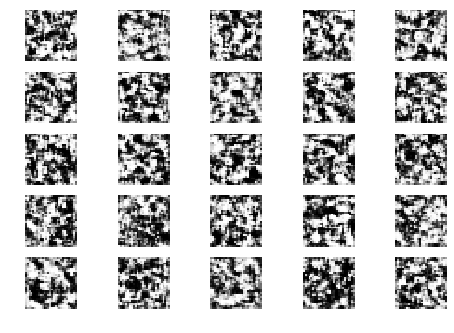

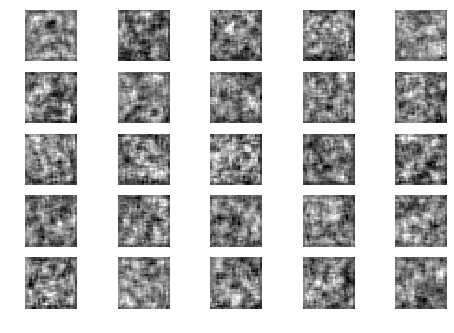

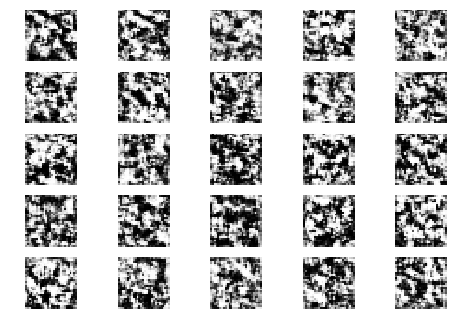

Epoch 0 Batch 1/937 [D loss: 0.717917, acc.: 59.38%] [G loss: 0.857802]
Epoch 0 Batch 2/937 [D loss: 0.566408, acc.: 65.62%] [G loss: 0.955144]
Epoch 0 Batch 3/937 [D loss: 0.429374, acc.: 90.62%] [G loss: 0.959200]
Epoch 0 Batch 4/937 [D loss: 0.333843, acc.: 87.50%] [G loss: 1.223668]
Epoch 0 Batch 5/937 [D loss: 0.320216, acc.: 87.50%] [G loss: 1.593640]
Epoch 0 Batch 6/937 [D loss: 0.353010, acc.: 84.38%] [G loss: 1.640763]
Epoch 0 Batch 7/937 [D loss: 0.309916, acc.: 87.50%] [G loss: 1.356693]
Epoch 0 Batch 8/937 [D loss: 0.247975, acc.: 93.75%] [G loss: 1.750229]
Epoch 0 Batch 9/937 [D loss: 0.292707, acc.: 93.75%] [G loss: 1.638495]
Epoch 0 Batch 10/937 [D loss: 0.268493, acc.: 90.62%] [G loss: 1.814229]
Epoch 0 Batch 11/937 [D loss: 0.317282, acc.: 90.62%] [G loss: 2.467428]
Epoch 0 Batch 12/937 [D loss: 0.199692, acc.: 100.00%] [G loss: 2.544739]
Epoch 0 Batch 13/937 [D loss: 0.208287, acc.: 96.88%] [G loss: 2.206393]
Epoch 0 Batch 14/937 [D loss: 0.208215, acc.: 93.75%] [G lo

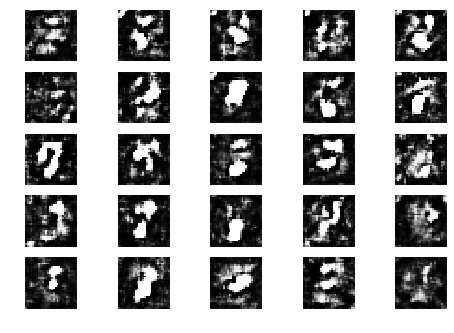

Epoch 0 Batch 101/937 [D loss: 0.241748, acc.: 96.88%] [G loss: 2.536438]


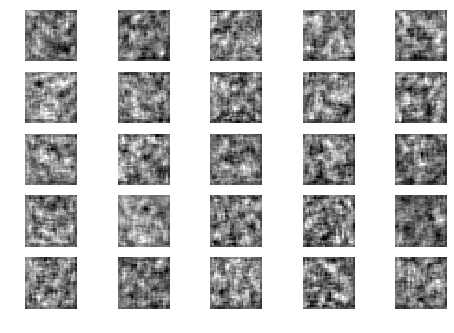

Epoch 0 Batch 102/937 [D loss: 0.604037, acc.: 75.00%] [G loss: 3.091870]


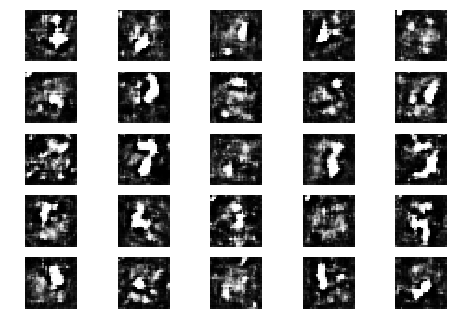

Epoch 0 Batch 103/937 [D loss: 0.989228, acc.: 53.12%] [G loss: 1.474313]
Epoch 0 Batch 104/937 [D loss: 0.432950, acc.: 81.25%] [G loss: 1.850070]
Epoch 0 Batch 105/937 [D loss: 0.830531, acc.: 53.12%] [G loss: 1.589738]
Epoch 0 Batch 106/937 [D loss: 0.658875, acc.: 56.25%] [G loss: 2.329552]
Epoch 0 Batch 107/937 [D loss: 1.091278, acc.: 50.00%] [G loss: 2.910707]
Epoch 0 Batch 108/937 [D loss: 0.930148, acc.: 46.88%] [G loss: 2.568333]
Epoch 0 Batch 109/937 [D loss: 0.966449, acc.: 62.50%] [G loss: 1.663787]
Epoch 0 Batch 110/937 [D loss: 0.710869, acc.: 59.38%] [G loss: 2.261981]
Epoch 0 Batch 111/937 [D loss: 0.698773, acc.: 59.38%] [G loss: 1.918843]
Epoch 0 Batch 112/937 [D loss: 0.973031, acc.: 37.50%] [G loss: 2.070769]
Epoch 0 Batch 113/937 [D loss: 1.111558, acc.: 46.88%] [G loss: 2.297901]
Epoch 0 Batch 114/937 [D loss: 0.845773, acc.: 59.38%] [G loss: 2.123463]
Epoch 0 Batch 115/937 [D loss: 0.882151, acc.: 46.88%] [G loss: 2.063196]
Epoch 0 Batch 116/937 [D loss: 0.66788

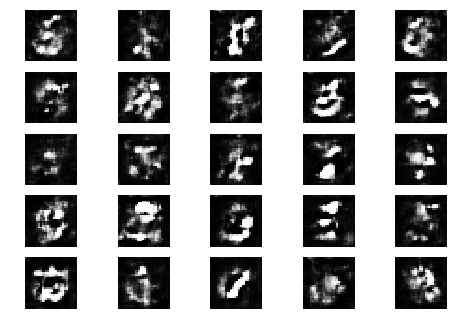

Epoch 0 Batch 201/937 [D loss: 0.641958, acc.: 65.62%] [G loss: 2.141520]
Epoch 0 Batch 202/937 [D loss: 0.940399, acc.: 40.62%] [G loss: 1.324081]


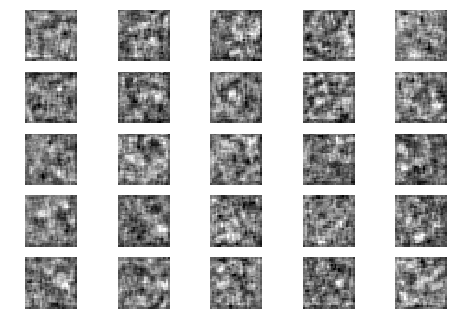

Epoch 0 Batch 203/937 [D loss: 0.623566, acc.: 62.50%] [G loss: 1.567357]
Epoch 0 Batch 204/937 [D loss: 0.647583, acc.: 59.38%] [G loss: 1.152057]


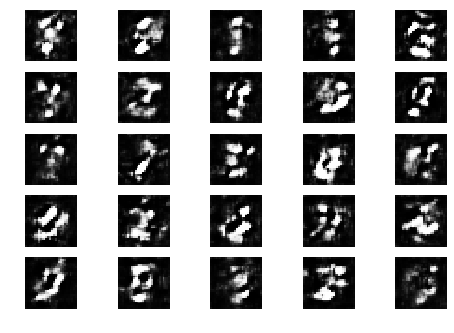

Epoch 0 Batch 205/937 [D loss: 0.796569, acc.: 50.00%] [G loss: 1.029434]
Epoch 0 Batch 206/937 [D loss: 0.781870, acc.: 56.25%] [G loss: 1.002878]
Epoch 0 Batch 207/937 [D loss: 0.655652, acc.: 62.50%] [G loss: 1.596263]
Epoch 0 Batch 208/937 [D loss: 0.508881, acc.: 81.25%] [G loss: 1.453580]
Epoch 0 Batch 209/937 [D loss: 0.620517, acc.: 78.12%] [G loss: 0.993221]
Epoch 0 Batch 210/937 [D loss: 0.730129, acc.: 56.25%] [G loss: 1.064132]
Epoch 0 Batch 211/937 [D loss: 0.670642, acc.: 65.62%] [G loss: 1.471864]
Epoch 0 Batch 212/937 [D loss: 0.616181, acc.: 68.75%] [G loss: 1.423963]
Epoch 0 Batch 213/937 [D loss: 0.977942, acc.: 40.62%] [G loss: 0.946339]
Epoch 0 Batch 214/937 [D loss: 0.943810, acc.: 46.88%] [G loss: 1.362212]
Epoch 0 Batch 215/937 [D loss: 0.644594, acc.: 68.75%] [G loss: 1.356345]
Epoch 0 Batch 216/937 [D loss: 0.895261, acc.: 59.38%] [G loss: 1.171860]
Epoch 0 Batch 217/937 [D loss: 0.766629, acc.: 56.25%] [G loss: 1.477807]
Epoch 0 Batch 218/937 [D loss: 0.77138

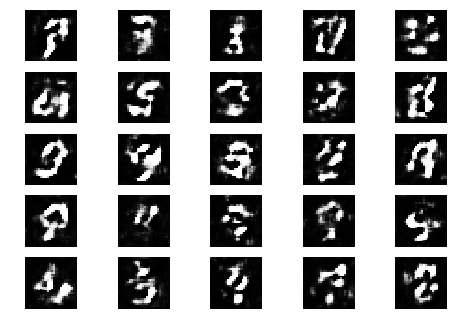

Epoch 0 Batch 301/937 [D loss: 0.673260, acc.: 59.38%] [G loss: 1.125242]
Epoch 0 Batch 302/937 [D loss: 0.582078, acc.: 65.62%] [G loss: 1.184020]
Epoch 0 Batch 303/937 [D loss: 0.697477, acc.: 59.38%] [G loss: 1.252039]


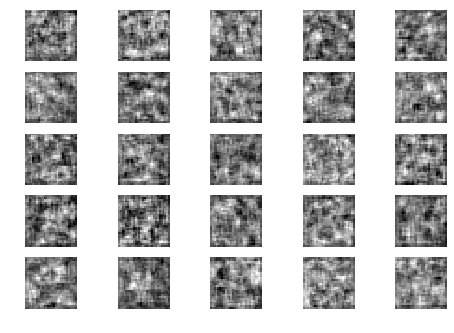

Epoch 0 Batch 304/937 [D loss: 0.777119, acc.: 65.62%] [G loss: 1.038800]
Epoch 0 Batch 305/937 [D loss: 0.958981, acc.: 28.12%] [G loss: 0.818899]
Epoch 0 Batch 306/937 [D loss: 0.694181, acc.: 50.00%] [G loss: 1.230941]


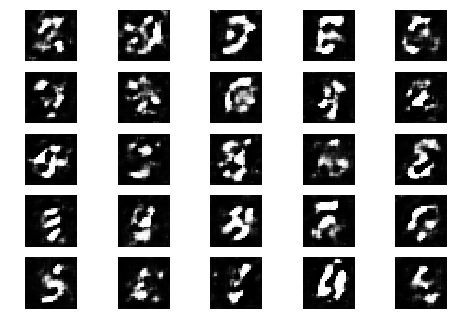

Epoch 0 Batch 307/937 [D loss: 0.478855, acc.: 84.38%] [G loss: 1.428913]
Epoch 0 Batch 308/937 [D loss: 0.763568, acc.: 62.50%] [G loss: 1.298948]
Epoch 0 Batch 309/937 [D loss: 0.535625, acc.: 71.88%] [G loss: 1.078139]
Epoch 0 Batch 310/937 [D loss: 0.494356, acc.: 78.12%] [G loss: 1.207109]
Epoch 0 Batch 311/937 [D loss: 0.699895, acc.: 62.50%] [G loss: 0.952336]
Epoch 0 Batch 312/937 [D loss: 0.618148, acc.: 59.38%] [G loss: 1.267148]
Epoch 0 Batch 313/937 [D loss: 0.799280, acc.: 56.25%] [G loss: 1.213845]
Epoch 0 Batch 314/937 [D loss: 0.994372, acc.: 37.50%] [G loss: 1.165975]
Epoch 0 Batch 315/937 [D loss: 0.544139, acc.: 71.88%] [G loss: 1.319037]
Epoch 0 Batch 316/937 [D loss: 0.988993, acc.: 31.25%] [G loss: 1.047378]
Epoch 0 Batch 317/937 [D loss: 0.577037, acc.: 75.00%] [G loss: 1.299551]
Epoch 0 Batch 318/937 [D loss: 0.852973, acc.: 50.00%] [G loss: 1.346695]
Epoch 0 Batch 319/937 [D loss: 0.715519, acc.: 65.62%] [G loss: 1.069781]
Epoch 0 Batch 320/937 [D loss: 0.79728

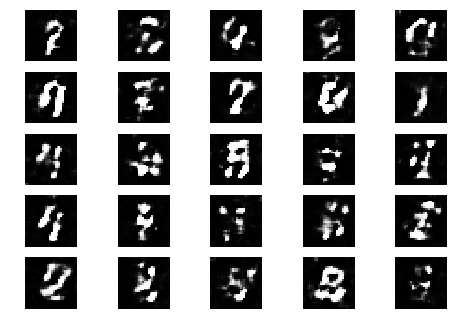

Epoch 0 Batch 401/937 [D loss: 0.837483, acc.: 43.75%] [G loss: 1.127592]
Epoch 0 Batch 402/937 [D loss: 0.743100, acc.: 56.25%] [G loss: 1.307730]
Epoch 0 Batch 403/937 [D loss: 0.692790, acc.: 62.50%] [G loss: 1.185777]
Epoch 0 Batch 404/937 [D loss: 0.680703, acc.: 46.88%] [G loss: 1.123399]


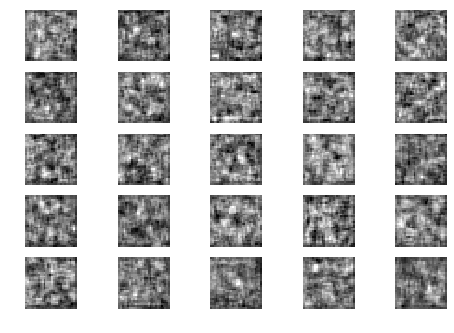

Epoch 0 Batch 405/937 [D loss: 0.686374, acc.: 62.50%] [G loss: 1.150972]
Epoch 0 Batch 406/937 [D loss: 0.675257, acc.: 56.25%] [G loss: 0.939743]
Epoch 0 Batch 407/937 [D loss: 0.773198, acc.: 50.00%] [G loss: 1.054261]
Epoch 0 Batch 408/937 [D loss: 0.860605, acc.: 50.00%] [G loss: 1.237224]


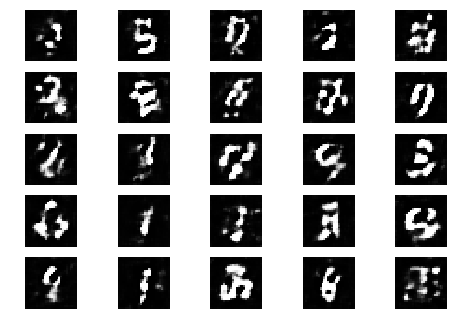

Epoch 0 Batch 409/937 [D loss: 0.660404, acc.: 59.38%] [G loss: 1.092700]
Epoch 0 Batch 410/937 [D loss: 0.703050, acc.: 59.38%] [G loss: 0.920515]
Epoch 0 Batch 411/937 [D loss: 0.690121, acc.: 62.50%] [G loss: 1.080954]
Epoch 0 Batch 412/937 [D loss: 0.776714, acc.: 53.12%] [G loss: 1.213158]
Epoch 0 Batch 413/937 [D loss: 0.753213, acc.: 62.50%] [G loss: 1.022811]
Epoch 0 Batch 414/937 [D loss: 0.844226, acc.: 46.88%] [G loss: 1.195208]
Epoch 0 Batch 415/937 [D loss: 0.721994, acc.: 59.38%] [G loss: 0.946614]
Epoch 0 Batch 416/937 [D loss: 0.549611, acc.: 75.00%] [G loss: 0.878662]
Epoch 0 Batch 417/937 [D loss: 0.697645, acc.: 65.62%] [G loss: 1.080048]
Epoch 0 Batch 418/937 [D loss: 0.713410, acc.: 53.12%] [G loss: 1.280817]
Epoch 0 Batch 419/937 [D loss: 0.655729, acc.: 59.38%] [G loss: 1.564845]
Epoch 0 Batch 420/937 [D loss: 0.644584, acc.: 50.00%] [G loss: 1.276030]
Epoch 0 Batch 421/937 [D loss: 0.702380, acc.: 59.38%] [G loss: 1.180349]
Epoch 0 Batch 422/937 [D loss: 0.71471

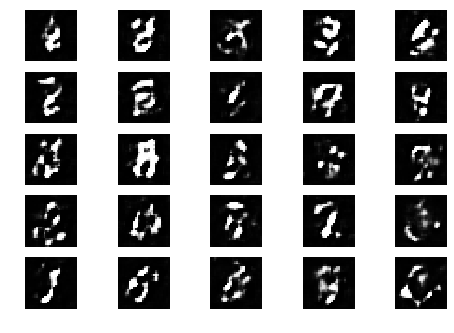

Epoch 0 Batch 501/937 [D loss: 0.643351, acc.: 62.50%] [G loss: 1.234205]
Epoch 0 Batch 502/937 [D loss: 0.848165, acc.: 50.00%] [G loss: 1.034869]
Epoch 0 Batch 503/937 [D loss: 0.663422, acc.: 62.50%] [G loss: 0.900417]
Epoch 0 Batch 504/937 [D loss: 0.678158, acc.: 56.25%] [G loss: 1.115513]
Epoch 0 Batch 505/937 [D loss: 0.680984, acc.: 62.50%] [G loss: 1.315134]


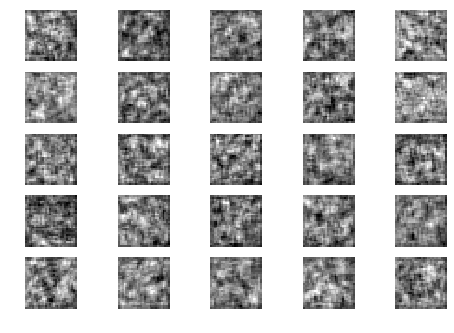

Epoch 0 Batch 506/937 [D loss: 0.721234, acc.: 62.50%] [G loss: 1.368032]
Epoch 0 Batch 507/937 [D loss: 0.559082, acc.: 75.00%] [G loss: 1.155643]
Epoch 0 Batch 508/937 [D loss: 0.728621, acc.: 53.12%] [G loss: 1.403739]
Epoch 0 Batch 509/937 [D loss: 0.698377, acc.: 62.50%] [G loss: 1.405504]
Epoch 0 Batch 510/937 [D loss: 0.597243, acc.: 75.00%] [G loss: 1.149258]


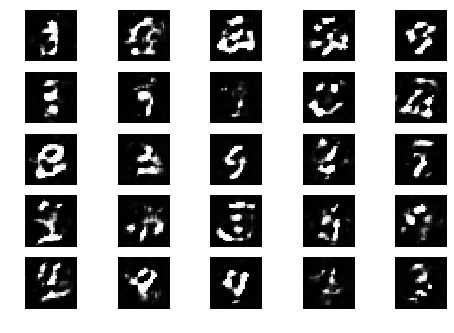

Epoch 0 Batch 511/937 [D loss: 0.489195, acc.: 68.75%] [G loss: 1.265476]
Epoch 0 Batch 512/937 [D loss: 0.746585, acc.: 53.12%] [G loss: 1.219224]
Epoch 0 Batch 513/937 [D loss: 0.588242, acc.: 62.50%] [G loss: 1.241467]
Epoch 0 Batch 514/937 [D loss: 0.745363, acc.: 65.62%] [G loss: 1.235147]
Epoch 0 Batch 515/937 [D loss: 0.844179, acc.: 43.75%] [G loss: 1.187301]
Epoch 0 Batch 516/937 [D loss: 0.596250, acc.: 71.88%] [G loss: 1.513631]
Epoch 0 Batch 517/937 [D loss: 0.513142, acc.: 75.00%] [G loss: 1.449870]
Epoch 0 Batch 518/937 [D loss: 0.744948, acc.: 53.12%] [G loss: 1.168783]
Epoch 0 Batch 519/937 [D loss: 0.865027, acc.: 46.88%] [G loss: 1.020419]
Epoch 0 Batch 520/937 [D loss: 0.588730, acc.: 68.75%] [G loss: 1.148972]
Epoch 0 Batch 521/937 [D loss: 0.609167, acc.: 78.12%] [G loss: 1.127967]
Epoch 0 Batch 522/937 [D loss: 0.673608, acc.: 68.75%] [G loss: 1.150004]
Epoch 0 Batch 523/937 [D loss: 0.621042, acc.: 68.75%] [G loss: 1.410097]
Epoch 0 Batch 524/937 [D loss: 0.82955

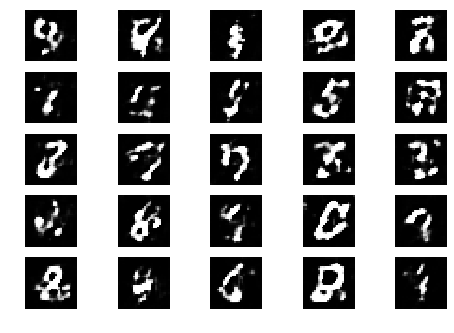

Epoch 0 Batch 601/937 [D loss: 0.660882, acc.: 59.38%] [G loss: 1.042771]
Epoch 0 Batch 602/937 [D loss: 0.630769, acc.: 75.00%] [G loss: 1.245159]
Epoch 0 Batch 603/937 [D loss: 0.744005, acc.: 53.12%] [G loss: 1.231001]
Epoch 0 Batch 604/937 [D loss: 0.601222, acc.: 68.75%] [G loss: 1.080338]
Epoch 0 Batch 605/937 [D loss: 0.721871, acc.: 65.62%] [G loss: 1.033492]
Epoch 0 Batch 606/937 [D loss: 0.678218, acc.: 65.62%] [G loss: 1.073508]


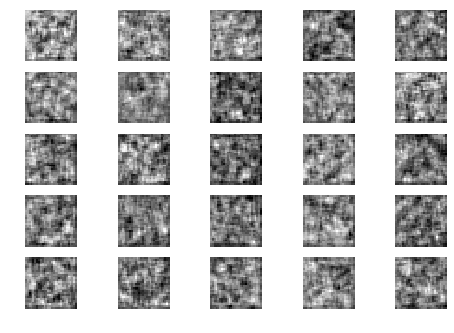

Epoch 0 Batch 607/937 [D loss: 0.644894, acc.: 65.62%] [G loss: 1.142464]
Epoch 0 Batch 608/937 [D loss: 0.603079, acc.: 68.75%] [G loss: 1.244580]
Epoch 0 Batch 609/937 [D loss: 0.478309, acc.: 71.88%] [G loss: 1.314692]
Epoch 0 Batch 610/937 [D loss: 0.879111, acc.: 56.25%] [G loss: 1.118921]
Epoch 0 Batch 611/937 [D loss: 0.692936, acc.: 59.38%] [G loss: 0.919108]
Epoch 0 Batch 612/937 [D loss: 0.628975, acc.: 65.62%] [G loss: 1.049824]


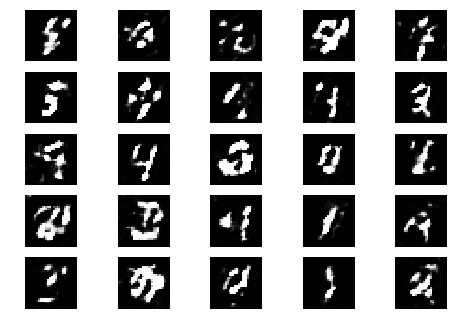

Epoch 0 Batch 613/937 [D loss: 0.782426, acc.: 50.00%] [G loss: 1.161035]
Epoch 0 Batch 614/937 [D loss: 0.564223, acc.: 65.62%] [G loss: 1.459675]
Epoch 0 Batch 615/937 [D loss: 0.783037, acc.: 59.38%] [G loss: 1.454309]
Epoch 0 Batch 616/937 [D loss: 0.688659, acc.: 59.38%] [G loss: 1.252362]
Epoch 0 Batch 617/937 [D loss: 0.686788, acc.: 59.38%] [G loss: 1.662122]
Epoch 0 Batch 618/937 [D loss: 0.767742, acc.: 53.12%] [G loss: 1.150862]
Epoch 0 Batch 619/937 [D loss: 0.592948, acc.: 59.38%] [G loss: 1.388809]
Epoch 0 Batch 620/937 [D loss: 0.778600, acc.: 59.38%] [G loss: 1.088602]
Epoch 0 Batch 621/937 [D loss: 0.734157, acc.: 53.12%] [G loss: 1.316443]
Epoch 0 Batch 622/937 [D loss: 0.869867, acc.: 43.75%] [G loss: 1.016216]
Epoch 0 Batch 623/937 [D loss: 0.683879, acc.: 62.50%] [G loss: 0.928267]
Epoch 0 Batch 624/937 [D loss: 0.672092, acc.: 68.75%] [G loss: 0.915714]
Epoch 0 Batch 625/937 [D loss: 0.543862, acc.: 81.25%] [G loss: 1.463578]
Epoch 0 Batch 626/937 [D loss: 0.81957

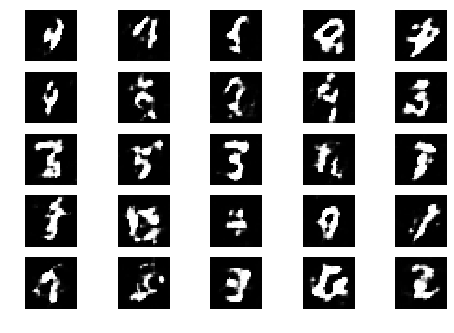

Epoch 0 Batch 701/937 [D loss: 0.792712, acc.: 46.88%] [G loss: 1.401651]
Epoch 0 Batch 702/937 [D loss: 0.701346, acc.: 56.25%] [G loss: 1.089333]
Epoch 0 Batch 703/937 [D loss: 0.633825, acc.: 62.50%] [G loss: 1.172261]
Epoch 0 Batch 704/937 [D loss: 0.527247, acc.: 78.12%] [G loss: 1.329849]
Epoch 0 Batch 705/937 [D loss: 0.745728, acc.: 50.00%] [G loss: 1.159953]
Epoch 0 Batch 706/937 [D loss: 0.652246, acc.: 53.12%] [G loss: 1.254387]
Epoch 0 Batch 707/937 [D loss: 0.693987, acc.: 68.75%] [G loss: 1.148178]


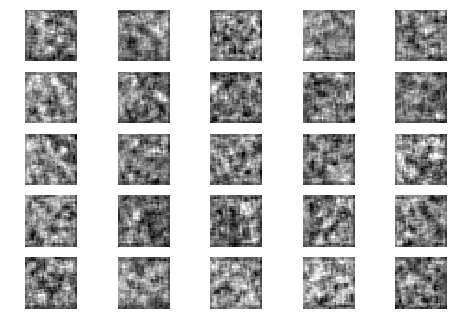

Epoch 0 Batch 708/937 [D loss: 0.648947, acc.: 59.38%] [G loss: 1.161678]
Epoch 0 Batch 709/937 [D loss: 0.663647, acc.: 65.62%] [G loss: 1.199699]
Epoch 0 Batch 710/937 [D loss: 0.861252, acc.: 53.12%] [G loss: 1.260313]
Epoch 0 Batch 711/937 [D loss: 0.514271, acc.: 71.88%] [G loss: 1.117824]
Epoch 0 Batch 712/937 [D loss: 0.794499, acc.: 56.25%] [G loss: 1.187964]
Epoch 0 Batch 713/937 [D loss: 0.750093, acc.: 40.62%] [G loss: 1.271605]
Epoch 0 Batch 714/937 [D loss: 0.840485, acc.: 53.12%] [G loss: 1.029069]


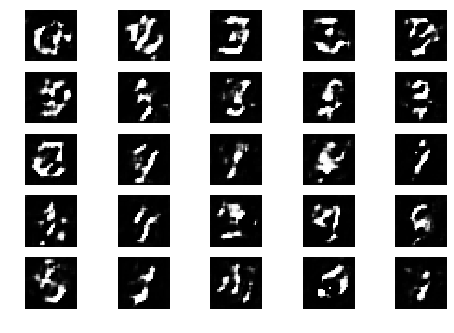

Epoch 0 Batch 715/937 [D loss: 0.475251, acc.: 78.12%] [G loss: 1.020190]
Epoch 0 Batch 716/937 [D loss: 0.786180, acc.: 43.75%] [G loss: 1.073074]
Epoch 0 Batch 717/937 [D loss: 0.527396, acc.: 71.88%] [G loss: 1.349954]
Epoch 0 Batch 718/937 [D loss: 0.555769, acc.: 68.75%] [G loss: 1.169010]
Epoch 0 Batch 719/937 [D loss: 0.822055, acc.: 53.12%] [G loss: 1.094175]
Epoch 0 Batch 720/937 [D loss: 0.609504, acc.: 65.62%] [G loss: 1.048117]
Epoch 0 Batch 721/937 [D loss: 0.812273, acc.: 37.50%] [G loss: 1.072694]
Epoch 0 Batch 722/937 [D loss: 0.558725, acc.: 65.62%] [G loss: 1.319370]
Epoch 0 Batch 723/937 [D loss: 0.582085, acc.: 68.75%] [G loss: 1.134957]
Epoch 0 Batch 724/937 [D loss: 0.626513, acc.: 68.75%] [G loss: 1.093023]
Epoch 0 Batch 725/937 [D loss: 0.563122, acc.: 68.75%] [G loss: 1.247655]
Epoch 0 Batch 726/937 [D loss: 0.681629, acc.: 56.25%] [G loss: 1.439258]
Epoch 0 Batch 727/937 [D loss: 0.583010, acc.: 65.62%] [G loss: 1.352726]
Epoch 0 Batch 728/937 [D loss: 0.41858

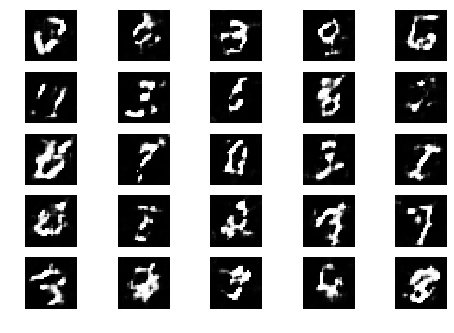

Epoch 0 Batch 801/937 [D loss: 0.726788, acc.: 53.12%] [G loss: 1.198617]
Epoch 0 Batch 802/937 [D loss: 0.712076, acc.: 62.50%] [G loss: 0.912466]
Epoch 0 Batch 803/937 [D loss: 0.796770, acc.: 56.25%] [G loss: 1.103738]
Epoch 0 Batch 804/937 [D loss: 0.572808, acc.: 71.88%] [G loss: 0.918764]
Epoch 0 Batch 805/937 [D loss: 0.754210, acc.: 59.38%] [G loss: 1.048350]
Epoch 0 Batch 806/937 [D loss: 0.461759, acc.: 78.12%] [G loss: 1.307778]
Epoch 0 Batch 807/937 [D loss: 0.839515, acc.: 50.00%] [G loss: 1.294524]
Epoch 0 Batch 808/937 [D loss: 0.681251, acc.: 65.62%] [G loss: 1.452087]


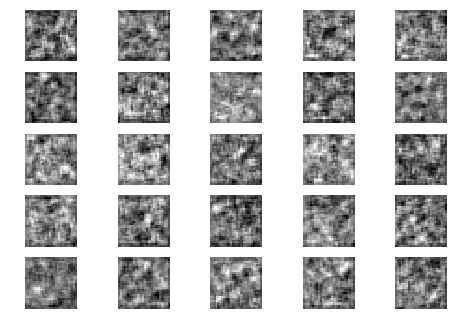

Epoch 0 Batch 809/937 [D loss: 0.509448, acc.: 75.00%] [G loss: 1.388819]
Epoch 0 Batch 810/937 [D loss: 0.732982, acc.: 56.25%] [G loss: 1.157077]
Epoch 0 Batch 811/937 [D loss: 0.759256, acc.: 40.62%] [G loss: 1.220527]
Epoch 0 Batch 812/937 [D loss: 0.499744, acc.: 81.25%] [G loss: 1.376104]
Epoch 0 Batch 813/937 [D loss: 0.677373, acc.: 62.50%] [G loss: 1.131247]
Epoch 0 Batch 814/937 [D loss: 0.713975, acc.: 53.12%] [G loss: 1.059650]
Epoch 0 Batch 815/937 [D loss: 0.529028, acc.: 75.00%] [G loss: 1.175939]
Epoch 0 Batch 816/937 [D loss: 0.462163, acc.: 78.12%] [G loss: 1.286937]


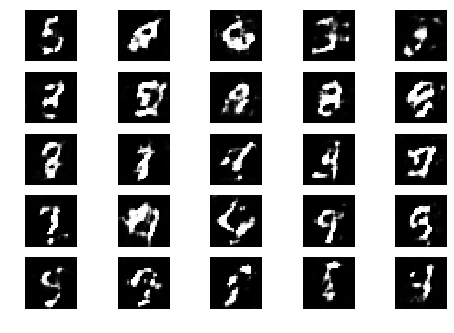

Epoch 0 Batch 817/937 [D loss: 0.848230, acc.: 59.38%] [G loss: 1.084842]
Epoch 0 Batch 818/937 [D loss: 0.730393, acc.: 59.38%] [G loss: 1.231082]
Epoch 0 Batch 819/937 [D loss: 0.866661, acc.: 43.75%] [G loss: 1.205453]
Epoch 0 Batch 820/937 [D loss: 0.644676, acc.: 68.75%] [G loss: 1.379601]
Epoch 0 Batch 821/937 [D loss: 0.600199, acc.: 75.00%] [G loss: 1.197891]
Epoch 0 Batch 822/937 [D loss: 0.548420, acc.: 81.25%] [G loss: 1.085983]
Epoch 0 Batch 823/937 [D loss: 0.639142, acc.: 65.62%] [G loss: 0.971456]
Epoch 0 Batch 824/937 [D loss: 0.516589, acc.: 71.88%] [G loss: 0.977949]
Epoch 0 Batch 825/937 [D loss: 0.624717, acc.: 62.50%] [G loss: 1.262803]
Epoch 0 Batch 826/937 [D loss: 0.753799, acc.: 50.00%] [G loss: 1.260209]
Epoch 0 Batch 827/937 [D loss: 1.018096, acc.: 31.25%] [G loss: 1.120126]
Epoch 0 Batch 828/937 [D loss: 0.622244, acc.: 59.38%] [G loss: 1.032851]
Epoch 0 Batch 829/937 [D loss: 0.610898, acc.: 65.62%] [G loss: 1.262686]
Epoch 0 Batch 830/937 [D loss: 0.59294

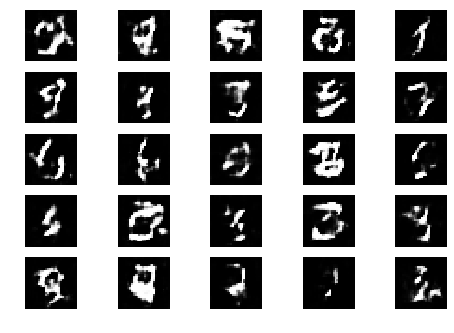

Epoch 0 Batch 901/937 [D loss: 0.940764, acc.: 37.50%] [G loss: 1.414882]
Epoch 0 Batch 902/937 [D loss: 0.741605, acc.: 46.88%] [G loss: 1.121315]
Epoch 0 Batch 903/937 [D loss: 0.709393, acc.: 59.38%] [G loss: 1.277600]
Epoch 0 Batch 904/937 [D loss: 0.808503, acc.: 37.50%] [G loss: 1.066556]
Epoch 0 Batch 905/937 [D loss: 0.568670, acc.: 68.75%] [G loss: 1.240233]
Epoch 0 Batch 906/937 [D loss: 0.769412, acc.: 50.00%] [G loss: 1.204823]
Epoch 0 Batch 907/937 [D loss: 0.706458, acc.: 59.38%] [G loss: 1.442525]
Epoch 0 Batch 908/937 [D loss: 0.592810, acc.: 68.75%] [G loss: 1.357787]
Epoch 0 Batch 909/937 [D loss: 0.608589, acc.: 68.75%] [G loss: 1.292345]


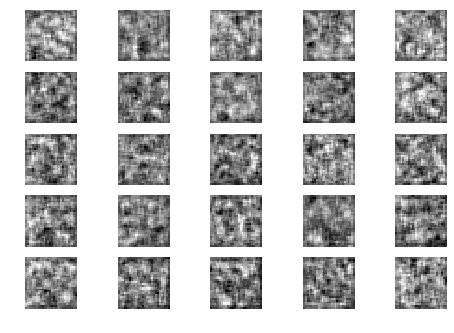

Epoch 0 Batch 910/937 [D loss: 0.697307, acc.: 62.50%] [G loss: 1.229372]
Epoch 0 Batch 911/937 [D loss: 0.657792, acc.: 56.25%] [G loss: 1.455763]
Epoch 0 Batch 912/937 [D loss: 0.616832, acc.: 65.62%] [G loss: 1.283802]
Epoch 0 Batch 913/937 [D loss: 0.600710, acc.: 78.12%] [G loss: 1.186865]
Epoch 0 Batch 914/937 [D loss: 0.682705, acc.: 62.50%] [G loss: 1.372267]
Epoch 0 Batch 915/937 [D loss: 0.876255, acc.: 21.88%] [G loss: 1.097638]
Epoch 0 Batch 916/937 [D loss: 0.645899, acc.: 71.88%] [G loss: 1.258965]
Epoch 0 Batch 917/937 [D loss: 0.788171, acc.: 46.88%] [G loss: 0.831453]
Epoch 0 Batch 918/937 [D loss: 0.708607, acc.: 56.25%] [G loss: 1.060359]


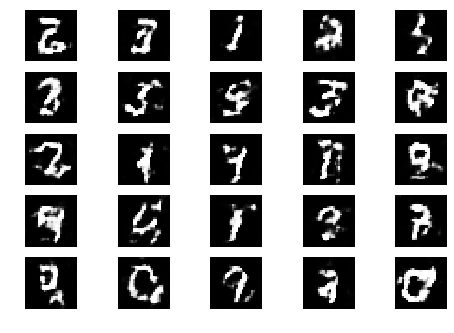

Epoch 0 Batch 919/937 [D loss: 0.813916, acc.: 53.12%] [G loss: 1.394648]
Epoch 0 Batch 920/937 [D loss: 0.651151, acc.: 56.25%] [G loss: 1.540149]
Epoch 0 Batch 921/937 [D loss: 0.726973, acc.: 46.88%] [G loss: 1.258833]
Epoch 0 Batch 922/937 [D loss: 0.626311, acc.: 65.62%] [G loss: 1.136578]
Epoch 0 Batch 923/937 [D loss: 0.587291, acc.: 65.62%] [G loss: 1.234652]
Epoch 0 Batch 924/937 [D loss: 0.595480, acc.: 65.62%] [G loss: 1.152947]
Epoch 0 Batch 925/937 [D loss: 0.749628, acc.: 46.88%] [G loss: 1.272943]
Epoch 0 Batch 926/937 [D loss: 0.505291, acc.: 81.25%] [G loss: 1.160258]
Epoch 0 Batch 927/937 [D loss: 0.699461, acc.: 59.38%] [G loss: 1.236609]
Epoch 0 Batch 928/937 [D loss: 0.713593, acc.: 62.50%] [G loss: 0.982192]
Epoch 0 Batch 929/937 [D loss: 0.550087, acc.: 68.75%] [G loss: 1.125268]
Epoch 0 Batch 930/937 [D loss: 0.620553, acc.: 62.50%] [G loss: 1.035137]
Epoch 0 Batch 931/937 [D loss: 0.681862, acc.: 65.62%] [G loss: 1.085660]
Epoch 0 Batch 932/937 [D loss: 0.68768

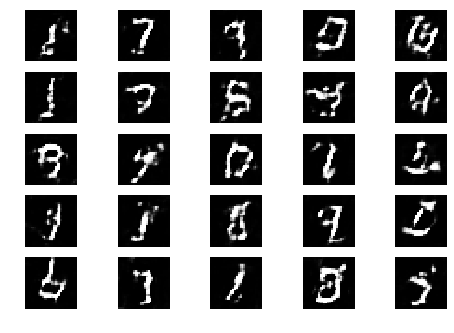

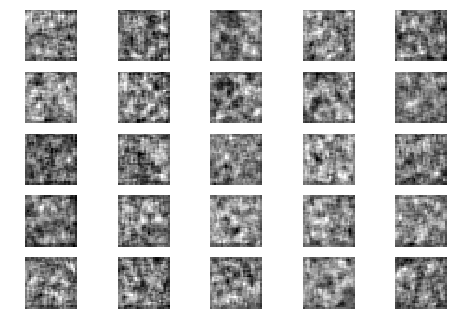

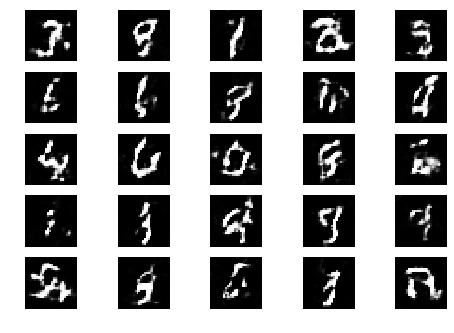

Epoch 1 Batch 1/937 [D loss: 0.663636, acc.: 65.62%] [G loss: 1.027160]
Epoch 1 Batch 2/937 [D loss: 0.578046, acc.: 78.12%] [G loss: 0.958863]
Epoch 1 Batch 3/937 [D loss: 0.551998, acc.: 65.62%] [G loss: 1.243788]
Epoch 1 Batch 4/937 [D loss: 0.747432, acc.: 56.25%] [G loss: 0.964048]
Epoch 1 Batch 5/937 [D loss: 0.733166, acc.: 68.75%] [G loss: 1.210316]
Epoch 1 Batch 6/937 [D loss: 0.653476, acc.: 59.38%] [G loss: 1.201104]
Epoch 1 Batch 7/937 [D loss: 0.649899, acc.: 68.75%] [G loss: 1.362894]
Epoch 1 Batch 8/937 [D loss: 0.538183, acc.: 75.00%] [G loss: 1.386901]
Epoch 1 Batch 9/937 [D loss: 0.735140, acc.: 53.12%] [G loss: 1.459632]
Epoch 1 Batch 10/937 [D loss: 0.723281, acc.: 62.50%] [G loss: 1.298733]
Epoch 1 Batch 11/937 [D loss: 0.916718, acc.: 28.12%] [G loss: 1.255087]
Epoch 1 Batch 12/937 [D loss: 0.627254, acc.: 71.88%] [G loss: 1.264534]
Epoch 1 Batch 13/937 [D loss: 0.695636, acc.: 59.38%] [G loss: 1.136116]
Epoch 1 Batch 14/937 [D loss: 0.672590, acc.: 56.25%] [G los

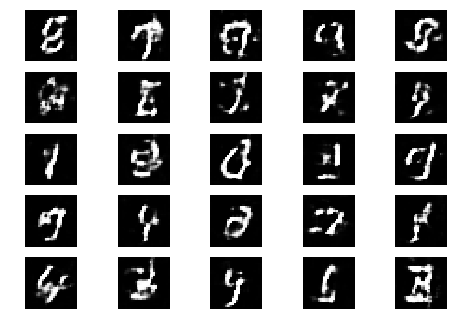

Epoch 1 Batch 101/937 [D loss: 0.699392, acc.: 53.12%] [G loss: 1.250946]


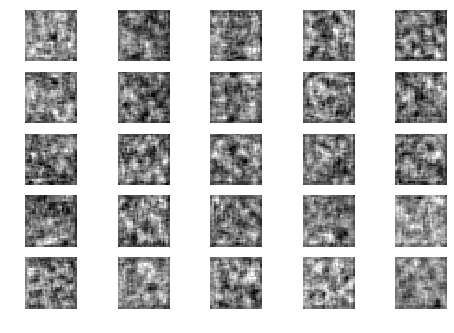

Epoch 1 Batch 102/937 [D loss: 0.597245, acc.: 65.62%] [G loss: 1.055445]


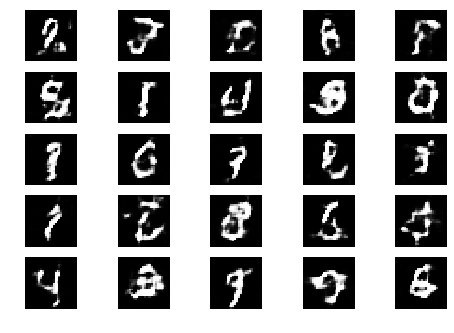

Epoch 1 Batch 103/937 [D loss: 0.846854, acc.: 53.12%] [G loss: 1.415170]
Epoch 1 Batch 104/937 [D loss: 0.617900, acc.: 68.75%] [G loss: 1.329957]
Epoch 1 Batch 105/937 [D loss: 0.671094, acc.: 59.38%] [G loss: 1.073241]
Epoch 1 Batch 106/937 [D loss: 0.618493, acc.: 65.62%] [G loss: 1.141170]
Epoch 1 Batch 107/937 [D loss: 0.660268, acc.: 59.38%] [G loss: 1.256274]
Epoch 1 Batch 108/937 [D loss: 0.739786, acc.: 46.88%] [G loss: 1.126794]
Epoch 1 Batch 109/937 [D loss: 0.775280, acc.: 62.50%] [G loss: 1.053774]
Epoch 1 Batch 110/937 [D loss: 0.746652, acc.: 59.38%] [G loss: 1.033184]
Epoch 1 Batch 111/937 [D loss: 0.942015, acc.: 37.50%] [G loss: 0.973631]
Epoch 1 Batch 112/937 [D loss: 0.812443, acc.: 59.38%] [G loss: 1.137806]
Epoch 1 Batch 113/937 [D loss: 0.757506, acc.: 59.38%] [G loss: 1.307974]
Epoch 1 Batch 114/937 [D loss: 0.601169, acc.: 65.62%] [G loss: 1.132030]
Epoch 1 Batch 115/937 [D loss: 0.875862, acc.: 43.75%] [G loss: 1.059064]
Epoch 1 Batch 116/937 [D loss: 0.58392

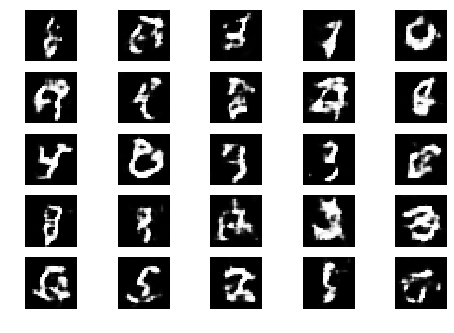

Epoch 1 Batch 201/937 [D loss: 0.639146, acc.: 75.00%] [G loss: 1.054742]
Epoch 1 Batch 202/937 [D loss: 0.793650, acc.: 43.75%] [G loss: 1.052988]


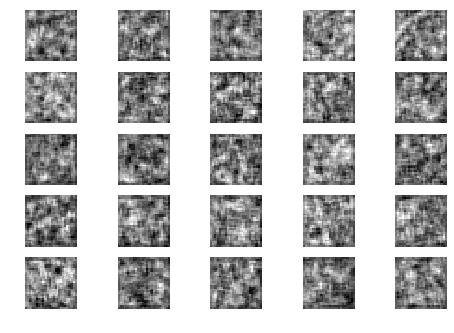

Epoch 1 Batch 203/937 [D loss: 0.536904, acc.: 68.75%] [G loss: 0.969001]
Epoch 1 Batch 204/937 [D loss: 0.450013, acc.: 90.62%] [G loss: 1.062575]


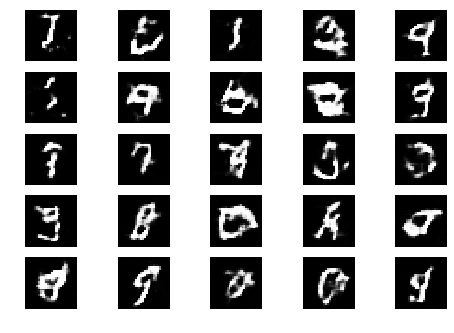

Epoch 1 Batch 205/937 [D loss: 0.666873, acc.: 56.25%] [G loss: 0.998353]
Epoch 1 Batch 206/937 [D loss: 0.569414, acc.: 71.88%] [G loss: 1.261522]
Epoch 1 Batch 207/937 [D loss: 0.601244, acc.: 78.12%] [G loss: 1.172299]
Epoch 1 Batch 208/937 [D loss: 0.884358, acc.: 43.75%] [G loss: 1.173066]
Epoch 1 Batch 209/937 [D loss: 0.621684, acc.: 65.62%] [G loss: 1.264875]
Epoch 1 Batch 210/937 [D loss: 0.570244, acc.: 62.50%] [G loss: 1.083985]
Epoch 1 Batch 211/937 [D loss: 0.610654, acc.: 65.62%] [G loss: 1.005164]
Epoch 1 Batch 212/937 [D loss: 0.761335, acc.: 46.88%] [G loss: 0.859911]
Epoch 1 Batch 213/937 [D loss: 0.768509, acc.: 46.88%] [G loss: 0.998389]
Epoch 1 Batch 214/937 [D loss: 0.760464, acc.: 59.38%] [G loss: 0.884856]
Epoch 1 Batch 215/937 [D loss: 0.652176, acc.: 59.38%] [G loss: 0.918095]
Epoch 1 Batch 216/937 [D loss: 0.660455, acc.: 62.50%] [G loss: 0.980416]
Epoch 1 Batch 217/937 [D loss: 0.835217, acc.: 43.75%] [G loss: 1.109428]
Epoch 1 Batch 218/937 [D loss: 0.61325

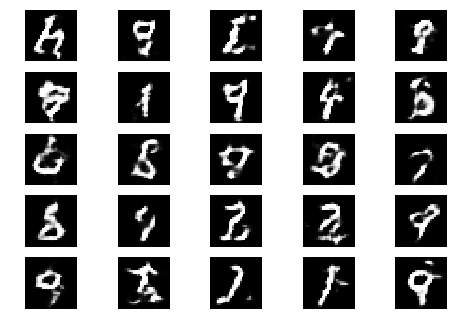

Epoch 1 Batch 301/937 [D loss: 0.650282, acc.: 50.00%] [G loss: 1.216781]
Epoch 1 Batch 302/937 [D loss: 0.692984, acc.: 53.12%] [G loss: 1.300430]
Epoch 1 Batch 303/937 [D loss: 0.756255, acc.: 56.25%] [G loss: 1.101356]


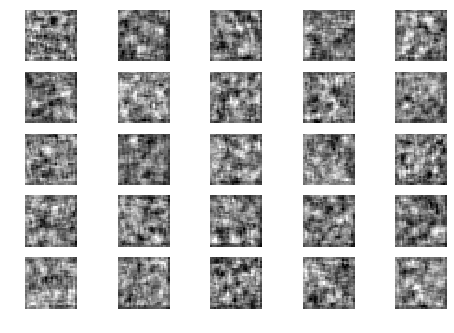

Epoch 1 Batch 304/937 [D loss: 0.666068, acc.: 62.50%] [G loss: 1.263554]
Epoch 1 Batch 305/937 [D loss: 0.566480, acc.: 71.88%] [G loss: 1.301813]
Epoch 1 Batch 306/937 [D loss: 0.671766, acc.: 50.00%] [G loss: 1.348526]


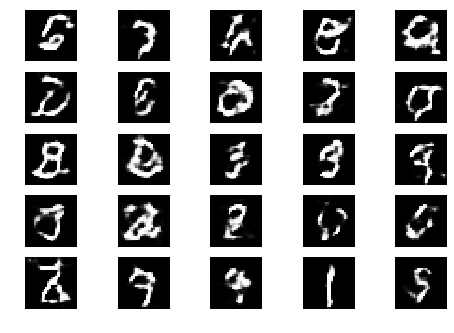

Epoch 1 Batch 307/937 [D loss: 0.749000, acc.: 59.38%] [G loss: 1.023844]
Epoch 1 Batch 308/937 [D loss: 0.665642, acc.: 59.38%] [G loss: 1.232072]
Epoch 1 Batch 309/937 [D loss: 0.677381, acc.: 62.50%] [G loss: 1.217047]
Epoch 1 Batch 310/937 [D loss: 0.681975, acc.: 62.50%] [G loss: 1.219827]
Epoch 1 Batch 311/937 [D loss: 0.666080, acc.: 65.62%] [G loss: 0.967308]
Epoch 1 Batch 312/937 [D loss: 0.613153, acc.: 68.75%] [G loss: 1.069415]
Epoch 1 Batch 313/937 [D loss: 0.665705, acc.: 59.38%] [G loss: 1.016333]
Epoch 1 Batch 314/937 [D loss: 0.766450, acc.: 62.50%] [G loss: 1.141570]
Epoch 1 Batch 315/937 [D loss: 0.679436, acc.: 62.50%] [G loss: 1.020005]
Epoch 1 Batch 316/937 [D loss: 0.832112, acc.: 46.88%] [G loss: 1.154915]
Epoch 1 Batch 317/937 [D loss: 0.707051, acc.: 56.25%] [G loss: 1.028206]
Epoch 1 Batch 318/937 [D loss: 0.843599, acc.: 43.75%] [G loss: 0.847829]
Epoch 1 Batch 319/937 [D loss: 0.623335, acc.: 62.50%] [G loss: 1.200318]
Epoch 1 Batch 320/937 [D loss: 0.83432

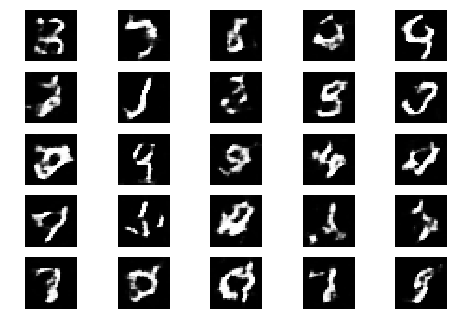

Epoch 1 Batch 401/937 [D loss: 0.710869, acc.: 53.12%] [G loss: 0.940802]
Epoch 1 Batch 402/937 [D loss: 0.657823, acc.: 56.25%] [G loss: 1.141786]
Epoch 1 Batch 403/937 [D loss: 0.578216, acc.: 68.75%] [G loss: 1.170644]
Epoch 1 Batch 404/937 [D loss: 0.631939, acc.: 62.50%] [G loss: 0.924255]


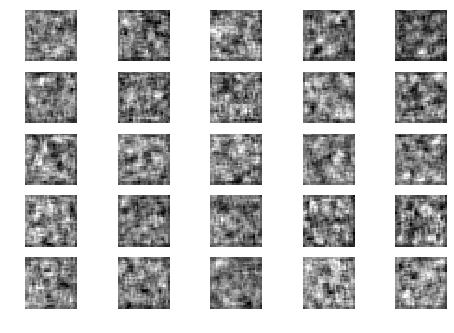

Epoch 1 Batch 405/937 [D loss: 0.709297, acc.: 50.00%] [G loss: 1.068165]
Epoch 1 Batch 406/937 [D loss: 0.737150, acc.: 50.00%] [G loss: 1.078311]
Epoch 1 Batch 407/937 [D loss: 0.755524, acc.: 46.88%] [G loss: 1.045475]
Epoch 1 Batch 408/937 [D loss: 0.759807, acc.: 53.12%] [G loss: 1.171230]


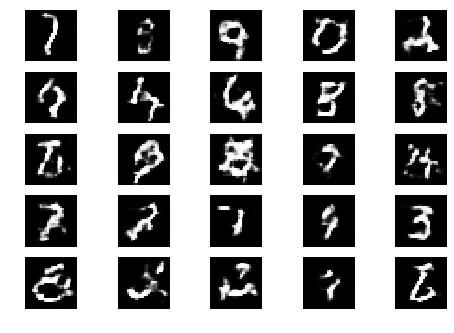

Epoch 1 Batch 409/937 [D loss: 0.807575, acc.: 50.00%] [G loss: 1.064349]
Epoch 1 Batch 410/937 [D loss: 0.768230, acc.: 46.88%] [G loss: 0.796779]
Epoch 1 Batch 411/937 [D loss: 0.708521, acc.: 56.25%] [G loss: 1.050584]
Epoch 1 Batch 412/937 [D loss: 0.594055, acc.: 65.62%] [G loss: 0.909179]
Epoch 1 Batch 413/937 [D loss: 0.685872, acc.: 56.25%] [G loss: 0.966473]
Epoch 1 Batch 414/937 [D loss: 0.650656, acc.: 65.62%] [G loss: 1.117287]
Epoch 1 Batch 415/937 [D loss: 0.740702, acc.: 56.25%] [G loss: 0.887803]
Epoch 1 Batch 416/937 [D loss: 0.593523, acc.: 71.88%] [G loss: 0.963409]
Epoch 1 Batch 417/937 [D loss: 0.752730, acc.: 37.50%] [G loss: 0.712831]
Epoch 1 Batch 418/937 [D loss: 0.725599, acc.: 53.12%] [G loss: 1.013682]
Epoch 1 Batch 419/937 [D loss: 0.686916, acc.: 56.25%] [G loss: 1.087729]
Epoch 1 Batch 420/937 [D loss: 0.627545, acc.: 59.38%] [G loss: 0.877992]
Epoch 1 Batch 421/937 [D loss: 0.720916, acc.: 43.75%] [G loss: 0.828987]
Epoch 1 Batch 422/937 [D loss: 0.78038

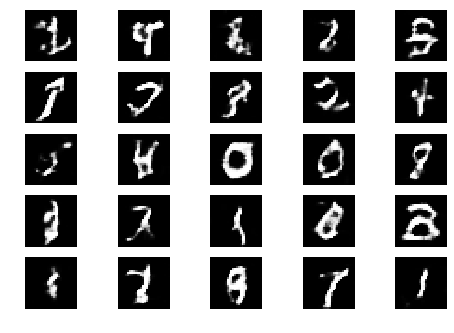

Epoch 1 Batch 501/937 [D loss: 0.697644, acc.: 62.50%] [G loss: 1.176419]
Epoch 1 Batch 502/937 [D loss: 0.637738, acc.: 62.50%] [G loss: 0.975486]
Epoch 1 Batch 503/937 [D loss: 0.682237, acc.: 62.50%] [G loss: 1.029305]
Epoch 1 Batch 504/937 [D loss: 0.621614, acc.: 75.00%] [G loss: 1.010482]
Epoch 1 Batch 505/937 [D loss: 0.812265, acc.: 37.50%] [G loss: 0.996746]


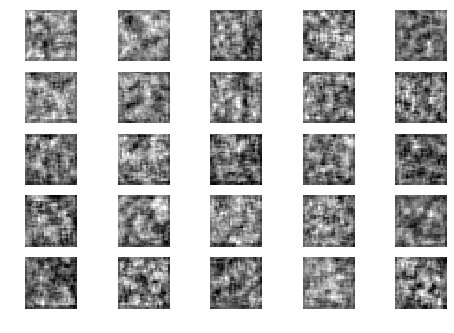

Epoch 1 Batch 506/937 [D loss: 0.598154, acc.: 68.75%] [G loss: 1.112942]
Epoch 1 Batch 507/937 [D loss: 0.600024, acc.: 65.62%] [G loss: 1.096201]
Epoch 1 Batch 508/937 [D loss: 0.808307, acc.: 50.00%] [G loss: 1.092061]
Epoch 1 Batch 509/937 [D loss: 0.716870, acc.: 56.25%] [G loss: 0.989274]
Epoch 1 Batch 510/937 [D loss: 0.594960, acc.: 65.62%] [G loss: 1.179243]


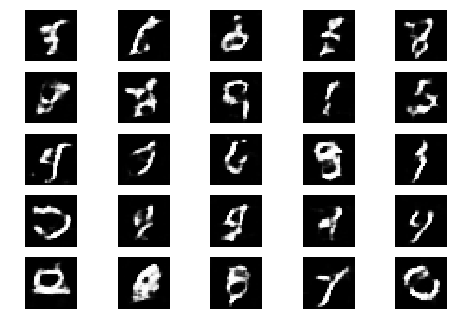

Epoch 1 Batch 511/937 [D loss: 0.666321, acc.: 65.62%] [G loss: 1.071640]
Epoch 1 Batch 512/937 [D loss: 0.622822, acc.: 68.75%] [G loss: 0.934956]
Epoch 1 Batch 513/937 [D loss: 0.814168, acc.: 46.88%] [G loss: 1.018750]
Epoch 1 Batch 514/937 [D loss: 0.629625, acc.: 65.62%] [G loss: 0.976901]
Epoch 1 Batch 515/937 [D loss: 0.756722, acc.: 62.50%] [G loss: 0.856634]
Epoch 1 Batch 516/937 [D loss: 0.562157, acc.: 71.88%] [G loss: 1.139192]
Epoch 1 Batch 517/937 [D loss: 0.701583, acc.: 46.88%] [G loss: 0.978834]
Epoch 1 Batch 518/937 [D loss: 0.723737, acc.: 62.50%] [G loss: 1.075505]
Epoch 1 Batch 519/937 [D loss: 0.778981, acc.: 34.38%] [G loss: 1.070853]
Epoch 1 Batch 520/937 [D loss: 0.726880, acc.: 56.25%] [G loss: 1.076130]
Epoch 1 Batch 521/937 [D loss: 0.881520, acc.: 43.75%] [G loss: 1.098081]
Epoch 1 Batch 522/937 [D loss: 0.590505, acc.: 71.88%] [G loss: 1.016854]
Epoch 1 Batch 523/937 [D loss: 0.663512, acc.: 59.38%] [G loss: 1.143046]
Epoch 1 Batch 524/937 [D loss: 0.54755

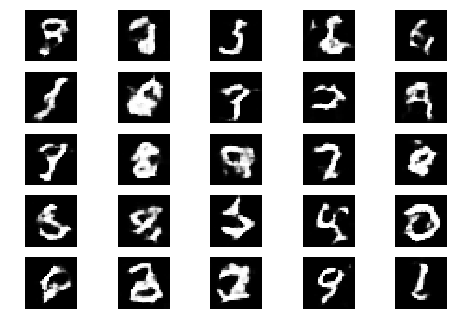

Epoch 1 Batch 601/937 [D loss: 0.746657, acc.: 53.12%] [G loss: 1.019752]
Epoch 1 Batch 602/937 [D loss: 0.581131, acc.: 62.50%] [G loss: 0.901826]
Epoch 1 Batch 603/937 [D loss: 0.639554, acc.: 71.88%] [G loss: 1.077039]
Epoch 1 Batch 604/937 [D loss: 0.793658, acc.: 34.38%] [G loss: 1.054239]
Epoch 1 Batch 605/937 [D loss: 0.753579, acc.: 50.00%] [G loss: 0.979888]
Epoch 1 Batch 606/937 [D loss: 0.842686, acc.: 53.12%] [G loss: 1.023318]


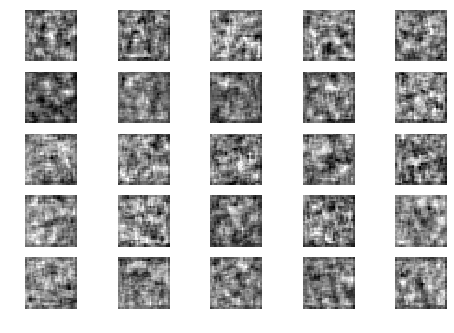

Epoch 1 Batch 607/937 [D loss: 0.676766, acc.: 59.38%] [G loss: 0.974170]
Epoch 1 Batch 608/937 [D loss: 0.764696, acc.: 50.00%] [G loss: 1.114942]
Epoch 1 Batch 609/937 [D loss: 0.815868, acc.: 37.50%] [G loss: 0.950585]
Epoch 1 Batch 610/937 [D loss: 0.619210, acc.: 62.50%] [G loss: 1.108161]
Epoch 1 Batch 611/937 [D loss: 0.647400, acc.: 68.75%] [G loss: 1.207817]
Epoch 1 Batch 612/937 [D loss: 0.690796, acc.: 56.25%] [G loss: 1.153126]


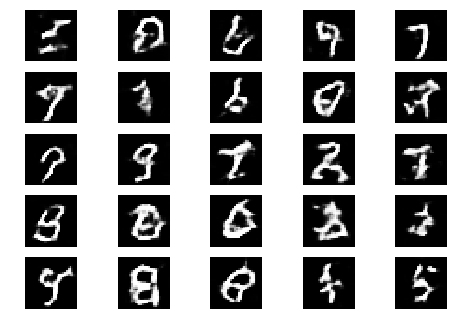

Epoch 1 Batch 613/937 [D loss: 0.699689, acc.: 62.50%] [G loss: 1.045546]
Epoch 1 Batch 614/937 [D loss: 0.828405, acc.: 50.00%] [G loss: 1.171153]
Epoch 1 Batch 615/937 [D loss: 0.749877, acc.: 46.88%] [G loss: 1.129072]
Epoch 1 Batch 616/937 [D loss: 0.673573, acc.: 71.88%] [G loss: 0.929196]
Epoch 1 Batch 617/937 [D loss: 0.678096, acc.: 62.50%] [G loss: 0.965282]
Epoch 1 Batch 618/937 [D loss: 0.699952, acc.: 62.50%] [G loss: 1.005678]
Epoch 1 Batch 619/937 [D loss: 0.544616, acc.: 75.00%] [G loss: 0.815622]
Epoch 1 Batch 620/937 [D loss: 0.621307, acc.: 75.00%] [G loss: 0.916862]
Epoch 1 Batch 621/937 [D loss: 0.615463, acc.: 65.62%] [G loss: 1.130741]
Epoch 1 Batch 622/937 [D loss: 0.788537, acc.: 50.00%] [G loss: 1.085233]
Epoch 1 Batch 623/937 [D loss: 0.590634, acc.: 71.88%] [G loss: 1.236659]
Epoch 1 Batch 624/937 [D loss: 0.659498, acc.: 59.38%] [G loss: 1.158451]
Epoch 1 Batch 625/937 [D loss: 0.644027, acc.: 62.50%] [G loss: 0.997891]
Epoch 1 Batch 626/937 [D loss: 0.70282

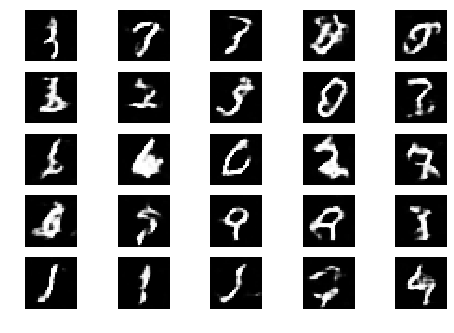

Epoch 1 Batch 701/937 [D loss: 0.883632, acc.: 34.38%] [G loss: 0.884674]
Epoch 1 Batch 702/937 [D loss: 0.679657, acc.: 68.75%] [G loss: 0.813476]
Epoch 1 Batch 703/937 [D loss: 0.611395, acc.: 65.62%] [G loss: 0.922626]
Epoch 1 Batch 704/937 [D loss: 0.753039, acc.: 40.62%] [G loss: 1.191016]
Epoch 1 Batch 705/937 [D loss: 0.843275, acc.: 40.62%] [G loss: 1.021024]
Epoch 1 Batch 706/937 [D loss: 0.750536, acc.: 50.00%] [G loss: 1.031525]
Epoch 1 Batch 707/937 [D loss: 0.738123, acc.: 50.00%] [G loss: 0.904318]


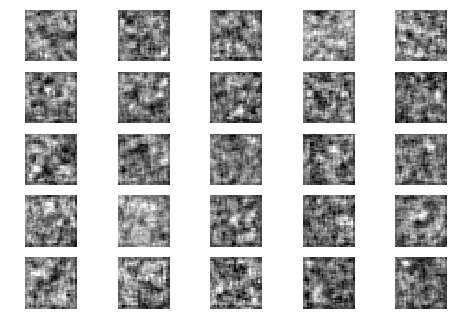

Epoch 1 Batch 708/937 [D loss: 0.637601, acc.: 62.50%] [G loss: 0.882166]
Epoch 1 Batch 709/937 [D loss: 0.830240, acc.: 43.75%] [G loss: 0.946708]
Epoch 1 Batch 710/937 [D loss: 0.734445, acc.: 62.50%] [G loss: 0.963472]
Epoch 1 Batch 711/937 [D loss: 0.783260, acc.: 43.75%] [G loss: 0.709472]
Epoch 1 Batch 712/937 [D loss: 0.589878, acc.: 62.50%] [G loss: 1.123695]
Epoch 1 Batch 713/937 [D loss: 0.738654, acc.: 50.00%] [G loss: 1.063888]
Epoch 1 Batch 714/937 [D loss: 0.762049, acc.: 50.00%] [G loss: 0.859698]


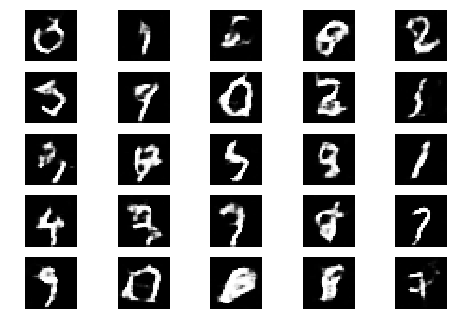

Epoch 1 Batch 715/937 [D loss: 0.746870, acc.: 56.25%] [G loss: 0.973099]
Epoch 1 Batch 716/937 [D loss: 0.795666, acc.: 31.25%] [G loss: 0.957710]
Epoch 1 Batch 717/937 [D loss: 0.754842, acc.: 59.38%] [G loss: 1.011052]
Epoch 1 Batch 718/937 [D loss: 0.690512, acc.: 59.38%] [G loss: 0.826522]
Epoch 1 Batch 719/937 [D loss: 0.586210, acc.: 71.88%] [G loss: 1.037123]
Epoch 1 Batch 720/937 [D loss: 0.740645, acc.: 50.00%] [G loss: 1.123387]
Epoch 1 Batch 721/937 [D loss: 0.698049, acc.: 53.12%] [G loss: 0.973796]
Epoch 1 Batch 722/937 [D loss: 0.574093, acc.: 65.62%] [G loss: 1.015473]
Epoch 1 Batch 723/937 [D loss: 0.755421, acc.: 50.00%] [G loss: 0.887936]
Epoch 1 Batch 724/937 [D loss: 0.516132, acc.: 78.12%] [G loss: 0.965395]
Epoch 1 Batch 725/937 [D loss: 0.604970, acc.: 71.88%] [G loss: 1.009961]
Epoch 1 Batch 726/937 [D loss: 0.716830, acc.: 50.00%] [G loss: 1.178427]
Epoch 1 Batch 727/937 [D loss: 0.622884, acc.: 71.88%] [G loss: 1.051913]
Epoch 1 Batch 728/937 [D loss: 0.72222

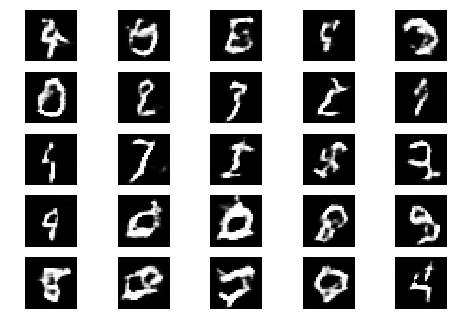

Epoch 1 Batch 801/937 [D loss: 0.745687, acc.: 53.12%] [G loss: 0.802919]
Epoch 1 Batch 802/937 [D loss: 0.697371, acc.: 56.25%] [G loss: 1.062647]
Epoch 1 Batch 803/937 [D loss: 0.833080, acc.: 40.62%] [G loss: 0.915539]
Epoch 1 Batch 804/937 [D loss: 0.535362, acc.: 81.25%] [G loss: 1.090523]
Epoch 1 Batch 805/937 [D loss: 0.690462, acc.: 56.25%] [G loss: 0.915950]
Epoch 1 Batch 806/937 [D loss: 0.694651, acc.: 53.12%] [G loss: 1.001295]
Epoch 1 Batch 807/937 [D loss: 0.475492, acc.: 78.12%] [G loss: 1.129181]
Epoch 1 Batch 808/937 [D loss: 0.772401, acc.: 37.50%] [G loss: 0.810891]


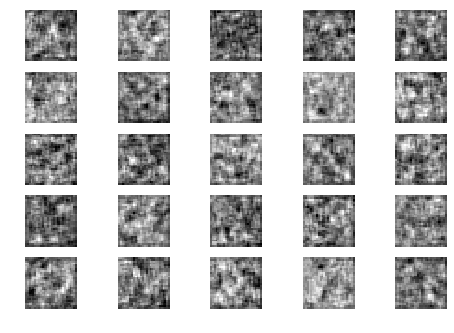

Epoch 1 Batch 809/937 [D loss: 0.707581, acc.: 62.50%] [G loss: 1.270948]
Epoch 1 Batch 810/937 [D loss: 0.611671, acc.: 71.88%] [G loss: 1.134627]
Epoch 1 Batch 811/937 [D loss: 0.637350, acc.: 65.62%] [G loss: 1.143482]
Epoch 1 Batch 812/937 [D loss: 0.718275, acc.: 56.25%] [G loss: 1.047862]
Epoch 1 Batch 813/937 [D loss: 0.643148, acc.: 56.25%] [G loss: 1.275244]
Epoch 1 Batch 814/937 [D loss: 0.730205, acc.: 59.38%] [G loss: 0.985521]
Epoch 1 Batch 815/937 [D loss: 0.675355, acc.: 59.38%] [G loss: 0.911652]
Epoch 1 Batch 816/937 [D loss: 0.721720, acc.: 50.00%] [G loss: 0.880183]


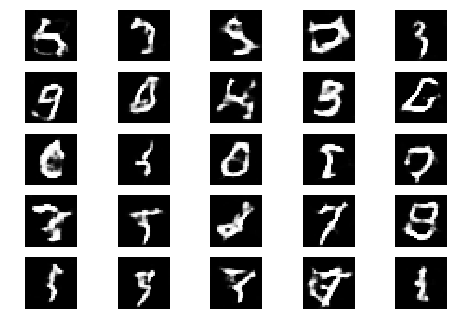

Epoch 1 Batch 817/937 [D loss: 0.693474, acc.: 50.00%] [G loss: 0.830637]
Epoch 1 Batch 818/937 [D loss: 0.697828, acc.: 62.50%] [G loss: 1.184853]
Epoch 1 Batch 819/937 [D loss: 0.699439, acc.: 53.12%] [G loss: 0.901674]
Epoch 1 Batch 820/937 [D loss: 0.597978, acc.: 59.38%] [G loss: 1.001361]
Epoch 1 Batch 821/937 [D loss: 0.539766, acc.: 71.88%] [G loss: 0.892639]
Epoch 1 Batch 822/937 [D loss: 0.628986, acc.: 62.50%] [G loss: 0.939172]
Epoch 1 Batch 823/937 [D loss: 0.662905, acc.: 65.62%] [G loss: 1.008946]
Epoch 1 Batch 824/937 [D loss: 0.623263, acc.: 68.75%] [G loss: 1.010778]
Epoch 1 Batch 825/937 [D loss: 0.739947, acc.: 50.00%] [G loss: 0.810422]
Epoch 1 Batch 826/937 [D loss: 0.811785, acc.: 34.38%] [G loss: 0.963872]
Epoch 1 Batch 827/937 [D loss: 0.841488, acc.: 53.12%] [G loss: 1.190226]
Epoch 1 Batch 828/937 [D loss: 0.626969, acc.: 68.75%] [G loss: 1.068200]
Epoch 1 Batch 829/937 [D loss: 0.684440, acc.: 62.50%] [G loss: 0.848318]
Epoch 1 Batch 830/937 [D loss: 0.78820

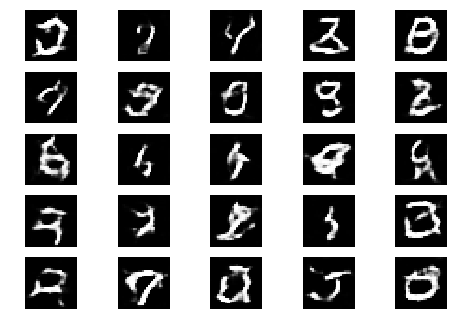

Epoch 1 Batch 901/937 [D loss: 0.683598, acc.: 56.25%] [G loss: 1.132317]
Epoch 1 Batch 902/937 [D loss: 0.656189, acc.: 71.88%] [G loss: 1.073832]
Epoch 1 Batch 903/937 [D loss: 0.675523, acc.: 53.12%] [G loss: 1.032424]
Epoch 1 Batch 904/937 [D loss: 0.816365, acc.: 40.62%] [G loss: 0.825601]
Epoch 1 Batch 905/937 [D loss: 0.671831, acc.: 59.38%] [G loss: 1.185470]
Epoch 1 Batch 906/937 [D loss: 0.717002, acc.: 59.38%] [G loss: 0.999204]
Epoch 1 Batch 907/937 [D loss: 0.682056, acc.: 59.38%] [G loss: 0.897100]
Epoch 1 Batch 908/937 [D loss: 0.573909, acc.: 65.62%] [G loss: 0.757869]
Epoch 1 Batch 909/937 [D loss: 0.826547, acc.: 43.75%] [G loss: 0.931826]


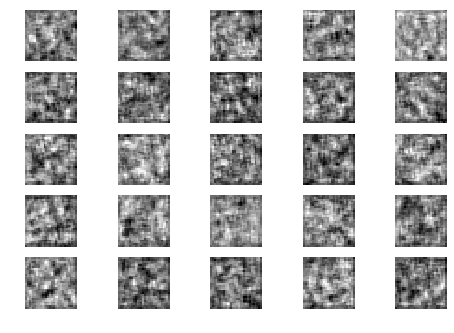

Epoch 1 Batch 910/937 [D loss: 0.660829, acc.: 59.38%] [G loss: 0.993084]
Epoch 1 Batch 911/937 [D loss: 0.616272, acc.: 65.62%] [G loss: 1.094764]
Epoch 1 Batch 912/937 [D loss: 0.960283, acc.: 34.38%] [G loss: 0.816838]
Epoch 1 Batch 913/937 [D loss: 0.697013, acc.: 53.12%] [G loss: 0.999750]
Epoch 1 Batch 914/937 [D loss: 0.772014, acc.: 56.25%] [G loss: 0.713811]
Epoch 1 Batch 915/937 [D loss: 0.668223, acc.: 59.38%] [G loss: 1.156688]
Epoch 1 Batch 916/937 [D loss: 0.704688, acc.: 62.50%] [G loss: 0.894547]
Epoch 1 Batch 917/937 [D loss: 0.570661, acc.: 68.75%] [G loss: 0.901447]
Epoch 1 Batch 918/937 [D loss: 0.642839, acc.: 62.50%] [G loss: 0.814941]


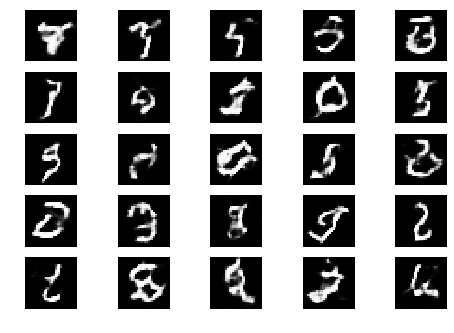

Epoch 1 Batch 919/937 [D loss: 0.712299, acc.: 56.25%] [G loss: 0.698384]
Epoch 1 Batch 920/937 [D loss: 0.734676, acc.: 53.12%] [G loss: 0.849246]
Epoch 1 Batch 921/937 [D loss: 0.582748, acc.: 75.00%] [G loss: 1.044855]
Epoch 1 Batch 922/937 [D loss: 0.550641, acc.: 75.00%] [G loss: 1.091323]
Epoch 1 Batch 923/937 [D loss: 0.744925, acc.: 40.62%] [G loss: 1.253997]
Epoch 1 Batch 924/937 [D loss: 0.735271, acc.: 53.12%] [G loss: 1.103934]
Epoch 1 Batch 925/937 [D loss: 0.805873, acc.: 56.25%] [G loss: 1.082223]
Epoch 1 Batch 926/937 [D loss: 0.742480, acc.: 59.38%] [G loss: 0.964707]
Epoch 1 Batch 927/937 [D loss: 0.678207, acc.: 75.00%] [G loss: 0.755814]
Epoch 1 Batch 928/937 [D loss: 0.694315, acc.: 53.12%] [G loss: 0.916493]
Epoch 1 Batch 929/937 [D loss: 0.599427, acc.: 65.62%] [G loss: 0.842967]
Epoch 1 Batch 930/937 [D loss: 0.651055, acc.: 65.62%] [G loss: 0.874303]
Epoch 1 Batch 931/937 [D loss: 0.656251, acc.: 56.25%] [G loss: 0.898238]
Epoch 1 Batch 932/937 [D loss: 0.71525

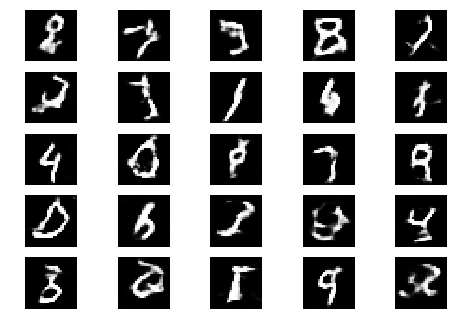

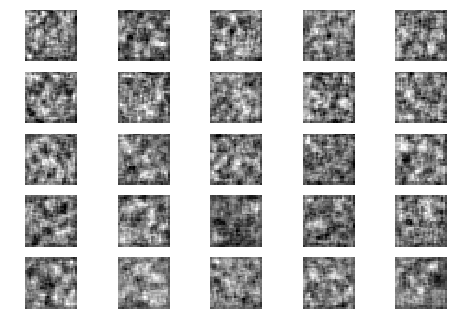

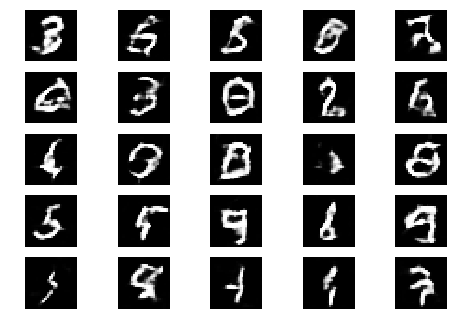

Epoch 2 Batch 1/937 [D loss: 0.620190, acc.: 71.88%] [G loss: 1.020898]
Epoch 2 Batch 2/937 [D loss: 0.711944, acc.: 62.50%] [G loss: 0.820989]
Epoch 2 Batch 3/937 [D loss: 0.769520, acc.: 59.38%] [G loss: 1.007668]
Epoch 2 Batch 4/937 [D loss: 0.512326, acc.: 78.12%] [G loss: 1.010477]
Epoch 2 Batch 5/937 [D loss: 0.663747, acc.: 59.38%] [G loss: 0.897901]
Epoch 2 Batch 6/937 [D loss: 0.581275, acc.: 71.88%] [G loss: 0.864419]
Epoch 2 Batch 7/937 [D loss: 0.639584, acc.: 68.75%] [G loss: 0.805757]
Epoch 2 Batch 8/937 [D loss: 0.661963, acc.: 62.50%] [G loss: 0.958748]
Epoch 2 Batch 9/937 [D loss: 0.691533, acc.: 62.50%] [G loss: 0.806565]
Epoch 2 Batch 10/937 [D loss: 0.599169, acc.: 68.75%] [G loss: 0.856988]
Epoch 2 Batch 11/937 [D loss: 0.553236, acc.: 68.75%] [G loss: 1.062189]
Epoch 2 Batch 12/937 [D loss: 0.718539, acc.: 53.12%] [G loss: 0.967120]
Epoch 2 Batch 13/937 [D loss: 0.621576, acc.: 65.62%] [G loss: 0.793824]
Epoch 2 Batch 14/937 [D loss: 0.607426, acc.: 68.75%] [G los

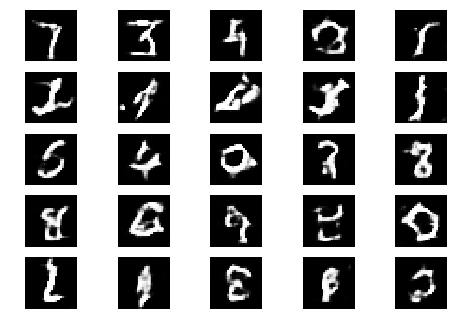

Epoch 2 Batch 101/937 [D loss: 0.719833, acc.: 53.12%] [G loss: 1.029938]


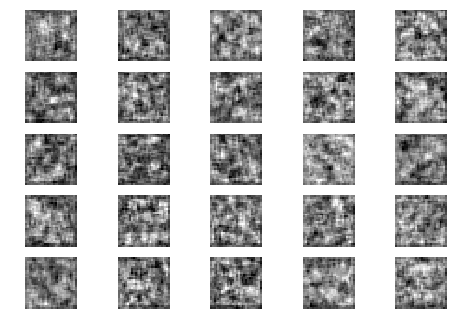

Epoch 2 Batch 102/937 [D loss: 0.692445, acc.: 53.12%] [G loss: 1.395304]


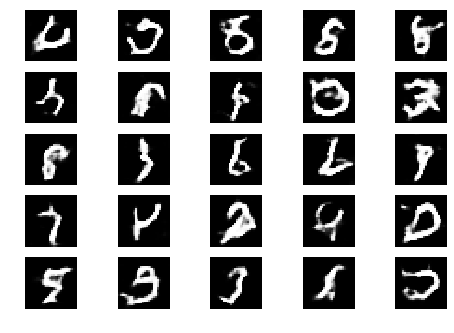

Epoch 2 Batch 103/937 [D loss: 0.772245, acc.: 56.25%] [G loss: 1.126332]
Epoch 2 Batch 104/937 [D loss: 0.828930, acc.: 37.50%] [G loss: 0.974480]
Epoch 2 Batch 105/937 [D loss: 0.741090, acc.: 46.88%] [G loss: 0.933206]
Epoch 2 Batch 106/937 [D loss: 0.542982, acc.: 71.88%] [G loss: 1.223473]
Epoch 2 Batch 107/937 [D loss: 0.722746, acc.: 50.00%] [G loss: 0.892177]
Epoch 2 Batch 108/937 [D loss: 0.815649, acc.: 46.88%] [G loss: 0.973718]
Epoch 2 Batch 109/937 [D loss: 0.705970, acc.: 59.38%] [G loss: 0.990116]
Epoch 2 Batch 110/937 [D loss: 0.617214, acc.: 56.25%] [G loss: 1.085795]
Epoch 2 Batch 111/937 [D loss: 0.640502, acc.: 65.62%] [G loss: 1.079697]
Epoch 2 Batch 112/937 [D loss: 0.843811, acc.: 37.50%] [G loss: 0.993756]
Epoch 2 Batch 113/937 [D loss: 0.650682, acc.: 62.50%] [G loss: 0.840011]
Epoch 2 Batch 114/937 [D loss: 0.762011, acc.: 46.88%] [G loss: 0.892452]
Epoch 2 Batch 115/937 [D loss: 0.626511, acc.: 68.75%] [G loss: 1.053464]
Epoch 2 Batch 116/937 [D loss: 0.71328

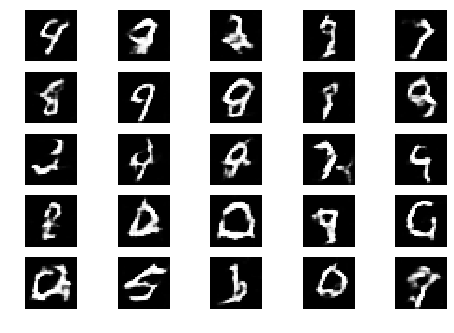

Epoch 2 Batch 201/937 [D loss: 0.678040, acc.: 53.12%] [G loss: 1.002966]
Epoch 2 Batch 202/937 [D loss: 0.611252, acc.: 65.62%] [G loss: 1.255247]


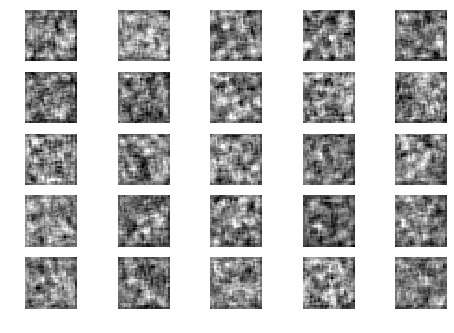

Epoch 2 Batch 203/937 [D loss: 0.666479, acc.: 56.25%] [G loss: 0.874497]
Epoch 2 Batch 204/937 [D loss: 0.698000, acc.: 53.12%] [G loss: 1.102344]


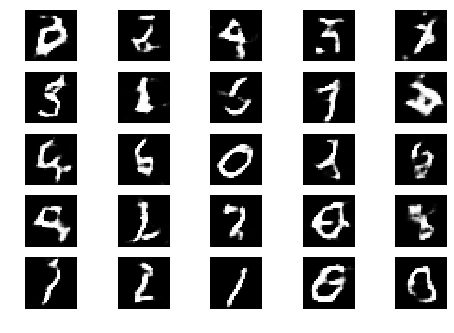

Epoch 2 Batch 205/937 [D loss: 0.698479, acc.: 56.25%] [G loss: 0.987395]
Epoch 2 Batch 206/937 [D loss: 0.605626, acc.: 62.50%] [G loss: 0.770248]
Epoch 2 Batch 207/937 [D loss: 0.709947, acc.: 62.50%] [G loss: 0.869836]
Epoch 2 Batch 208/937 [D loss: 0.584746, acc.: 62.50%] [G loss: 0.807669]
Epoch 2 Batch 209/937 [D loss: 0.570996, acc.: 71.88%] [G loss: 0.835898]
Epoch 2 Batch 210/937 [D loss: 0.830937, acc.: 40.62%] [G loss: 0.854511]
Epoch 2 Batch 211/937 [D loss: 0.584169, acc.: 62.50%] [G loss: 0.920001]
Epoch 2 Batch 212/937 [D loss: 0.587603, acc.: 81.25%] [G loss: 0.908521]
Epoch 2 Batch 213/937 [D loss: 0.633668, acc.: 59.38%] [G loss: 1.069433]
Epoch 2 Batch 214/937 [D loss: 0.627942, acc.: 71.88%] [G loss: 1.083159]
Epoch 2 Batch 215/937 [D loss: 0.618837, acc.: 75.00%] [G loss: 0.855327]
Epoch 2 Batch 216/937 [D loss: 0.666303, acc.: 59.38%] [G loss: 1.065905]
Epoch 2 Batch 217/937 [D loss: 0.600636, acc.: 68.75%] [G loss: 1.223230]
Epoch 2 Batch 218/937 [D loss: 0.73101

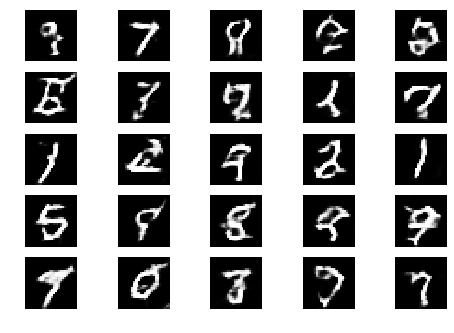

Epoch 2 Batch 301/937 [D loss: 0.652923, acc.: 65.62%] [G loss: 0.982464]
Epoch 2 Batch 302/937 [D loss: 0.776445, acc.: 50.00%] [G loss: 1.007473]
Epoch 2 Batch 303/937 [D loss: 0.619140, acc.: 68.75%] [G loss: 1.170707]


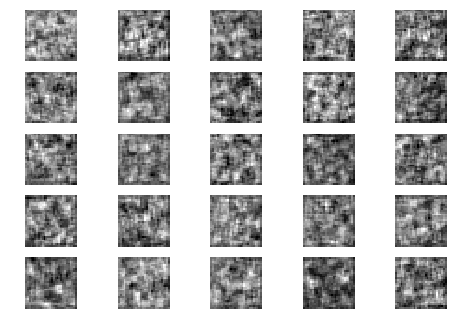

Epoch 2 Batch 304/937 [D loss: 0.655078, acc.: 56.25%] [G loss: 0.825971]
Epoch 2 Batch 305/937 [D loss: 0.757129, acc.: 53.12%] [G loss: 0.809948]
Epoch 2 Batch 306/937 [D loss: 0.654997, acc.: 71.88%] [G loss: 1.039525]


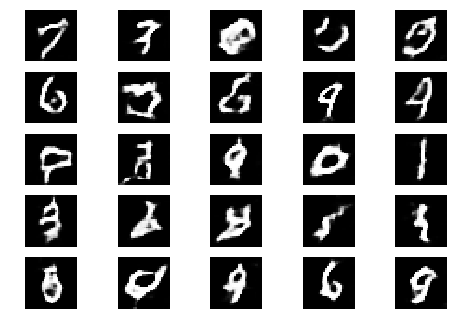

Epoch 2 Batch 307/937 [D loss: 0.587460, acc.: 71.88%] [G loss: 0.969494]
Epoch 2 Batch 308/937 [D loss: 0.760448, acc.: 56.25%] [G loss: 0.949015]
Epoch 2 Batch 309/937 [D loss: 0.589638, acc.: 65.62%] [G loss: 1.128995]
Epoch 2 Batch 310/937 [D loss: 0.679972, acc.: 59.38%] [G loss: 1.034776]
Epoch 2 Batch 311/937 [D loss: 0.817676, acc.: 53.12%] [G loss: 0.842760]
Epoch 2 Batch 312/937 [D loss: 0.727609, acc.: 46.88%] [G loss: 0.978730]
Epoch 2 Batch 313/937 [D loss: 0.715187, acc.: 56.25%] [G loss: 1.004053]
Epoch 2 Batch 314/937 [D loss: 0.817409, acc.: 46.88%] [G loss: 1.083240]
Epoch 2 Batch 315/937 [D loss: 0.609463, acc.: 68.75%] [G loss: 0.951288]
Epoch 2 Batch 316/937 [D loss: 0.671678, acc.: 56.25%] [G loss: 1.044942]
Epoch 2 Batch 317/937 [D loss: 0.603031, acc.: 68.75%] [G loss: 1.232981]
Epoch 2 Batch 318/937 [D loss: 0.640387, acc.: 59.38%] [G loss: 1.106499]
Epoch 2 Batch 319/937 [D loss: 0.817439, acc.: 43.75%] [G loss: 1.111540]
Epoch 2 Batch 320/937 [D loss: 0.62903

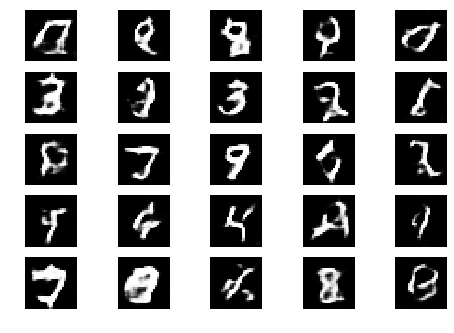

Epoch 2 Batch 401/937 [D loss: 0.696869, acc.: 59.38%] [G loss: 0.926317]
Epoch 2 Batch 402/937 [D loss: 0.762248, acc.: 53.12%] [G loss: 1.057576]
Epoch 2 Batch 403/937 [D loss: 0.714605, acc.: 50.00%] [G loss: 0.888776]
Epoch 2 Batch 404/937 [D loss: 0.587786, acc.: 68.75%] [G loss: 0.885766]


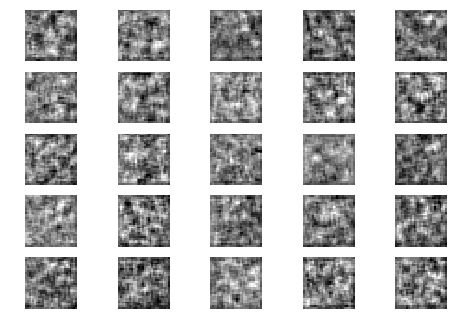

Epoch 2 Batch 405/937 [D loss: 0.693906, acc.: 59.38%] [G loss: 0.881997]
Epoch 2 Batch 406/937 [D loss: 0.692597, acc.: 56.25%] [G loss: 0.995495]
Epoch 2 Batch 407/937 [D loss: 0.695547, acc.: 53.12%] [G loss: 1.039796]
Epoch 2 Batch 408/937 [D loss: 0.694792, acc.: 46.88%] [G loss: 1.052695]


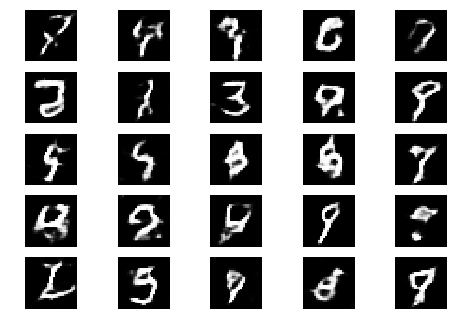

Epoch 2 Batch 409/937 [D loss: 0.636533, acc.: 59.38%] [G loss: 0.874631]
Epoch 2 Batch 410/937 [D loss: 0.752491, acc.: 53.12%] [G loss: 1.342891]
Epoch 2 Batch 411/937 [D loss: 0.544768, acc.: 84.38%] [G loss: 1.252820]
Epoch 2 Batch 412/937 [D loss: 0.542295, acc.: 65.62%] [G loss: 1.003606]
Epoch 2 Batch 413/937 [D loss: 0.712537, acc.: 56.25%] [G loss: 0.966753]
Epoch 2 Batch 414/937 [D loss: 0.639156, acc.: 59.38%] [G loss: 0.956618]
Epoch 2 Batch 415/937 [D loss: 0.668617, acc.: 62.50%] [G loss: 1.011197]
Epoch 2 Batch 416/937 [D loss: 0.680904, acc.: 59.38%] [G loss: 0.919545]
Epoch 2 Batch 417/937 [D loss: 0.615516, acc.: 71.88%] [G loss: 0.885266]
Epoch 2 Batch 418/937 [D loss: 0.732423, acc.: 50.00%] [G loss: 1.038138]
Epoch 2 Batch 419/937 [D loss: 0.642898, acc.: 56.25%] [G loss: 0.898741]
Epoch 2 Batch 420/937 [D loss: 0.700548, acc.: 56.25%] [G loss: 0.809834]
Epoch 2 Batch 421/937 [D loss: 0.532061, acc.: 78.12%] [G loss: 1.006545]
Epoch 2 Batch 422/937 [D loss: 0.59868

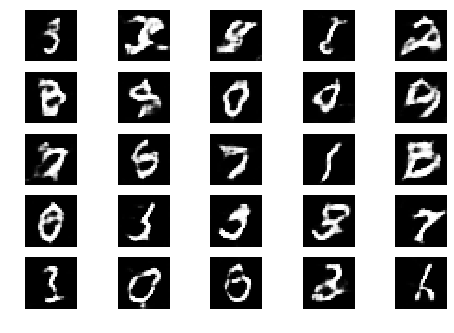

Epoch 2 Batch 501/937 [D loss: 0.777235, acc.: 43.75%] [G loss: 0.981126]
Epoch 2 Batch 502/937 [D loss: 0.756455, acc.: 43.75%] [G loss: 1.032680]
Epoch 2 Batch 503/937 [D loss: 0.558849, acc.: 81.25%] [G loss: 0.951003]
Epoch 2 Batch 504/937 [D loss: 0.713093, acc.: 59.38%] [G loss: 0.748360]
Epoch 2 Batch 505/937 [D loss: 0.611340, acc.: 59.38%] [G loss: 1.132616]


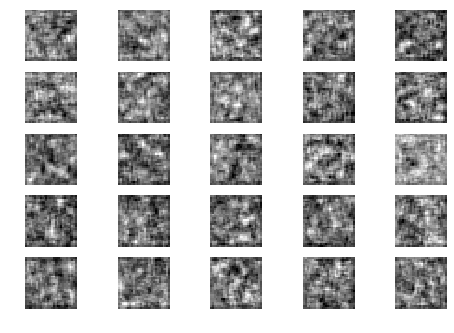

Epoch 2 Batch 506/937 [D loss: 0.723520, acc.: 56.25%] [G loss: 1.015487]
Epoch 2 Batch 507/937 [D loss: 0.625026, acc.: 65.62%] [G loss: 0.977682]
Epoch 2 Batch 508/937 [D loss: 0.746216, acc.: 56.25%] [G loss: 1.132740]
Epoch 2 Batch 509/937 [D loss: 0.750410, acc.: 53.12%] [G loss: 0.881856]
Epoch 2 Batch 510/937 [D loss: 0.580097, acc.: 68.75%] [G loss: 1.008538]


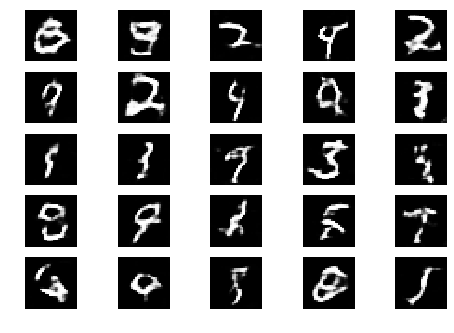

Epoch 2 Batch 511/937 [D loss: 0.597337, acc.: 65.62%] [G loss: 1.061923]
Epoch 2 Batch 512/937 [D loss: 0.649158, acc.: 75.00%] [G loss: 0.990843]
Epoch 2 Batch 513/937 [D loss: 0.687027, acc.: 53.12%] [G loss: 0.961892]
Epoch 2 Batch 514/937 [D loss: 0.882524, acc.: 31.25%] [G loss: 0.933539]
Epoch 2 Batch 515/937 [D loss: 0.768154, acc.: 46.88%] [G loss: 0.844001]
Epoch 2 Batch 516/937 [D loss: 0.649018, acc.: 62.50%] [G loss: 0.822229]
Epoch 2 Batch 517/937 [D loss: 0.760919, acc.: 46.88%] [G loss: 0.978346]
Epoch 2 Batch 518/937 [D loss: 0.783650, acc.: 50.00%] [G loss: 1.022490]
Epoch 2 Batch 519/937 [D loss: 0.649725, acc.: 65.62%] [G loss: 0.916826]
Epoch 2 Batch 520/937 [D loss: 0.785579, acc.: 40.62%] [G loss: 0.975787]
Epoch 2 Batch 521/937 [D loss: 0.840920, acc.: 43.75%] [G loss: 0.925676]
Epoch 2 Batch 522/937 [D loss: 0.650654, acc.: 62.50%] [G loss: 0.984131]
Epoch 2 Batch 523/937 [D loss: 0.666689, acc.: 59.38%] [G loss: 0.930460]
Epoch 2 Batch 524/937 [D loss: 0.68592

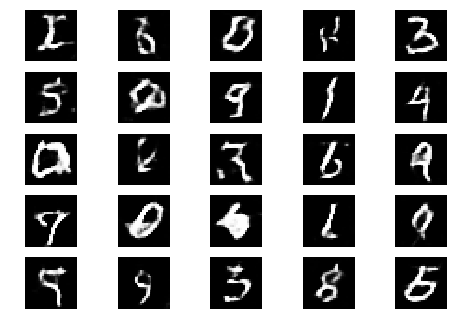

Epoch 2 Batch 601/937 [D loss: 0.659343, acc.: 56.25%] [G loss: 0.869854]
Epoch 2 Batch 602/937 [D loss: 0.635787, acc.: 65.62%] [G loss: 1.026838]
Epoch 2 Batch 603/937 [D loss: 0.686463, acc.: 50.00%] [G loss: 1.068377]
Epoch 2 Batch 604/937 [D loss: 0.635457, acc.: 59.38%] [G loss: 1.227397]
Epoch 2 Batch 605/937 [D loss: 0.732839, acc.: 53.12%] [G loss: 0.833930]
Epoch 2 Batch 606/937 [D loss: 0.763988, acc.: 50.00%] [G loss: 1.068152]


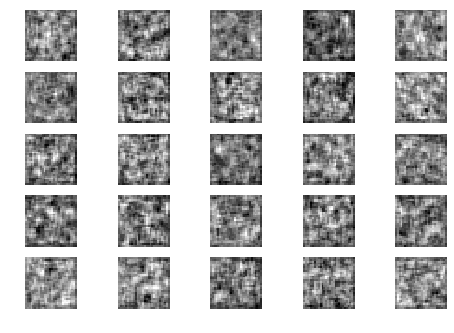

Epoch 2 Batch 607/937 [D loss: 0.712197, acc.: 50.00%] [G loss: 1.146514]
Epoch 2 Batch 608/937 [D loss: 0.556935, acc.: 68.75%] [G loss: 0.882832]
Epoch 2 Batch 609/937 [D loss: 0.693546, acc.: 59.38%] [G loss: 0.929316]
Epoch 2 Batch 610/937 [D loss: 0.764027, acc.: 50.00%] [G loss: 1.010900]
Epoch 2 Batch 611/937 [D loss: 0.700562, acc.: 62.50%] [G loss: 1.018802]
Epoch 2 Batch 612/937 [D loss: 0.727980, acc.: 53.12%] [G loss: 1.006214]


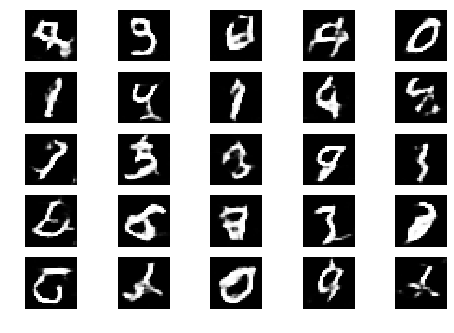

Epoch 2 Batch 613/937 [D loss: 0.797552, acc.: 50.00%] [G loss: 0.827594]
Epoch 2 Batch 614/937 [D loss: 0.815593, acc.: 37.50%] [G loss: 0.821109]
Epoch 2 Batch 615/937 [D loss: 0.615214, acc.: 62.50%] [G loss: 0.909487]
Epoch 2 Batch 616/937 [D loss: 0.608989, acc.: 68.75%] [G loss: 0.888024]
Epoch 2 Batch 617/937 [D loss: 0.603924, acc.: 62.50%] [G loss: 1.040855]
Epoch 2 Batch 618/937 [D loss: 0.611503, acc.: 65.62%] [G loss: 0.989508]
Epoch 2 Batch 619/937 [D loss: 0.675145, acc.: 59.38%] [G loss: 0.894171]
Epoch 2 Batch 620/937 [D loss: 0.716418, acc.: 56.25%] [G loss: 1.092528]
Epoch 2 Batch 621/937 [D loss: 0.727594, acc.: 53.12%] [G loss: 0.890793]
Epoch 2 Batch 622/937 [D loss: 0.612660, acc.: 65.62%] [G loss: 0.964616]
Epoch 2 Batch 623/937 [D loss: 0.646945, acc.: 62.50%] [G loss: 0.873221]
Epoch 2 Batch 624/937 [D loss: 0.793720, acc.: 40.62%] [G loss: 0.735376]
Epoch 2 Batch 625/937 [D loss: 0.636595, acc.: 68.75%] [G loss: 0.840126]
Epoch 2 Batch 626/937 [D loss: 0.53890

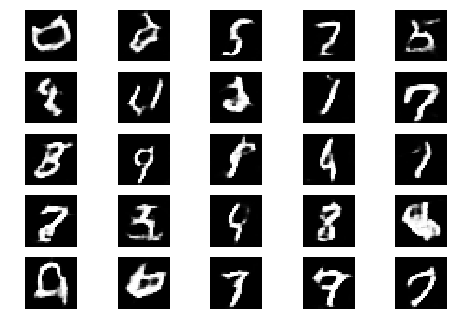

Epoch 2 Batch 701/937 [D loss: 0.634865, acc.: 65.62%] [G loss: 1.061460]
Epoch 2 Batch 702/937 [D loss: 0.745686, acc.: 53.12%] [G loss: 1.020302]
Epoch 2 Batch 703/937 [D loss: 0.669335, acc.: 53.12%] [G loss: 1.107082]
Epoch 2 Batch 704/937 [D loss: 0.733393, acc.: 53.12%] [G loss: 0.984360]
Epoch 2 Batch 705/937 [D loss: 0.606145, acc.: 59.38%] [G loss: 1.122462]
Epoch 2 Batch 706/937 [D loss: 0.758084, acc.: 53.12%] [G loss: 0.969549]
Epoch 2 Batch 707/937 [D loss: 0.612252, acc.: 59.38%] [G loss: 0.818920]


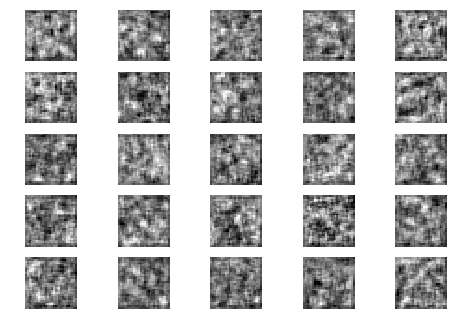

Epoch 2 Batch 708/937 [D loss: 0.664054, acc.: 59.38%] [G loss: 0.927640]
Epoch 2 Batch 709/937 [D loss: 0.702972, acc.: 62.50%] [G loss: 0.963408]
Epoch 2 Batch 710/937 [D loss: 0.636820, acc.: 56.25%] [G loss: 1.124176]
Epoch 2 Batch 711/937 [D loss: 0.671206, acc.: 62.50%] [G loss: 0.915189]
Epoch 2 Batch 712/937 [D loss: 0.558213, acc.: 71.88%] [G loss: 0.991583]
Epoch 2 Batch 713/937 [D loss: 0.744462, acc.: 46.88%] [G loss: 0.827560]
Epoch 2 Batch 714/937 [D loss: 0.585262, acc.: 71.88%] [G loss: 1.113606]


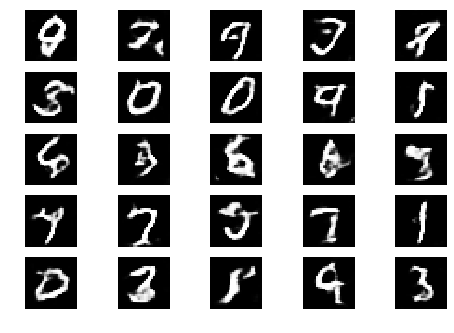

Epoch 2 Batch 715/937 [D loss: 0.791759, acc.: 53.12%] [G loss: 1.037474]
Epoch 2 Batch 716/937 [D loss: 0.671034, acc.: 68.75%] [G loss: 1.020767]
Epoch 2 Batch 717/937 [D loss: 0.713790, acc.: 46.88%] [G loss: 0.901280]
Epoch 2 Batch 718/937 [D loss: 0.532363, acc.: 68.75%] [G loss: 0.877699]
Epoch 2 Batch 719/937 [D loss: 0.906671, acc.: 34.38%] [G loss: 0.765431]
Epoch 2 Batch 720/937 [D loss: 0.698047, acc.: 53.12%] [G loss: 1.041746]
Epoch 2 Batch 721/937 [D loss: 0.700235, acc.: 65.62%] [G loss: 1.195547]
Epoch 2 Batch 722/937 [D loss: 0.709279, acc.: 50.00%] [G loss: 1.035749]
Epoch 2 Batch 723/937 [D loss: 0.553799, acc.: 78.12%] [G loss: 0.966799]
Epoch 2 Batch 724/937 [D loss: 0.660249, acc.: 59.38%] [G loss: 0.933497]
Epoch 2 Batch 725/937 [D loss: 0.602596, acc.: 68.75%] [G loss: 0.936961]
Epoch 2 Batch 726/937 [D loss: 0.536740, acc.: 75.00%] [G loss: 1.177972]
Epoch 2 Batch 727/937 [D loss: 0.718129, acc.: 50.00%] [G loss: 1.032807]
Epoch 2 Batch 728/937 [D loss: 0.67468

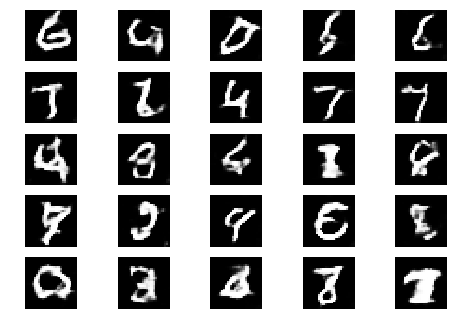

Epoch 2 Batch 801/937 [D loss: 0.636441, acc.: 71.88%] [G loss: 0.903281]
Epoch 2 Batch 802/937 [D loss: 0.615982, acc.: 65.62%] [G loss: 0.984280]
Epoch 2 Batch 803/937 [D loss: 0.650634, acc.: 59.38%] [G loss: 1.020281]
Epoch 2 Batch 804/937 [D loss: 0.683040, acc.: 62.50%] [G loss: 1.005140]
Epoch 2 Batch 805/937 [D loss: 0.613212, acc.: 65.62%] [G loss: 1.091219]
Epoch 2 Batch 806/937 [D loss: 0.585151, acc.: 75.00%] [G loss: 1.132572]
Epoch 2 Batch 807/937 [D loss: 0.569800, acc.: 65.62%] [G loss: 0.995691]
Epoch 2 Batch 808/937 [D loss: 0.728514, acc.: 43.75%] [G loss: 1.004966]


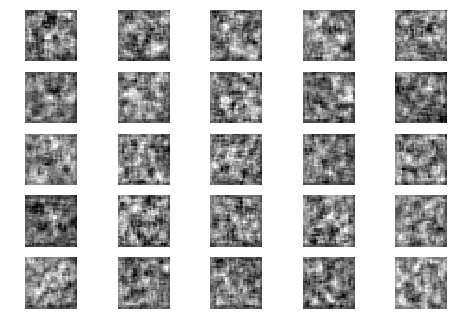

Epoch 2 Batch 809/937 [D loss: 0.558630, acc.: 68.75%] [G loss: 1.044363]
Epoch 2 Batch 810/937 [D loss: 0.748343, acc.: 46.88%] [G loss: 0.937607]
Epoch 2 Batch 811/937 [D loss: 0.650562, acc.: 59.38%] [G loss: 0.987220]
Epoch 2 Batch 812/937 [D loss: 0.667978, acc.: 65.62%] [G loss: 1.105747]
Epoch 2 Batch 813/937 [D loss: 0.519084, acc.: 65.62%] [G loss: 1.178373]
Epoch 2 Batch 814/937 [D loss: 0.873473, acc.: 50.00%] [G loss: 0.766433]
Epoch 2 Batch 815/937 [D loss: 0.708090, acc.: 46.88%] [G loss: 0.946044]
Epoch 2 Batch 816/937 [D loss: 0.628311, acc.: 59.38%] [G loss: 0.905816]


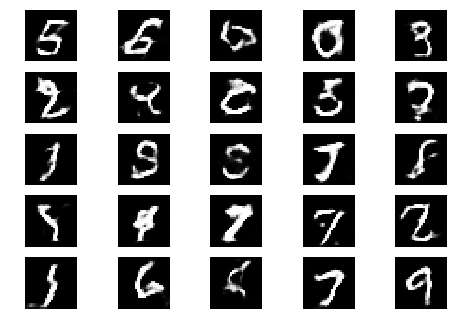

Epoch 2 Batch 817/937 [D loss: 0.602681, acc.: 75.00%] [G loss: 0.992199]
Epoch 2 Batch 818/937 [D loss: 0.671444, acc.: 65.62%] [G loss: 1.070334]
Epoch 2 Batch 819/937 [D loss: 0.525814, acc.: 78.12%] [G loss: 0.960287]
Epoch 2 Batch 820/937 [D loss: 0.646338, acc.: 68.75%] [G loss: 0.991978]
Epoch 2 Batch 821/937 [D loss: 0.778918, acc.: 37.50%] [G loss: 1.058112]
Epoch 2 Batch 822/937 [D loss: 0.692350, acc.: 65.62%] [G loss: 1.077219]
Epoch 2 Batch 823/937 [D loss: 0.625319, acc.: 65.62%] [G loss: 0.897104]
Epoch 2 Batch 824/937 [D loss: 0.731604, acc.: 56.25%] [G loss: 1.001250]
Epoch 2 Batch 825/937 [D loss: 0.589162, acc.: 65.62%] [G loss: 0.941146]
Epoch 2 Batch 826/937 [D loss: 0.674012, acc.: 56.25%] [G loss: 1.051004]
Epoch 2 Batch 827/937 [D loss: 0.717830, acc.: 59.38%] [G loss: 0.883346]
Epoch 2 Batch 828/937 [D loss: 0.561940, acc.: 81.25%] [G loss: 1.117582]
Epoch 2 Batch 829/937 [D loss: 0.665379, acc.: 56.25%] [G loss: 1.140755]
Epoch 2 Batch 830/937 [D loss: 0.79712

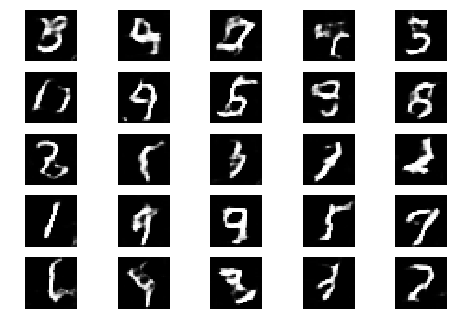

Epoch 2 Batch 901/937 [D loss: 0.685357, acc.: 56.25%] [G loss: 1.117192]
Epoch 2 Batch 902/937 [D loss: 0.588790, acc.: 71.88%] [G loss: 0.975439]
Epoch 2 Batch 903/937 [D loss: 0.878480, acc.: 37.50%] [G loss: 0.997019]
Epoch 2 Batch 904/937 [D loss: 0.679104, acc.: 62.50%] [G loss: 0.857239]
Epoch 2 Batch 905/937 [D loss: 0.739271, acc.: 53.12%] [G loss: 1.225958]
Epoch 2 Batch 906/937 [D loss: 0.639539, acc.: 56.25%] [G loss: 1.018989]
Epoch 2 Batch 907/937 [D loss: 0.822116, acc.: 46.88%] [G loss: 1.048867]
Epoch 2 Batch 908/937 [D loss: 0.686875, acc.: 53.12%] [G loss: 1.041425]
Epoch 2 Batch 909/937 [D loss: 0.748531, acc.: 46.88%] [G loss: 0.922928]


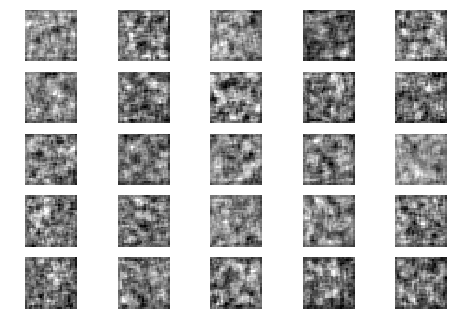

Epoch 2 Batch 910/937 [D loss: 0.697614, acc.: 56.25%] [G loss: 0.962889]
Epoch 2 Batch 911/937 [D loss: 0.710975, acc.: 56.25%] [G loss: 0.927137]
Epoch 2 Batch 912/937 [D loss: 0.642357, acc.: 68.75%] [G loss: 0.869278]
Epoch 2 Batch 913/937 [D loss: 0.485664, acc.: 81.25%] [G loss: 0.976004]
Epoch 2 Batch 914/937 [D loss: 0.573035, acc.: 68.75%] [G loss: 0.945719]
Epoch 2 Batch 915/937 [D loss: 0.738029, acc.: 50.00%] [G loss: 0.850988]
Epoch 2 Batch 916/937 [D loss: 0.734744, acc.: 46.88%] [G loss: 0.947366]
Epoch 2 Batch 917/937 [D loss: 0.611363, acc.: 62.50%] [G loss: 0.861409]
Epoch 2 Batch 918/937 [D loss: 0.614847, acc.: 65.62%] [G loss: 0.907412]


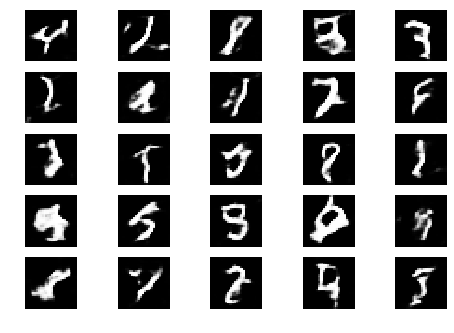

Epoch 2 Batch 919/937 [D loss: 0.642668, acc.: 65.62%] [G loss: 0.809843]
Epoch 2 Batch 920/937 [D loss: 0.591017, acc.: 71.88%] [G loss: 0.849428]
Epoch 2 Batch 921/937 [D loss: 0.662365, acc.: 62.50%] [G loss: 0.759864]
Epoch 2 Batch 922/937 [D loss: 0.506055, acc.: 81.25%] [G loss: 0.940148]
Epoch 2 Batch 923/937 [D loss: 0.651387, acc.: 62.50%] [G loss: 0.934744]
Epoch 2 Batch 924/937 [D loss: 0.594001, acc.: 62.50%] [G loss: 0.940706]
Epoch 2 Batch 925/937 [D loss: 0.673643, acc.: 53.12%] [G loss: 1.030629]
Epoch 2 Batch 926/937 [D loss: 0.597245, acc.: 71.88%] [G loss: 1.013776]
Epoch 2 Batch 927/937 [D loss: 0.715498, acc.: 53.12%] [G loss: 0.846085]
Epoch 2 Batch 928/937 [D loss: 0.671346, acc.: 50.00%] [G loss: 1.135440]
Epoch 2 Batch 929/937 [D loss: 0.552735, acc.: 75.00%] [G loss: 1.043965]
Epoch 2 Batch 930/937 [D loss: 0.671080, acc.: 53.12%] [G loss: 1.061118]
Epoch 2 Batch 931/937 [D loss: 0.756233, acc.: 46.88%] [G loss: 0.980880]
Epoch 2 Batch 932/937 [D loss: 0.83895

In [19]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1)

In [0]:
#train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=2)

In [0]:
!rm -rf generatorTrainedepoch2.h5

generator1.save('generatorTrainedepoch2.h5')



In [24]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 2 ,  loadpretrainedweights=False)


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_3 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 0.898253, acc.: 37.50%] [G loss: 0.763320]


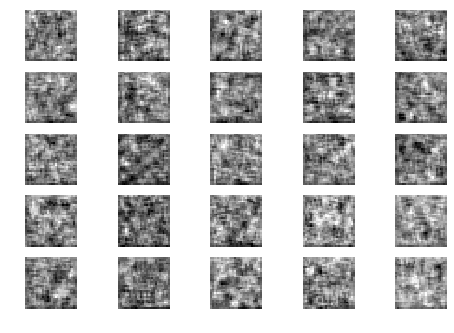

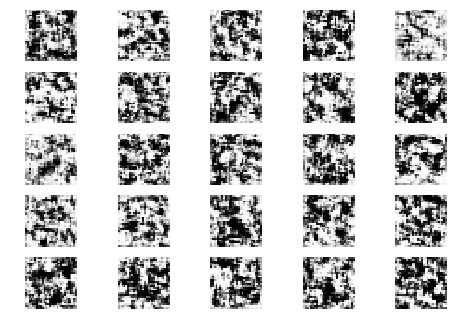

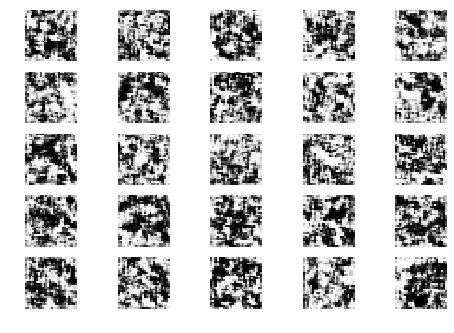

Epoch 0 Batch 1/937 [D loss: 0.532175, acc.: 81.25%] [G loss: 1.030432]
Epoch 0 Batch 2/937 [D loss: 0.445677, acc.: 81.25%] [G loss: 1.081313]
Epoch 0 Batch 3/937 [D loss: 0.367260, acc.: 90.62%] [G loss: 1.395707]
Epoch 0 Batch 4/937 [D loss: 0.308432, acc.: 87.50%] [G loss: 1.573799]
Epoch 0 Batch 5/937 [D loss: 0.267303, acc.: 96.88%] [G loss: 1.497678]
Epoch 0 Batch 6/937 [D loss: 0.307473, acc.: 87.50%] [G loss: 1.813623]
Epoch 0 Batch 7/937 [D loss: 0.361530, acc.: 90.62%] [G loss: 1.927263]
Epoch 0 Batch 8/937 [D loss: 0.302558, acc.: 87.50%] [G loss: 1.909487]
Epoch 0 Batch 9/937 [D loss: 0.282888, acc.: 90.62%] [G loss: 1.947035]
Epoch 0 Batch 10/937 [D loss: 0.284906, acc.: 90.62%] [G loss: 1.982434]
Epoch 0 Batch 11/937 [D loss: 0.399049, acc.: 75.00%] [G loss: 2.027431]
Epoch 0 Batch 12/937 [D loss: 0.202320, acc.: 90.62%] [G loss: 2.361806]
Epoch 0 Batch 13/937 [D loss: 0.163704, acc.: 96.88%] [G loss: 2.250014]
Epoch 0 Batch 14/937 [D loss: 0.333739, acc.: 87.50%] [G los

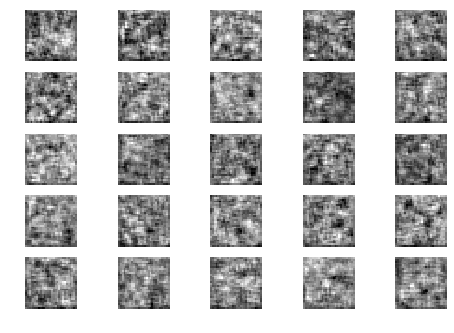

Epoch 0 Batch 101/937 [D loss: 0.722267, acc.: 62.50%] [G loss: 2.166824]


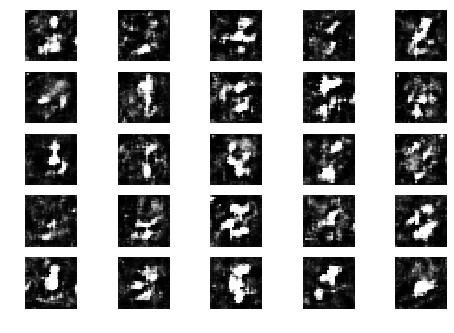

Epoch 0 Batch 102/937 [D loss: 0.519715, acc.: 75.00%] [G loss: 1.614666]


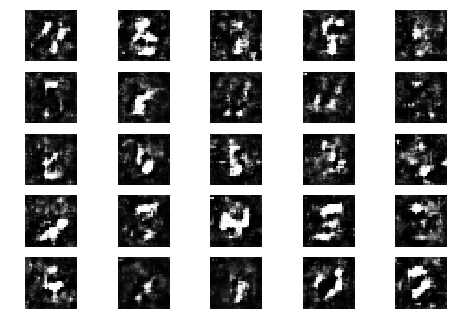

Epoch 0 Batch 103/937 [D loss: 0.672476, acc.: 62.50%] [G loss: 2.702628]
Epoch 0 Batch 104/937 [D loss: 0.776345, acc.: 62.50%] [G loss: 2.407492]
Epoch 0 Batch 105/937 [D loss: 0.898238, acc.: 53.12%] [G loss: 1.737487]
Epoch 0 Batch 106/937 [D loss: 0.717439, acc.: 65.62%] [G loss: 2.108024]
Epoch 0 Batch 107/937 [D loss: 0.506982, acc.: 75.00%] [G loss: 3.149632]
Epoch 0 Batch 108/937 [D loss: 0.982420, acc.: 46.88%] [G loss: 2.239069]
Epoch 0 Batch 109/937 [D loss: 0.816813, acc.: 59.38%] [G loss: 1.634512]
Epoch 0 Batch 110/937 [D loss: 0.553822, acc.: 68.75%] [G loss: 1.822748]
Epoch 0 Batch 111/937 [D loss: 0.636133, acc.: 71.88%] [G loss: 3.166334]
Epoch 0 Batch 112/937 [D loss: 1.134322, acc.: 56.25%] [G loss: 1.979445]
Epoch 0 Batch 113/937 [D loss: 0.446572, acc.: 78.12%] [G loss: 2.344517]
Epoch 0 Batch 114/937 [D loss: 1.068333, acc.: 50.00%] [G loss: 2.451295]
Epoch 0 Batch 115/937 [D loss: 0.821189, acc.: 53.12%] [G loss: 2.587082]
Epoch 0 Batch 116/937 [D loss: 0.56691

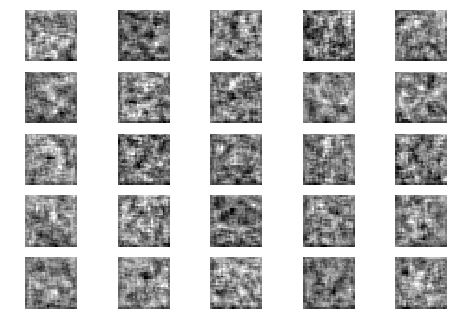

Epoch 0 Batch 201/937 [D loss: 0.746068, acc.: 56.25%] [G loss: 1.418822]
Epoch 0 Batch 202/937 [D loss: 0.860397, acc.: 50.00%] [G loss: 1.581304]


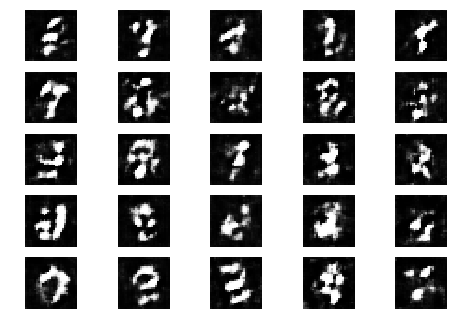

Epoch 0 Batch 203/937 [D loss: 0.730082, acc.: 59.38%] [G loss: 1.592576]
Epoch 0 Batch 204/937 [D loss: 0.971707, acc.: 37.50%] [G loss: 1.322111]


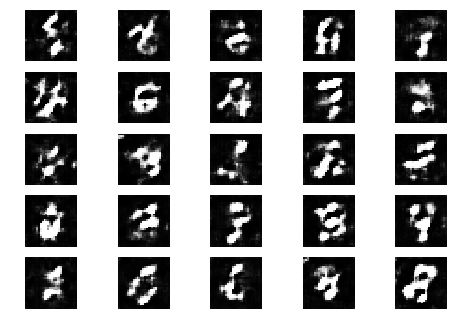

Epoch 0 Batch 205/937 [D loss: 0.810060, acc.: 43.75%] [G loss: 1.648280]
Epoch 0 Batch 206/937 [D loss: 1.023257, acc.: 46.88%] [G loss: 1.405712]
Epoch 0 Batch 207/937 [D loss: 0.821611, acc.: 50.00%] [G loss: 1.255213]
Epoch 0 Batch 208/937 [D loss: 0.836233, acc.: 46.88%] [G loss: 1.377306]
Epoch 0 Batch 209/937 [D loss: 0.686859, acc.: 56.25%] [G loss: 1.147680]
Epoch 0 Batch 210/937 [D loss: 0.618350, acc.: 68.75%] [G loss: 1.448707]
Epoch 0 Batch 211/937 [D loss: 0.857258, acc.: 53.12%] [G loss: 1.296799]
Epoch 0 Batch 212/937 [D loss: 0.670630, acc.: 56.25%] [G loss: 1.286137]
Epoch 0 Batch 213/937 [D loss: 0.637085, acc.: 71.88%] [G loss: 1.708423]
Epoch 0 Batch 214/937 [D loss: 0.743939, acc.: 59.38%] [G loss: 1.340493]
Epoch 0 Batch 215/937 [D loss: 0.921192, acc.: 56.25%] [G loss: 1.468305]
Epoch 0 Batch 216/937 [D loss: 0.584085, acc.: 65.62%] [G loss: 1.288596]
Epoch 0 Batch 217/937 [D loss: 0.886472, acc.: 46.88%] [G loss: 1.117836]
Epoch 0 Batch 218/937 [D loss: 0.67284

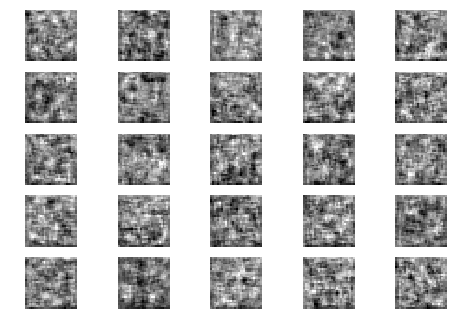

Epoch 0 Batch 301/937 [D loss: 0.647872, acc.: 65.62%] [G loss: 1.123848]
Epoch 0 Batch 302/937 [D loss: 0.855023, acc.: 40.62%] [G loss: 1.049359]
Epoch 0 Batch 303/937 [D loss: 0.547764, acc.: 81.25%] [G loss: 1.383752]


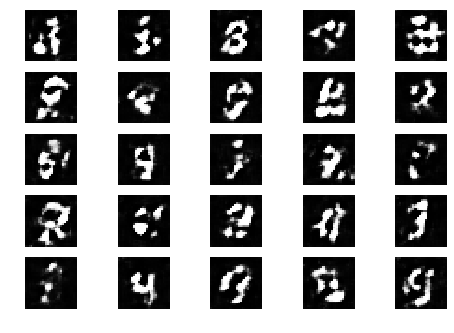

Epoch 0 Batch 304/937 [D loss: 0.747982, acc.: 62.50%] [G loss: 1.625060]
Epoch 0 Batch 305/937 [D loss: 0.887712, acc.: 34.38%] [G loss: 1.132861]
Epoch 0 Batch 306/937 [D loss: 0.701982, acc.: 62.50%] [G loss: 1.118544]


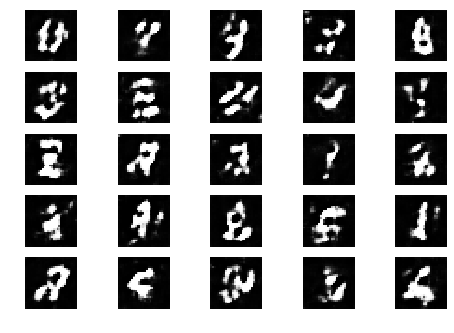

Epoch 0 Batch 307/937 [D loss: 0.637350, acc.: 59.38%] [G loss: 1.174135]
Epoch 0 Batch 308/937 [D loss: 0.750629, acc.: 68.75%] [G loss: 1.128439]
Epoch 0 Batch 309/937 [D loss: 0.747588, acc.: 37.50%] [G loss: 1.014480]
Epoch 0 Batch 310/937 [D loss: 0.637620, acc.: 59.38%] [G loss: 1.131303]
Epoch 0 Batch 311/937 [D loss: 0.453603, acc.: 84.38%] [G loss: 1.293221]
Epoch 0 Batch 312/937 [D loss: 0.617751, acc.: 65.62%] [G loss: 1.397442]
Epoch 0 Batch 313/937 [D loss: 0.525002, acc.: 75.00%] [G loss: 1.142721]
Epoch 0 Batch 314/937 [D loss: 0.841614, acc.: 53.12%] [G loss: 1.078808]
Epoch 0 Batch 315/937 [D loss: 0.637030, acc.: 65.62%] [G loss: 1.186606]
Epoch 0 Batch 316/937 [D loss: 0.713427, acc.: 59.38%] [G loss: 1.350073]
Epoch 0 Batch 317/937 [D loss: 0.799852, acc.: 53.12%] [G loss: 1.280159]
Epoch 0 Batch 318/937 [D loss: 0.730600, acc.: 62.50%] [G loss: 1.261889]
Epoch 0 Batch 319/937 [D loss: 0.771941, acc.: 59.38%] [G loss: 1.655873]
Epoch 0 Batch 320/937 [D loss: 0.78778

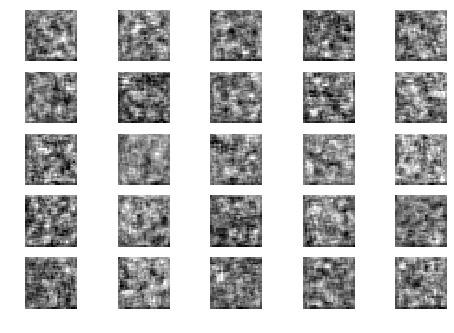

Epoch 0 Batch 401/937 [D loss: 0.958781, acc.: 40.62%] [G loss: 1.282883]
Epoch 0 Batch 402/937 [D loss: 0.541891, acc.: 68.75%] [G loss: 1.265923]
Epoch 0 Batch 403/937 [D loss: 0.725064, acc.: 53.12%] [G loss: 1.417617]
Epoch 0 Batch 404/937 [D loss: 0.686270, acc.: 62.50%] [G loss: 1.202947]


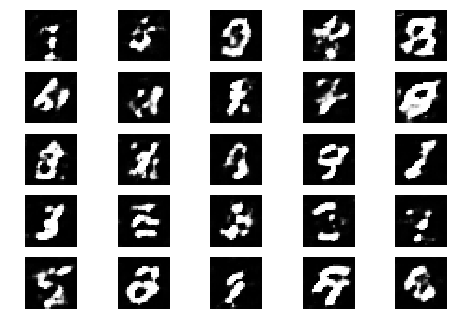

Epoch 0 Batch 405/937 [D loss: 0.732891, acc.: 62.50%] [G loss: 1.422518]
Epoch 0 Batch 406/937 [D loss: 0.885397, acc.: 43.75%] [G loss: 1.214188]
Epoch 0 Batch 407/937 [D loss: 0.761400, acc.: 59.38%] [G loss: 1.220525]
Epoch 0 Batch 408/937 [D loss: 0.606306, acc.: 68.75%] [G loss: 0.892532]


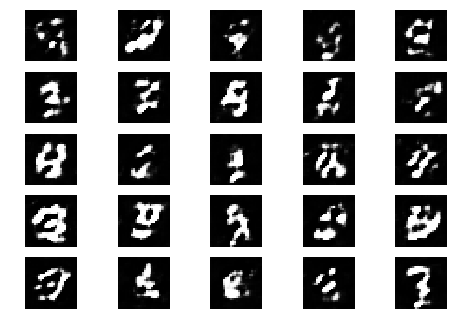

Epoch 0 Batch 409/937 [D loss: 0.734736, acc.: 43.75%] [G loss: 1.271673]
Epoch 0 Batch 410/937 [D loss: 0.597165, acc.: 68.75%] [G loss: 1.259163]
Epoch 0 Batch 411/937 [D loss: 0.661816, acc.: 56.25%] [G loss: 1.299648]
Epoch 0 Batch 412/937 [D loss: 1.000269, acc.: 40.62%] [G loss: 1.181288]
Epoch 0 Batch 413/937 [D loss: 0.760909, acc.: 56.25%] [G loss: 1.266571]
Epoch 0 Batch 414/937 [D loss: 0.635820, acc.: 62.50%] [G loss: 1.012156]
Epoch 0 Batch 415/937 [D loss: 0.773040, acc.: 56.25%] [G loss: 1.131132]
Epoch 0 Batch 416/937 [D loss: 0.764050, acc.: 50.00%] [G loss: 1.193744]
Epoch 0 Batch 417/937 [D loss: 0.661506, acc.: 56.25%] [G loss: 1.530199]
Epoch 0 Batch 418/937 [D loss: 0.808963, acc.: 37.50%] [G loss: 0.850936]
Epoch 0 Batch 419/937 [D loss: 0.784869, acc.: 56.25%] [G loss: 0.927276]
Epoch 0 Batch 420/937 [D loss: 0.630144, acc.: 62.50%] [G loss: 1.092278]
Epoch 0 Batch 421/937 [D loss: 0.771963, acc.: 65.62%] [G loss: 0.931558]
Epoch 0 Batch 422/937 [D loss: 0.56127

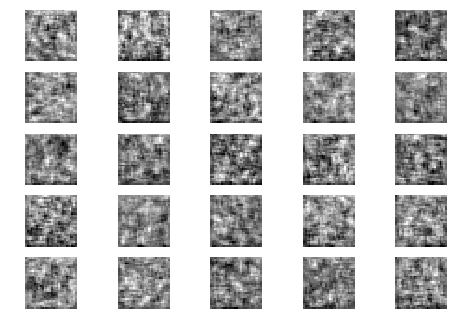

Epoch 0 Batch 501/937 [D loss: 0.700292, acc.: 59.38%] [G loss: 1.610698]
Epoch 0 Batch 502/937 [D loss: 0.770994, acc.: 46.88%] [G loss: 1.103658]
Epoch 0 Batch 503/937 [D loss: 0.595915, acc.: 71.88%] [G loss: 1.318027]
Epoch 0 Batch 504/937 [D loss: 0.642969, acc.: 65.62%] [G loss: 1.486790]
Epoch 0 Batch 505/937 [D loss: 0.520613, acc.: 71.88%] [G loss: 1.187428]


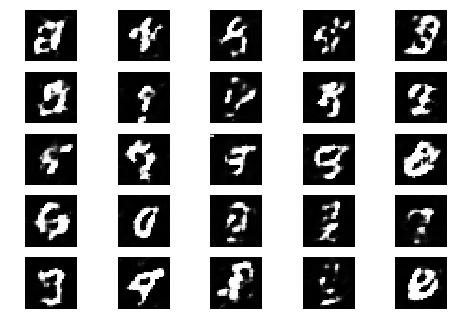

Epoch 0 Batch 506/937 [D loss: 0.813428, acc.: 56.25%] [G loss: 1.210503]
Epoch 0 Batch 507/937 [D loss: 0.860322, acc.: 50.00%] [G loss: 1.092391]
Epoch 0 Batch 508/937 [D loss: 0.554211, acc.: 68.75%] [G loss: 1.276652]
Epoch 0 Batch 509/937 [D loss: 0.617657, acc.: 53.12%] [G loss: 1.151242]
Epoch 0 Batch 510/937 [D loss: 0.718745, acc.: 59.38%] [G loss: 1.191139]


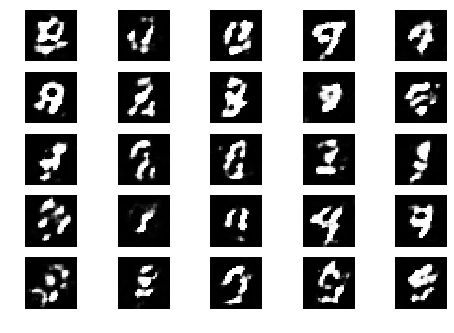

Epoch 0 Batch 511/937 [D loss: 0.695095, acc.: 59.38%] [G loss: 1.518588]
Epoch 0 Batch 512/937 [D loss: 0.553533, acc.: 65.62%] [G loss: 1.514292]
Epoch 0 Batch 513/937 [D loss: 0.730995, acc.: 50.00%] [G loss: 1.415360]
Epoch 0 Batch 514/937 [D loss: 0.492773, acc.: 78.12%] [G loss: 1.279320]
Epoch 0 Batch 515/937 [D loss: 0.835139, acc.: 50.00%] [G loss: 1.113860]
Epoch 0 Batch 516/937 [D loss: 0.522397, acc.: 68.75%] [G loss: 1.109343]
Epoch 0 Batch 517/937 [D loss: 0.704003, acc.: 56.25%] [G loss: 1.064141]
Epoch 0 Batch 518/937 [D loss: 0.524166, acc.: 75.00%] [G loss: 1.034634]
Epoch 0 Batch 519/937 [D loss: 0.540889, acc.: 65.62%] [G loss: 1.194130]
Epoch 0 Batch 520/937 [D loss: 0.479664, acc.: 75.00%] [G loss: 1.644791]
Epoch 0 Batch 521/937 [D loss: 0.630654, acc.: 65.62%] [G loss: 1.056672]
Epoch 0 Batch 522/937 [D loss: 0.733640, acc.: 56.25%] [G loss: 1.275440]
Epoch 0 Batch 523/937 [D loss: 0.746487, acc.: 53.12%] [G loss: 1.174557]
Epoch 0 Batch 524/937 [D loss: 0.68995

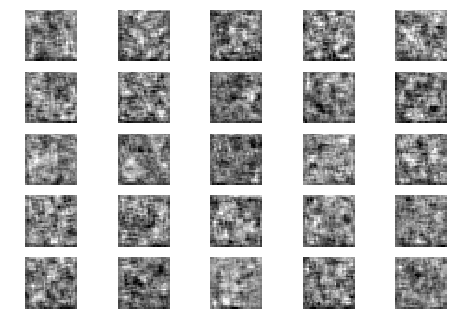

Epoch 0 Batch 601/937 [D loss: 0.656711, acc.: 56.25%] [G loss: 1.112621]
Epoch 0 Batch 602/937 [D loss: 0.694022, acc.: 59.38%] [G loss: 1.302629]
Epoch 0 Batch 603/937 [D loss: 0.757365, acc.: 50.00%] [G loss: 1.642733]
Epoch 0 Batch 604/937 [D loss: 0.819705, acc.: 53.12%] [G loss: 1.576471]
Epoch 0 Batch 605/937 [D loss: 0.899109, acc.: 50.00%] [G loss: 0.985139]
Epoch 0 Batch 606/937 [D loss: 0.903448, acc.: 40.62%] [G loss: 1.251817]


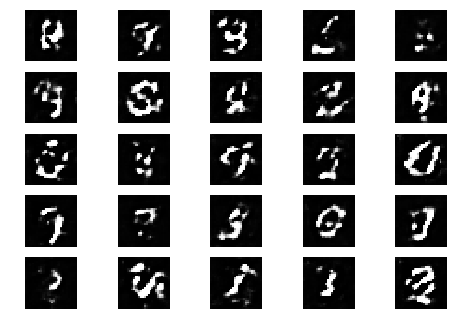

Epoch 0 Batch 607/937 [D loss: 0.724784, acc.: 53.12%] [G loss: 1.191959]
Epoch 0 Batch 608/937 [D loss: 0.758741, acc.: 53.12%] [G loss: 1.279383]
Epoch 0 Batch 609/937 [D loss: 0.705356, acc.: 62.50%] [G loss: 1.052602]
Epoch 0 Batch 610/937 [D loss: 0.599200, acc.: 62.50%] [G loss: 1.321144]
Epoch 0 Batch 611/937 [D loss: 0.547565, acc.: 71.88%] [G loss: 1.388127]
Epoch 0 Batch 612/937 [D loss: 0.637129, acc.: 62.50%] [G loss: 1.266168]


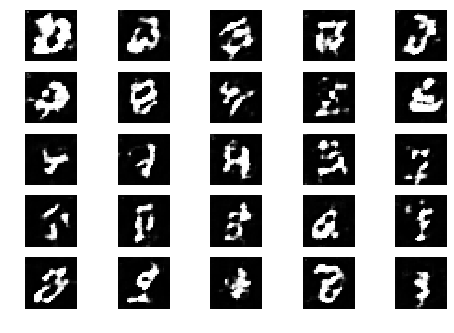

Epoch 0 Batch 613/937 [D loss: 0.661752, acc.: 59.38%] [G loss: 1.344762]
Epoch 0 Batch 614/937 [D loss: 0.698644, acc.: 50.00%] [G loss: 1.199868]
Epoch 0 Batch 615/937 [D loss: 0.697811, acc.: 59.38%] [G loss: 1.234011]
Epoch 0 Batch 616/937 [D loss: 0.901787, acc.: 46.88%] [G loss: 1.007826]
Epoch 0 Batch 617/937 [D loss: 0.675303, acc.: 59.38%] [G loss: 1.428285]
Epoch 0 Batch 618/937 [D loss: 0.695586, acc.: 59.38%] [G loss: 1.067035]
Epoch 0 Batch 619/937 [D loss: 0.622773, acc.: 65.62%] [G loss: 1.037869]
Epoch 0 Batch 620/937 [D loss: 0.721855, acc.: 59.38%] [G loss: 0.996204]
Epoch 0 Batch 621/937 [D loss: 0.558574, acc.: 68.75%] [G loss: 1.224259]
Epoch 0 Batch 622/937 [D loss: 0.493156, acc.: 84.38%] [G loss: 1.471990]
Epoch 0 Batch 623/937 [D loss: 0.703613, acc.: 59.38%] [G loss: 1.098715]
Epoch 0 Batch 624/937 [D loss: 0.590669, acc.: 75.00%] [G loss: 1.272845]
Epoch 0 Batch 625/937 [D loss: 0.925940, acc.: 40.62%] [G loss: 1.180319]
Epoch 0 Batch 626/937 [D loss: 0.55358

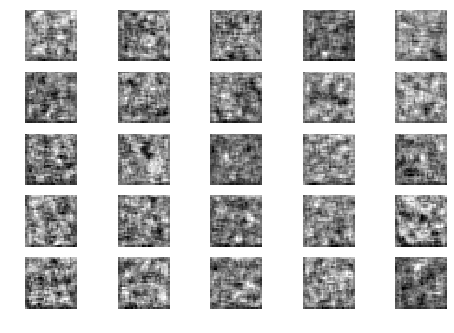

Epoch 0 Batch 701/937 [D loss: 0.565009, acc.: 71.88%] [G loss: 1.449887]
Epoch 0 Batch 702/937 [D loss: 0.685573, acc.: 71.88%] [G loss: 1.199445]
Epoch 0 Batch 703/937 [D loss: 0.772206, acc.: 56.25%] [G loss: 1.048719]
Epoch 0 Batch 704/937 [D loss: 0.697784, acc.: 59.38%] [G loss: 1.226708]
Epoch 0 Batch 705/937 [D loss: 0.711954, acc.: 65.62%] [G loss: 1.344632]
Epoch 0 Batch 706/937 [D loss: 0.770838, acc.: 53.12%] [G loss: 1.607069]
Epoch 0 Batch 707/937 [D loss: 0.606950, acc.: 71.88%] [G loss: 1.239197]


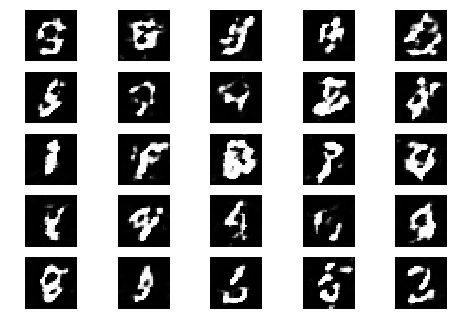

Epoch 0 Batch 708/937 [D loss: 0.825638, acc.: 46.88%] [G loss: 1.070243]
Epoch 0 Batch 709/937 [D loss: 0.725353, acc.: 56.25%] [G loss: 0.897192]
Epoch 0 Batch 710/937 [D loss: 0.576441, acc.: 71.88%] [G loss: 1.293894]
Epoch 0 Batch 711/937 [D loss: 0.490409, acc.: 78.12%] [G loss: 1.149820]
Epoch 0 Batch 712/937 [D loss: 0.965048, acc.: 43.75%] [G loss: 1.241916]
Epoch 0 Batch 713/937 [D loss: 0.507263, acc.: 75.00%] [G loss: 1.190919]
Epoch 0 Batch 714/937 [D loss: 0.864526, acc.: 50.00%] [G loss: 1.066109]


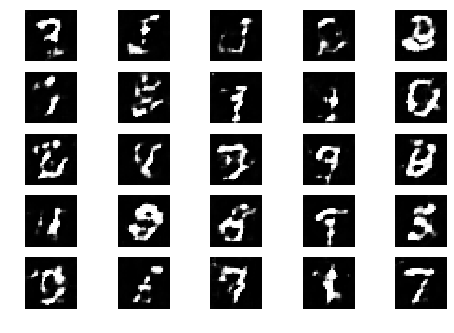

Epoch 0 Batch 715/937 [D loss: 0.748611, acc.: 46.88%] [G loss: 1.317619]
Epoch 0 Batch 716/937 [D loss: 0.657902, acc.: 65.62%] [G loss: 1.488402]
Epoch 0 Batch 717/937 [D loss: 0.691301, acc.: 62.50%] [G loss: 1.150421]
Epoch 0 Batch 718/937 [D loss: 0.622076, acc.: 62.50%] [G loss: 1.357844]
Epoch 0 Batch 719/937 [D loss: 0.710346, acc.: 56.25%] [G loss: 1.372860]
Epoch 0 Batch 720/937 [D loss: 0.605425, acc.: 59.38%] [G loss: 1.383430]
Epoch 0 Batch 721/937 [D loss: 0.803307, acc.: 43.75%] [G loss: 1.322947]
Epoch 0 Batch 722/937 [D loss: 0.543429, acc.: 84.38%] [G loss: 1.278728]
Epoch 0 Batch 723/937 [D loss: 0.730716, acc.: 62.50%] [G loss: 1.070107]
Epoch 0 Batch 724/937 [D loss: 0.665029, acc.: 71.88%] [G loss: 1.015648]
Epoch 0 Batch 725/937 [D loss: 0.598016, acc.: 75.00%] [G loss: 1.150271]
Epoch 0 Batch 726/937 [D loss: 0.727838, acc.: 53.12%] [G loss: 1.258652]
Epoch 0 Batch 727/937 [D loss: 0.602284, acc.: 62.50%] [G loss: 1.462253]
Epoch 0 Batch 728/937 [D loss: 0.56373

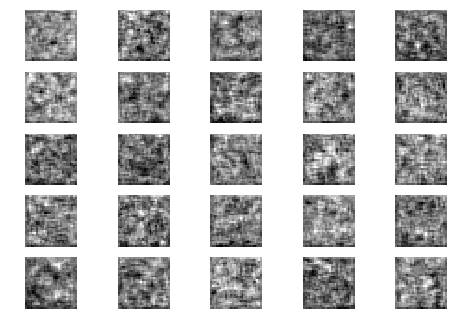

Epoch 0 Batch 801/937 [D loss: 0.645244, acc.: 56.25%] [G loss: 1.312773]
Epoch 0 Batch 802/937 [D loss: 0.733720, acc.: 53.12%] [G loss: 1.385619]
Epoch 0 Batch 803/937 [D loss: 0.621364, acc.: 65.62%] [G loss: 1.428334]
Epoch 0 Batch 804/937 [D loss: 0.557265, acc.: 68.75%] [G loss: 1.440078]
Epoch 0 Batch 805/937 [D loss: 0.731519, acc.: 53.12%] [G loss: 1.215167]
Epoch 0 Batch 806/937 [D loss: 0.601292, acc.: 71.88%] [G loss: 1.342604]
Epoch 0 Batch 807/937 [D loss: 0.831932, acc.: 50.00%] [G loss: 1.352489]
Epoch 0 Batch 808/937 [D loss: 0.498717, acc.: 78.12%] [G loss: 1.520133]


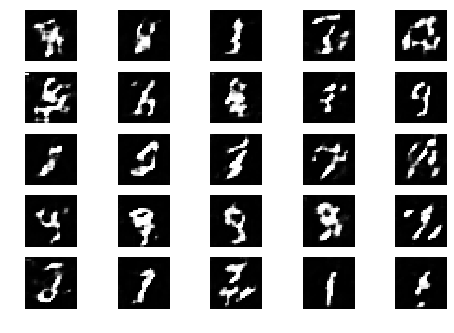

Epoch 0 Batch 809/937 [D loss: 0.820666, acc.: 43.75%] [G loss: 1.146152]
Epoch 0 Batch 810/937 [D loss: 0.737861, acc.: 62.50%] [G loss: 1.001006]
Epoch 0 Batch 811/937 [D loss: 0.685619, acc.: 59.38%] [G loss: 1.026251]
Epoch 0 Batch 812/937 [D loss: 0.509441, acc.: 78.12%] [G loss: 1.143085]
Epoch 0 Batch 813/937 [D loss: 0.641115, acc.: 65.62%] [G loss: 1.064993]
Epoch 0 Batch 814/937 [D loss: 0.634049, acc.: 65.62%] [G loss: 1.365199]
Epoch 0 Batch 815/937 [D loss: 0.584900, acc.: 68.75%] [G loss: 1.315979]
Epoch 0 Batch 816/937 [D loss: 0.891044, acc.: 50.00%] [G loss: 1.349051]


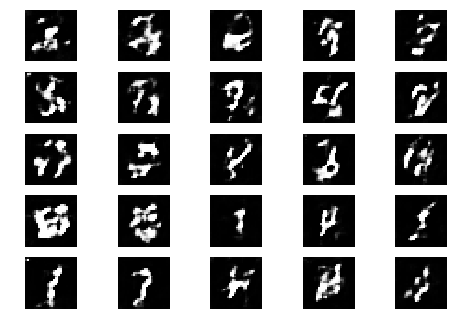

Epoch 0 Batch 817/937 [D loss: 0.621536, acc.: 65.62%] [G loss: 1.065889]
Epoch 0 Batch 818/937 [D loss: 0.618804, acc.: 65.62%] [G loss: 1.157905]
Epoch 0 Batch 819/937 [D loss: 0.678545, acc.: 65.62%] [G loss: 1.563753]
Epoch 0 Batch 820/937 [D loss: 0.803349, acc.: 59.38%] [G loss: 1.141040]
Epoch 0 Batch 821/937 [D loss: 0.557136, acc.: 68.75%] [G loss: 1.216229]
Epoch 0 Batch 822/937 [D loss: 0.616018, acc.: 65.62%] [G loss: 1.098556]
Epoch 0 Batch 823/937 [D loss: 0.544956, acc.: 71.88%] [G loss: 1.211976]
Epoch 0 Batch 824/937 [D loss: 0.574463, acc.: 68.75%] [G loss: 1.090945]
Epoch 0 Batch 825/937 [D loss: 0.606825, acc.: 65.62%] [G loss: 1.148317]
Epoch 0 Batch 826/937 [D loss: 0.640853, acc.: 56.25%] [G loss: 1.463844]
Epoch 0 Batch 827/937 [D loss: 0.608245, acc.: 75.00%] [G loss: 1.050504]
Epoch 0 Batch 828/937 [D loss: 0.602130, acc.: 68.75%] [G loss: 1.021131]
Epoch 0 Batch 829/937 [D loss: 0.501435, acc.: 78.12%] [G loss: 1.416589]
Epoch 0 Batch 830/937 [D loss: 0.51296

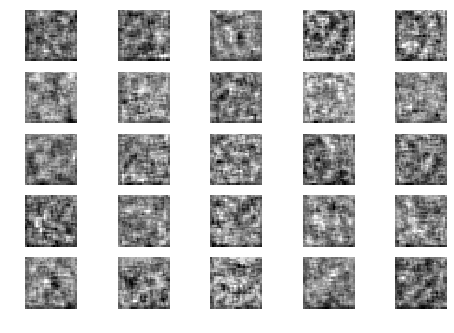

Epoch 0 Batch 901/937 [D loss: 0.584763, acc.: 75.00%] [G loss: 0.999285]
Epoch 0 Batch 902/937 [D loss: 0.737274, acc.: 46.88%] [G loss: 1.138852]
Epoch 0 Batch 903/937 [D loss: 0.771492, acc.: 50.00%] [G loss: 1.236995]
Epoch 0 Batch 904/937 [D loss: 0.864399, acc.: 34.38%] [G loss: 1.403315]
Epoch 0 Batch 905/937 [D loss: 0.649345, acc.: 65.62%] [G loss: 1.298813]
Epoch 0 Batch 906/937 [D loss: 0.680003, acc.: 62.50%] [G loss: 1.166242]
Epoch 0 Batch 907/937 [D loss: 0.653229, acc.: 59.38%] [G loss: 1.492763]
Epoch 0 Batch 908/937 [D loss: 0.703675, acc.: 65.62%] [G loss: 1.092724]
Epoch 0 Batch 909/937 [D loss: 0.616855, acc.: 65.62%] [G loss: 1.318535]


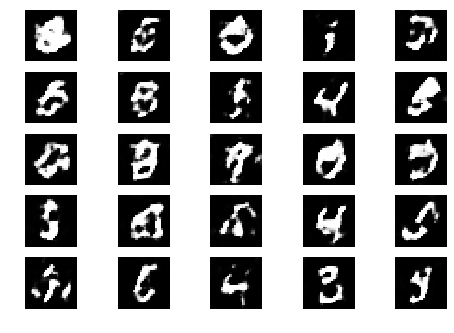

Epoch 0 Batch 910/937 [D loss: 0.838238, acc.: 46.88%] [G loss: 1.227122]
Epoch 0 Batch 911/937 [D loss: 0.666997, acc.: 65.62%] [G loss: 1.049850]
Epoch 0 Batch 912/937 [D loss: 0.646543, acc.: 56.25%] [G loss: 1.412422]
Epoch 0 Batch 913/937 [D loss: 0.643378, acc.: 53.12%] [G loss: 1.112362]
Epoch 0 Batch 914/937 [D loss: 0.760924, acc.: 53.12%] [G loss: 1.125887]
Epoch 0 Batch 915/937 [D loss: 0.654804, acc.: 62.50%] [G loss: 1.363440]
Epoch 0 Batch 916/937 [D loss: 0.715055, acc.: 59.38%] [G loss: 1.094669]
Epoch 0 Batch 917/937 [D loss: 0.707627, acc.: 50.00%] [G loss: 1.440542]
Epoch 0 Batch 918/937 [D loss: 0.701871, acc.: 59.38%] [G loss: 1.504234]


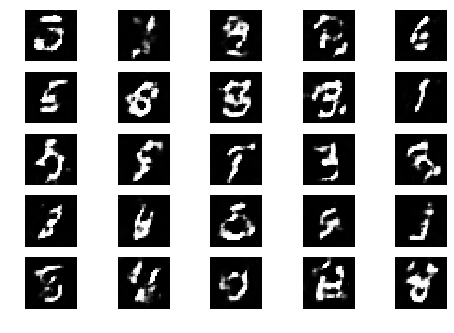

Epoch 0 Batch 919/937 [D loss: 0.794564, acc.: 40.62%] [G loss: 1.250729]
Epoch 0 Batch 920/937 [D loss: 0.733812, acc.: 56.25%] [G loss: 1.258557]
Epoch 0 Batch 921/937 [D loss: 0.761401, acc.: 43.75%] [G loss: 1.043575]
Epoch 0 Batch 922/937 [D loss: 0.807716, acc.: 46.88%] [G loss: 0.994831]
Epoch 0 Batch 923/937 [D loss: 0.598454, acc.: 65.62%] [G loss: 1.320088]
Epoch 0 Batch 924/937 [D loss: 0.723975, acc.: 59.38%] [G loss: 1.389193]
Epoch 0 Batch 925/937 [D loss: 0.710626, acc.: 53.12%] [G loss: 1.272066]
Epoch 0 Batch 926/937 [D loss: 0.646822, acc.: 56.25%] [G loss: 1.225543]
Epoch 0 Batch 927/937 [D loss: 0.502916, acc.: 84.38%] [G loss: 1.479603]
Epoch 0 Batch 928/937 [D loss: 0.760913, acc.: 46.88%] [G loss: 1.200724]
Epoch 0 Batch 929/937 [D loss: 0.590170, acc.: 68.75%] [G loss: 1.299851]
Epoch 0 Batch 930/937 [D loss: 0.823603, acc.: 50.00%] [G loss: 1.056160]
Epoch 0 Batch 931/937 [D loss: 0.849913, acc.: 40.62%] [G loss: 1.059518]
Epoch 0 Batch 932/937 [D loss: 0.54556

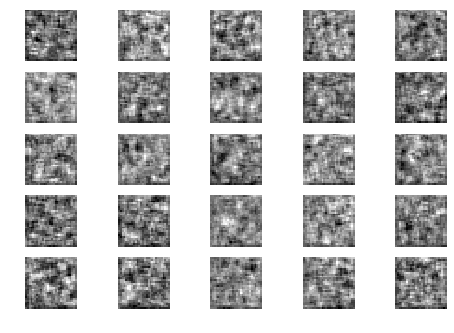

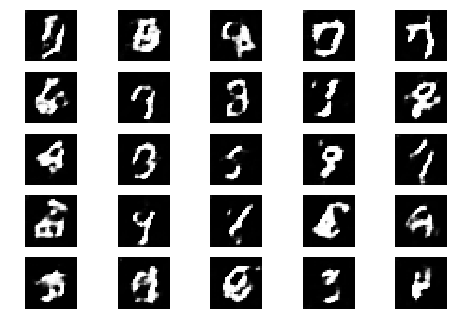

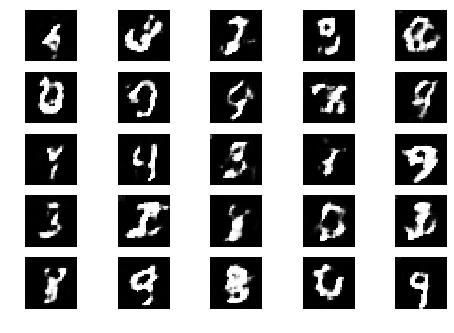

Epoch 1 Batch 1/937 [D loss: 0.518916, acc.: 71.88%] [G loss: 1.344419]
Epoch 1 Batch 2/937 [D loss: 0.526689, acc.: 71.88%] [G loss: 1.239476]
Epoch 1 Batch 3/937 [D loss: 0.685905, acc.: 59.38%] [G loss: 1.348591]
Epoch 1 Batch 4/937 [D loss: 0.552878, acc.: 68.75%] [G loss: 1.319830]
Epoch 1 Batch 5/937 [D loss: 0.704388, acc.: 53.12%] [G loss: 0.929530]
Epoch 1 Batch 6/937 [D loss: 0.630219, acc.: 71.88%] [G loss: 1.159869]
Epoch 1 Batch 7/937 [D loss: 0.698461, acc.: 59.38%] [G loss: 1.219483]
Epoch 1 Batch 8/937 [D loss: 0.625588, acc.: 62.50%] [G loss: 1.211726]
Epoch 1 Batch 9/937 [D loss: 0.663442, acc.: 56.25%] [G loss: 1.256481]
Epoch 1 Batch 10/937 [D loss: 0.772235, acc.: 46.88%] [G loss: 1.105276]
Epoch 1 Batch 11/937 [D loss: 0.717789, acc.: 59.38%] [G loss: 1.153589]
Epoch 1 Batch 12/937 [D loss: 0.568419, acc.: 65.62%] [G loss: 1.417031]
Epoch 1 Batch 13/937 [D loss: 0.541756, acc.: 78.12%] [G loss: 1.129319]
Epoch 1 Batch 14/937 [D loss: 0.795164, acc.: 50.00%] [G los

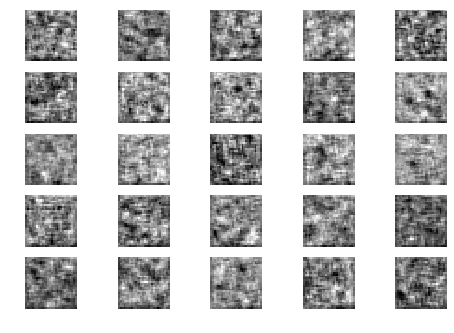

Epoch 1 Batch 101/937 [D loss: 0.574846, acc.: 68.75%] [G loss: 1.083385]


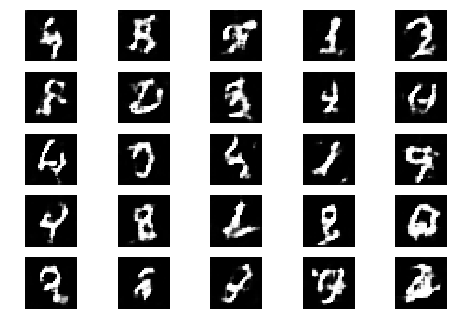

Epoch 1 Batch 102/937 [D loss: 0.693798, acc.: 59.38%] [G loss: 1.115236]


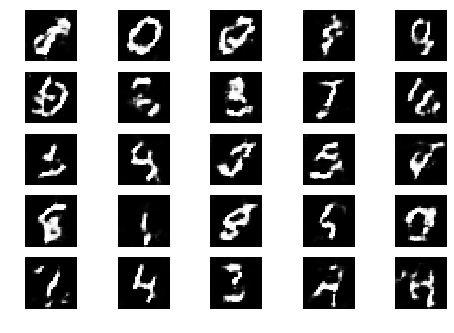

Epoch 1 Batch 103/937 [D loss: 0.713016, acc.: 59.38%] [G loss: 1.031905]
Epoch 1 Batch 104/937 [D loss: 0.790296, acc.: 59.38%] [G loss: 1.311581]
Epoch 1 Batch 105/937 [D loss: 0.834371, acc.: 40.62%] [G loss: 1.034529]
Epoch 1 Batch 106/937 [D loss: 0.726627, acc.: 56.25%] [G loss: 0.979616]
Epoch 1 Batch 107/937 [D loss: 0.622999, acc.: 71.88%] [G loss: 1.456402]
Epoch 1 Batch 108/937 [D loss: 0.654653, acc.: 46.88%] [G loss: 1.040615]
Epoch 1 Batch 109/937 [D loss: 0.862279, acc.: 53.12%] [G loss: 1.066515]
Epoch 1 Batch 110/937 [D loss: 0.583471, acc.: 68.75%] [G loss: 1.355564]
Epoch 1 Batch 111/937 [D loss: 0.766947, acc.: 50.00%] [G loss: 1.129727]
Epoch 1 Batch 112/937 [D loss: 0.772693, acc.: 46.88%] [G loss: 1.282403]
Epoch 1 Batch 113/937 [D loss: 0.613343, acc.: 62.50%] [G loss: 1.238617]
Epoch 1 Batch 114/937 [D loss: 0.549115, acc.: 68.75%] [G loss: 1.193664]
Epoch 1 Batch 115/937 [D loss: 0.471002, acc.: 81.25%] [G loss: 1.121400]
Epoch 1 Batch 116/937 [D loss: 0.54432

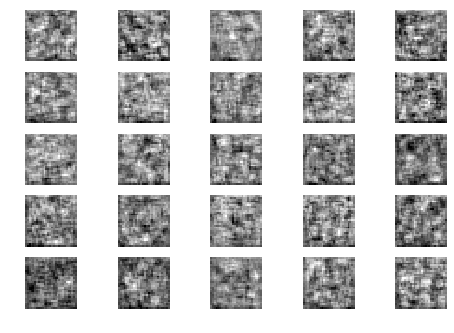

Epoch 1 Batch 201/937 [D loss: 0.720702, acc.: 56.25%] [G loss: 1.218930]
Epoch 1 Batch 202/937 [D loss: 0.587270, acc.: 71.88%] [G loss: 1.215297]


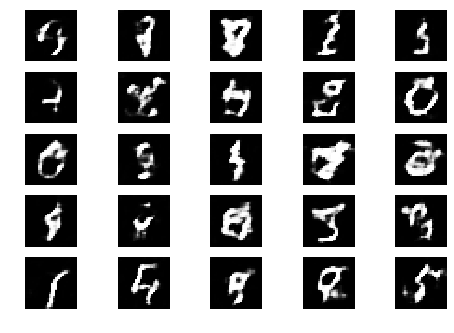

Epoch 1 Batch 203/937 [D loss: 0.573900, acc.: 78.12%] [G loss: 1.044458]
Epoch 1 Batch 204/937 [D loss: 0.591125, acc.: 59.38%] [G loss: 1.088578]


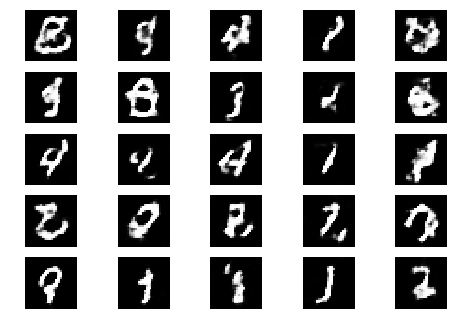

Epoch 1 Batch 205/937 [D loss: 0.693996, acc.: 56.25%] [G loss: 1.170833]
Epoch 1 Batch 206/937 [D loss: 0.822821, acc.: 53.12%] [G loss: 1.196290]
Epoch 1 Batch 207/937 [D loss: 0.819858, acc.: 50.00%] [G loss: 1.118676]
Epoch 1 Batch 208/937 [D loss: 0.556762, acc.: 65.62%] [G loss: 1.055904]
Epoch 1 Batch 209/937 [D loss: 0.477253, acc.: 81.25%] [G loss: 1.065585]
Epoch 1 Batch 210/937 [D loss: 0.556364, acc.: 68.75%] [G loss: 0.992529]
Epoch 1 Batch 211/937 [D loss: 0.715846, acc.: 53.12%] [G loss: 1.069275]
Epoch 1 Batch 212/937 [D loss: 0.595146, acc.: 71.88%] [G loss: 0.949523]
Epoch 1 Batch 213/937 [D loss: 0.758541, acc.: 46.88%] [G loss: 1.239972]
Epoch 1 Batch 214/937 [D loss: 0.660742, acc.: 65.62%] [G loss: 1.153605]
Epoch 1 Batch 215/937 [D loss: 0.579463, acc.: 68.75%] [G loss: 0.911095]
Epoch 1 Batch 216/937 [D loss: 0.494387, acc.: 78.12%] [G loss: 1.160119]
Epoch 1 Batch 217/937 [D loss: 0.674346, acc.: 56.25%] [G loss: 0.941342]
Epoch 1 Batch 218/937 [D loss: 0.88084

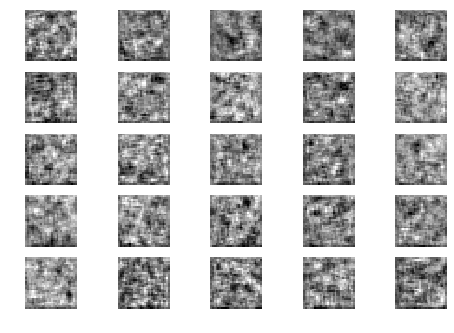

Epoch 1 Batch 301/937 [D loss: 0.646135, acc.: 59.38%] [G loss: 1.030171]
Epoch 1 Batch 302/937 [D loss: 0.907233, acc.: 37.50%] [G loss: 1.039515]
Epoch 1 Batch 303/937 [D loss: 0.640943, acc.: 59.38%] [G loss: 0.861954]


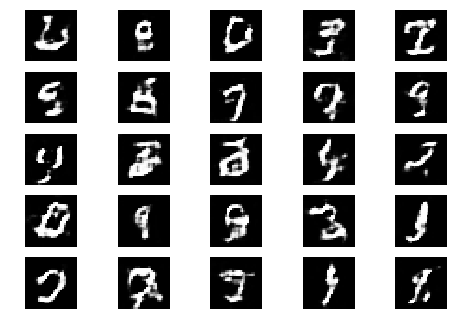

Epoch 1 Batch 304/937 [D loss: 0.658512, acc.: 68.75%] [G loss: 1.090640]
Epoch 1 Batch 305/937 [D loss: 0.745814, acc.: 59.38%] [G loss: 1.085345]
Epoch 1 Batch 306/937 [D loss: 0.789012, acc.: 56.25%] [G loss: 0.932610]


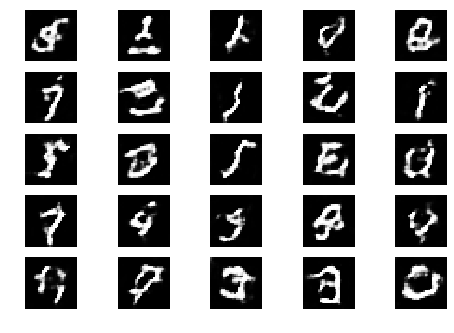

Epoch 1 Batch 307/937 [D loss: 0.671594, acc.: 62.50%] [G loss: 0.770823]
Epoch 1 Batch 308/937 [D loss: 0.772027, acc.: 46.88%] [G loss: 1.048206]
Epoch 1 Batch 309/937 [D loss: 0.645288, acc.: 62.50%] [G loss: 0.860988]
Epoch 1 Batch 310/937 [D loss: 0.647965, acc.: 59.38%] [G loss: 0.964351]
Epoch 1 Batch 311/937 [D loss: 0.791992, acc.: 53.12%] [G loss: 0.940651]
Epoch 1 Batch 312/937 [D loss: 0.619459, acc.: 59.38%] [G loss: 0.869523]
Epoch 1 Batch 313/937 [D loss: 0.713548, acc.: 56.25%] [G loss: 1.108831]
Epoch 1 Batch 314/937 [D loss: 0.571966, acc.: 78.12%] [G loss: 1.208439]
Epoch 1 Batch 315/937 [D loss: 0.683884, acc.: 50.00%] [G loss: 1.259777]
Epoch 1 Batch 316/937 [D loss: 0.698695, acc.: 62.50%] [G loss: 1.050520]
Epoch 1 Batch 317/937 [D loss: 0.652924, acc.: 62.50%] [G loss: 1.150190]
Epoch 1 Batch 318/937 [D loss: 0.560005, acc.: 65.62%] [G loss: 1.263250]
Epoch 1 Batch 319/937 [D loss: 0.561980, acc.: 75.00%] [G loss: 1.176819]
Epoch 1 Batch 320/937 [D loss: 0.52973

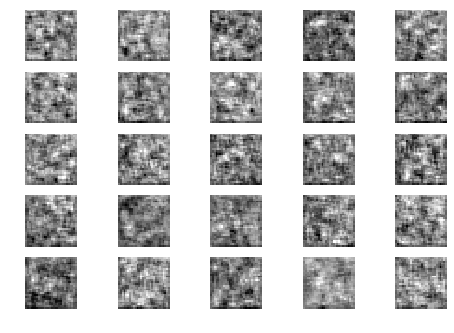

Epoch 1 Batch 401/937 [D loss: 0.883153, acc.: 40.62%] [G loss: 0.863562]
Epoch 1 Batch 402/937 [D loss: 0.682927, acc.: 53.12%] [G loss: 0.767034]
Epoch 1 Batch 403/937 [D loss: 0.625319, acc.: 71.88%] [G loss: 0.944644]
Epoch 1 Batch 404/937 [D loss: 0.795109, acc.: 53.12%] [G loss: 1.066126]


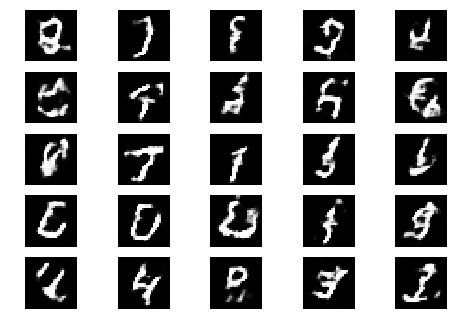

Epoch 1 Batch 405/937 [D loss: 0.691933, acc.: 56.25%] [G loss: 1.015429]
Epoch 1 Batch 406/937 [D loss: 0.700966, acc.: 62.50%] [G loss: 1.369670]
Epoch 1 Batch 407/937 [D loss: 0.570444, acc.: 65.62%] [G loss: 1.263137]
Epoch 1 Batch 408/937 [D loss: 0.699225, acc.: 50.00%] [G loss: 1.347830]


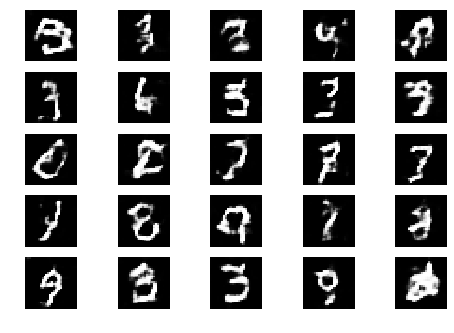

Epoch 1 Batch 409/937 [D loss: 0.670486, acc.: 59.38%] [G loss: 1.302815]
Epoch 1 Batch 410/937 [D loss: 0.864939, acc.: 34.38%] [G loss: 1.254973]
Epoch 1 Batch 411/937 [D loss: 0.577644, acc.: 65.62%] [G loss: 1.265277]
Epoch 1 Batch 412/937 [D loss: 0.578907, acc.: 71.88%] [G loss: 1.045553]
Epoch 1 Batch 413/937 [D loss: 0.705584, acc.: 53.12%] [G loss: 1.257715]
Epoch 1 Batch 414/937 [D loss: 0.711411, acc.: 59.38%] [G loss: 1.051255]
Epoch 1 Batch 415/937 [D loss: 0.786469, acc.: 56.25%] [G loss: 1.194723]
Epoch 1 Batch 416/937 [D loss: 0.562166, acc.: 75.00%] [G loss: 1.132653]
Epoch 1 Batch 417/937 [D loss: 0.566054, acc.: 78.12%] [G loss: 1.484018]
Epoch 1 Batch 418/937 [D loss: 0.735308, acc.: 53.12%] [G loss: 0.845031]
Epoch 1 Batch 419/937 [D loss: 0.487448, acc.: 75.00%] [G loss: 1.106996]
Epoch 1 Batch 420/937 [D loss: 0.621735, acc.: 65.62%] [G loss: 1.023361]
Epoch 1 Batch 421/937 [D loss: 0.556644, acc.: 75.00%] [G loss: 1.221999]
Epoch 1 Batch 422/937 [D loss: 0.71479

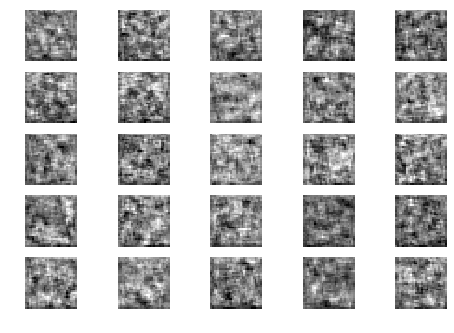

Epoch 1 Batch 501/937 [D loss: 0.714522, acc.: 50.00%] [G loss: 1.168111]
Epoch 1 Batch 502/937 [D loss: 0.761356, acc.: 50.00%] [G loss: 1.072545]
Epoch 1 Batch 503/937 [D loss: 0.692418, acc.: 56.25%] [G loss: 1.005818]
Epoch 1 Batch 504/937 [D loss: 0.612709, acc.: 65.62%] [G loss: 0.992176]
Epoch 1 Batch 505/937 [D loss: 0.760241, acc.: 50.00%] [G loss: 1.163839]


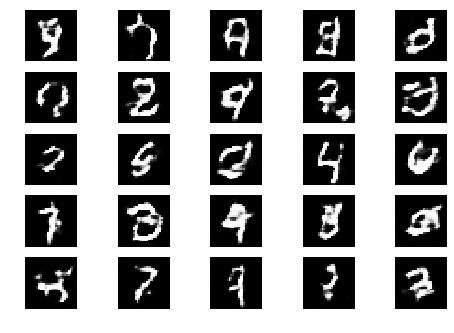

Epoch 1 Batch 506/937 [D loss: 0.676978, acc.: 71.88%] [G loss: 0.890142]
Epoch 1 Batch 507/937 [D loss: 0.833856, acc.: 50.00%] [G loss: 1.054601]
Epoch 1 Batch 508/937 [D loss: 0.719253, acc.: 53.12%] [G loss: 1.053221]
Epoch 1 Batch 509/937 [D loss: 0.755911, acc.: 50.00%] [G loss: 1.193928]
Epoch 1 Batch 510/937 [D loss: 0.700189, acc.: 62.50%] [G loss: 1.249423]


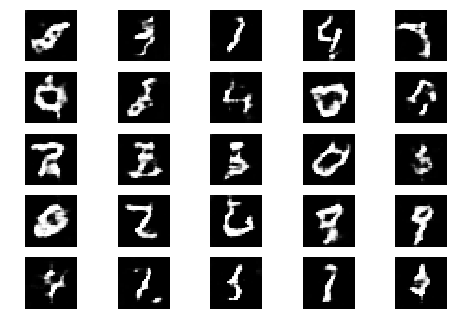

Epoch 1 Batch 511/937 [D loss: 0.756341, acc.: 40.62%] [G loss: 0.966218]
Epoch 1 Batch 512/937 [D loss: 0.770144, acc.: 50.00%] [G loss: 0.871364]
Epoch 1 Batch 513/937 [D loss: 0.606626, acc.: 68.75%] [G loss: 1.131651]
Epoch 1 Batch 514/937 [D loss: 0.720479, acc.: 59.38%] [G loss: 0.927600]
Epoch 1 Batch 515/937 [D loss: 0.701010, acc.: 62.50%] [G loss: 0.901474]
Epoch 1 Batch 516/937 [D loss: 0.656139, acc.: 59.38%] [G loss: 0.907200]
Epoch 1 Batch 517/937 [D loss: 0.721236, acc.: 53.12%] [G loss: 0.791454]
Epoch 1 Batch 518/937 [D loss: 0.671494, acc.: 53.12%] [G loss: 1.022009]
Epoch 1 Batch 519/937 [D loss: 0.687327, acc.: 59.38%] [G loss: 0.987733]
Epoch 1 Batch 520/937 [D loss: 0.595816, acc.: 68.75%] [G loss: 0.912718]
Epoch 1 Batch 521/937 [D loss: 0.669501, acc.: 65.62%] [G loss: 1.007298]
Epoch 1 Batch 522/937 [D loss: 0.934072, acc.: 40.62%] [G loss: 0.920662]
Epoch 1 Batch 523/937 [D loss: 0.611846, acc.: 68.75%] [G loss: 1.126669]
Epoch 1 Batch 524/937 [D loss: 0.61027

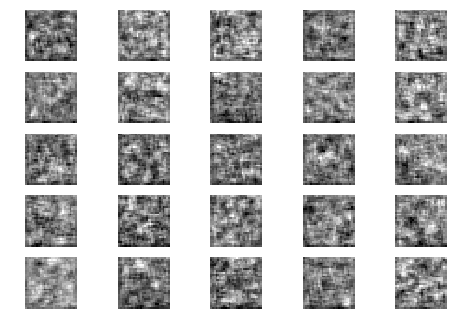

Epoch 1 Batch 601/937 [D loss: 0.499049, acc.: 81.25%] [G loss: 1.354943]
Epoch 1 Batch 602/937 [D loss: 0.663315, acc.: 68.75%] [G loss: 1.022744]
Epoch 1 Batch 603/937 [D loss: 0.631668, acc.: 62.50%] [G loss: 0.875346]
Epoch 1 Batch 604/937 [D loss: 0.830998, acc.: 46.88%] [G loss: 0.815772]
Epoch 1 Batch 605/937 [D loss: 0.597641, acc.: 65.62%] [G loss: 1.128633]
Epoch 1 Batch 606/937 [D loss: 0.644964, acc.: 62.50%] [G loss: 1.116121]


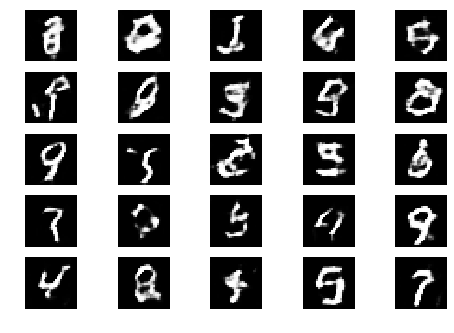

Epoch 1 Batch 607/937 [D loss: 0.696120, acc.: 50.00%] [G loss: 1.069250]
Epoch 1 Batch 608/937 [D loss: 0.792721, acc.: 59.38%] [G loss: 1.091480]
Epoch 1 Batch 609/937 [D loss: 0.607834, acc.: 68.75%] [G loss: 1.143892]
Epoch 1 Batch 610/937 [D loss: 0.507025, acc.: 78.12%] [G loss: 1.010000]
Epoch 1 Batch 611/937 [D loss: 0.640053, acc.: 59.38%] [G loss: 1.230926]
Epoch 1 Batch 612/937 [D loss: 0.741958, acc.: 50.00%] [G loss: 1.135942]


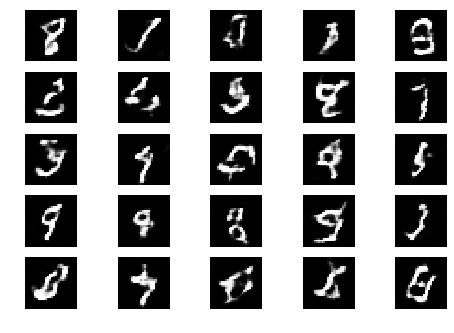

Epoch 1 Batch 613/937 [D loss: 0.650809, acc.: 59.38%] [G loss: 1.021045]
Epoch 1 Batch 614/937 [D loss: 0.636819, acc.: 59.38%] [G loss: 1.026678]
Epoch 1 Batch 615/937 [D loss: 0.570329, acc.: 65.62%] [G loss: 1.016571]
Epoch 1 Batch 616/937 [D loss: 0.591885, acc.: 65.62%] [G loss: 0.988093]
Epoch 1 Batch 617/937 [D loss: 0.852550, acc.: 37.50%] [G loss: 0.952193]
Epoch 1 Batch 618/937 [D loss: 0.646136, acc.: 65.62%] [G loss: 1.282807]
Epoch 1 Batch 619/937 [D loss: 0.743744, acc.: 53.12%] [G loss: 1.002662]
Epoch 1 Batch 620/937 [D loss: 0.599163, acc.: 75.00%] [G loss: 1.013134]
Epoch 1 Batch 621/937 [D loss: 0.672543, acc.: 65.62%] [G loss: 0.865986]
Epoch 1 Batch 622/937 [D loss: 0.733763, acc.: 46.88%] [G loss: 0.956393]
Epoch 1 Batch 623/937 [D loss: 0.665196, acc.: 56.25%] [G loss: 0.910128]
Epoch 1 Batch 624/937 [D loss: 0.813307, acc.: 40.62%] [G loss: 1.002491]
Epoch 1 Batch 625/937 [D loss: 0.804700, acc.: 53.12%] [G loss: 0.955034]
Epoch 1 Batch 626/937 [D loss: 0.67082

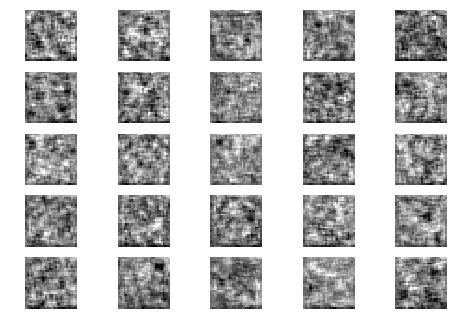

Epoch 1 Batch 701/937 [D loss: 0.669106, acc.: 59.38%] [G loss: 0.731595]
Epoch 1 Batch 702/937 [D loss: 0.665101, acc.: 56.25%] [G loss: 1.191966]
Epoch 1 Batch 703/937 [D loss: 0.528958, acc.: 71.88%] [G loss: 1.143682]
Epoch 1 Batch 704/937 [D loss: 0.761882, acc.: 50.00%] [G loss: 0.958043]
Epoch 1 Batch 705/937 [D loss: 0.703370, acc.: 62.50%] [G loss: 1.090423]
Epoch 1 Batch 706/937 [D loss: 0.758722, acc.: 56.25%] [G loss: 0.994715]
Epoch 1 Batch 707/937 [D loss: 0.658271, acc.: 62.50%] [G loss: 1.073593]


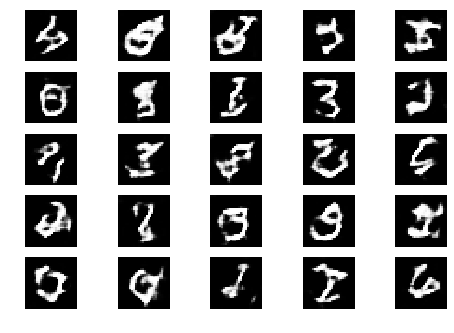

Epoch 1 Batch 708/937 [D loss: 0.580035, acc.: 68.75%] [G loss: 1.074049]
Epoch 1 Batch 709/937 [D loss: 0.725871, acc.: 56.25%] [G loss: 1.254843]
Epoch 1 Batch 710/937 [D loss: 0.754685, acc.: 53.12%] [G loss: 1.081878]
Epoch 1 Batch 711/937 [D loss: 0.656296, acc.: 62.50%] [G loss: 1.070737]
Epoch 1 Batch 712/937 [D loss: 0.656048, acc.: 62.50%] [G loss: 1.250064]
Epoch 1 Batch 713/937 [D loss: 0.647906, acc.: 62.50%] [G loss: 1.033094]
Epoch 1 Batch 714/937 [D loss: 0.694224, acc.: 59.38%] [G loss: 1.166300]


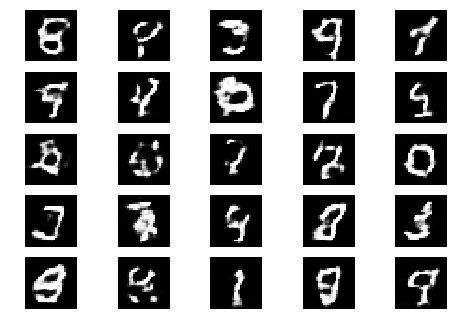

Epoch 1 Batch 715/937 [D loss: 0.555601, acc.: 78.12%] [G loss: 1.074473]
Epoch 1 Batch 716/937 [D loss: 0.568617, acc.: 78.12%] [G loss: 1.178526]
Epoch 1 Batch 717/937 [D loss: 0.738545, acc.: 50.00%] [G loss: 1.077661]
Epoch 1 Batch 718/937 [D loss: 0.663823, acc.: 59.38%] [G loss: 0.998682]
Epoch 1 Batch 719/937 [D loss: 0.754675, acc.: 53.12%] [G loss: 0.897593]
Epoch 1 Batch 720/937 [D loss: 0.663359, acc.: 62.50%] [G loss: 1.061068]
Epoch 1 Batch 721/937 [D loss: 0.830324, acc.: 50.00%] [G loss: 1.053666]
Epoch 1 Batch 722/937 [D loss: 0.617572, acc.: 65.62%] [G loss: 1.020802]
Epoch 1 Batch 723/937 [D loss: 0.641529, acc.: 68.75%] [G loss: 1.131449]
Epoch 1 Batch 724/937 [D loss: 0.693605, acc.: 53.12%] [G loss: 1.090749]
Epoch 1 Batch 725/937 [D loss: 0.786642, acc.: 37.50%] [G loss: 1.126519]
Epoch 1 Batch 726/937 [D loss: 0.714964, acc.: 53.12%] [G loss: 0.910133]
Epoch 1 Batch 727/937 [D loss: 0.629980, acc.: 65.62%] [G loss: 1.030223]
Epoch 1 Batch 728/937 [D loss: 0.59750

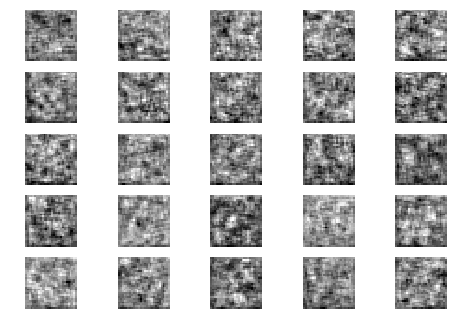

Epoch 1 Batch 801/937 [D loss: 0.696296, acc.: 56.25%] [G loss: 0.765290]
Epoch 1 Batch 802/937 [D loss: 0.552906, acc.: 71.88%] [G loss: 0.914699]
Epoch 1 Batch 803/937 [D loss: 0.666778, acc.: 59.38%] [G loss: 1.191856]
Epoch 1 Batch 804/937 [D loss: 0.638897, acc.: 59.38%] [G loss: 0.985594]
Epoch 1 Batch 805/937 [D loss: 0.758121, acc.: 50.00%] [G loss: 0.801877]
Epoch 1 Batch 806/937 [D loss: 0.586481, acc.: 62.50%] [G loss: 0.840928]
Epoch 1 Batch 807/937 [D loss: 0.619832, acc.: 62.50%] [G loss: 0.906409]
Epoch 1 Batch 808/937 [D loss: 0.765788, acc.: 50.00%] [G loss: 0.679914]


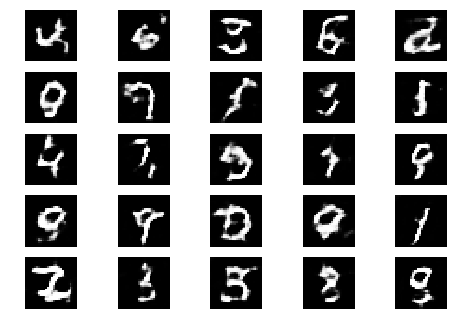

Epoch 1 Batch 809/937 [D loss: 0.755071, acc.: 46.88%] [G loss: 1.095086]
Epoch 1 Batch 810/937 [D loss: 0.622006, acc.: 59.38%] [G loss: 0.940198]
Epoch 1 Batch 811/937 [D loss: 0.621968, acc.: 68.75%] [G loss: 0.973584]
Epoch 1 Batch 812/937 [D loss: 0.658047, acc.: 68.75%] [G loss: 0.888967]
Epoch 1 Batch 813/937 [D loss: 0.679849, acc.: 56.25%] [G loss: 0.982737]
Epoch 1 Batch 814/937 [D loss: 0.744633, acc.: 50.00%] [G loss: 0.921214]
Epoch 1 Batch 815/937 [D loss: 0.508874, acc.: 71.88%] [G loss: 1.043868]
Epoch 1 Batch 816/937 [D loss: 0.663481, acc.: 50.00%] [G loss: 0.968582]


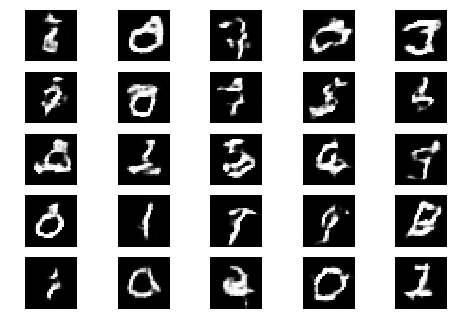

Epoch 1 Batch 817/937 [D loss: 0.728827, acc.: 56.25%] [G loss: 1.028188]
Epoch 1 Batch 818/937 [D loss: 0.684301, acc.: 65.62%] [G loss: 1.061975]
Epoch 1 Batch 819/937 [D loss: 0.746956, acc.: 53.12%] [G loss: 0.929639]
Epoch 1 Batch 820/937 [D loss: 0.587427, acc.: 71.88%] [G loss: 1.088635]
Epoch 1 Batch 821/937 [D loss: 0.638671, acc.: 62.50%] [G loss: 1.197280]
Epoch 1 Batch 822/937 [D loss: 0.623115, acc.: 68.75%] [G loss: 1.100589]
Epoch 1 Batch 823/937 [D loss: 0.744626, acc.: 43.75%] [G loss: 1.064925]
Epoch 1 Batch 824/937 [D loss: 0.608843, acc.: 62.50%] [G loss: 1.097115]
Epoch 1 Batch 825/937 [D loss: 0.638933, acc.: 62.50%] [G loss: 1.039323]
Epoch 1 Batch 826/937 [D loss: 0.693440, acc.: 46.88%] [G loss: 1.001405]
Epoch 1 Batch 827/937 [D loss: 0.632077, acc.: 68.75%] [G loss: 1.097220]
Epoch 1 Batch 828/937 [D loss: 0.661096, acc.: 62.50%] [G loss: 0.999376]
Epoch 1 Batch 829/937 [D loss: 0.599852, acc.: 59.38%] [G loss: 0.959161]
Epoch 1 Batch 830/937 [D loss: 0.57138

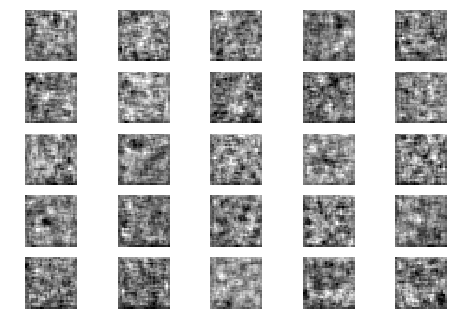

Epoch 1 Batch 901/937 [D loss: 0.693761, acc.: 56.25%] [G loss: 0.829503]
Epoch 1 Batch 902/937 [D loss: 0.732890, acc.: 56.25%] [G loss: 0.971587]
Epoch 1 Batch 903/937 [D loss: 0.719487, acc.: 56.25%] [G loss: 0.785258]
Epoch 1 Batch 904/937 [D loss: 0.738947, acc.: 50.00%] [G loss: 0.989021]
Epoch 1 Batch 905/937 [D loss: 0.768714, acc.: 50.00%] [G loss: 1.293892]
Epoch 1 Batch 906/937 [D loss: 0.503966, acc.: 78.12%] [G loss: 0.961434]
Epoch 1 Batch 907/937 [D loss: 0.613866, acc.: 68.75%] [G loss: 1.092909]
Epoch 1 Batch 908/937 [D loss: 0.577063, acc.: 75.00%] [G loss: 0.881768]
Epoch 1 Batch 909/937 [D loss: 0.636801, acc.: 62.50%] [G loss: 0.902512]


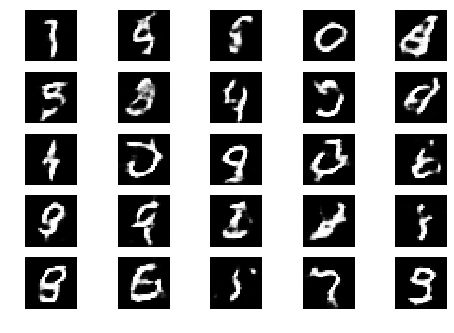

Epoch 1 Batch 910/937 [D loss: 0.746527, acc.: 56.25%] [G loss: 0.821648]
Epoch 1 Batch 911/937 [D loss: 0.722771, acc.: 56.25%] [G loss: 0.976445]
Epoch 1 Batch 912/937 [D loss: 0.752641, acc.: 53.12%] [G loss: 0.862522]
Epoch 1 Batch 913/937 [D loss: 0.526070, acc.: 62.50%] [G loss: 1.119982]
Epoch 1 Batch 914/937 [D loss: 0.565707, acc.: 68.75%] [G loss: 1.072865]
Epoch 1 Batch 915/937 [D loss: 0.815561, acc.: 37.50%] [G loss: 0.985509]
Epoch 1 Batch 916/937 [D loss: 0.664215, acc.: 53.12%] [G loss: 1.213513]
Epoch 1 Batch 917/937 [D loss: 0.828727, acc.: 37.50%] [G loss: 1.020726]
Epoch 1 Batch 918/937 [D loss: 0.845270, acc.: 46.88%] [G loss: 0.862140]


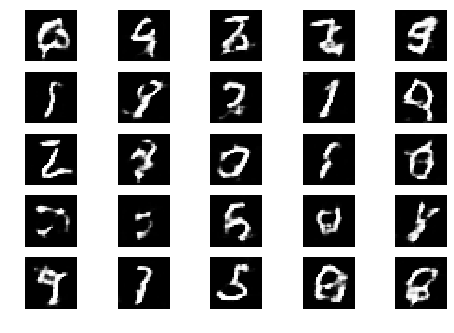

Epoch 1 Batch 919/937 [D loss: 0.669083, acc.: 43.75%] [G loss: 0.883214]
Epoch 1 Batch 920/937 [D loss: 0.746901, acc.: 50.00%] [G loss: 1.151353]
Epoch 1 Batch 921/937 [D loss: 0.639179, acc.: 62.50%] [G loss: 0.972226]
Epoch 1 Batch 922/937 [D loss: 0.451729, acc.: 84.38%] [G loss: 0.888917]
Epoch 1 Batch 923/937 [D loss: 0.707894, acc.: 59.38%] [G loss: 1.260062]
Epoch 1 Batch 924/937 [D loss: 0.591649, acc.: 71.88%] [G loss: 1.028806]
Epoch 1 Batch 925/937 [D loss: 0.532491, acc.: 71.88%] [G loss: 1.006896]
Epoch 1 Batch 926/937 [D loss: 0.641837, acc.: 71.88%] [G loss: 1.004593]
Epoch 1 Batch 927/937 [D loss: 0.650627, acc.: 65.62%] [G loss: 1.071288]
Epoch 1 Batch 928/937 [D loss: 0.671570, acc.: 62.50%] [G loss: 0.981553]
Epoch 1 Batch 929/937 [D loss: 0.595537, acc.: 59.38%] [G loss: 1.024663]
Epoch 1 Batch 930/937 [D loss: 0.923691, acc.: 43.75%] [G loss: 0.926876]
Epoch 1 Batch 931/937 [D loss: 0.770153, acc.: 50.00%] [G loss: 0.970979]
Epoch 1 Batch 932/937 [D loss: 0.72945

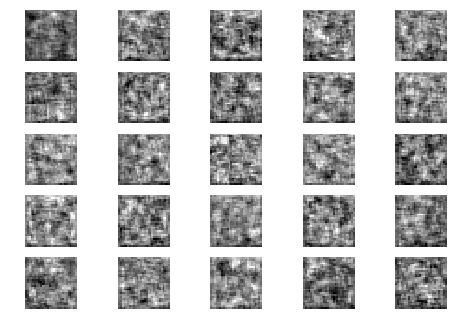

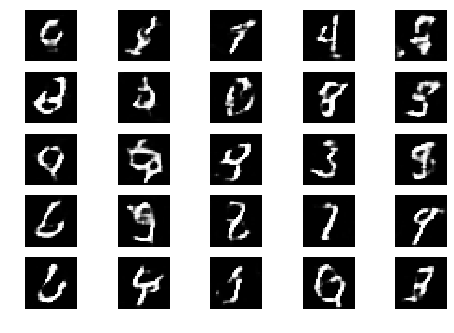

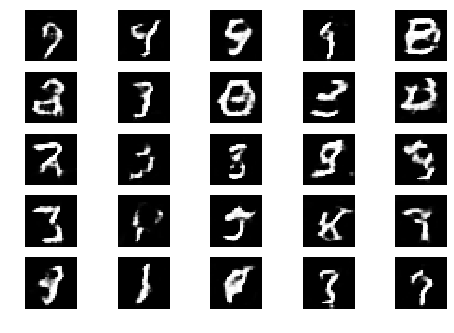

Epoch 2 Batch 1/937 [D loss: 0.840970, acc.: 34.38%] [G loss: 1.275369]
Epoch 2 Batch 2/937 [D loss: 0.576939, acc.: 68.75%] [G loss: 1.005740]
Epoch 2 Batch 3/937 [D loss: 0.815936, acc.: 56.25%] [G loss: 1.050609]
Epoch 2 Batch 4/937 [D loss: 0.594950, acc.: 68.75%] [G loss: 0.896285]
Epoch 2 Batch 5/937 [D loss: 0.596803, acc.: 68.75%] [G loss: 0.934571]
Epoch 2 Batch 6/937 [D loss: 0.800989, acc.: 40.62%] [G loss: 0.960747]
Epoch 2 Batch 7/937 [D loss: 0.717698, acc.: 56.25%] [G loss: 1.133185]
Epoch 2 Batch 8/937 [D loss: 0.644844, acc.: 56.25%] [G loss: 0.964847]
Epoch 2 Batch 9/937 [D loss: 0.600131, acc.: 68.75%] [G loss: 0.969000]
Epoch 2 Batch 10/937 [D loss: 0.755706, acc.: 46.88%] [G loss: 0.961545]
Epoch 2 Batch 11/937 [D loss: 0.653508, acc.: 68.75%] [G loss: 1.304661]
Epoch 2 Batch 12/937 [D loss: 0.497630, acc.: 87.50%] [G loss: 1.107775]
Epoch 2 Batch 13/937 [D loss: 0.688432, acc.: 68.75%] [G loss: 0.887698]
Epoch 2 Batch 14/937 [D loss: 0.627762, acc.: 65.62%] [G los

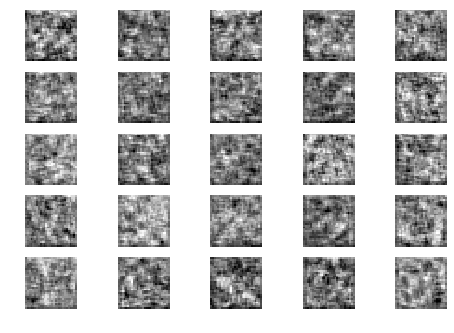

Epoch 2 Batch 101/937 [D loss: 0.505823, acc.: 78.12%] [G loss: 1.100531]


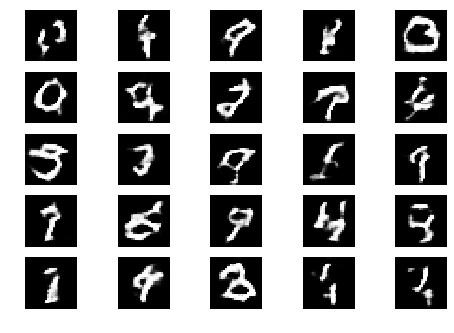

Epoch 2 Batch 102/937 [D loss: 0.800663, acc.: 53.12%] [G loss: 0.809906]


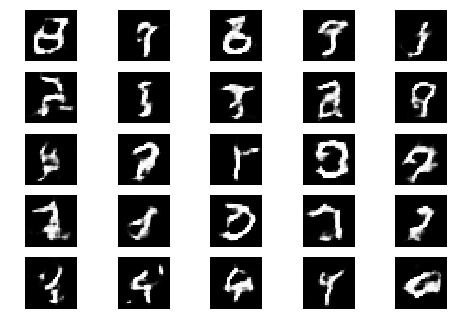

Epoch 2 Batch 103/937 [D loss: 0.730616, acc.: 53.12%] [G loss: 1.089482]
Epoch 2 Batch 104/937 [D loss: 0.685370, acc.: 65.62%] [G loss: 1.195373]
Epoch 2 Batch 105/937 [D loss: 0.557111, acc.: 71.88%] [G loss: 0.961169]
Epoch 2 Batch 106/937 [D loss: 0.705404, acc.: 53.12%] [G loss: 1.272440]
Epoch 2 Batch 107/937 [D loss: 0.575898, acc.: 71.88%] [G loss: 1.293999]
Epoch 2 Batch 108/937 [D loss: 0.642219, acc.: 65.62%] [G loss: 1.136235]
Epoch 2 Batch 109/937 [D loss: 0.743582, acc.: 50.00%] [G loss: 1.240682]
Epoch 2 Batch 110/937 [D loss: 0.643974, acc.: 59.38%] [G loss: 1.148208]
Epoch 2 Batch 111/937 [D loss: 0.537349, acc.: 75.00%] [G loss: 1.103401]
Epoch 2 Batch 112/937 [D loss: 0.609504, acc.: 68.75%] [G loss: 0.854952]
Epoch 2 Batch 113/937 [D loss: 0.695896, acc.: 56.25%] [G loss: 1.011831]
Epoch 2 Batch 114/937 [D loss: 0.542578, acc.: 71.88%] [G loss: 1.172030]
Epoch 2 Batch 115/937 [D loss: 0.668805, acc.: 56.25%] [G loss: 0.934723]
Epoch 2 Batch 116/937 [D loss: 0.76679

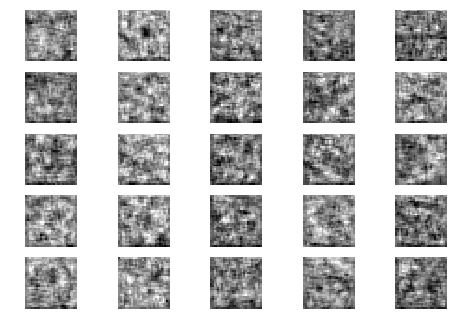

Epoch 2 Batch 201/937 [D loss: 0.701791, acc.: 50.00%] [G loss: 0.967448]
Epoch 2 Batch 202/937 [D loss: 0.752485, acc.: 46.88%] [G loss: 1.240968]


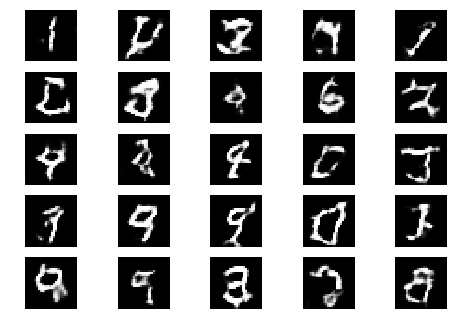

Epoch 2 Batch 203/937 [D loss: 0.608296, acc.: 65.62%] [G loss: 1.084634]
Epoch 2 Batch 204/937 [D loss: 0.731324, acc.: 53.12%] [G loss: 0.941006]


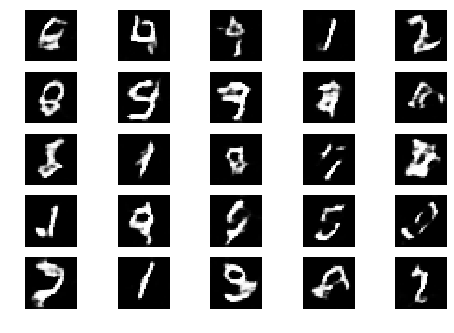

Epoch 2 Batch 205/937 [D loss: 0.627590, acc.: 65.62%] [G loss: 1.130169]
Epoch 2 Batch 206/937 [D loss: 0.721756, acc.: 53.12%] [G loss: 0.946881]
Epoch 2 Batch 207/937 [D loss: 0.531526, acc.: 68.75%] [G loss: 0.894483]
Epoch 2 Batch 208/937 [D loss: 0.861901, acc.: 37.50%] [G loss: 1.070676]
Epoch 2 Batch 209/937 [D loss: 0.624589, acc.: 68.75%] [G loss: 1.026378]
Epoch 2 Batch 210/937 [D loss: 0.608878, acc.: 71.88%] [G loss: 0.940381]
Epoch 2 Batch 211/937 [D loss: 0.599207, acc.: 75.00%] [G loss: 0.977424]
Epoch 2 Batch 212/937 [D loss: 0.537487, acc.: 65.62%] [G loss: 0.995083]
Epoch 2 Batch 213/937 [D loss: 0.640284, acc.: 59.38%] [G loss: 1.061191]
Epoch 2 Batch 214/937 [D loss: 0.565467, acc.: 71.88%] [G loss: 1.056705]
Epoch 2 Batch 215/937 [D loss: 0.757915, acc.: 46.88%] [G loss: 1.210814]
Epoch 2 Batch 216/937 [D loss: 0.736939, acc.: 46.88%] [G loss: 1.084244]
Epoch 2 Batch 217/937 [D loss: 0.815938, acc.: 50.00%] [G loss: 0.952655]
Epoch 2 Batch 218/937 [D loss: 0.54364

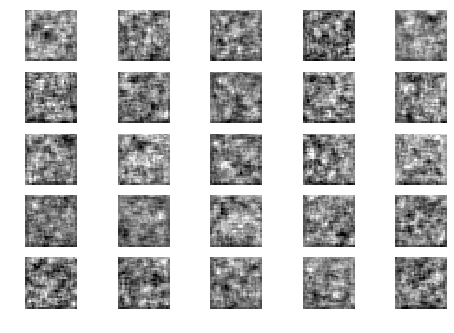

Epoch 2 Batch 301/937 [D loss: 0.666711, acc.: 56.25%] [G loss: 0.982998]
Epoch 2 Batch 302/937 [D loss: 0.630360, acc.: 59.38%] [G loss: 1.036179]
Epoch 2 Batch 303/937 [D loss: 0.707984, acc.: 59.38%] [G loss: 1.116741]


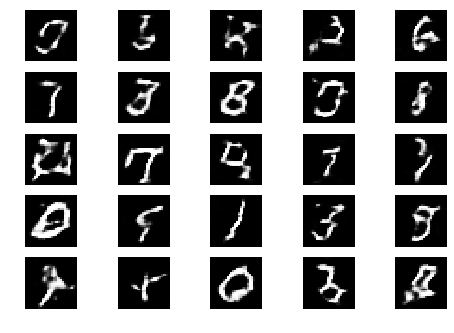

Epoch 2 Batch 304/937 [D loss: 0.564120, acc.: 78.12%] [G loss: 0.882810]
Epoch 2 Batch 305/937 [D loss: 0.653261, acc.: 65.62%] [G loss: 0.929422]
Epoch 2 Batch 306/937 [D loss: 0.633064, acc.: 62.50%] [G loss: 1.168568]


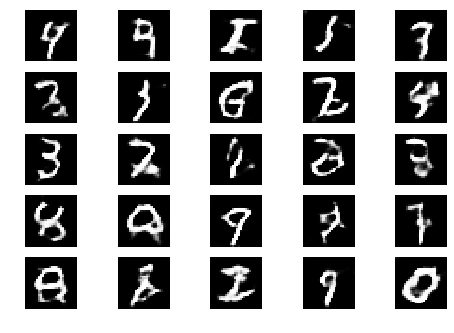

Epoch 2 Batch 307/937 [D loss: 0.683084, acc.: 53.12%] [G loss: 0.971501]
Epoch 2 Batch 308/937 [D loss: 0.703302, acc.: 59.38%] [G loss: 1.073391]
Epoch 2 Batch 309/937 [D loss: 0.753719, acc.: 43.75%] [G loss: 0.956472]
Epoch 2 Batch 310/937 [D loss: 0.785656, acc.: 46.88%] [G loss: 1.003225]
Epoch 2 Batch 311/937 [D loss: 0.541808, acc.: 65.62%] [G loss: 0.913272]
Epoch 2 Batch 312/937 [D loss: 0.534686, acc.: 75.00%] [G loss: 1.206202]
Epoch 2 Batch 313/937 [D loss: 0.618482, acc.: 62.50%] [G loss: 1.119925]
Epoch 2 Batch 314/937 [D loss: 0.575081, acc.: 71.88%] [G loss: 1.071723]
Epoch 2 Batch 315/937 [D loss: 0.673249, acc.: 62.50%] [G loss: 0.998511]
Epoch 2 Batch 316/937 [D loss: 0.502064, acc.: 81.25%] [G loss: 0.965216]
Epoch 2 Batch 317/937 [D loss: 0.975850, acc.: 37.50%] [G loss: 1.026027]
Epoch 2 Batch 318/937 [D loss: 0.678080, acc.: 43.75%] [G loss: 1.172550]
Epoch 2 Batch 319/937 [D loss: 0.647474, acc.: 65.62%] [G loss: 0.979516]
Epoch 2 Batch 320/937 [D loss: 0.73033

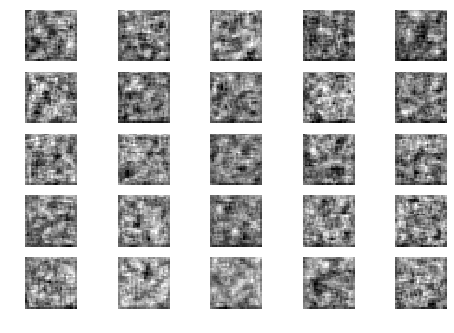

Epoch 2 Batch 401/937 [D loss: 0.691969, acc.: 59.38%] [G loss: 1.097153]
Epoch 2 Batch 402/937 [D loss: 0.687061, acc.: 62.50%] [G loss: 0.996406]
Epoch 2 Batch 403/937 [D loss: 0.624649, acc.: 65.62%] [G loss: 0.990183]
Epoch 2 Batch 404/937 [D loss: 0.625373, acc.: 56.25%] [G loss: 1.169041]


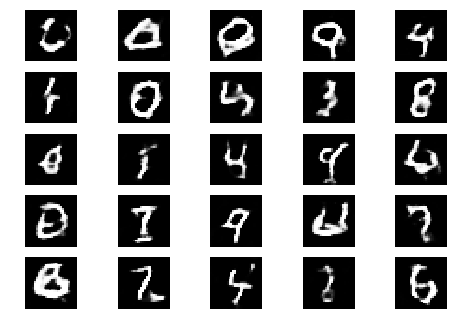

Epoch 2 Batch 405/937 [D loss: 0.790540, acc.: 46.88%] [G loss: 1.070189]
Epoch 2 Batch 406/937 [D loss: 0.602617, acc.: 65.62%] [G loss: 0.839739]
Epoch 2 Batch 407/937 [D loss: 0.730153, acc.: 59.38%] [G loss: 1.103496]
Epoch 2 Batch 408/937 [D loss: 0.688676, acc.: 59.38%] [G loss: 0.919955]


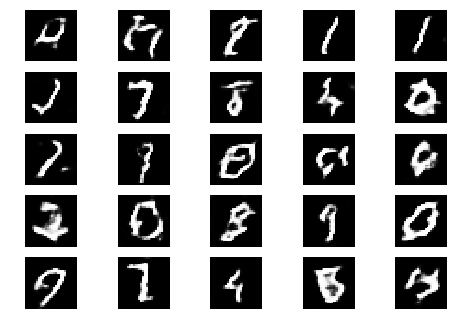

Epoch 2 Batch 409/937 [D loss: 0.610164, acc.: 65.62%] [G loss: 1.067866]
Epoch 2 Batch 410/937 [D loss: 0.639881, acc.: 71.88%] [G loss: 0.876865]
Epoch 2 Batch 411/937 [D loss: 0.557084, acc.: 68.75%] [G loss: 0.802714]
Epoch 2 Batch 412/937 [D loss: 0.626899, acc.: 62.50%] [G loss: 1.019097]
Epoch 2 Batch 413/937 [D loss: 0.826707, acc.: 31.25%] [G loss: 1.021942]
Epoch 2 Batch 414/937 [D loss: 0.743067, acc.: 50.00%] [G loss: 0.829290]
Epoch 2 Batch 415/937 [D loss: 0.608818, acc.: 62.50%] [G loss: 1.125749]
Epoch 2 Batch 416/937 [D loss: 0.618596, acc.: 65.62%] [G loss: 1.075063]
Epoch 2 Batch 417/937 [D loss: 0.730189, acc.: 46.88%] [G loss: 1.109753]
Epoch 2 Batch 418/937 [D loss: 0.678252, acc.: 59.38%] [G loss: 0.868095]
Epoch 2 Batch 419/937 [D loss: 0.661926, acc.: 56.25%] [G loss: 1.047735]
Epoch 2 Batch 420/937 [D loss: 0.776948, acc.: 43.75%] [G loss: 1.057523]
Epoch 2 Batch 421/937 [D loss: 0.617899, acc.: 65.62%] [G loss: 1.267948]
Epoch 2 Batch 422/937 [D loss: 0.79214

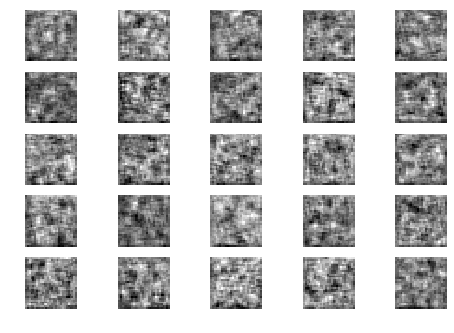

Epoch 2 Batch 501/937 [D loss: 0.514369, acc.: 75.00%] [G loss: 0.888983]
Epoch 2 Batch 502/937 [D loss: 0.527069, acc.: 78.12%] [G loss: 0.871459]
Epoch 2 Batch 503/937 [D loss: 0.583877, acc.: 75.00%] [G loss: 1.062894]
Epoch 2 Batch 504/937 [D loss: 0.625409, acc.: 68.75%] [G loss: 0.913238]
Epoch 2 Batch 505/937 [D loss: 0.633087, acc.: 59.38%] [G loss: 0.953347]


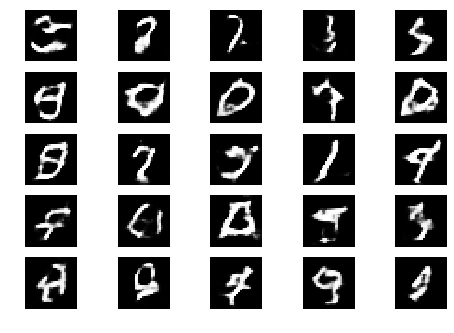

Epoch 2 Batch 506/937 [D loss: 0.694484, acc.: 50.00%] [G loss: 1.012409]
Epoch 2 Batch 507/937 [D loss: 0.673802, acc.: 59.38%] [G loss: 1.076377]
Epoch 2 Batch 508/937 [D loss: 0.556196, acc.: 81.25%] [G loss: 1.173386]
Epoch 2 Batch 509/937 [D loss: 0.730061, acc.: 53.12%] [G loss: 0.871239]
Epoch 2 Batch 510/937 [D loss: 0.603274, acc.: 68.75%] [G loss: 0.984048]


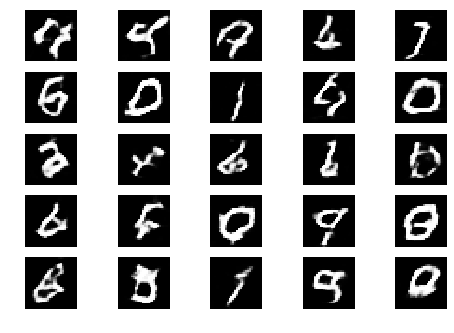

Epoch 2 Batch 511/937 [D loss: 0.527197, acc.: 78.12%] [G loss: 1.036946]
Epoch 2 Batch 512/937 [D loss: 0.766805, acc.: 53.12%] [G loss: 1.000803]
Epoch 2 Batch 513/937 [D loss: 0.627054, acc.: 65.62%] [G loss: 1.222916]
Epoch 2 Batch 514/937 [D loss: 0.642521, acc.: 65.62%] [G loss: 1.183011]
Epoch 2 Batch 515/937 [D loss: 0.725448, acc.: 56.25%] [G loss: 1.078745]
Epoch 2 Batch 516/937 [D loss: 0.722422, acc.: 59.38%] [G loss: 1.069904]
Epoch 2 Batch 517/937 [D loss: 0.824769, acc.: 34.38%] [G loss: 0.980661]
Epoch 2 Batch 518/937 [D loss: 0.617786, acc.: 62.50%] [G loss: 1.047454]
Epoch 2 Batch 519/937 [D loss: 0.573309, acc.: 71.88%] [G loss: 1.109297]
Epoch 2 Batch 520/937 [D loss: 0.790982, acc.: 56.25%] [G loss: 1.047868]
Epoch 2 Batch 521/937 [D loss: 0.791039, acc.: 34.38%] [G loss: 0.839528]
Epoch 2 Batch 522/937 [D loss: 0.589852, acc.: 56.25%] [G loss: 0.792220]
Epoch 2 Batch 523/937 [D loss: 0.721352, acc.: 53.12%] [G loss: 0.818840]
Epoch 2 Batch 524/937 [D loss: 0.62739

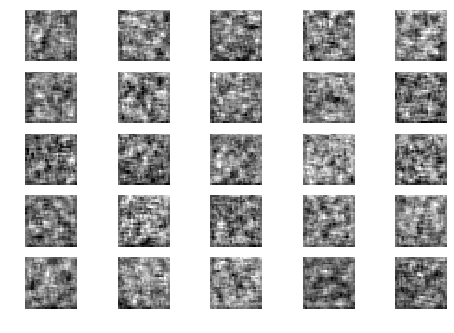

Epoch 2 Batch 601/937 [D loss: 0.747879, acc.: 46.88%] [G loss: 0.839735]
Epoch 2 Batch 602/937 [D loss: 0.712153, acc.: 59.38%] [G loss: 0.993705]
Epoch 2 Batch 603/937 [D loss: 0.745252, acc.: 50.00%] [G loss: 0.818031]
Epoch 2 Batch 604/937 [D loss: 0.693649, acc.: 56.25%] [G loss: 0.838335]
Epoch 2 Batch 605/937 [D loss: 0.597452, acc.: 68.75%] [G loss: 0.916974]
Epoch 2 Batch 606/937 [D loss: 0.667013, acc.: 71.88%] [G loss: 1.016080]


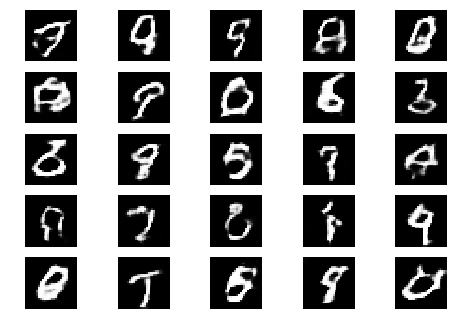

Epoch 2 Batch 607/937 [D loss: 0.679819, acc.: 59.38%] [G loss: 1.072715]
Epoch 2 Batch 608/937 [D loss: 0.719383, acc.: 56.25%] [G loss: 0.977381]
Epoch 2 Batch 609/937 [D loss: 0.505036, acc.: 78.12%] [G loss: 0.942366]
Epoch 2 Batch 610/937 [D loss: 0.502454, acc.: 81.25%] [G loss: 1.170651]
Epoch 2 Batch 611/937 [D loss: 0.551000, acc.: 75.00%] [G loss: 1.011350]
Epoch 2 Batch 612/937 [D loss: 0.761312, acc.: 53.12%] [G loss: 0.817607]


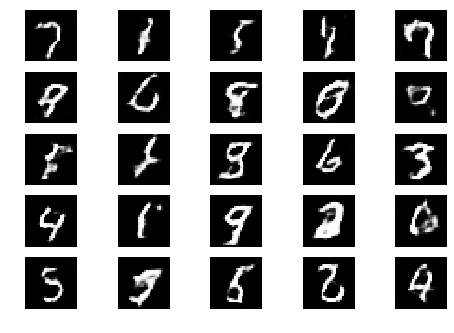

Epoch 2 Batch 613/937 [D loss: 0.726342, acc.: 53.12%] [G loss: 0.934395]
Epoch 2 Batch 614/937 [D loss: 0.645015, acc.: 62.50%] [G loss: 0.997756]
Epoch 2 Batch 615/937 [D loss: 0.712352, acc.: 59.38%] [G loss: 1.010257]
Epoch 2 Batch 616/937 [D loss: 0.733963, acc.: 53.12%] [G loss: 0.984390]
Epoch 2 Batch 617/937 [D loss: 0.768602, acc.: 50.00%] [G loss: 0.981536]
Epoch 2 Batch 618/937 [D loss: 0.643936, acc.: 65.62%] [G loss: 1.151790]
Epoch 2 Batch 619/937 [D loss: 0.558654, acc.: 71.88%] [G loss: 1.119172]
Epoch 2 Batch 620/937 [D loss: 0.577267, acc.: 71.88%] [G loss: 1.125535]
Epoch 2 Batch 621/937 [D loss: 0.644067, acc.: 68.75%] [G loss: 1.108842]
Epoch 2 Batch 622/937 [D loss: 0.738212, acc.: 56.25%] [G loss: 0.941950]
Epoch 2 Batch 623/937 [D loss: 0.664555, acc.: 59.38%] [G loss: 0.809759]
Epoch 2 Batch 624/937 [D loss: 0.639660, acc.: 62.50%] [G loss: 0.956166]
Epoch 2 Batch 625/937 [D loss: 0.704861, acc.: 56.25%] [G loss: 1.052214]
Epoch 2 Batch 626/937 [D loss: 0.71039

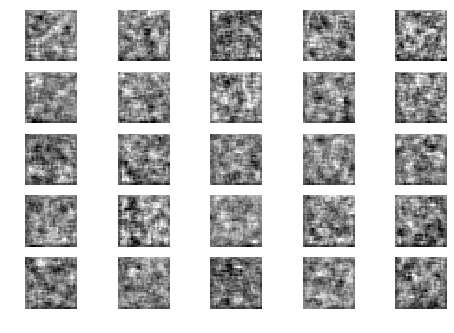

Epoch 2 Batch 701/937 [D loss: 0.713860, acc.: 56.25%] [G loss: 1.283622]
Epoch 2 Batch 702/937 [D loss: 0.607223, acc.: 62.50%] [G loss: 0.997572]
Epoch 2 Batch 703/937 [D loss: 0.612384, acc.: 71.88%] [G loss: 1.068405]
Epoch 2 Batch 704/937 [D loss: 0.553466, acc.: 71.88%] [G loss: 0.977869]
Epoch 2 Batch 705/937 [D loss: 0.659504, acc.: 68.75%] [G loss: 0.996879]
Epoch 2 Batch 706/937 [D loss: 0.708392, acc.: 50.00%] [G loss: 1.110694]
Epoch 2 Batch 707/937 [D loss: 0.758961, acc.: 50.00%] [G loss: 0.962704]


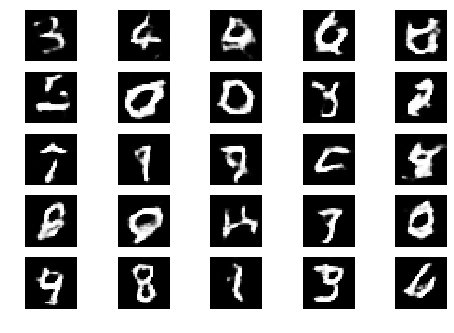

Epoch 2 Batch 708/937 [D loss: 0.654387, acc.: 68.75%] [G loss: 1.018903]
Epoch 2 Batch 709/937 [D loss: 0.709716, acc.: 59.38%] [G loss: 0.954524]
Epoch 2 Batch 710/937 [D loss: 0.722583, acc.: 46.88%] [G loss: 1.101694]
Epoch 2 Batch 711/937 [D loss: 0.601940, acc.: 65.62%] [G loss: 0.913112]
Epoch 2 Batch 712/937 [D loss: 0.720844, acc.: 56.25%] [G loss: 0.968412]
Epoch 2 Batch 713/937 [D loss: 0.758741, acc.: 46.88%] [G loss: 0.937427]
Epoch 2 Batch 714/937 [D loss: 0.565414, acc.: 75.00%] [G loss: 1.028498]


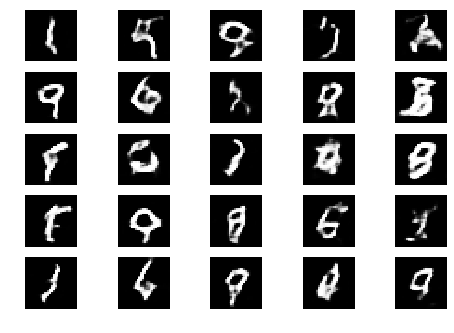

Epoch 2 Batch 715/937 [D loss: 0.728924, acc.: 56.25%] [G loss: 1.018882]
Epoch 2 Batch 716/937 [D loss: 0.765316, acc.: 46.88%] [G loss: 0.838106]
Epoch 2 Batch 717/937 [D loss: 0.752301, acc.: 46.88%] [G loss: 0.895234]
Epoch 2 Batch 718/937 [D loss: 0.644626, acc.: 68.75%] [G loss: 0.942066]
Epoch 2 Batch 719/937 [D loss: 0.720870, acc.: 56.25%] [G loss: 0.984473]
Epoch 2 Batch 720/937 [D loss: 0.709319, acc.: 62.50%] [G loss: 0.884300]
Epoch 2 Batch 721/937 [D loss: 0.707700, acc.: 56.25%] [G loss: 0.913077]
Epoch 2 Batch 722/937 [D loss: 0.564078, acc.: 65.62%] [G loss: 0.838143]
Epoch 2 Batch 723/937 [D loss: 0.602043, acc.: 68.75%] [G loss: 0.948595]
Epoch 2 Batch 724/937 [D loss: 0.787402, acc.: 50.00%] [G loss: 0.953439]
Epoch 2 Batch 725/937 [D loss: 0.682398, acc.: 65.62%] [G loss: 1.018062]
Epoch 2 Batch 726/937 [D loss: 0.687192, acc.: 53.12%] [G loss: 1.078918]
Epoch 2 Batch 727/937 [D loss: 0.619851, acc.: 65.62%] [G loss: 0.947797]
Epoch 2 Batch 728/937 [D loss: 0.69340

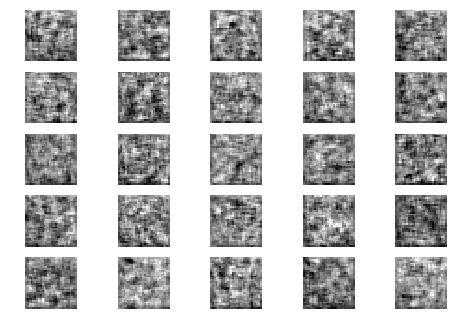

Epoch 2 Batch 801/937 [D loss: 0.608732, acc.: 59.38%] [G loss: 1.019345]
Epoch 2 Batch 802/937 [D loss: 0.587049, acc.: 65.62%] [G loss: 1.024675]
Epoch 2 Batch 803/937 [D loss: 0.693183, acc.: 59.38%] [G loss: 0.997653]
Epoch 2 Batch 804/937 [D loss: 0.685727, acc.: 50.00%] [G loss: 0.909094]
Epoch 2 Batch 805/937 [D loss: 0.728150, acc.: 53.12%] [G loss: 0.875054]
Epoch 2 Batch 806/937 [D loss: 0.565119, acc.: 78.12%] [G loss: 1.023731]
Epoch 2 Batch 807/937 [D loss: 0.633405, acc.: 53.12%] [G loss: 0.826432]
Epoch 2 Batch 808/937 [D loss: 0.630786, acc.: 62.50%] [G loss: 0.885814]


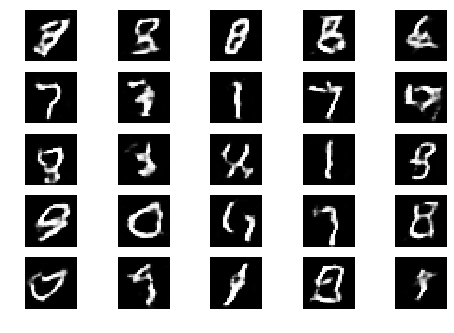

Epoch 2 Batch 809/937 [D loss: 0.718887, acc.: 50.00%] [G loss: 0.940268]
Epoch 2 Batch 810/937 [D loss: 0.686210, acc.: 53.12%] [G loss: 0.783226]
Epoch 2 Batch 811/937 [D loss: 0.513163, acc.: 78.12%] [G loss: 0.950422]
Epoch 2 Batch 812/937 [D loss: 0.594701, acc.: 65.62%] [G loss: 0.898140]
Epoch 2 Batch 813/937 [D loss: 0.747321, acc.: 53.12%] [G loss: 0.977104]
Epoch 2 Batch 814/937 [D loss: 0.786873, acc.: 43.75%] [G loss: 0.918626]
Epoch 2 Batch 815/937 [D loss: 0.681366, acc.: 59.38%] [G loss: 0.959967]
Epoch 2 Batch 816/937 [D loss: 0.764678, acc.: 50.00%] [G loss: 1.002247]


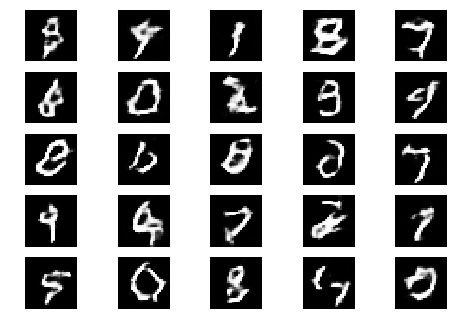

Epoch 2 Batch 817/937 [D loss: 0.693129, acc.: 53.12%] [G loss: 0.913397]
Epoch 2 Batch 818/937 [D loss: 0.706778, acc.: 62.50%] [G loss: 0.794813]
Epoch 2 Batch 819/937 [D loss: 0.589478, acc.: 68.75%] [G loss: 0.896455]
Epoch 2 Batch 820/937 [D loss: 0.682485, acc.: 62.50%] [G loss: 0.909264]
Epoch 2 Batch 821/937 [D loss: 0.593769, acc.: 62.50%] [G loss: 0.899538]
Epoch 2 Batch 822/937 [D loss: 0.623828, acc.: 65.62%] [G loss: 0.889192]
Epoch 2 Batch 823/937 [D loss: 0.622853, acc.: 68.75%] [G loss: 0.859723]
Epoch 2 Batch 824/937 [D loss: 0.620506, acc.: 75.00%] [G loss: 1.091205]
Epoch 2 Batch 825/937 [D loss: 0.660462, acc.: 62.50%] [G loss: 0.941175]
Epoch 2 Batch 826/937 [D loss: 0.588156, acc.: 71.88%] [G loss: 1.062275]
Epoch 2 Batch 827/937 [D loss: 0.678263, acc.: 65.62%] [G loss: 1.018329]
Epoch 2 Batch 828/937 [D loss: 0.516299, acc.: 81.25%] [G loss: 0.974702]
Epoch 2 Batch 829/937 [D loss: 0.691917, acc.: 65.62%] [G loss: 1.047128]
Epoch 2 Batch 830/937 [D loss: 0.69681

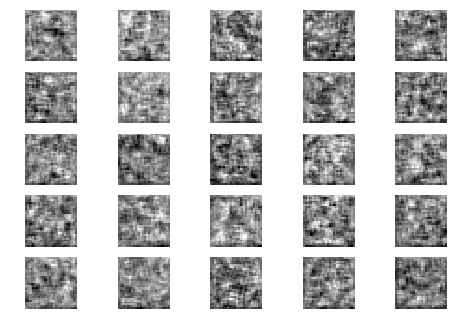

Epoch 2 Batch 901/937 [D loss: 0.696976, acc.: 56.25%] [G loss: 1.022664]
Epoch 2 Batch 902/937 [D loss: 0.774129, acc.: 53.12%] [G loss: 0.817584]
Epoch 2 Batch 903/937 [D loss: 0.672703, acc.: 56.25%] [G loss: 0.928508]
Epoch 2 Batch 904/937 [D loss: 0.685903, acc.: 59.38%] [G loss: 1.051788]
Epoch 2 Batch 905/937 [D loss: 0.652411, acc.: 56.25%] [G loss: 1.028842]
Epoch 2 Batch 906/937 [D loss: 0.775591, acc.: 46.88%] [G loss: 1.083417]
Epoch 2 Batch 907/937 [D loss: 0.630053, acc.: 62.50%] [G loss: 1.074836]
Epoch 2 Batch 908/937 [D loss: 0.620014, acc.: 59.38%] [G loss: 0.885911]
Epoch 2 Batch 909/937 [D loss: 0.603820, acc.: 62.50%] [G loss: 1.147747]


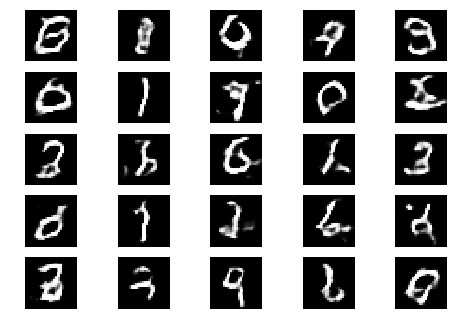

Epoch 2 Batch 910/937 [D loss: 0.750838, acc.: 50.00%] [G loss: 1.160937]
Epoch 2 Batch 911/937 [D loss: 0.729891, acc.: 71.88%] [G loss: 0.966316]
Epoch 2 Batch 912/937 [D loss: 0.534370, acc.: 71.88%] [G loss: 0.992710]
Epoch 2 Batch 913/937 [D loss: 0.676170, acc.: 62.50%] [G loss: 1.124867]
Epoch 2 Batch 914/937 [D loss: 0.692761, acc.: 62.50%] [G loss: 1.106612]
Epoch 2 Batch 915/937 [D loss: 0.697011, acc.: 56.25%] [G loss: 0.957769]
Epoch 2 Batch 916/937 [D loss: 0.762631, acc.: 59.38%] [G loss: 1.076788]
Epoch 2 Batch 917/937 [D loss: 0.644818, acc.: 59.38%] [G loss: 1.161837]
Epoch 2 Batch 918/937 [D loss: 0.719190, acc.: 46.88%] [G loss: 0.936314]


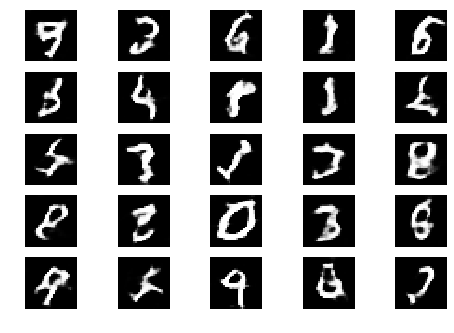

Epoch 2 Batch 919/937 [D loss: 0.618314, acc.: 62.50%] [G loss: 0.949144]
Epoch 2 Batch 920/937 [D loss: 0.734178, acc.: 46.88%] [G loss: 0.967874]
Epoch 2 Batch 921/937 [D loss: 0.755252, acc.: 62.50%] [G loss: 0.849012]
Epoch 2 Batch 922/937 [D loss: 0.599512, acc.: 62.50%] [G loss: 0.844721]
Epoch 2 Batch 923/937 [D loss: 0.622537, acc.: 65.62%] [G loss: 1.111385]
Epoch 2 Batch 924/937 [D loss: 0.718771, acc.: 56.25%] [G loss: 0.926152]
Epoch 2 Batch 925/937 [D loss: 0.693434, acc.: 46.88%] [G loss: 1.093035]
Epoch 2 Batch 926/937 [D loss: 0.754496, acc.: 46.88%] [G loss: 0.871371]
Epoch 2 Batch 927/937 [D loss: 0.604492, acc.: 71.88%] [G loss: 0.861710]
Epoch 2 Batch 928/937 [D loss: 0.645606, acc.: 56.25%] [G loss: 0.946874]
Epoch 2 Batch 929/937 [D loss: 0.497066, acc.: 81.25%] [G loss: 0.899197]
Epoch 2 Batch 930/937 [D loss: 0.615675, acc.: 56.25%] [G loss: 1.030674]
Epoch 2 Batch 931/937 [D loss: 0.565008, acc.: 68.75%] [G loss: 0.947088]
Epoch 2 Batch 932/937 [D loss: 0.65152

In [25]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=2)

In [0]:
!rm -rf generator2Trainedepoch2.h5

generator2.save('generator2Trainedepoch2.h5')

In [27]:
!ls -al


total 77252
drwxr-xr-x 1 root root     4096 Dec  5 10:16 .
drwxr-xr-x 1 root root     4096 Dec  5 05:42 ..
-rw-r--r-- 1 root root 22256168 Dec  5 08:34 combined1.h5
drwxr-xr-x 1 root root     4096 Dec  3 17:43 .config
-rw-r--r-- 1 root root 15348832 Dec  5 08:34 discriminator1.h5
-rw-r--r-- 1 root root    55406 Dec  5 09:40 generator1.h5
-rw-r--r-- 1 root root    55407 Dec  5 08:35 generator1.h5.1
-rw-r--r-- 1 root root 10336800 Dec  5 08:35 generator1.h5.2
-rw-r--r-- 1 root root 10336800 Dec  5 10:16 generator2Trainedepoch2.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:05 generatorTrained1.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:46 generatorTrainedepoch2.h5
drwxr-xr-x 2 root root     4096 Dec  3 17:43 sample_data


In [32]:
!ls -al

total 87352
drwxr-xr-x 1 root root     4096 Dec  5 10:25 .
drwxr-xr-x 1 root root     4096 Dec  5 05:42 ..
-rw-r--r-- 1 root root 22256168 Dec  5 08:34 combined1.h5
drwxr-xr-x 1 root root     4096 Dec  3 17:43 .config
-rw-r--r-- 1 root root 15348832 Dec  5 08:34 discriminator1.h5
-rw-r--r-- 1 root root    55406 Dec  5 09:40 generator1.h5
-rw-r--r-- 1 root root    55407 Dec  5 08:35 generator1.h5.1
-rw-r--r-- 1 root root 10336800 Dec  5 08:35 generator1.h5.2
-rw-r--r-- 1 root root 10336800 Dec  5 10:16 generator2Trainedepoch2.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:05 generatorTrained1.h5
-rw-r--r-- 1 root root 10336800 Dec  5 10:25 generatorTrainedepoch2git.h5
-rw-r--r-- 1 root root 10336800 Dec  5 09:46 generatorTrainedepoch2.h5
drwxr-xr-x 2 root root     4096 Dec  3 17:43 sample_data


In [31]:
!wget https://github.com/rajagopalmotivate/try1/raw/master/generatorTrainedepoch2git.h5

--2018-12-05 10:25:55--  https://github.com/rajagopalmotivate/try1/raw/master/generatorTrainedepoch2git.h5
Resolving github.com (github.com)... 192.30.253.113, 192.30.253.112
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rajagopalmotivate/try1/master/generatorTrainedepoch2git.h5 [following]
--2018-12-05 10:25:56--  https://raw.githubusercontent.com/rajagopalmotivate/try1/master/generatorTrainedepoch2git.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10336800 (9.9M) [application/octet-stream]
Saving to: ‘generatorTrainedepoch2git.h5’

generatorTrainedepo 100%[===================>]   9.86M  18.8MB/s    in 0.5s    

2018-12-05 10:25:56 (18.8 MB

In [39]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 3 ,  loadpretrainedweights=True)


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_77 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_29 (LeakyReLU)   (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_8 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_30 (LeakyReLU)   (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 1.041863, acc.: 34.38%] [G loss: 0.490128]


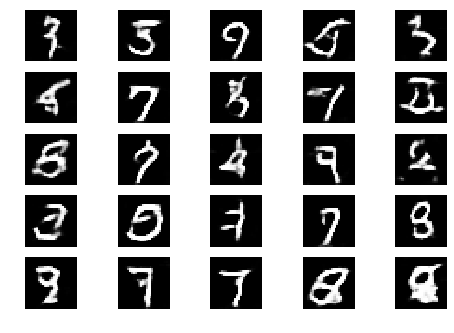

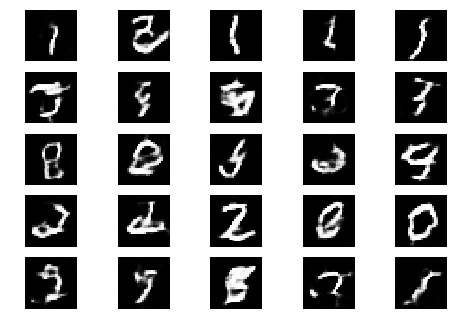

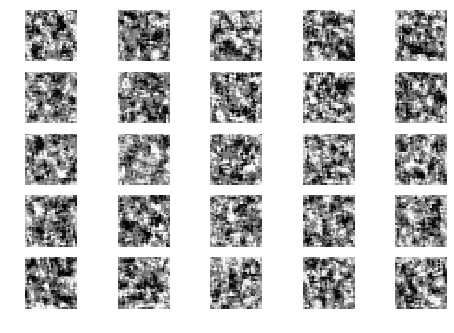

Epoch 0 Batch 1/937 [D loss: 0.813199, acc.: 59.38%] [G loss: 0.644902]
Epoch 0 Batch 2/937 [D loss: 0.782473, acc.: 50.00%] [G loss: 0.708490]
Epoch 0 Batch 3/937 [D loss: 0.760561, acc.: 40.62%] [G loss: 0.625345]
Epoch 0 Batch 4/937 [D loss: 0.856345, acc.: 34.38%] [G loss: 0.704447]
Epoch 0 Batch 5/937 [D loss: 0.921363, acc.: 40.62%] [G loss: 0.613419]
Epoch 0 Batch 6/937 [D loss: 0.865450, acc.: 43.75%] [G loss: 0.612325]
Epoch 0 Batch 7/937 [D loss: 0.995623, acc.: 28.12%] [G loss: 0.689220]
Epoch 0 Batch 8/937 [D loss: 0.806714, acc.: 43.75%] [G loss: 0.610640]
Epoch 0 Batch 9/937 [D loss: 0.842366, acc.: 46.88%] [G loss: 0.547156]
Epoch 0 Batch 10/937 [D loss: 0.706503, acc.: 59.38%] [G loss: 0.548654]
Epoch 0 Batch 11/937 [D loss: 0.830096, acc.: 43.75%] [G loss: 0.438725]
Epoch 0 Batch 12/937 [D loss: 0.844636, acc.: 34.38%] [G loss: 0.537977]
Epoch 0 Batch 13/937 [D loss: 0.845098, acc.: 40.62%] [G loss: 0.541538]
Epoch 0 Batch 14/937 [D loss: 0.821959, acc.: 28.12%] [G los

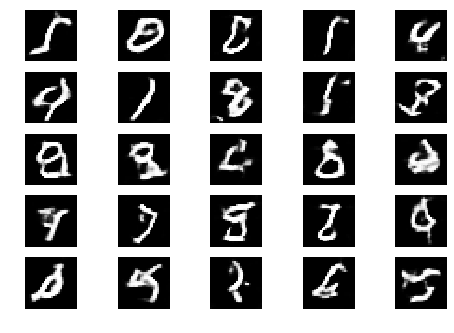

Epoch 0 Batch 101/937 [D loss: 0.710934, acc.: 71.88%] [G loss: 0.095940]


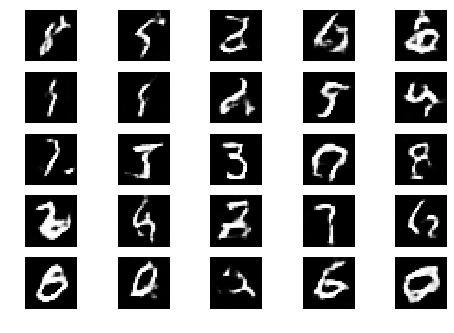

Epoch 0 Batch 102/937 [D loss: 0.818511, acc.: 43.75%] [G loss: 0.101357]


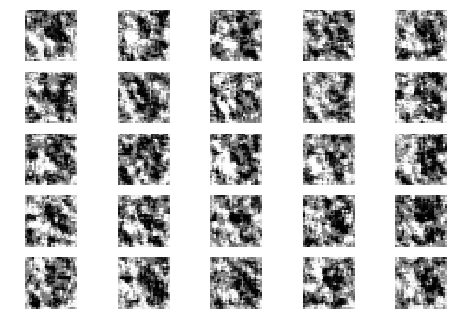

Epoch 0 Batch 103/937 [D loss: 0.679494, acc.: 56.25%] [G loss: 0.073129]
Epoch 0 Batch 104/937 [D loss: 0.753505, acc.: 50.00%] [G loss: 0.091461]
Epoch 0 Batch 105/937 [D loss: 0.936901, acc.: 37.50%] [G loss: 0.072823]
Epoch 0 Batch 106/937 [D loss: 0.793954, acc.: 50.00%] [G loss: 0.061744]
Epoch 0 Batch 107/937 [D loss: 1.017811, acc.: 37.50%] [G loss: 0.119069]
Epoch 0 Batch 108/937 [D loss: 0.796917, acc.: 50.00%] [G loss: 0.071623]
Epoch 0 Batch 109/937 [D loss: 0.702043, acc.: 56.25%] [G loss: 0.073603]
Epoch 0 Batch 110/937 [D loss: 0.835349, acc.: 43.75%] [G loss: 0.083764]
Epoch 0 Batch 111/937 [D loss: 0.811669, acc.: 43.75%] [G loss: 0.076635]
Epoch 0 Batch 112/937 [D loss: 0.730589, acc.: 53.12%] [G loss: 0.107426]
Epoch 0 Batch 113/937 [D loss: 0.940328, acc.: 46.88%] [G loss: 0.081600]
Epoch 0 Batch 114/937 [D loss: 0.699143, acc.: 62.50%] [G loss: 0.100378]
Epoch 0 Batch 115/937 [D loss: 0.650327, acc.: 65.62%] [G loss: 0.089807]
Epoch 0 Batch 116/937 [D loss: 1.00034

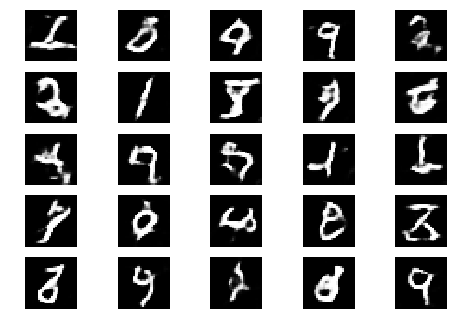

Epoch 0 Batch 201/937 [D loss: 0.739613, acc.: 43.75%] [G loss: 0.039456]
Epoch 0 Batch 202/937 [D loss: 0.700721, acc.: 53.12%] [G loss: 0.035755]


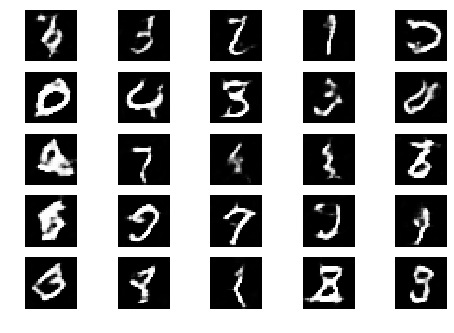

Epoch 0 Batch 203/937 [D loss: 0.853846, acc.: 50.00%] [G loss: 0.047161]
Epoch 0 Batch 204/937 [D loss: 0.805881, acc.: 37.50%] [G loss: 0.042543]


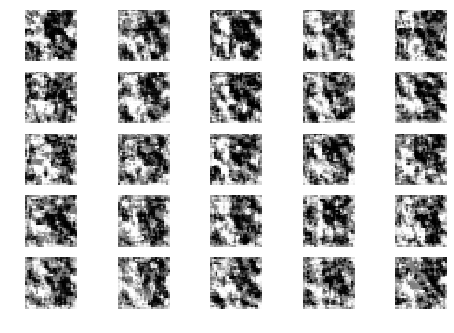

Epoch 0 Batch 205/937 [D loss: 0.851817, acc.: 40.62%] [G loss: 0.052494]
Epoch 0 Batch 206/937 [D loss: 0.772594, acc.: 46.88%] [G loss: 0.045741]
Epoch 0 Batch 207/937 [D loss: 0.864362, acc.: 46.88%] [G loss: 0.045828]
Epoch 0 Batch 208/937 [D loss: 0.730174, acc.: 50.00%] [G loss: 0.041221]
Epoch 0 Batch 209/937 [D loss: 0.692284, acc.: 59.38%] [G loss: 0.045316]
Epoch 0 Batch 210/937 [D loss: 0.663433, acc.: 62.50%] [G loss: 0.033332]
Epoch 0 Batch 211/937 [D loss: 0.762261, acc.: 43.75%] [G loss: 0.037283]
Epoch 0 Batch 212/937 [D loss: 0.645864, acc.: 59.38%] [G loss: 0.036770]
Epoch 0 Batch 213/937 [D loss: 0.693933, acc.: 59.38%] [G loss: 0.036687]
Epoch 0 Batch 214/937 [D loss: 0.823665, acc.: 37.50%] [G loss: 0.027735]
Epoch 0 Batch 215/937 [D loss: 0.809056, acc.: 46.88%] [G loss: 0.047465]
Epoch 0 Batch 216/937 [D loss: 0.835519, acc.: 43.75%] [G loss: 0.030383]
Epoch 0 Batch 217/937 [D loss: 0.532545, acc.: 78.12%] [G loss: 0.038300]
Epoch 0 Batch 218/937 [D loss: 0.86348

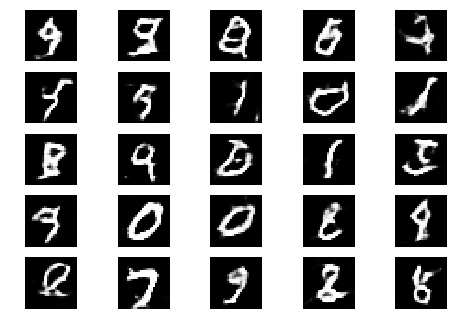

Epoch 0 Batch 301/937 [D loss: 0.681253, acc.: 62.50%] [G loss: 0.028421]
Epoch 0 Batch 302/937 [D loss: 0.846848, acc.: 37.50%] [G loss: 0.019543]
Epoch 0 Batch 303/937 [D loss: 0.593872, acc.: 71.88%] [G loss: 0.019898]


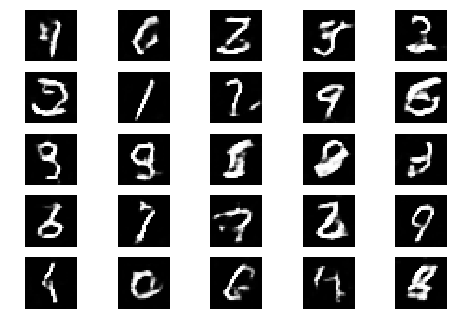

Epoch 0 Batch 304/937 [D loss: 0.794351, acc.: 56.25%] [G loss: 0.021858]
Epoch 0 Batch 305/937 [D loss: 0.831684, acc.: 53.12%] [G loss: 0.017502]
Epoch 0 Batch 306/937 [D loss: 0.822563, acc.: 37.50%] [G loss: 0.023529]


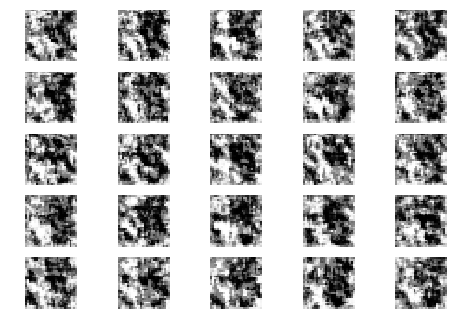

Epoch 0 Batch 307/937 [D loss: 0.768742, acc.: 59.38%] [G loss: 0.016690]
Epoch 0 Batch 308/937 [D loss: 0.660080, acc.: 59.38%] [G loss: 0.016981]
Epoch 0 Batch 309/937 [D loss: 0.794844, acc.: 43.75%] [G loss: 0.014622]
Epoch 0 Batch 310/937 [D loss: 0.682697, acc.: 62.50%] [G loss: 0.016366]
Epoch 0 Batch 311/937 [D loss: 0.788223, acc.: 50.00%] [G loss: 0.015252]
Epoch 0 Batch 312/937 [D loss: 0.764956, acc.: 46.88%] [G loss: 0.013349]
Epoch 0 Batch 313/937 [D loss: 0.608313, acc.: 78.12%] [G loss: 0.015186]
Epoch 0 Batch 314/937 [D loss: 0.750059, acc.: 56.25%] [G loss: 0.014120]
Epoch 0 Batch 315/937 [D loss: 0.901438, acc.: 53.12%] [G loss: 0.015712]
Epoch 0 Batch 316/937 [D loss: 0.798556, acc.: 46.88%] [G loss: 0.014408]
Epoch 0 Batch 317/937 [D loss: 0.790482, acc.: 59.38%] [G loss: 0.016344]
Epoch 0 Batch 318/937 [D loss: 0.783101, acc.: 50.00%] [G loss: 0.013355]
Epoch 0 Batch 319/937 [D loss: 0.679698, acc.: 56.25%] [G loss: 0.015757]
Epoch 0 Batch 320/937 [D loss: 0.82775

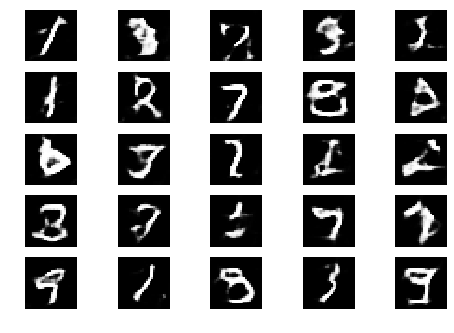

Epoch 0 Batch 401/937 [D loss: 0.755269, acc.: 50.00%] [G loss: 0.020080]
Epoch 0 Batch 402/937 [D loss: 0.669788, acc.: 59.38%] [G loss: 0.018533]
Epoch 0 Batch 403/937 [D loss: 0.724538, acc.: 56.25%] [G loss: 0.012353]
Epoch 0 Batch 404/937 [D loss: 0.677008, acc.: 56.25%] [G loss: 0.012881]


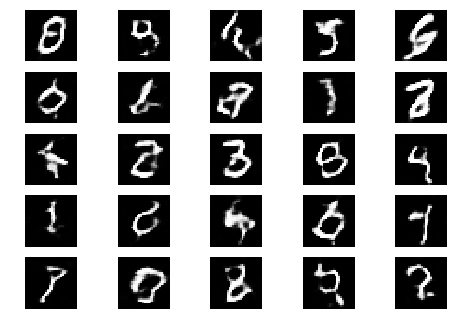

Epoch 0 Batch 405/937 [D loss: 0.765147, acc.: 50.00%] [G loss: 0.013330]
Epoch 0 Batch 406/937 [D loss: 0.842922, acc.: 53.12%] [G loss: 0.011987]
Epoch 0 Batch 407/937 [D loss: 0.724696, acc.: 46.88%] [G loss: 0.008978]
Epoch 0 Batch 408/937 [D loss: 0.786944, acc.: 50.00%] [G loss: 0.010009]


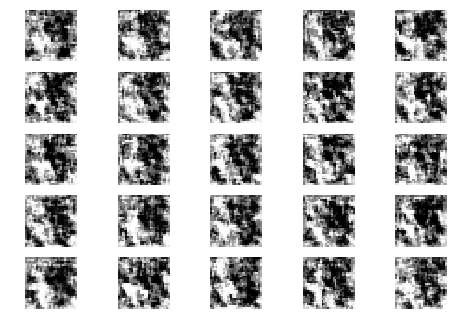

Epoch 0 Batch 409/937 [D loss: 0.826876, acc.: 56.25%] [G loss: 0.011941]
Epoch 0 Batch 410/937 [D loss: 0.759339, acc.: 50.00%] [G loss: 0.010320]
Epoch 0 Batch 411/937 [D loss: 0.761401, acc.: 50.00%] [G loss: 0.011378]
Epoch 0 Batch 412/937 [D loss: 0.699045, acc.: 56.25%] [G loss: 0.009617]
Epoch 0 Batch 413/937 [D loss: 0.609499, acc.: 65.62%] [G loss: 0.014115]
Epoch 0 Batch 414/937 [D loss: 0.686303, acc.: 62.50%] [G loss: 0.012877]
Epoch 0 Batch 415/937 [D loss: 0.619434, acc.: 62.50%] [G loss: 0.010054]
Epoch 0 Batch 416/937 [D loss: 0.654513, acc.: 65.62%] [G loss: 0.012523]
Epoch 0 Batch 417/937 [D loss: 0.964049, acc.: 28.12%] [G loss: 0.009938]
Epoch 0 Batch 418/937 [D loss: 0.526391, acc.: 75.00%] [G loss: 0.007409]
Epoch 0 Batch 419/937 [D loss: 0.598769, acc.: 62.50%] [G loss: 0.008600]
Epoch 0 Batch 420/937 [D loss: 0.685395, acc.: 59.38%] [G loss: 0.009279]
Epoch 0 Batch 421/937 [D loss: 0.775031, acc.: 62.50%] [G loss: 0.007896]
Epoch 0 Batch 422/937 [D loss: 0.65271

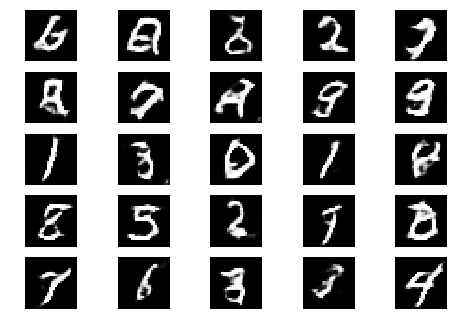

Epoch 0 Batch 501/937 [D loss: 0.898941, acc.: 53.12%] [G loss: 0.003168]
Epoch 0 Batch 502/937 [D loss: 0.628945, acc.: 71.88%] [G loss: 0.003363]
Epoch 0 Batch 503/937 [D loss: 0.829130, acc.: 50.00%] [G loss: 0.003077]
Epoch 0 Batch 504/937 [D loss: 0.644633, acc.: 68.75%] [G loss: 0.002587]
Epoch 0 Batch 505/937 [D loss: 0.923572, acc.: 37.50%] [G loss: 0.003427]


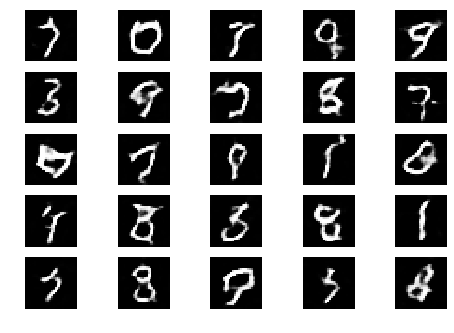

Epoch 0 Batch 506/937 [D loss: 0.769154, acc.: 53.12%] [G loss: 0.004452]
Epoch 0 Batch 507/937 [D loss: 0.742170, acc.: 59.38%] [G loss: 0.004810]
Epoch 0 Batch 508/937 [D loss: 0.638001, acc.: 53.12%] [G loss: 0.003838]
Epoch 0 Batch 509/937 [D loss: 0.780364, acc.: 50.00%] [G loss: 0.005582]
Epoch 0 Batch 510/937 [D loss: 0.688637, acc.: 56.25%] [G loss: 0.005123]


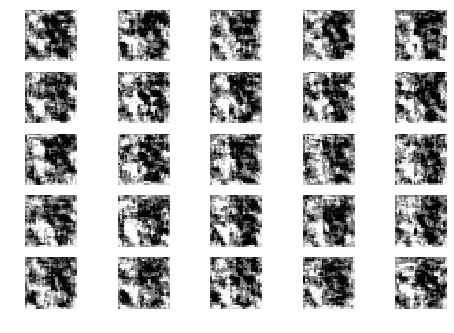

Epoch 0 Batch 511/937 [D loss: 0.796506, acc.: 56.25%] [G loss: 0.005384]
Epoch 0 Batch 512/937 [D loss: 0.651349, acc.: 68.75%] [G loss: 0.004488]
Epoch 0 Batch 513/937 [D loss: 0.861514, acc.: 53.12%] [G loss: 0.005252]
Epoch 0 Batch 514/937 [D loss: 0.564664, acc.: 75.00%] [G loss: 0.003378]
Epoch 0 Batch 515/937 [D loss: 0.692971, acc.: 46.88%] [G loss: 0.003880]
Epoch 0 Batch 516/937 [D loss: 0.765075, acc.: 53.12%] [G loss: 0.004637]
Epoch 0 Batch 517/937 [D loss: 0.553761, acc.: 71.88%] [G loss: 0.004099]
Epoch 0 Batch 518/937 [D loss: 0.669615, acc.: 59.38%] [G loss: 0.004138]
Epoch 0 Batch 519/937 [D loss: 0.628043, acc.: 65.62%] [G loss: 0.003841]
Epoch 0 Batch 520/937 [D loss: 0.780721, acc.: 46.88%] [G loss: 0.004236]
Epoch 0 Batch 521/937 [D loss: 0.699414, acc.: 62.50%] [G loss: 0.003945]
Epoch 0 Batch 522/937 [D loss: 0.684037, acc.: 56.25%] [G loss: 0.005777]
Epoch 0 Batch 523/937 [D loss: 0.678070, acc.: 62.50%] [G loss: 0.006105]
Epoch 0 Batch 524/937 [D loss: 0.73693

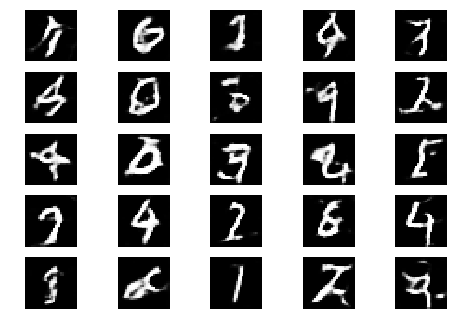

Epoch 0 Batch 601/937 [D loss: 0.902234, acc.: 43.75%] [G loss: 0.001956]
Epoch 0 Batch 602/937 [D loss: 0.862755, acc.: 46.88%] [G loss: 0.002180]
Epoch 0 Batch 603/937 [D loss: 0.692676, acc.: 59.38%] [G loss: 0.002192]
Epoch 0 Batch 604/937 [D loss: 0.681488, acc.: 68.75%] [G loss: 0.001585]
Epoch 0 Batch 605/937 [D loss: 0.701978, acc.: 62.50%] [G loss: 0.002490]
Epoch 0 Batch 606/937 [D loss: 0.600153, acc.: 62.50%] [G loss: 0.001925]


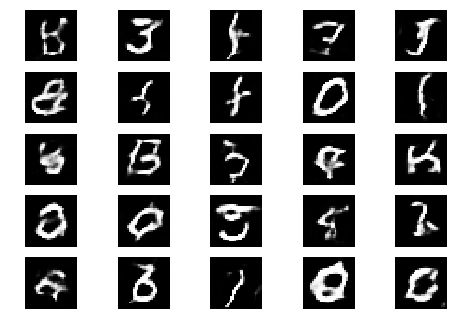

Epoch 0 Batch 607/937 [D loss: 0.610619, acc.: 53.12%] [G loss: 0.002388]
Epoch 0 Batch 608/937 [D loss: 0.453393, acc.: 81.25%] [G loss: 0.001906]
Epoch 0 Batch 609/937 [D loss: 0.780823, acc.: 46.88%] [G loss: 0.001606]
Epoch 0 Batch 610/937 [D loss: 0.736440, acc.: 65.62%] [G loss: 0.002235]
Epoch 0 Batch 611/937 [D loss: 0.713736, acc.: 59.38%] [G loss: 0.002078]
Epoch 0 Batch 612/937 [D loss: 0.615627, acc.: 71.88%] [G loss: 0.001846]


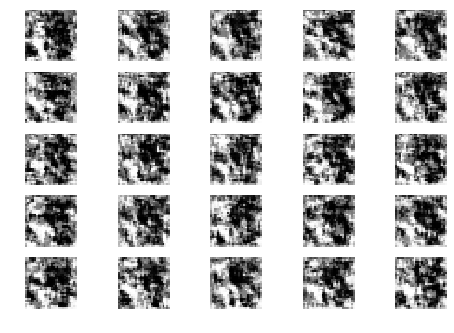

Epoch 0 Batch 613/937 [D loss: 0.840540, acc.: 40.62%] [G loss: 0.002501]
Epoch 0 Batch 614/937 [D loss: 0.703375, acc.: 68.75%] [G loss: 0.002012]
Epoch 0 Batch 615/937 [D loss: 0.739654, acc.: 56.25%] [G loss: 0.001797]
Epoch 0 Batch 616/937 [D loss: 0.919613, acc.: 43.75%] [G loss: 0.001996]
Epoch 0 Batch 617/937 [D loss: 0.931075, acc.: 43.75%] [G loss: 0.001539]
Epoch 0 Batch 618/937 [D loss: 0.847820, acc.: 43.75%] [G loss: 0.002062]
Epoch 0 Batch 619/937 [D loss: 0.535907, acc.: 71.88%] [G loss: 0.002706]
Epoch 0 Batch 620/937 [D loss: 0.576991, acc.: 75.00%] [G loss: 0.001926]
Epoch 0 Batch 621/937 [D loss: 0.885228, acc.: 37.50%] [G loss: 0.001512]
Epoch 0 Batch 622/937 [D loss: 0.677229, acc.: 53.12%] [G loss: 0.001581]
Epoch 0 Batch 623/937 [D loss: 0.751363, acc.: 65.62%] [G loss: 0.002170]
Epoch 0 Batch 624/937 [D loss: 0.657860, acc.: 62.50%] [G loss: 0.001969]
Epoch 0 Batch 625/937 [D loss: 0.688005, acc.: 53.12%] [G loss: 0.002182]
Epoch 0 Batch 626/937 [D loss: 0.53553

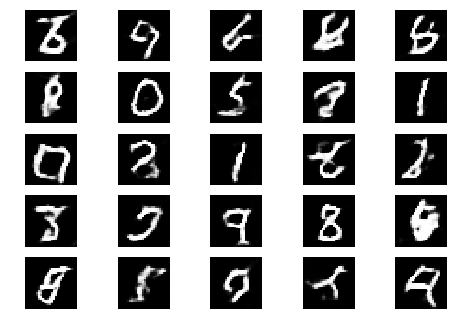

Epoch 0 Batch 701/937 [D loss: 0.871957, acc.: 40.62%] [G loss: 0.002990]
Epoch 0 Batch 702/937 [D loss: 0.871437, acc.: 34.38%] [G loss: 0.002851]
Epoch 0 Batch 703/937 [D loss: 0.627422, acc.: 59.38%] [G loss: 0.002192]
Epoch 0 Batch 704/937 [D loss: 1.084067, acc.: 28.12%] [G loss: 0.002415]
Epoch 0 Batch 705/937 [D loss: 0.671139, acc.: 50.00%] [G loss: 0.001857]
Epoch 0 Batch 706/937 [D loss: 0.699470, acc.: 68.75%] [G loss: 0.003007]
Epoch 0 Batch 707/937 [D loss: 0.624081, acc.: 71.88%] [G loss: 0.001993]


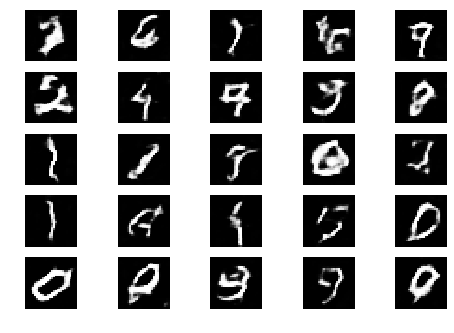

Epoch 0 Batch 708/937 [D loss: 0.719275, acc.: 59.38%] [G loss: 0.002059]
Epoch 0 Batch 709/937 [D loss: 0.471564, acc.: 78.12%] [G loss: 0.001814]
Epoch 0 Batch 710/937 [D loss: 0.681632, acc.: 56.25%] [G loss: 0.002825]
Epoch 0 Batch 711/937 [D loss: 0.520396, acc.: 75.00%] [G loss: 0.002085]
Epoch 0 Batch 712/937 [D loss: 0.850672, acc.: 43.75%] [G loss: 0.002168]
Epoch 0 Batch 713/937 [D loss: 0.736659, acc.: 59.38%] [G loss: 0.002370]
Epoch 0 Batch 714/937 [D loss: 0.657066, acc.: 62.50%] [G loss: 0.002191]


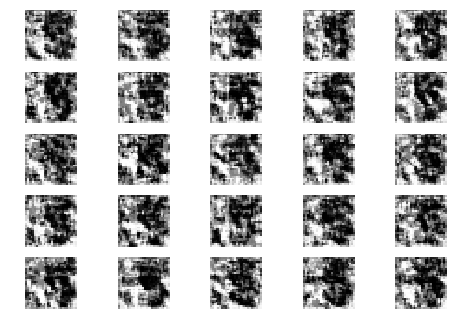

Epoch 0 Batch 715/937 [D loss: 0.736876, acc.: 53.12%] [G loss: 0.002255]
Epoch 0 Batch 716/937 [D loss: 0.780284, acc.: 40.62%] [G loss: 0.001453]
Epoch 0 Batch 717/937 [D loss: 0.631165, acc.: 62.50%] [G loss: 0.002595]
Epoch 0 Batch 718/937 [D loss: 0.600361, acc.: 59.38%] [G loss: 0.002052]
Epoch 0 Batch 719/937 [D loss: 0.985212, acc.: 50.00%] [G loss: 0.002072]
Epoch 0 Batch 720/937 [D loss: 0.804224, acc.: 53.12%] [G loss: 0.002005]
Epoch 0 Batch 721/937 [D loss: 0.808478, acc.: 46.88%] [G loss: 0.002214]
Epoch 0 Batch 722/937 [D loss: 0.823070, acc.: 56.25%] [G loss: 0.002267]
Epoch 0 Batch 723/937 [D loss: 0.637390, acc.: 68.75%] [G loss: 0.001999]
Epoch 0 Batch 724/937 [D loss: 0.431724, acc.: 75.00%] [G loss: 0.001576]
Epoch 0 Batch 725/937 [D loss: 0.576864, acc.: 68.75%] [G loss: 0.001857]
Epoch 0 Batch 726/937 [D loss: 0.571586, acc.: 71.88%] [G loss: 0.001692]
Epoch 0 Batch 727/937 [D loss: 0.544630, acc.: 71.88%] [G loss: 0.001743]
Epoch 0 Batch 728/937 [D loss: 0.76045

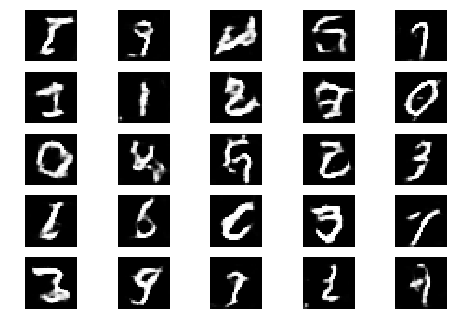

Epoch 0 Batch 801/937 [D loss: 0.651225, acc.: 56.25%] [G loss: 0.000655]
Epoch 0 Batch 802/937 [D loss: 1.003294, acc.: 40.62%] [G loss: 0.000519]
Epoch 0 Batch 803/937 [D loss: 0.571269, acc.: 68.75%] [G loss: 0.000713]
Epoch 0 Batch 804/937 [D loss: 0.698603, acc.: 46.88%] [G loss: 0.000544]
Epoch 0 Batch 805/937 [D loss: 0.795183, acc.: 53.12%] [G loss: 0.000701]
Epoch 0 Batch 806/937 [D loss: 0.460430, acc.: 84.38%] [G loss: 0.000746]
Epoch 0 Batch 807/937 [D loss: 0.641566, acc.: 59.38%] [G loss: 0.000812]
Epoch 0 Batch 808/937 [D loss: 0.647684, acc.: 62.50%] [G loss: 0.000812]


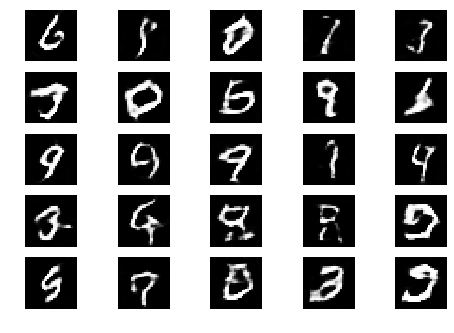

Epoch 0 Batch 809/937 [D loss: 0.711043, acc.: 65.62%] [G loss: 0.000816]
Epoch 0 Batch 810/937 [D loss: 0.678923, acc.: 62.50%] [G loss: 0.000733]
Epoch 0 Batch 811/937 [D loss: 0.697818, acc.: 62.50%] [G loss: 0.000985]
Epoch 0 Batch 812/937 [D loss: 0.696896, acc.: 50.00%] [G loss: 0.000772]
Epoch 0 Batch 813/937 [D loss: 0.776209, acc.: 56.25%] [G loss: 0.000816]
Epoch 0 Batch 814/937 [D loss: 0.566206, acc.: 65.62%] [G loss: 0.000746]
Epoch 0 Batch 815/937 [D loss: 0.433534, acc.: 78.12%] [G loss: 0.000484]
Epoch 0 Batch 816/937 [D loss: 0.875059, acc.: 46.88%] [G loss: 0.000689]


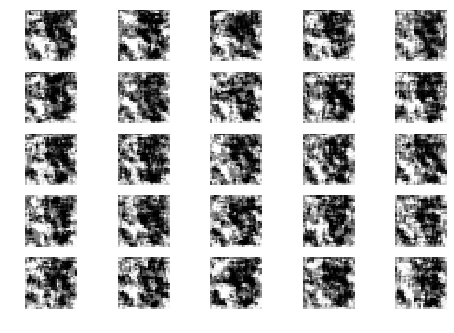

Epoch 0 Batch 817/937 [D loss: 0.562876, acc.: 62.50%] [G loss: 0.000868]
Epoch 0 Batch 818/937 [D loss: 0.769255, acc.: 37.50%] [G loss: 0.000622]
Epoch 0 Batch 819/937 [D loss: 0.697555, acc.: 56.25%] [G loss: 0.000608]
Epoch 0 Batch 820/937 [D loss: 0.701978, acc.: 53.12%] [G loss: 0.000988]
Epoch 0 Batch 821/937 [D loss: 0.506166, acc.: 68.75%] [G loss: 0.001063]
Epoch 0 Batch 822/937 [D loss: 0.574586, acc.: 62.50%] [G loss: 0.000715]
Epoch 0 Batch 823/937 [D loss: 0.751736, acc.: 46.88%] [G loss: 0.000776]
Epoch 0 Batch 824/937 [D loss: 0.551381, acc.: 75.00%] [G loss: 0.000799]
Epoch 0 Batch 825/937 [D loss: 0.498735, acc.: 81.25%] [G loss: 0.000995]
Epoch 0 Batch 826/937 [D loss: 0.620409, acc.: 68.75%] [G loss: 0.000507]
Epoch 0 Batch 827/937 [D loss: 0.657062, acc.: 56.25%] [G loss: 0.001146]
Epoch 0 Batch 828/937 [D loss: 0.637059, acc.: 62.50%] [G loss: 0.000555]
Epoch 0 Batch 829/937 [D loss: 0.859898, acc.: 56.25%] [G loss: 0.000615]
Epoch 0 Batch 830/937 [D loss: 0.80428

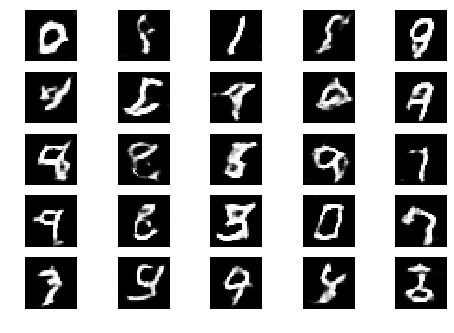

Epoch 0 Batch 901/937 [D loss: 0.357950, acc.: 87.50%] [G loss: 0.000639]
Epoch 0 Batch 902/937 [D loss: 0.711422, acc.: 62.50%] [G loss: 0.000523]
Epoch 0 Batch 903/937 [D loss: 0.555598, acc.: 78.12%] [G loss: 0.000655]
Epoch 0 Batch 904/937 [D loss: 0.438480, acc.: 81.25%] [G loss: 0.000723]
Epoch 0 Batch 905/937 [D loss: 0.792825, acc.: 40.62%] [G loss: 0.000598]
Epoch 0 Batch 906/937 [D loss: 0.558249, acc.: 62.50%] [G loss: 0.000504]
Epoch 0 Batch 907/937 [D loss: 0.594608, acc.: 65.62%] [G loss: 0.000525]
Epoch 0 Batch 908/937 [D loss: 0.432991, acc.: 81.25%] [G loss: 0.000607]
Epoch 0 Batch 909/937 [D loss: 0.386631, acc.: 87.50%] [G loss: 0.000568]


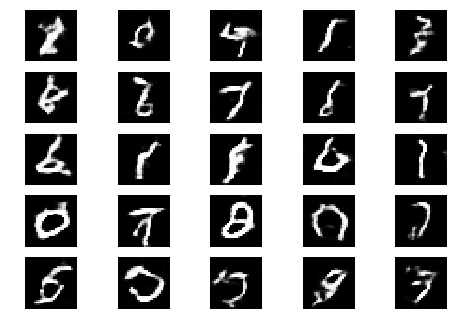

Epoch 0 Batch 910/937 [D loss: 0.757269, acc.: 56.25%] [G loss: 0.000751]
Epoch 0 Batch 911/937 [D loss: 0.750323, acc.: 53.12%] [G loss: 0.000412]
Epoch 0 Batch 912/937 [D loss: 0.625191, acc.: 68.75%] [G loss: 0.000447]
Epoch 0 Batch 913/937 [D loss: 0.742750, acc.: 62.50%] [G loss: 0.000405]
Epoch 0 Batch 914/937 [D loss: 0.439622, acc.: 81.25%] [G loss: 0.000447]
Epoch 0 Batch 915/937 [D loss: 0.640792, acc.: 62.50%] [G loss: 0.000545]
Epoch 0 Batch 916/937 [D loss: 0.743810, acc.: 46.88%] [G loss: 0.000637]
Epoch 0 Batch 917/937 [D loss: 0.532044, acc.: 75.00%] [G loss: 0.000364]
Epoch 0 Batch 918/937 [D loss: 0.576228, acc.: 65.62%] [G loss: 0.000798]


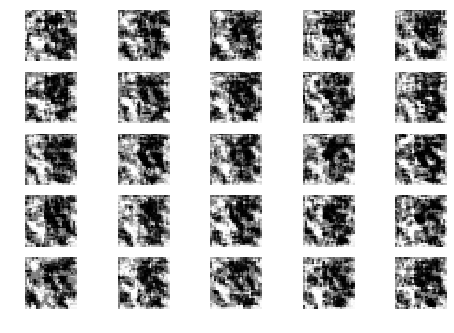

Epoch 0 Batch 919/937 [D loss: 0.601061, acc.: 62.50%] [G loss: 0.000690]
Epoch 0 Batch 920/937 [D loss: 0.572578, acc.: 71.88%] [G loss: 0.000583]
Epoch 0 Batch 921/937 [D loss: 0.871131, acc.: 43.75%] [G loss: 0.000698]
Epoch 0 Batch 922/937 [D loss: 0.511756, acc.: 62.50%] [G loss: 0.000591]
Epoch 0 Batch 923/937 [D loss: 0.579431, acc.: 56.25%] [G loss: 0.000541]
Epoch 0 Batch 924/937 [D loss: 1.049672, acc.: 40.62%] [G loss: 0.000816]
Epoch 0 Batch 925/937 [D loss: 0.615556, acc.: 65.62%] [G loss: 0.000669]
Epoch 0 Batch 926/937 [D loss: 0.641577, acc.: 68.75%] [G loss: 0.001000]
Epoch 0 Batch 927/937 [D loss: 0.517728, acc.: 68.75%] [G loss: 0.000425]
Epoch 0 Batch 928/937 [D loss: 0.465851, acc.: 78.12%] [G loss: 0.000844]
Epoch 0 Batch 929/937 [D loss: 0.466714, acc.: 81.25%] [G loss: 0.000479]
Epoch 0 Batch 930/937 [D loss: 0.583637, acc.: 56.25%] [G loss: 0.000556]
Epoch 0 Batch 931/937 [D loss: 1.024160, acc.: 43.75%] [G loss: 0.000733]
Epoch 0 Batch 932/937 [D loss: 0.40036

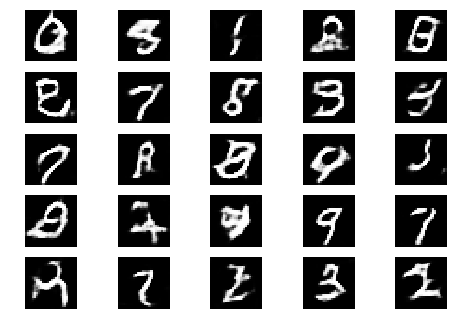

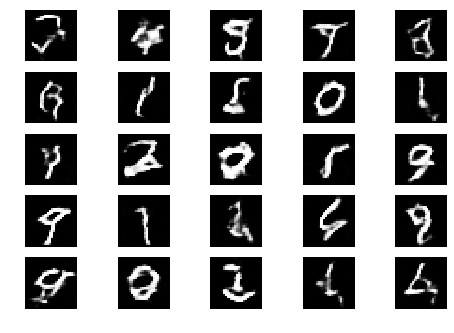

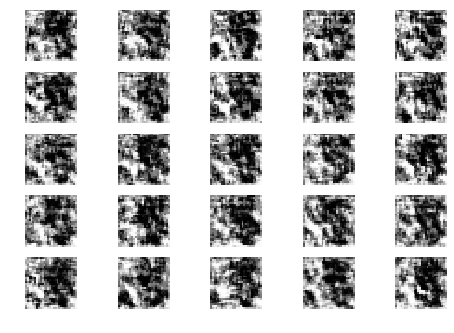

Epoch 1 Batch 1/937 [D loss: 0.491583, acc.: 78.12%] [G loss: 0.000859]
Epoch 1 Batch 2/937 [D loss: 0.584872, acc.: 78.12%] [G loss: 0.001019]
Epoch 1 Batch 3/937 [D loss: 0.640435, acc.: 59.38%] [G loss: 0.000935]
Epoch 1 Batch 4/937 [D loss: 0.406942, acc.: 84.38%] [G loss: 0.000577]
Epoch 1 Batch 5/937 [D loss: 0.701116, acc.: 53.12%] [G loss: 0.000577]
Epoch 1 Batch 6/937 [D loss: 0.769245, acc.: 59.38%] [G loss: 0.000645]
Epoch 1 Batch 7/937 [D loss: 0.538741, acc.: 68.75%] [G loss: 0.000582]
Epoch 1 Batch 8/937 [D loss: 0.566406, acc.: 65.62%] [G loss: 0.000683]
Epoch 1 Batch 9/937 [D loss: 0.477429, acc.: 81.25%] [G loss: 0.000522]
Epoch 1 Batch 10/937 [D loss: 0.955270, acc.: 43.75%] [G loss: 0.000578]
Epoch 1 Batch 11/937 [D loss: 0.877905, acc.: 34.38%] [G loss: 0.000788]
Epoch 1 Batch 12/937 [D loss: 0.642117, acc.: 68.75%] [G loss: 0.000743]
Epoch 1 Batch 13/937 [D loss: 0.580647, acc.: 75.00%] [G loss: 0.000555]
Epoch 1 Batch 14/937 [D loss: 1.033095, acc.: 28.12%] [G los

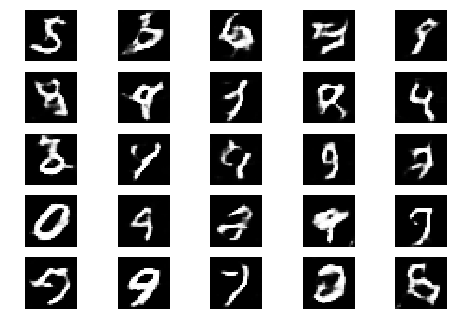

Epoch 1 Batch 101/937 [D loss: 0.482117, acc.: 81.25%] [G loss: 0.000491]


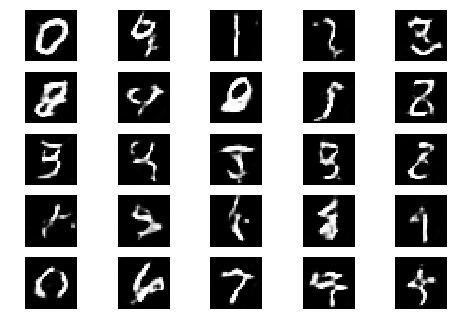

Epoch 1 Batch 102/937 [D loss: 0.693367, acc.: 56.25%] [G loss: 0.000300]


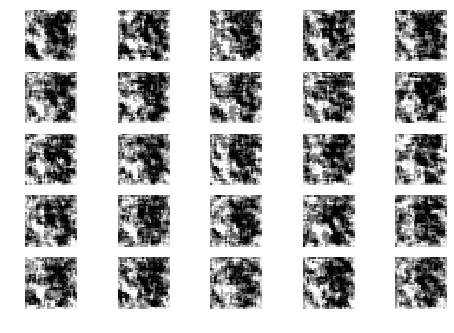

Epoch 1 Batch 103/937 [D loss: 0.263448, acc.: 90.62%] [G loss: 0.000370]
Epoch 1 Batch 104/937 [D loss: 0.536549, acc.: 71.88%] [G loss: 0.000324]
Epoch 1 Batch 105/937 [D loss: 0.408607, acc.: 87.50%] [G loss: 0.000569]
Epoch 1 Batch 106/937 [D loss: 0.789871, acc.: 43.75%] [G loss: 0.000464]
Epoch 1 Batch 107/937 [D loss: 0.613067, acc.: 68.75%] [G loss: 0.000406]
Epoch 1 Batch 108/937 [D loss: 0.520900, acc.: 78.12%] [G loss: 0.000417]
Epoch 1 Batch 109/937 [D loss: 0.781157, acc.: 62.50%] [G loss: 0.000617]
Epoch 1 Batch 110/937 [D loss: 0.511775, acc.: 78.12%] [G loss: 0.000522]
Epoch 1 Batch 111/937 [D loss: 0.401042, acc.: 84.38%] [G loss: 0.000334]
Epoch 1 Batch 112/937 [D loss: 0.557337, acc.: 68.75%] [G loss: 0.000361]
Epoch 1 Batch 113/937 [D loss: 0.954768, acc.: 46.88%] [G loss: 0.000408]
Epoch 1 Batch 114/937 [D loss: 0.363527, acc.: 78.12%] [G loss: 0.000491]
Epoch 1 Batch 115/937 [D loss: 0.379239, acc.: 87.50%] [G loss: 0.000418]
Epoch 1 Batch 116/937 [D loss: 1.23614

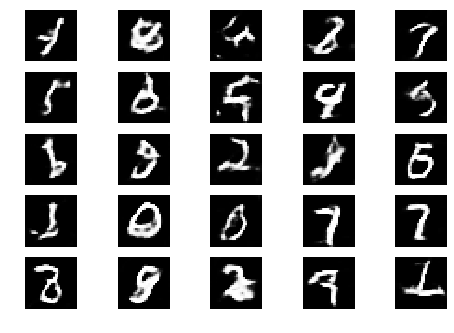

Epoch 1 Batch 201/937 [D loss: 0.436964, acc.: 81.25%] [G loss: 0.000159]
Epoch 1 Batch 202/937 [D loss: 0.451599, acc.: 78.12%] [G loss: 0.000091]


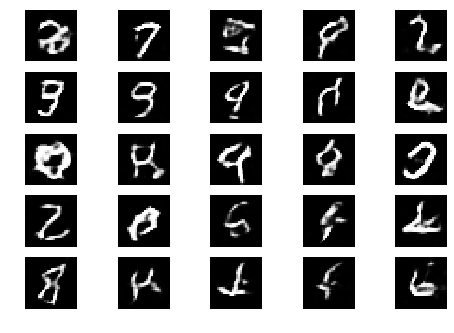

Epoch 1 Batch 203/937 [D loss: 0.402684, acc.: 84.38%] [G loss: 0.000214]
Epoch 1 Batch 204/937 [D loss: 0.585091, acc.: 65.62%] [G loss: 0.000287]


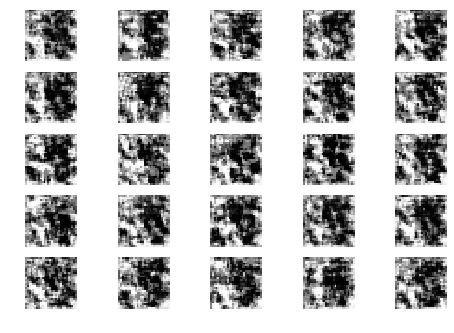

Epoch 1 Batch 205/937 [D loss: 0.318899, acc.: 93.75%] [G loss: 0.000174]
Epoch 1 Batch 206/937 [D loss: 0.456659, acc.: 78.12%] [G loss: 0.000146]
Epoch 1 Batch 207/937 [D loss: 0.791485, acc.: 62.50%] [G loss: 0.000122]
Epoch 1 Batch 208/937 [D loss: 1.287225, acc.: 12.50%] [G loss: 0.000152]
Epoch 1 Batch 209/937 [D loss: 0.661314, acc.: 59.38%] [G loss: 0.000124]
Epoch 1 Batch 210/937 [D loss: 0.650756, acc.: 71.88%] [G loss: 0.000248]
Epoch 1 Batch 211/937 [D loss: 0.577432, acc.: 65.62%] [G loss: 0.000160]
Epoch 1 Batch 212/937 [D loss: 0.272799, acc.: 96.88%] [G loss: 0.000150]
Epoch 1 Batch 213/937 [D loss: 0.614906, acc.: 62.50%] [G loss: 0.000158]
Epoch 1 Batch 214/937 [D loss: 0.661247, acc.: 59.38%] [G loss: 0.000091]
Epoch 1 Batch 215/937 [D loss: 0.602728, acc.: 62.50%] [G loss: 0.000192]
Epoch 1 Batch 216/937 [D loss: 0.575778, acc.: 68.75%] [G loss: 0.000193]
Epoch 1 Batch 217/937 [D loss: 0.262099, acc.: 96.88%] [G loss: 0.000259]
Epoch 1 Batch 218/937 [D loss: 0.52768

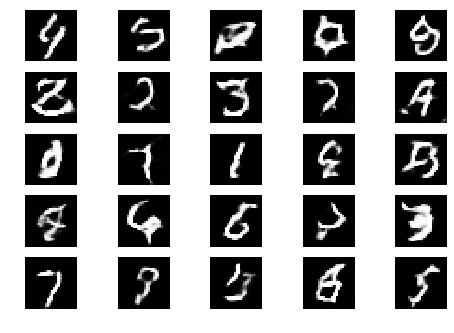

Epoch 1 Batch 301/937 [D loss: 0.654366, acc.: 68.75%] [G loss: 0.000297]
Epoch 1 Batch 302/937 [D loss: 0.601361, acc.: 71.88%] [G loss: 0.000100]
Epoch 1 Batch 303/937 [D loss: 0.320137, acc.: 87.50%] [G loss: 0.000076]


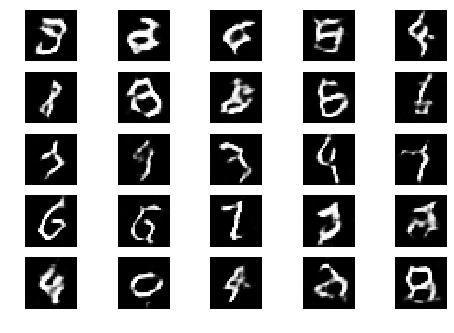

Epoch 1 Batch 304/937 [D loss: 0.539950, acc.: 68.75%] [G loss: 0.000101]
Epoch 1 Batch 305/937 [D loss: 0.829621, acc.: 59.38%] [G loss: 0.000114]
Epoch 1 Batch 306/937 [D loss: 0.579987, acc.: 65.62%] [G loss: 0.000054]


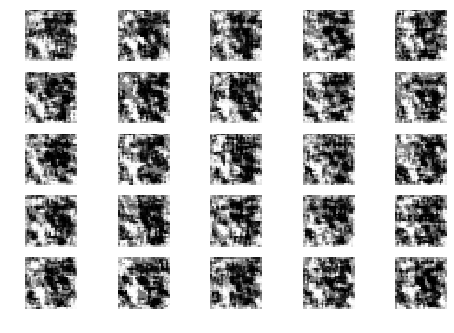

Epoch 1 Batch 307/937 [D loss: 0.681698, acc.: 68.75%] [G loss: 0.000113]
Epoch 1 Batch 308/937 [D loss: 0.349377, acc.: 84.38%] [G loss: 0.000075]
Epoch 1 Batch 309/937 [D loss: 0.525955, acc.: 78.12%] [G loss: 0.000083]
Epoch 1 Batch 310/937 [D loss: 0.298109, acc.: 93.75%] [G loss: 0.000086]
Epoch 1 Batch 311/937 [D loss: 0.588313, acc.: 81.25%] [G loss: 0.000114]
Epoch 1 Batch 312/937 [D loss: 0.487582, acc.: 90.62%] [G loss: 0.000119]
Epoch 1 Batch 313/937 [D loss: 1.053898, acc.: 50.00%] [G loss: 0.000119]
Epoch 1 Batch 314/937 [D loss: 0.882267, acc.: 56.25%] [G loss: 0.000128]
Epoch 1 Batch 315/937 [D loss: 0.553510, acc.: 65.62%] [G loss: 0.000120]
Epoch 1 Batch 316/937 [D loss: 0.431024, acc.: 84.38%] [G loss: 0.000075]
Epoch 1 Batch 317/937 [D loss: 0.330177, acc.: 90.62%] [G loss: 0.000089]
Epoch 1 Batch 318/937 [D loss: 0.411369, acc.: 75.00%] [G loss: 0.000160]
Epoch 1 Batch 319/937 [D loss: 0.608109, acc.: 62.50%] [G loss: 0.000134]
Epoch 1 Batch 320/937 [D loss: 0.19471

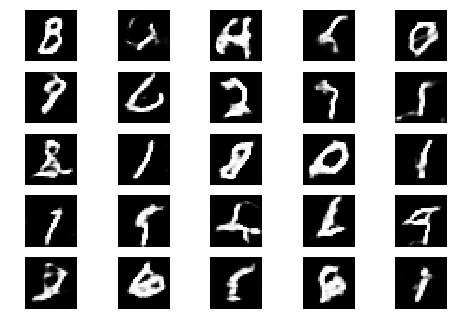

Epoch 1 Batch 401/937 [D loss: 0.765729, acc.: 53.12%] [G loss: 0.000097]
Epoch 1 Batch 402/937 [D loss: 0.605217, acc.: 71.88%] [G loss: 0.000080]
Epoch 1 Batch 403/937 [D loss: 0.603256, acc.: 68.75%] [G loss: 0.000135]
Epoch 1 Batch 404/937 [D loss: 0.475678, acc.: 75.00%] [G loss: 0.000090]


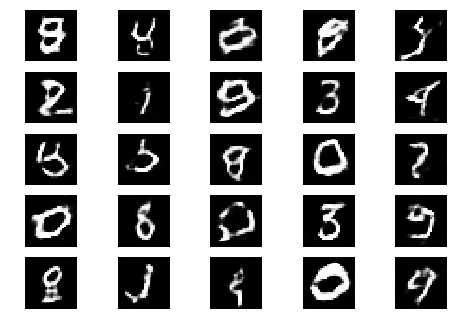

Epoch 1 Batch 405/937 [D loss: 0.545999, acc.: 71.88%] [G loss: 0.000117]
Epoch 1 Batch 406/937 [D loss: 0.330008, acc.: 93.75%] [G loss: 0.000083]
Epoch 1 Batch 407/937 [D loss: 0.332547, acc.: 93.75%] [G loss: 0.000065]
Epoch 1 Batch 408/937 [D loss: 0.199016, acc.: 96.88%] [G loss: 0.000052]


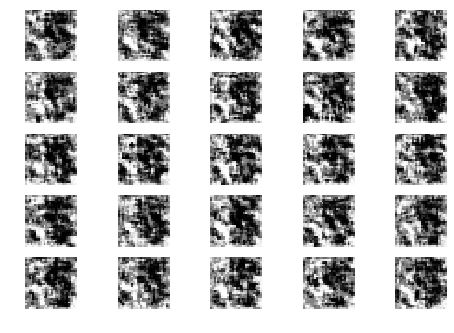

Epoch 1 Batch 409/937 [D loss: 0.398499, acc.: 84.38%] [G loss: 0.000049]
Epoch 1 Batch 410/937 [D loss: 0.807855, acc.: 46.88%] [G loss: 0.000053]
Epoch 1 Batch 411/937 [D loss: 0.783041, acc.: 59.38%] [G loss: 0.000077]
Epoch 1 Batch 412/937 [D loss: 0.566233, acc.: 68.75%] [G loss: 0.000090]
Epoch 1 Batch 413/937 [D loss: 0.458963, acc.: 81.25%] [G loss: 0.000084]
Epoch 1 Batch 414/937 [D loss: 0.664845, acc.: 65.62%] [G loss: 0.000068]
Epoch 1 Batch 415/937 [D loss: 0.729399, acc.: 56.25%] [G loss: 0.000076]
Epoch 1 Batch 416/937 [D loss: 0.490121, acc.: 68.75%] [G loss: 0.000144]
Epoch 1 Batch 417/937 [D loss: 0.476943, acc.: 75.00%] [G loss: 0.000268]
Epoch 1 Batch 418/937 [D loss: 0.455967, acc.: 84.38%] [G loss: 0.000070]
Epoch 1 Batch 419/937 [D loss: 0.888334, acc.: 50.00%] [G loss: 0.000072]
Epoch 1 Batch 420/937 [D loss: 0.404226, acc.: 81.25%] [G loss: 0.000075]
Epoch 1 Batch 421/937 [D loss: 0.963830, acc.: 50.00%] [G loss: 0.000087]
Epoch 1 Batch 422/937 [D loss: 0.61706

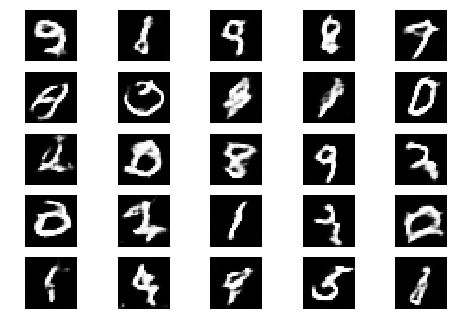

Epoch 1 Batch 501/937 [D loss: 0.513452, acc.: 78.12%] [G loss: 0.000047]
Epoch 1 Batch 502/937 [D loss: 0.377251, acc.: 78.12%] [G loss: 0.000050]
Epoch 1 Batch 503/937 [D loss: 0.436793, acc.: 75.00%] [G loss: 0.000047]
Epoch 1 Batch 504/937 [D loss: 0.307231, acc.: 90.62%] [G loss: 0.000025]
Epoch 1 Batch 505/937 [D loss: 1.087207, acc.: 34.38%] [G loss: 0.000027]


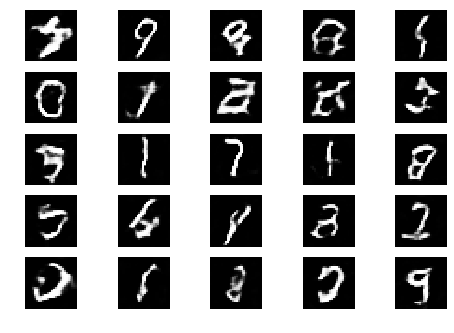

Epoch 1 Batch 506/937 [D loss: 0.740837, acc.: 59.38%] [G loss: 0.000028]
Epoch 1 Batch 507/937 [D loss: 0.383577, acc.: 87.50%] [G loss: 0.000047]
Epoch 1 Batch 508/937 [D loss: 0.275083, acc.: 90.62%] [G loss: 0.000050]
Epoch 1 Batch 509/937 [D loss: 0.622983, acc.: 68.75%] [G loss: 0.000033]
Epoch 1 Batch 510/937 [D loss: 0.333490, acc.: 90.62%] [G loss: 0.000040]


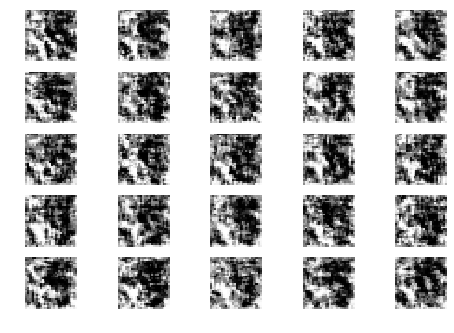

Epoch 1 Batch 511/937 [D loss: 0.771868, acc.: 56.25%] [G loss: 0.000042]
Epoch 1 Batch 512/937 [D loss: 0.319441, acc.: 90.62%] [G loss: 0.000035]
Epoch 1 Batch 513/937 [D loss: 0.315142, acc.: 93.75%] [G loss: 0.000047]
Epoch 1 Batch 514/937 [D loss: 0.364862, acc.: 87.50%] [G loss: 0.000021]
Epoch 1 Batch 515/937 [D loss: 0.626140, acc.: 65.62%] [G loss: 0.000025]
Epoch 1 Batch 516/937 [D loss: 0.379583, acc.: 87.50%] [G loss: 0.000024]
Epoch 1 Batch 517/937 [D loss: 0.500643, acc.: 75.00%] [G loss: 0.000032]
Epoch 1 Batch 518/937 [D loss: 0.534668, acc.: 75.00%] [G loss: 0.000021]
Epoch 1 Batch 519/937 [D loss: 0.499845, acc.: 71.88%] [G loss: 0.000030]
Epoch 1 Batch 520/937 [D loss: 0.655417, acc.: 62.50%] [G loss: 0.000026]
Epoch 1 Batch 521/937 [D loss: 0.597436, acc.: 68.75%] [G loss: 0.000029]
Epoch 1 Batch 522/937 [D loss: 0.416732, acc.: 90.62%] [G loss: 0.000040]
Epoch 1 Batch 523/937 [D loss: 0.569593, acc.: 65.62%] [G loss: 0.000045]
Epoch 1 Batch 524/937 [D loss: 0.84717

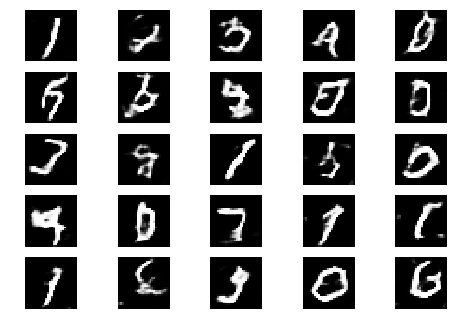

Epoch 1 Batch 601/937 [D loss: 0.112089, acc.: 100.00%] [G loss: 0.000007]
Epoch 1 Batch 602/937 [D loss: 0.211578, acc.: 96.88%] [G loss: 0.000013]
Epoch 1 Batch 603/937 [D loss: 0.562171, acc.: 75.00%] [G loss: 0.000005]
Epoch 1 Batch 604/937 [D loss: 0.926550, acc.: 59.38%] [G loss: 0.000010]
Epoch 1 Batch 605/937 [D loss: 0.483189, acc.: 81.25%] [G loss: 0.000017]
Epoch 1 Batch 606/937 [D loss: 0.595302, acc.: 68.75%] [G loss: 0.000010]


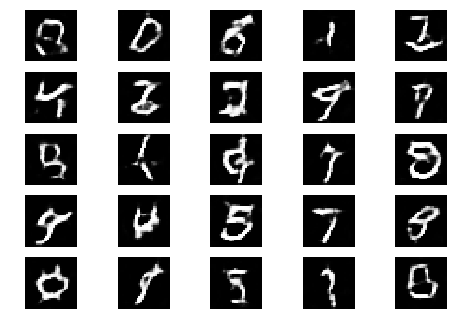

Epoch 1 Batch 607/937 [D loss: 0.786845, acc.: 53.12%] [G loss: 0.000004]
Epoch 1 Batch 608/937 [D loss: 0.261231, acc.: 90.62%] [G loss: 0.000012]
Epoch 1 Batch 609/937 [D loss: 0.228849, acc.: 90.62%] [G loss: 0.000008]
Epoch 1 Batch 610/937 [D loss: 0.581891, acc.: 68.75%] [G loss: 0.000032]
Epoch 1 Batch 611/937 [D loss: 1.129241, acc.: 34.38%] [G loss: 0.000020]
Epoch 1 Batch 612/937 [D loss: 0.133948, acc.: 96.88%] [G loss: 0.000006]


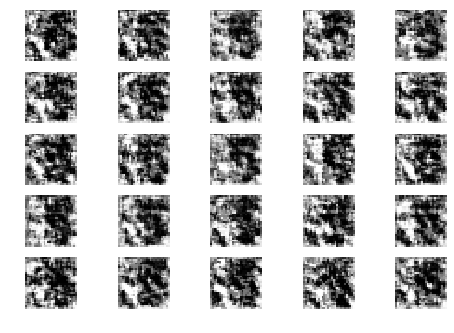

Epoch 1 Batch 613/937 [D loss: 0.430174, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 614/937 [D loss: 0.241164, acc.: 90.62%] [G loss: 0.000010]
Epoch 1 Batch 615/937 [D loss: 0.830888, acc.: 53.12%] [G loss: 0.000006]
Epoch 1 Batch 616/937 [D loss: 1.160384, acc.: 40.62%] [G loss: 0.000011]
Epoch 1 Batch 617/937 [D loss: 0.163904, acc.: 100.00%] [G loss: 0.000017]
Epoch 1 Batch 618/937 [D loss: 0.213729, acc.: 90.62%] [G loss: 0.000017]
Epoch 1 Batch 619/937 [D loss: 0.314099, acc.: 84.38%] [G loss: 0.000013]
Epoch 1 Batch 620/937 [D loss: 0.503085, acc.: 75.00%] [G loss: 0.000014]
Epoch 1 Batch 621/937 [D loss: 0.243220, acc.: 87.50%] [G loss: 0.000012]
Epoch 1 Batch 622/937 [D loss: 0.405020, acc.: 78.12%] [G loss: 0.000010]
Epoch 1 Batch 623/937 [D loss: 0.871309, acc.: 50.00%] [G loss: 0.000007]
Epoch 1 Batch 624/937 [D loss: 1.335135, acc.: 46.88%] [G loss: 0.000006]
Epoch 1 Batch 625/937 [D loss: 0.333401, acc.: 87.50%] [G loss: 0.000018]
Epoch 1 Batch 626/937 [D loss: 0.3458

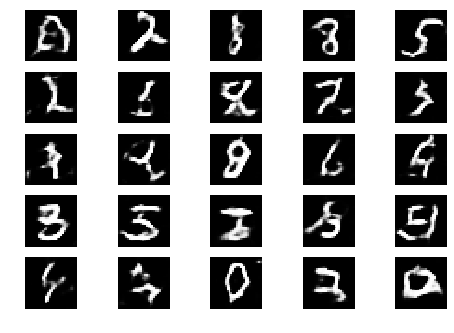

Epoch 1 Batch 701/937 [D loss: 0.368648, acc.: 87.50%] [G loss: 0.000010]
Epoch 1 Batch 702/937 [D loss: 0.965258, acc.: 40.62%] [G loss: 0.000013]
Epoch 1 Batch 703/937 [D loss: 0.201259, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 704/937 [D loss: 0.474095, acc.: 75.00%] [G loss: 0.000010]
Epoch 1 Batch 705/937 [D loss: 0.138528, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 706/937 [D loss: 0.273684, acc.: 87.50%] [G loss: 0.000011]
Epoch 1 Batch 707/937 [D loss: 0.228814, acc.: 96.88%] [G loss: 0.000008]


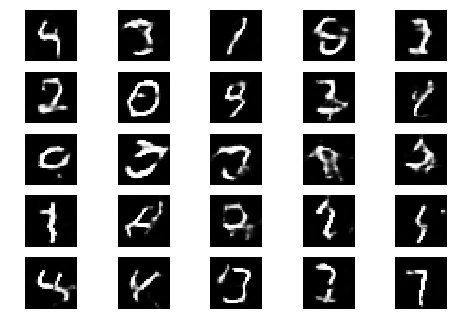

Epoch 1 Batch 708/937 [D loss: 0.133731, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 709/937 [D loss: 0.238844, acc.: 93.75%] [G loss: 0.000026]
Epoch 1 Batch 710/937 [D loss: 0.146422, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 711/937 [D loss: 0.311538, acc.: 87.50%] [G loss: 0.000003]
Epoch 1 Batch 712/937 [D loss: 0.321134, acc.: 90.62%] [G loss: 0.000004]
Epoch 1 Batch 713/937 [D loss: 0.088247, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 714/937 [D loss: 0.543237, acc.: 62.50%] [G loss: 0.000003]


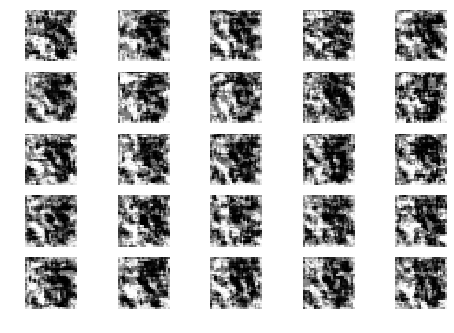

Epoch 1 Batch 715/937 [D loss: 0.665268, acc.: 68.75%] [G loss: 0.000005]
Epoch 1 Batch 716/937 [D loss: 0.055575, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 717/937 [D loss: 0.304491, acc.: 84.38%] [G loss: 0.000003]
Epoch 1 Batch 718/937 [D loss: 1.285763, acc.: 28.12%] [G loss: 0.000005]
Epoch 1 Batch 719/937 [D loss: 0.169383, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 720/937 [D loss: 0.304115, acc.: 84.38%] [G loss: 0.000004]
Epoch 1 Batch 721/937 [D loss: 0.305781, acc.: 87.50%] [G loss: 0.000004]
Epoch 1 Batch 722/937 [D loss: 0.335760, acc.: 84.38%] [G loss: 0.000003]
Epoch 1 Batch 723/937 [D loss: 0.451886, acc.: 84.38%] [G loss: 0.000004]
Epoch 1 Batch 724/937 [D loss: 0.268631, acc.: 90.62%] [G loss: 0.000020]
Epoch 1 Batch 725/937 [D loss: 0.564062, acc.: 65.62%] [G loss: 0.000010]
Epoch 1 Batch 726/937 [D loss: 0.511814, acc.: 84.38%] [G loss: 0.000008]
Epoch 1 Batch 727/937 [D loss: 0.403660, acc.: 78.12%] [G loss: 0.000004]
Epoch 1 Batch 728/937 [D loss: 0.4673

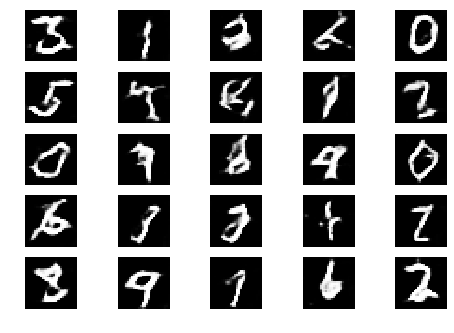

Epoch 1 Batch 801/937 [D loss: 0.318825, acc.: 81.25%] [G loss: 0.000004]
Epoch 1 Batch 802/937 [D loss: 1.662364, acc.: 15.62%] [G loss: 0.000005]
Epoch 1 Batch 803/937 [D loss: 0.190967, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 804/937 [D loss: 0.383048, acc.: 84.38%] [G loss: 0.000008]
Epoch 1 Batch 805/937 [D loss: 0.399716, acc.: 84.38%] [G loss: 0.000008]
Epoch 1 Batch 806/937 [D loss: 0.336037, acc.: 87.50%] [G loss: 0.000018]
Epoch 1 Batch 807/937 [D loss: 0.162589, acc.: 96.88%] [G loss: 0.000012]
Epoch 1 Batch 808/937 [D loss: 0.394542, acc.: 78.12%] [G loss: 0.000004]


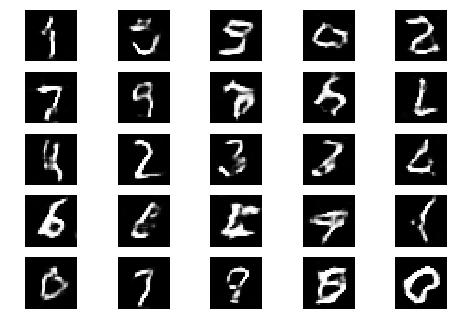

Epoch 1 Batch 809/937 [D loss: 0.205348, acc.: 93.75%] [G loss: 0.000004]
Epoch 1 Batch 810/937 [D loss: 0.577953, acc.: 68.75%] [G loss: 0.000010]
Epoch 1 Batch 811/937 [D loss: 0.615090, acc.: 71.88%] [G loss: 0.000005]
Epoch 1 Batch 812/937 [D loss: 0.389874, acc.: 81.25%] [G loss: 0.000005]
Epoch 1 Batch 813/937 [D loss: 0.301697, acc.: 84.38%] [G loss: 0.000016]
Epoch 1 Batch 814/937 [D loss: 0.477207, acc.: 71.88%] [G loss: 0.000019]
Epoch 1 Batch 815/937 [D loss: 0.471877, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 816/937 [D loss: 0.681834, acc.: 68.75%] [G loss: 0.000015]


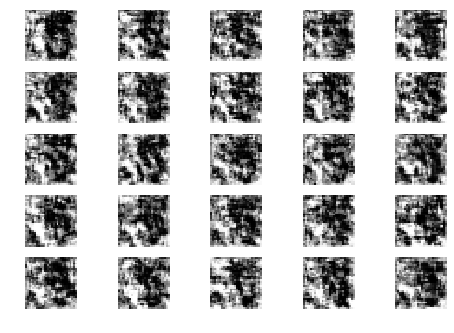

Epoch 1 Batch 817/937 [D loss: 0.306290, acc.: 87.50%] [G loss: 0.000007]
Epoch 1 Batch 818/937 [D loss: 0.336679, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 819/937 [D loss: 0.625136, acc.: 75.00%] [G loss: 0.000005]
Epoch 1 Batch 820/937 [D loss: 0.258265, acc.: 93.75%] [G loss: 0.000003]
Epoch 1 Batch 821/937 [D loss: 0.251956, acc.: 87.50%] [G loss: 0.000008]
Epoch 1 Batch 822/937 [D loss: 1.450680, acc.: 21.88%] [G loss: 0.000007]
Epoch 1 Batch 823/937 [D loss: 0.409141, acc.: 75.00%] [G loss: 0.000007]
Epoch 1 Batch 824/937 [D loss: 1.420555, acc.: 34.38%] [G loss: 0.000016]
Epoch 1 Batch 825/937 [D loss: 1.042846, acc.: 40.62%] [G loss: 0.000014]
Epoch 1 Batch 826/937 [D loss: 0.656551, acc.: 62.50%] [G loss: 0.000007]
Epoch 1 Batch 827/937 [D loss: 0.714767, acc.: 59.38%] [G loss: 0.000019]
Epoch 1 Batch 828/937 [D loss: 0.435593, acc.: 78.12%] [G loss: 0.000011]
Epoch 1 Batch 829/937 [D loss: 0.625155, acc.: 65.62%] [G loss: 0.000024]
Epoch 1 Batch 830/937 [D loss: 0.33653

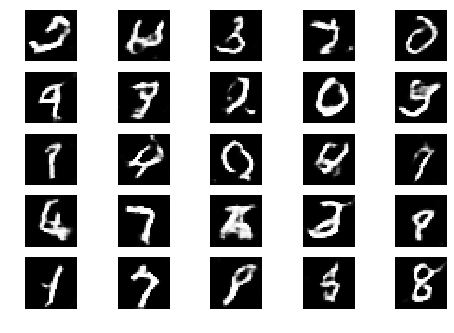

Epoch 1 Batch 901/937 [D loss: 0.232637, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 902/937 [D loss: 0.124044, acc.: 100.00%] [G loss: 0.000023]
Epoch 1 Batch 903/937 [D loss: 0.084728, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 904/937 [D loss: 1.125364, acc.: 53.12%] [G loss: 0.000004]
Epoch 1 Batch 905/937 [D loss: 0.106060, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 906/937 [D loss: 0.841778, acc.: 53.12%] [G loss: 0.000010]
Epoch 1 Batch 907/937 [D loss: 0.225992, acc.: 93.75%] [G loss: 0.000001]
Epoch 1 Batch 908/937 [D loss: 0.515824, acc.: 71.88%] [G loss: 0.000002]
Epoch 1 Batch 909/937 [D loss: 0.328049, acc.: 87.50%] [G loss: 0.000003]


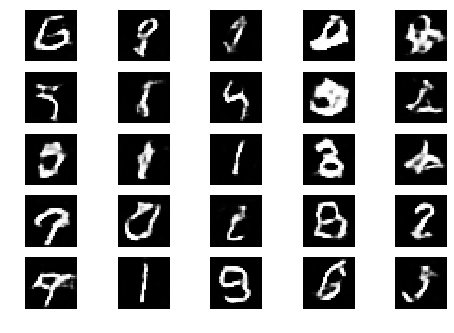

Epoch 1 Batch 910/937 [D loss: 0.562967, acc.: 71.88%] [G loss: 0.000004]
Epoch 1 Batch 911/937 [D loss: 0.179920, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 912/937 [D loss: 0.256149, acc.: 90.62%] [G loss: 0.000002]
Epoch 1 Batch 913/937 [D loss: 0.038312, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 914/937 [D loss: 0.250625, acc.: 90.62%] [G loss: 0.000003]
Epoch 1 Batch 915/937 [D loss: 0.482179, acc.: 78.12%] [G loss: 0.000003]
Epoch 1 Batch 916/937 [D loss: 0.062029, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 917/937 [D loss: 0.369659, acc.: 90.62%] [G loss: 0.000008]
Epoch 1 Batch 918/937 [D loss: 0.412966, acc.: 71.88%] [G loss: 0.000009]


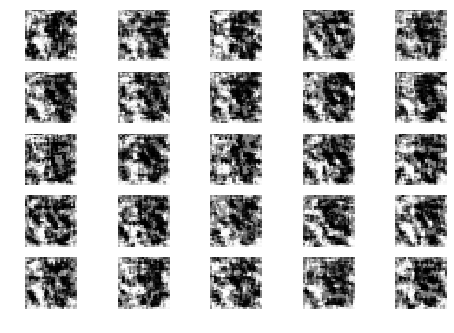

Epoch 1 Batch 919/937 [D loss: 0.537598, acc.: 65.62%] [G loss: 0.000005]
Epoch 1 Batch 920/937 [D loss: 0.543211, acc.: 68.75%] [G loss: 0.000003]
Epoch 1 Batch 921/937 [D loss: 0.348001, acc.: 84.38%] [G loss: 0.000014]
Epoch 1 Batch 922/937 [D loss: 0.224181, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 923/937 [D loss: 0.592545, acc.: 75.00%] [G loss: 0.000009]
Epoch 1 Batch 924/937 [D loss: 0.124732, acc.: 100.00%] [G loss: 0.000022]
Epoch 1 Batch 925/937 [D loss: 0.292106, acc.: 96.88%] [G loss: 0.000002]
Epoch 1 Batch 926/937 [D loss: 0.802196, acc.: 59.38%] [G loss: 0.000004]
Epoch 1 Batch 927/937 [D loss: 0.685336, acc.: 56.25%] [G loss: 0.000003]
Epoch 1 Batch 928/937 [D loss: 0.390090, acc.: 78.12%] [G loss: 0.000003]
Epoch 1 Batch 929/937 [D loss: 0.130377, acc.: 93.75%] [G loss: 0.000002]
Epoch 1 Batch 930/937 [D loss: 0.633311, acc.: 75.00%] [G loss: 0.000001]
Epoch 1 Batch 931/937 [D loss: 0.269833, acc.: 93.75%] [G loss: 0.000007]
Epoch 1 Batch 932/937 [D loss: 0.5922

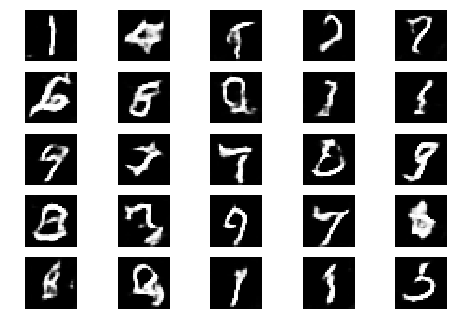

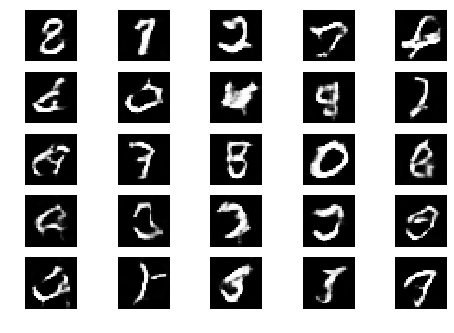

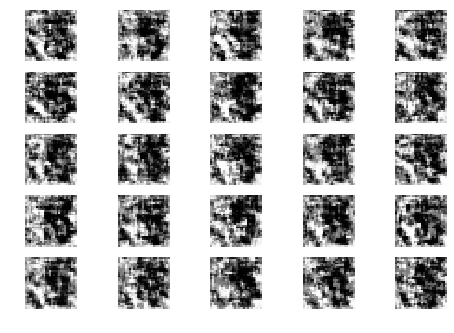

Epoch 2 Batch 1/937 [D loss: 0.062810, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 2/937 [D loss: 0.171216, acc.: 100.00%] [G loss: 0.000006]
Epoch 2 Batch 3/937 [D loss: 0.180533, acc.: 96.88%] [G loss: 0.000004]
Epoch 2 Batch 4/937 [D loss: 0.509448, acc.: 71.88%] [G loss: 0.000003]
Epoch 2 Batch 5/937 [D loss: 0.996001, acc.: 43.75%] [G loss: 0.000001]
Epoch 2 Batch 6/937 [D loss: 0.428946, acc.: 81.25%] [G loss: 0.000007]
Epoch 2 Batch 7/937 [D loss: 0.126254, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 8/937 [D loss: 0.576453, acc.: 65.62%] [G loss: 0.000005]
Epoch 2 Batch 9/937 [D loss: 0.781095, acc.: 53.12%] [G loss: 0.000004]
Epoch 2 Batch 10/937 [D loss: 0.282631, acc.: 87.50%] [G loss: 0.000005]
Epoch 2 Batch 11/937 [D loss: 0.209392, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 12/937 [D loss: 0.127325, acc.: 96.88%] [G loss: 0.000009]
Epoch 2 Batch 13/937 [D loss: 0.182396, acc.: 90.62%] [G loss: 0.000003]
Epoch 2 Batch 14/937 [D loss: 0.469990, acc.: 78.12%] [G 

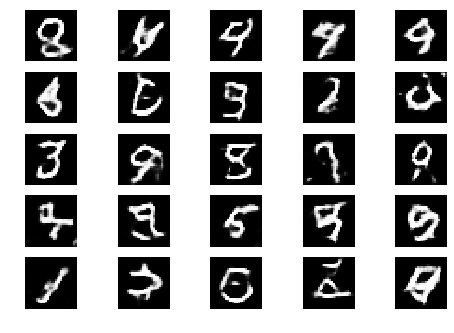

Epoch 2 Batch 101/937 [D loss: 0.308012, acc.: 87.50%] [G loss: 0.000001]


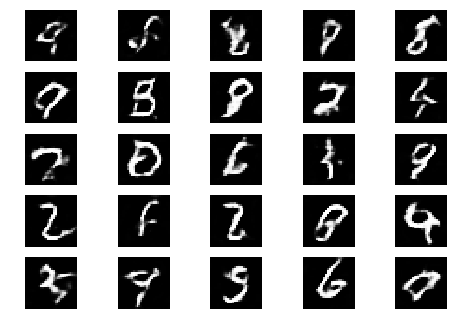

Epoch 2 Batch 102/937 [D loss: 0.465643, acc.: 78.12%] [G loss: 0.000001]


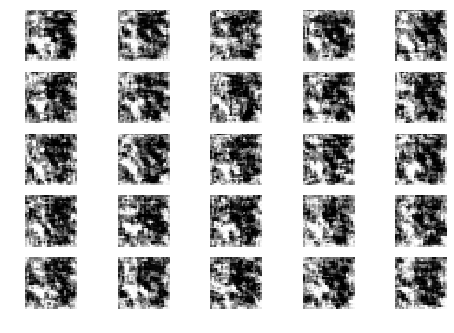

Epoch 2 Batch 103/937 [D loss: 0.495601, acc.: 75.00%] [G loss: 0.000003]
Epoch 2 Batch 104/937 [D loss: 0.497075, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 105/937 [D loss: 0.228567, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 106/937 [D loss: 0.129514, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 107/937 [D loss: 0.272556, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 108/937 [D loss: 0.557855, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 109/937 [D loss: 0.553005, acc.: 75.00%] [G loss: 0.000002]
Epoch 2 Batch 110/937 [D loss: 0.234403, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 111/937 [D loss: 0.260367, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 112/937 [D loss: 0.223089, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 113/937 [D loss: 0.496511, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 114/937 [D loss: 0.169408, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 115/937 [D loss: 0.146999, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 116/937 [D loss: 0.2970

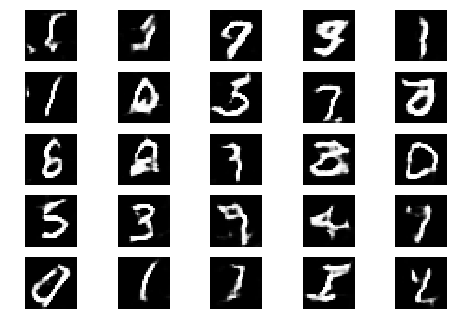

Epoch 2 Batch 201/937 [D loss: 1.206196, acc.: 43.75%] [G loss: 0.000003]
Epoch 2 Batch 202/937 [D loss: 0.216780, acc.: 87.50%] [G loss: 0.000003]


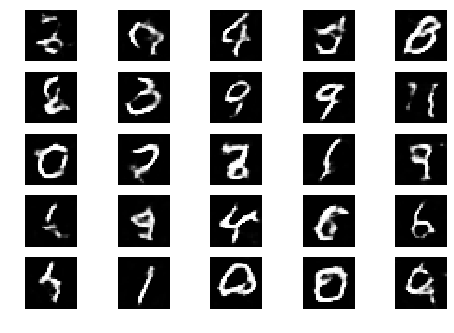

Epoch 2 Batch 203/937 [D loss: 0.574582, acc.: 75.00%] [G loss: 0.000003]
Epoch 2 Batch 204/937 [D loss: 0.261374, acc.: 96.88%] [G loss: 0.000002]


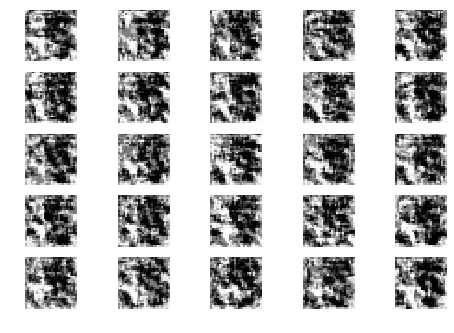

Epoch 2 Batch 205/937 [D loss: 0.740376, acc.: 46.88%] [G loss: 0.000003]
Epoch 2 Batch 206/937 [D loss: 0.490074, acc.: 71.88%] [G loss: 0.000007]
Epoch 2 Batch 207/937 [D loss: 0.900803, acc.: 53.12%] [G loss: 0.000004]
Epoch 2 Batch 208/937 [D loss: 0.501572, acc.: 81.25%] [G loss: 0.000003]
Epoch 2 Batch 209/937 [D loss: 0.218442, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 210/937 [D loss: 0.122258, acc.: 100.00%] [G loss: 0.000005]
Epoch 2 Batch 211/937 [D loss: 0.317110, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 212/937 [D loss: 0.112639, acc.: 96.88%] [G loss: 0.000003]
Epoch 2 Batch 213/937 [D loss: 0.202902, acc.: 93.75%] [G loss: 0.000003]
Epoch 2 Batch 214/937 [D loss: 0.585017, acc.: 75.00%] [G loss: 0.000003]
Epoch 2 Batch 215/937 [D loss: 0.323403, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 216/937 [D loss: 0.295339, acc.: 87.50%] [G loss: 0.000002]
Epoch 2 Batch 217/937 [D loss: 0.177824, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 218/937 [D loss: 0.1560

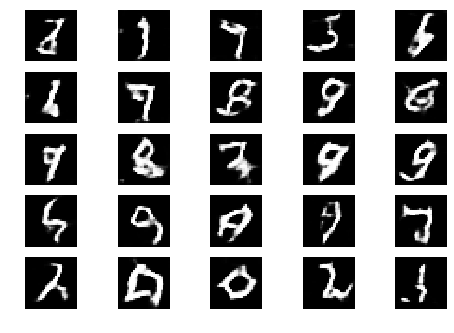

Epoch 2 Batch 301/937 [D loss: 0.275211, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 302/937 [D loss: 0.209583, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 303/937 [D loss: 0.519493, acc.: 68.75%] [G loss: 0.000001]


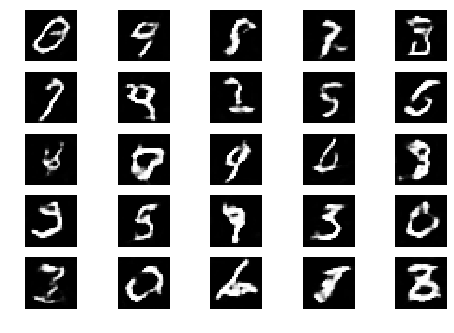

Epoch 2 Batch 304/937 [D loss: 0.094824, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 305/937 [D loss: 0.471134, acc.: 71.88%] [G loss: 0.000001]
Epoch 2 Batch 306/937 [D loss: 0.746786, acc.: 59.38%] [G loss: 0.000001]


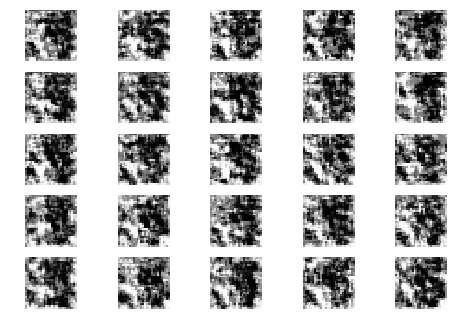

Epoch 2 Batch 307/937 [D loss: 0.143581, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 308/937 [D loss: 0.169125, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 309/937 [D loss: 0.494406, acc.: 71.88%] [G loss: 0.000001]
Epoch 2 Batch 310/937 [D loss: 0.382985, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 311/937 [D loss: 0.172068, acc.: 93.75%] [G loss: 0.000008]
Epoch 2 Batch 312/937 [D loss: 0.202344, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 313/937 [D loss: 0.260204, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 314/937 [D loss: 0.166724, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 315/937 [D loss: 0.372900, acc.: 84.38%] [G loss: 0.000002]
Epoch 2 Batch 316/937 [D loss: 0.188612, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 317/937 [D loss: 0.423568, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 318/937 [D loss: 0.299859, acc.: 93.75%] [G loss: 0.000004]
Epoch 2 Batch 319/937 [D loss: 0.237626, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 320/937 [D loss: 0.380

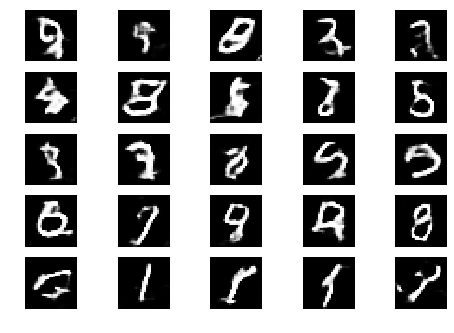

Epoch 2 Batch 401/937 [D loss: 0.650277, acc.: 59.38%] [G loss: 0.000000]
Epoch 2 Batch 402/937 [D loss: 0.011783, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 403/937 [D loss: 0.067751, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 404/937 [D loss: 0.520028, acc.: 71.88%] [G loss: 0.000001]


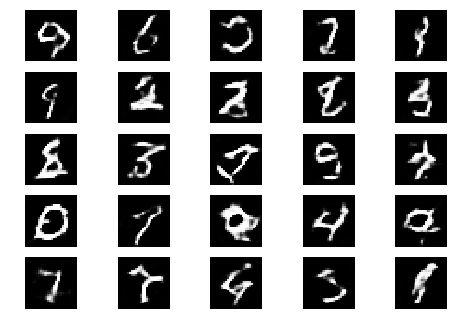

Epoch 2 Batch 405/937 [D loss: 0.199490, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 406/937 [D loss: 0.153471, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 407/937 [D loss: 1.491894, acc.: 53.12%] [G loss: 0.000001]
Epoch 2 Batch 408/937 [D loss: 0.357387, acc.: 71.88%] [G loss: 0.000002]


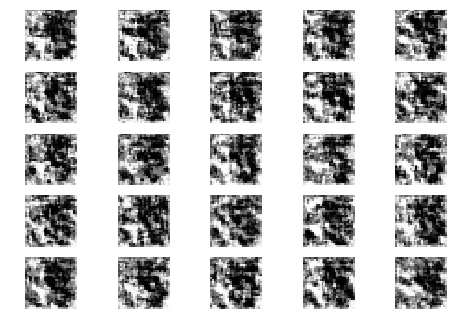

Epoch 2 Batch 409/937 [D loss: 0.576101, acc.: 71.88%] [G loss: 0.000002]
Epoch 2 Batch 410/937 [D loss: 0.673588, acc.: 68.75%] [G loss: 0.000007]
Epoch 2 Batch 411/937 [D loss: 0.194298, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 412/937 [D loss: 0.134431, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 413/937 [D loss: 0.687733, acc.: 59.38%] [G loss: 0.000000]
Epoch 2 Batch 414/937 [D loss: 0.358050, acc.: 87.50%] [G loss: 0.000002]
Epoch 2 Batch 415/937 [D loss: 0.244671, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 416/937 [D loss: 0.043447, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 417/937 [D loss: 0.767124, acc.: 65.62%] [G loss: 0.000001]
Epoch 2 Batch 418/937 [D loss: 0.548188, acc.: 71.88%] [G loss: 0.000003]
Epoch 2 Batch 419/937 [D loss: 0.062042, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 420/937 [D loss: 0.028900, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 421/937 [D loss: 0.195595, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 422/937 [D loss: 0.62

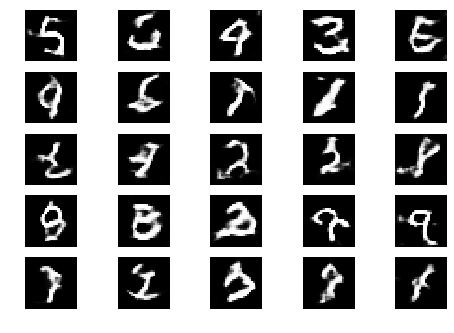

Epoch 2 Batch 501/937 [D loss: 0.410124, acc.: 75.00%] [G loss: 0.000002]
Epoch 2 Batch 502/937 [D loss: 0.304412, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 503/937 [D loss: 0.092049, acc.: 100.00%] [G loss: 0.000006]
Epoch 2 Batch 504/937 [D loss: 0.275868, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 505/937 [D loss: 0.117855, acc.: 96.88%] [G loss: 0.000001]


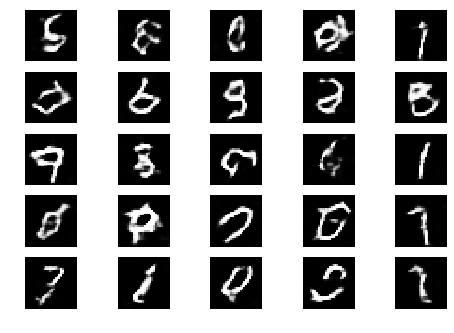

Epoch 2 Batch 506/937 [D loss: 0.064955, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 507/937 [D loss: 0.259302, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 508/937 [D loss: 0.421518, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 509/937 [D loss: 0.147522, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 510/937 [D loss: 0.036928, acc.: 100.00%] [G loss: 0.000001]


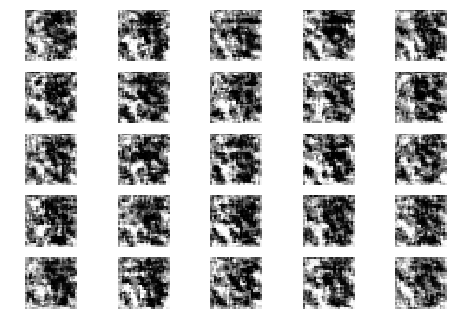

Epoch 2 Batch 511/937 [D loss: 0.593414, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 512/937 [D loss: 0.152892, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 513/937 [D loss: 0.427367, acc.: 81.25%] [G loss: 0.000002]
Epoch 2 Batch 514/937 [D loss: 0.197242, acc.: 93.75%] [G loss: 0.000003]
Epoch 2 Batch 515/937 [D loss: 0.413546, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 516/937 [D loss: 0.125639, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 517/937 [D loss: 0.319659, acc.: 78.12%] [G loss: 0.000003]
Epoch 2 Batch 518/937 [D loss: 0.543283, acc.: 65.62%] [G loss: 0.000003]
Epoch 2 Batch 519/937 [D loss: 0.032449, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 520/937 [D loss: 0.391052, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 521/937 [D loss: 0.342433, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 522/937 [D loss: 0.434769, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 523/937 [D loss: 0.226849, acc.: 90.62%] [G loss: 0.000003]
Epoch 2 Batch 524/937 [D loss: 0.127

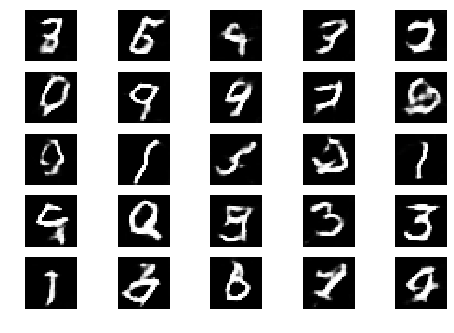

Epoch 2 Batch 601/937 [D loss: 0.254358, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 602/937 [D loss: 0.093078, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 603/937 [D loss: 0.353494, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 604/937 [D loss: 0.388563, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 605/937 [D loss: 0.535930, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 606/937 [D loss: 0.566219, acc.: 68.75%] [G loss: 0.000000]


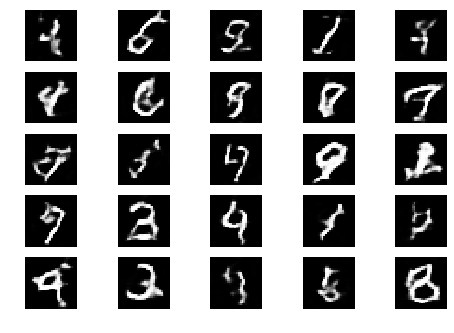

Epoch 2 Batch 607/937 [D loss: 0.712315, acc.: 65.62%] [G loss: 0.000000]
Epoch 2 Batch 608/937 [D loss: 0.109109, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 609/937 [D loss: 0.276129, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 610/937 [D loss: 0.309299, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 611/937 [D loss: 0.338069, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 612/937 [D loss: 0.100463, acc.: 96.88%] [G loss: 0.000000]


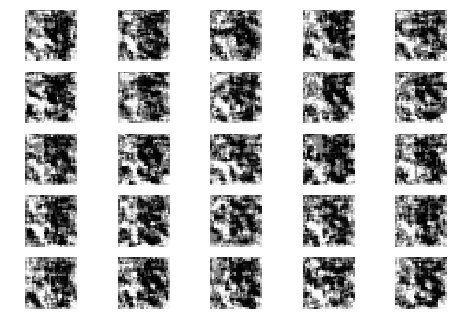

Epoch 2 Batch 613/937 [D loss: 0.134733, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 614/937 [D loss: 0.314380, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 615/937 [D loss: 0.116088, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 616/937 [D loss: 0.465208, acc.: 65.62%] [G loss: 0.000001]
Epoch 2 Batch 617/937 [D loss: 0.076323, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 618/937 [D loss: 0.054649, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 619/937 [D loss: 0.037976, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 620/937 [D loss: 0.627767, acc.: 81.25%] [G loss: 0.000002]
Epoch 2 Batch 621/937 [D loss: 0.164601, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 622/937 [D loss: 0.209740, acc.: 90.62%] [G loss: 0.000002]
Epoch 2 Batch 623/937 [D loss: 0.043756, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 624/937 [D loss: 0.137306, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 625/937 [D loss: 0.767373, acc.: 53.12%] [G loss: 0.000000]
Epoch 2 Batch 626/937 [D loss: 1.40

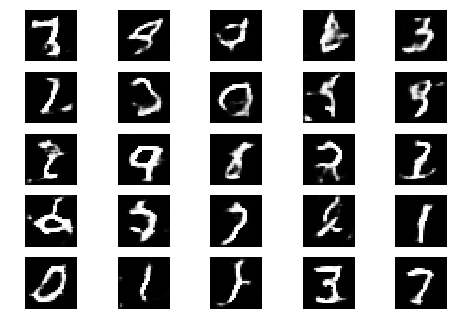

Epoch 2 Batch 701/937 [D loss: 0.177494, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 702/937 [D loss: 0.652540, acc.: 71.88%] [G loss: 0.000002]
Epoch 2 Batch 703/937 [D loss: 0.048142, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 704/937 [D loss: 0.075575, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 705/937 [D loss: 0.078390, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 706/937 [D loss: 0.348310, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 707/937 [D loss: 0.031439, acc.: 100.00%] [G loss: 0.000001]


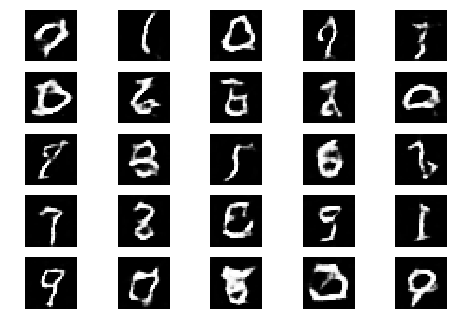

Epoch 2 Batch 708/937 [D loss: 0.329297, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 709/937 [D loss: 0.593942, acc.: 71.88%] [G loss: 0.000001]
Epoch 2 Batch 710/937 [D loss: 0.215445, acc.: 93.75%] [G loss: 0.000002]
Epoch 2 Batch 711/937 [D loss: 0.062763, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 712/937 [D loss: 0.446096, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 713/937 [D loss: 0.486968, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 714/937 [D loss: 0.225571, acc.: 90.62%] [G loss: 0.000002]


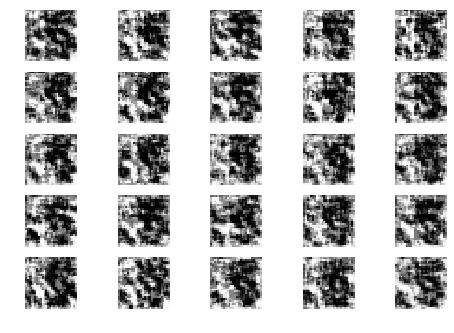

Epoch 2 Batch 715/937 [D loss: 0.310211, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 716/937 [D loss: 0.053079, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 717/937 [D loss: 0.400963, acc.: 78.12%] [G loss: 0.000001]
Epoch 2 Batch 718/937 [D loss: 0.094013, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 719/937 [D loss: 0.216574, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 720/937 [D loss: 0.030846, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 721/937 [D loss: 0.043917, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 722/937 [D loss: 0.279902, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 723/937 [D loss: 0.074825, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 724/937 [D loss: 0.063916, acc.: 100.00%] [G loss: 0.000009]
Epoch 2 Batch 725/937 [D loss: 0.116771, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 726/937 [D loss: 0.043864, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 727/937 [D loss: 0.262024, acc.: 93.75%] [G loss: 0.000003]
Epoch 2 Batch 728/937 [D loss: 0

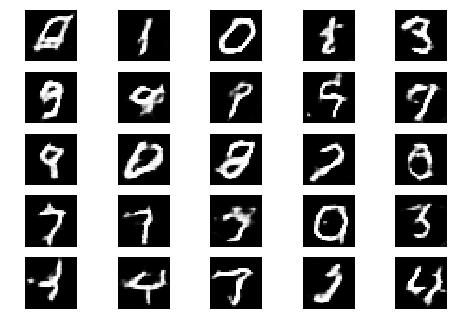

Epoch 2 Batch 801/937 [D loss: 1.560639, acc.: 28.12%] [G loss: 0.000000]
Epoch 2 Batch 802/937 [D loss: 0.049249, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 803/937 [D loss: 0.635913, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 804/937 [D loss: 0.043124, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 805/937 [D loss: 0.603341, acc.: 65.62%] [G loss: 0.000000]
Epoch 2 Batch 806/937 [D loss: 0.174431, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 807/937 [D loss: 0.046887, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 808/937 [D loss: 0.054154, acc.: 100.00%] [G loss: 0.000000]


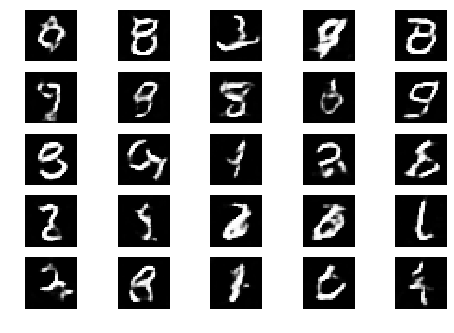

Epoch 2 Batch 809/937 [D loss: 0.084520, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 810/937 [D loss: 0.047595, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 811/937 [D loss: 0.177062, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 812/937 [D loss: 0.046744, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 813/937 [D loss: 0.074405, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 814/937 [D loss: 1.092557, acc.: 40.62%] [G loss: 0.000003]
Epoch 2 Batch 815/937 [D loss: 0.208023, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 816/937 [D loss: 0.771268, acc.: 56.25%] [G loss: 0.000001]


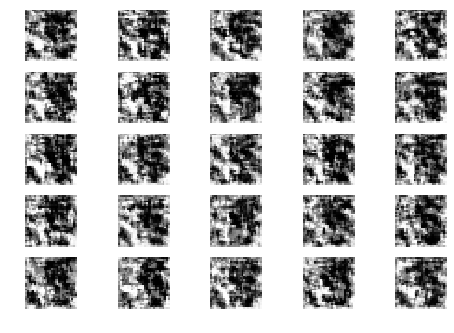

Epoch 2 Batch 817/937 [D loss: 0.160575, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 818/937 [D loss: 0.286762, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 819/937 [D loss: 0.490544, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 820/937 [D loss: 0.017494, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 821/937 [D loss: 0.636707, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 822/937 [D loss: 0.472017, acc.: 81.25%] [G loss: 0.000001]
Epoch 2 Batch 823/937 [D loss: 0.414775, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 824/937 [D loss: 0.165986, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 825/937 [D loss: 0.237773, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 826/937 [D loss: 0.286243, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 827/937 [D loss: 0.100966, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 828/937 [D loss: 0.168882, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 829/937 [D loss: 0.183002, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 830/937 [D loss: 0.32

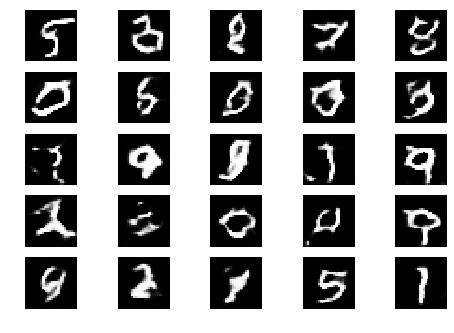

Epoch 2 Batch 901/937 [D loss: 0.117952, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 902/937 [D loss: 0.014742, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 903/937 [D loss: 0.760264, acc.: 59.38%] [G loss: 0.000001]
Epoch 2 Batch 904/937 [D loss: 0.265666, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 905/937 [D loss: 0.480569, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 906/937 [D loss: 0.144865, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 907/937 [D loss: 0.010521, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 908/937 [D loss: 0.302988, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 909/937 [D loss: 0.031942, acc.: 100.00%] [G loss: 0.000000]


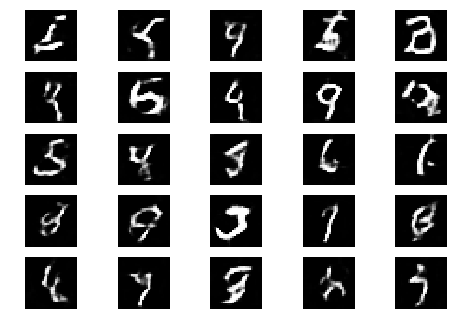

Epoch 2 Batch 910/937 [D loss: 0.615658, acc.: 68.75%] [G loss: 0.000000]
Epoch 2 Batch 911/937 [D loss: 0.154195, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 912/937 [D loss: 0.075257, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 913/937 [D loss: 0.072135, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 914/937 [D loss: 0.104111, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 915/937 [D loss: 0.037340, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 916/937 [D loss: 0.010754, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 917/937 [D loss: 0.091566, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 918/937 [D loss: 0.677534, acc.: 59.38%] [G loss: 0.000000]


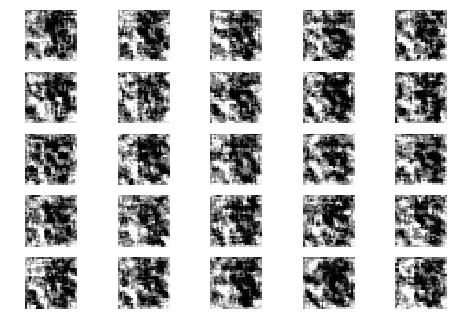

Epoch 2 Batch 919/937 [D loss: 0.125900, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 920/937 [D loss: 0.666603, acc.: 65.62%] [G loss: 0.000000]
Epoch 2 Batch 921/937 [D loss: 0.068945, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 922/937 [D loss: 0.059653, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 923/937 [D loss: 0.336062, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 924/937 [D loss: 0.061983, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 925/937 [D loss: 0.029359, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 926/937 [D loss: 0.538093, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 927/937 [D loss: 0.246086, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 928/937 [D loss: 0.078927, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 929/937 [D loss: 0.024401, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 930/937 [D loss: 0.336842, acc.: 87.50%] [G loss: 0.000001]
Epoch 2 Batch 931/937 [D loss: 0.168271, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 932/937 [D loss: 1.

In [40]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=1)

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)
Epoch 0 Batch 0/937 [D loss: 2.196767, acc.: 46.88%] [G loss: 0.000002]


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


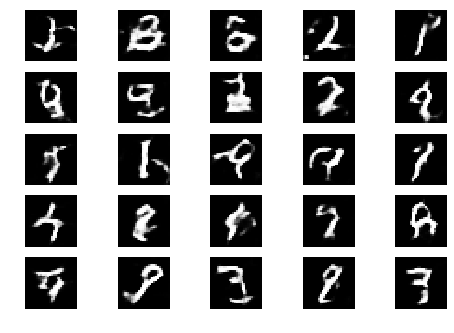

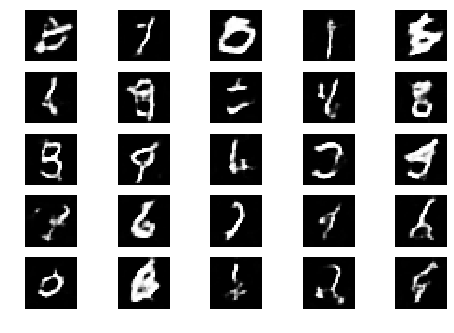

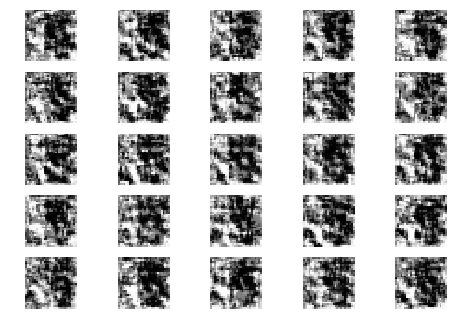

Epoch 0 Batch 1/937 [D loss: 1.423516, acc.: 43.75%] [G loss: 0.000010]
Epoch 0 Batch 2/937 [D loss: 2.379556, acc.: 43.75%] [G loss: 0.000008]
Epoch 0 Batch 3/937 [D loss: 1.818019, acc.: 25.00%] [G loss: 0.000011]
Epoch 0 Batch 4/937 [D loss: 2.402425, acc.: 12.50%] [G loss: 0.000017]
Epoch 0 Batch 5/937 [D loss: 0.834357, acc.: 46.88%] [G loss: 0.000023]
Epoch 0 Batch 6/937 [D loss: 1.111985, acc.: 43.75%] [G loss: 0.000024]
Epoch 0 Batch 7/937 [D loss: 1.028779, acc.: 28.12%] [G loss: 0.000017]
Epoch 0 Batch 8/937 [D loss: 1.507115, acc.: 21.88%] [G loss: 0.000032]
Epoch 0 Batch 9/937 [D loss: 1.069728, acc.: 59.38%] [G loss: 0.000033]
Epoch 0 Batch 10/937 [D loss: 1.342172, acc.: 43.75%] [G loss: 0.000014]
Epoch 0 Batch 11/937 [D loss: 1.456095, acc.: 34.38%] [G loss: 0.000097]
Epoch 0 Batch 12/937 [D loss: 0.752836, acc.: 53.12%] [G loss: 0.000321]
Epoch 0 Batch 13/937 [D loss: 0.767049, acc.: 62.50%] [G loss: 0.000071]
Epoch 0 Batch 14/937 [D loss: 1.114378, acc.: 43.75%] [G los

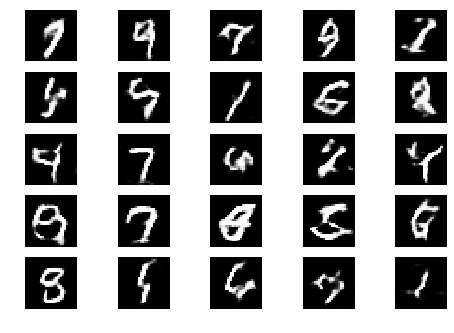

Epoch 0 Batch 101/937 [D loss: 1.082215, acc.: 28.12%] [G loss: 0.000402]


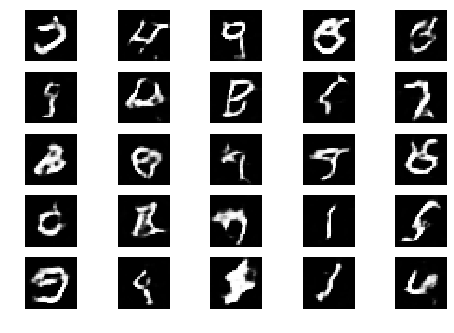

Epoch 0 Batch 102/937 [D loss: 0.522694, acc.: 75.00%] [G loss: 0.000657]


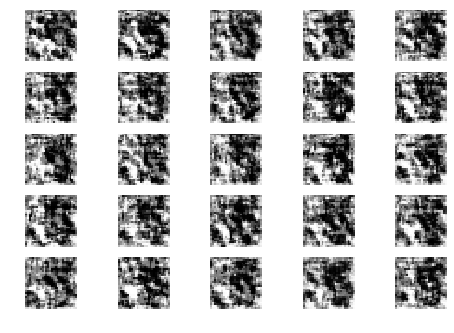

Epoch 0 Batch 103/937 [D loss: 0.389833, acc.: 87.50%] [G loss: 0.000444]
Epoch 0 Batch 104/937 [D loss: 0.463325, acc.: 78.12%] [G loss: 0.000433]
Epoch 0 Batch 105/937 [D loss: 0.352896, acc.: 87.50%] [G loss: 0.000121]
Epoch 0 Batch 106/937 [D loss: 0.250240, acc.: 93.75%] [G loss: 0.000241]
Epoch 0 Batch 107/937 [D loss: 0.709474, acc.: 59.38%] [G loss: 0.000140]
Epoch 0 Batch 108/937 [D loss: 0.337032, acc.: 90.62%] [G loss: 0.001554]
Epoch 0 Batch 109/937 [D loss: 1.062336, acc.: 46.88%] [G loss: 0.000286]
Epoch 0 Batch 110/937 [D loss: 0.491488, acc.: 78.12%] [G loss: 0.000193]
Epoch 0 Batch 111/937 [D loss: 0.117364, acc.: 100.00%] [G loss: 0.000437]
Epoch 0 Batch 112/937 [D loss: 0.644620, acc.: 68.75%] [G loss: 0.000351]
Epoch 0 Batch 113/937 [D loss: 0.426862, acc.: 78.12%] [G loss: 0.000399]
Epoch 0 Batch 114/937 [D loss: 0.166048, acc.: 96.88%] [G loss: 0.000328]
Epoch 0 Batch 115/937 [D loss: 0.688501, acc.: 56.25%] [G loss: 0.000285]
Epoch 0 Batch 116/937 [D loss: 0.3264

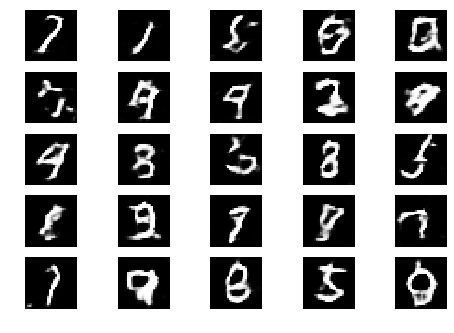

Epoch 0 Batch 201/937 [D loss: 0.188646, acc.: 96.88%] [G loss: 0.000181]
Epoch 0 Batch 202/937 [D loss: 0.223414, acc.: 96.88%] [G loss: 0.000062]


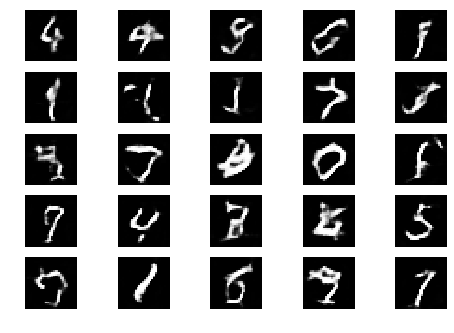

Epoch 0 Batch 203/937 [D loss: 0.716889, acc.: 56.25%] [G loss: 0.000124]
Epoch 0 Batch 204/937 [D loss: 0.272966, acc.: 90.62%] [G loss: 0.000056]


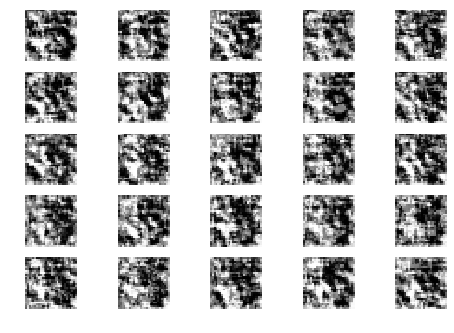

Epoch 0 Batch 205/937 [D loss: 0.568769, acc.: 71.88%] [G loss: 0.000053]
Epoch 0 Batch 206/937 [D loss: 0.922151, acc.: 53.12%] [G loss: 0.000079]
Epoch 0 Batch 207/937 [D loss: 0.293056, acc.: 90.62%] [G loss: 0.000054]
Epoch 0 Batch 208/937 [D loss: 0.275260, acc.: 87.50%] [G loss: 0.000088]
Epoch 0 Batch 209/937 [D loss: 0.340443, acc.: 87.50%] [G loss: 0.000117]
Epoch 0 Batch 210/937 [D loss: 1.090199, acc.: 46.88%] [G loss: 0.000059]
Epoch 0 Batch 211/937 [D loss: 0.469685, acc.: 68.75%] [G loss: 0.000077]
Epoch 0 Batch 212/937 [D loss: 0.470571, acc.: 78.12%] [G loss: 0.000103]
Epoch 0 Batch 213/937 [D loss: 0.192819, acc.: 93.75%] [G loss: 0.000056]
Epoch 0 Batch 214/937 [D loss: 0.221173, acc.: 96.88%] [G loss: 0.000054]
Epoch 0 Batch 215/937 [D loss: 0.308885, acc.: 84.38%] [G loss: 0.000075]
Epoch 0 Batch 216/937 [D loss: 0.291701, acc.: 96.88%] [G loss: 0.000046]
Epoch 0 Batch 217/937 [D loss: 0.833423, acc.: 59.38%] [G loss: 0.000040]
Epoch 0 Batch 218/937 [D loss: 0.21434

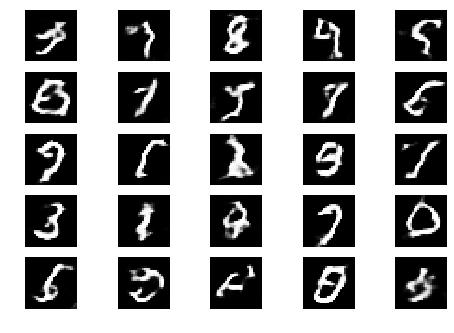

Epoch 0 Batch 301/937 [D loss: 0.122478, acc.: 100.00%] [G loss: 0.000111]
Epoch 0 Batch 302/937 [D loss: 0.153992, acc.: 96.88%] [G loss: 0.000050]
Epoch 0 Batch 303/937 [D loss: 0.391264, acc.: 78.12%] [G loss: 0.000035]


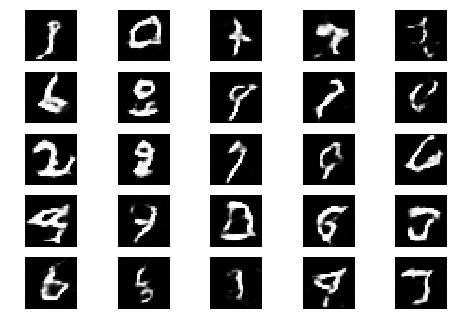

Epoch 0 Batch 304/937 [D loss: 0.941525, acc.: 50.00%] [G loss: 0.000058]
Epoch 0 Batch 305/937 [D loss: 0.358954, acc.: 84.38%] [G loss: 0.000141]
Epoch 0 Batch 306/937 [D loss: 0.488709, acc.: 68.75%] [G loss: 0.000113]


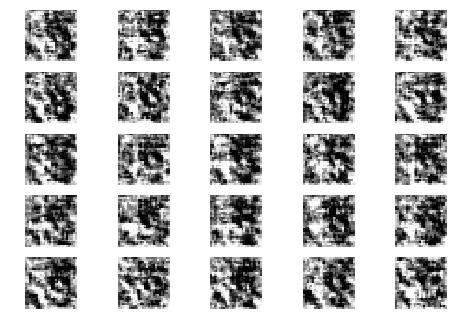

Epoch 0 Batch 307/937 [D loss: 0.396502, acc.: 84.38%] [G loss: 0.000035]
Epoch 0 Batch 308/937 [D loss: 0.470529, acc.: 87.50%] [G loss: 0.000057]
Epoch 0 Batch 309/937 [D loss: 0.325462, acc.: 90.62%] [G loss: 0.000079]
Epoch 0 Batch 310/937 [D loss: 0.984753, acc.: 53.12%] [G loss: 0.000027]
Epoch 0 Batch 311/937 [D loss: 0.357861, acc.: 90.62%] [G loss: 0.000014]
Epoch 0 Batch 312/937 [D loss: 0.834078, acc.: 59.38%] [G loss: 0.000037]
Epoch 0 Batch 313/937 [D loss: 0.288180, acc.: 96.88%] [G loss: 0.000055]
Epoch 0 Batch 314/937 [D loss: 0.126947, acc.: 96.88%] [G loss: 0.000101]
Epoch 0 Batch 315/937 [D loss: 0.766872, acc.: 53.12%] [G loss: 0.000042]
Epoch 0 Batch 316/937 [D loss: 0.851571, acc.: 50.00%] [G loss: 0.000075]
Epoch 0 Batch 317/937 [D loss: 0.102801, acc.: 100.00%] [G loss: 0.000100]
Epoch 0 Batch 318/937 [D loss: 1.029611, acc.: 40.62%] [G loss: 0.000220]
Epoch 0 Batch 319/937 [D loss: 0.083665, acc.: 100.00%] [G loss: 0.000143]
Epoch 0 Batch 320/937 [D loss: 0.566

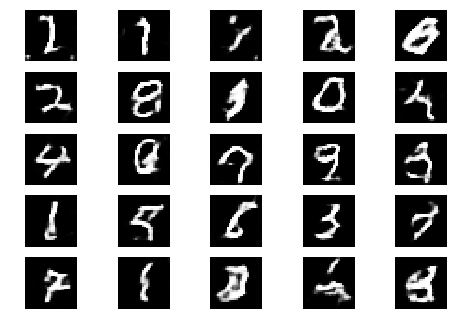

Epoch 0 Batch 401/937 [D loss: 0.382244, acc.: 81.25%] [G loss: 0.000009]
Epoch 0 Batch 402/937 [D loss: 0.330516, acc.: 78.12%] [G loss: 0.000015]
Epoch 0 Batch 403/937 [D loss: 0.307627, acc.: 90.62%] [G loss: 0.000020]
Epoch 0 Batch 404/937 [D loss: 0.225830, acc.: 93.75%] [G loss: 0.000022]


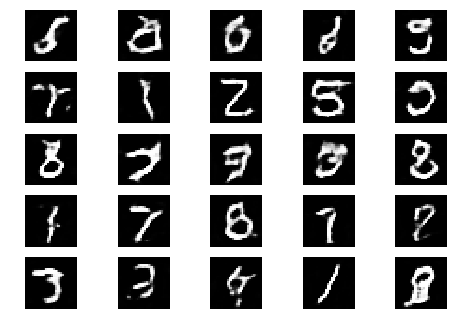

Epoch 0 Batch 405/937 [D loss: 0.087143, acc.: 100.00%] [G loss: 0.000010]
Epoch 0 Batch 406/937 [D loss: 0.394845, acc.: 78.12%] [G loss: 0.000016]
Epoch 0 Batch 407/937 [D loss: 0.078495, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 408/937 [D loss: 0.878078, acc.: 46.88%] [G loss: 0.000018]


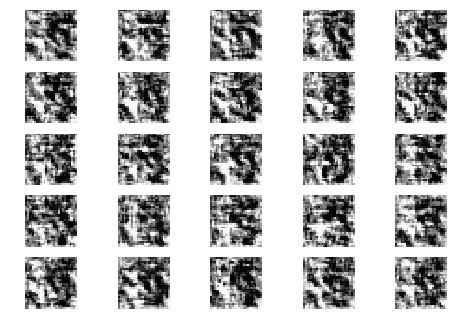

Epoch 0 Batch 409/937 [D loss: 0.512640, acc.: 78.12%] [G loss: 0.000018]
Epoch 0 Batch 410/937 [D loss: 0.103842, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 411/937 [D loss: 0.208811, acc.: 96.88%] [G loss: 0.000043]
Epoch 0 Batch 412/937 [D loss: 0.634873, acc.: 62.50%] [G loss: 0.000008]
Epoch 0 Batch 413/937 [D loss: 0.546731, acc.: 68.75%] [G loss: 0.000111]
Epoch 0 Batch 414/937 [D loss: 0.119285, acc.: 100.00%] [G loss: 0.000005]
Epoch 0 Batch 415/937 [D loss: 0.066931, acc.: 100.00%] [G loss: 0.000035]
Epoch 0 Batch 416/937 [D loss: 0.486482, acc.: 78.12%] [G loss: 0.000014]
Epoch 0 Batch 417/937 [D loss: 0.276932, acc.: 90.62%] [G loss: 0.000020]
Epoch 0 Batch 418/937 [D loss: 1.319081, acc.: 50.00%] [G loss: 0.000017]
Epoch 0 Batch 419/937 [D loss: 0.558344, acc.: 68.75%] [G loss: 0.000028]
Epoch 0 Batch 420/937 [D loss: 0.438322, acc.: 84.38%] [G loss: 0.000041]
Epoch 0 Batch 421/937 [D loss: 0.224893, acc.: 93.75%] [G loss: 0.000022]
Epoch 0 Batch 422/937 [D loss: 0.15

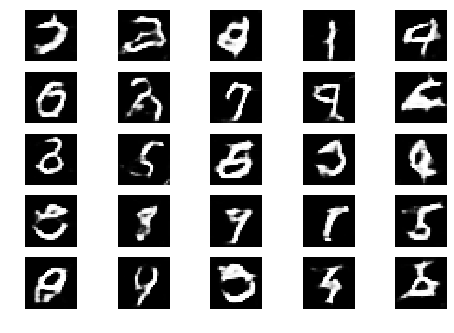

Epoch 0 Batch 501/937 [D loss: 0.173578, acc.: 96.88%] [G loss: 0.000006]
Epoch 0 Batch 502/937 [D loss: 0.293152, acc.: 84.38%] [G loss: 0.000008]
Epoch 0 Batch 503/937 [D loss: 0.639253, acc.: 59.38%] [G loss: 0.000020]
Epoch 0 Batch 504/937 [D loss: 0.078853, acc.: 100.00%] [G loss: 0.000022]
Epoch 0 Batch 505/937 [D loss: 0.195091, acc.: 100.00%] [G loss: 0.000019]


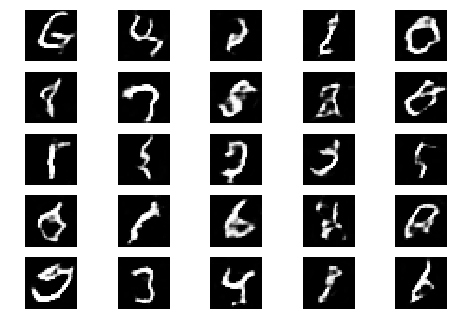

Epoch 0 Batch 506/937 [D loss: 0.560096, acc.: 71.88%] [G loss: 0.000013]
Epoch 0 Batch 507/937 [D loss: 0.284957, acc.: 93.75%] [G loss: 0.000010]
Epoch 0 Batch 508/937 [D loss: 0.339338, acc.: 87.50%] [G loss: 0.000017]
Epoch 0 Batch 509/937 [D loss: 0.598733, acc.: 62.50%] [G loss: 0.000009]
Epoch 0 Batch 510/937 [D loss: 0.746798, acc.: 53.12%] [G loss: 0.000010]


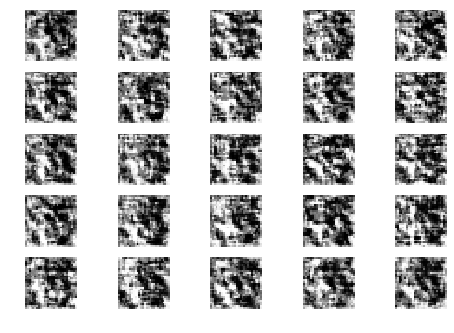

Epoch 0 Batch 511/937 [D loss: 0.514631, acc.: 68.75%] [G loss: 0.000022]
Epoch 0 Batch 512/937 [D loss: 0.387032, acc.: 78.12%] [G loss: 0.000037]
Epoch 0 Batch 513/937 [D loss: 0.738024, acc.: 59.38%] [G loss: 0.000027]
Epoch 0 Batch 514/937 [D loss: 0.115161, acc.: 100.00%] [G loss: 0.000010]
Epoch 0 Batch 515/937 [D loss: 1.457083, acc.: 37.50%] [G loss: 0.000012]
Epoch 0 Batch 516/937 [D loss: 0.223739, acc.: 93.75%] [G loss: 0.000022]
Epoch 0 Batch 517/937 [D loss: 0.178674, acc.: 96.88%] [G loss: 0.000018]
Epoch 0 Batch 518/937 [D loss: 0.555201, acc.: 68.75%] [G loss: 0.000015]
Epoch 0 Batch 519/937 [D loss: 0.201123, acc.: 93.75%] [G loss: 0.000021]
Epoch 0 Batch 520/937 [D loss: 0.126334, acc.: 100.00%] [G loss: 0.000030]
Epoch 0 Batch 521/937 [D loss: 0.151830, acc.: 96.88%] [G loss: 0.000153]
Epoch 0 Batch 522/937 [D loss: 0.273380, acc.: 93.75%] [G loss: 0.000011]
Epoch 0 Batch 523/937 [D loss: 0.245547, acc.: 93.75%] [G loss: 0.000026]
Epoch 0 Batch 524/937 [D loss: 0.130

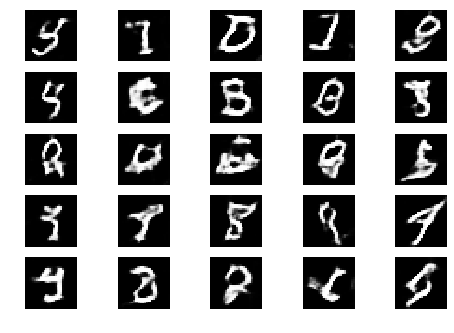

Epoch 0 Batch 601/937 [D loss: 0.183684, acc.: 90.62%] [G loss: 0.000017]
Epoch 0 Batch 602/937 [D loss: 0.165285, acc.: 96.88%] [G loss: 0.000020]
Epoch 0 Batch 603/937 [D loss: 0.343027, acc.: 81.25%] [G loss: 0.000008]
Epoch 0 Batch 604/937 [D loss: 1.137633, acc.: 53.12%] [G loss: 0.000006]
Epoch 0 Batch 605/937 [D loss: 0.149673, acc.: 96.88%] [G loss: 0.000020]
Epoch 0 Batch 606/937 [D loss: 0.079308, acc.: 96.88%] [G loss: 0.000023]


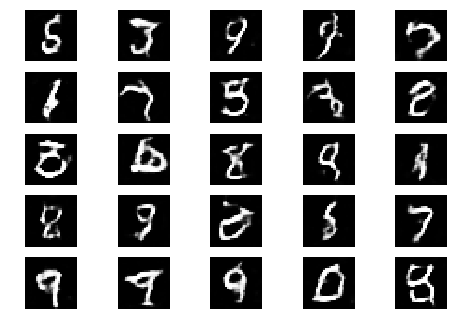

Epoch 0 Batch 607/937 [D loss: 0.135552, acc.: 96.88%] [G loss: 0.000020]
Epoch 0 Batch 608/937 [D loss: 1.169359, acc.: 40.62%] [G loss: 0.000005]
Epoch 0 Batch 609/937 [D loss: 0.098028, acc.: 100.00%] [G loss: 0.000013]
Epoch 0 Batch 610/937 [D loss: 0.085143, acc.: 100.00%] [G loss: 0.000015]
Epoch 0 Batch 611/937 [D loss: 0.090743, acc.: 96.88%] [G loss: 0.000036]
Epoch 0 Batch 612/937 [D loss: 0.849517, acc.: 46.88%] [G loss: 0.000006]


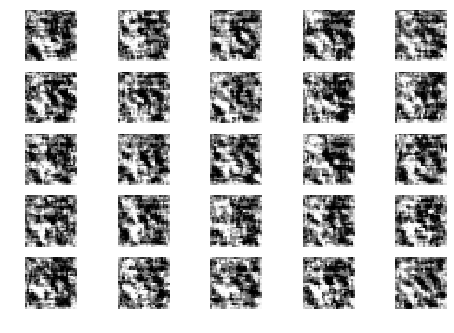

Epoch 0 Batch 613/937 [D loss: 0.211592, acc.: 90.62%] [G loss: 0.000050]
Epoch 0 Batch 614/937 [D loss: 0.282187, acc.: 84.38%] [G loss: 0.000005]
Epoch 0 Batch 615/937 [D loss: 0.652914, acc.: 65.62%] [G loss: 0.000010]
Epoch 0 Batch 616/937 [D loss: 0.139231, acc.: 96.88%] [G loss: 0.000016]
Epoch 0 Batch 617/937 [D loss: 0.075385, acc.: 100.00%] [G loss: 0.000012]
Epoch 0 Batch 618/937 [D loss: 0.020385, acc.: 100.00%] [G loss: 0.000013]
Epoch 0 Batch 619/937 [D loss: 0.173717, acc.: 93.75%] [G loss: 0.000005]
Epoch 0 Batch 620/937 [D loss: 1.002153, acc.: 53.12%] [G loss: 0.000005]
Epoch 0 Batch 621/937 [D loss: 0.055915, acc.: 100.00%] [G loss: 0.000003]
Epoch 0 Batch 622/937 [D loss: 0.201006, acc.: 93.75%] [G loss: 0.000013]
Epoch 0 Batch 623/937 [D loss: 0.275882, acc.: 84.38%] [G loss: 0.000011]
Epoch 0 Batch 624/937 [D loss: 0.176976, acc.: 93.75%] [G loss: 0.000007]
Epoch 0 Batch 625/937 [D loss: 0.007350, acc.: 100.00%] [G loss: 0.000007]
Epoch 0 Batch 626/937 [D loss: 0.1

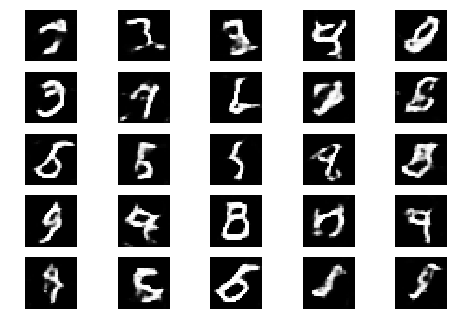

Epoch 0 Batch 701/937 [D loss: 0.238226, acc.: 81.25%] [G loss: 0.000006]
Epoch 0 Batch 702/937 [D loss: 0.831275, acc.: 62.50%] [G loss: 0.000007]
Epoch 0 Batch 703/937 [D loss: 0.442275, acc.: 84.38%] [G loss: 0.000006]
Epoch 0 Batch 704/937 [D loss: 1.153641, acc.: 50.00%] [G loss: 0.000010]
Epoch 0 Batch 705/937 [D loss: 0.035947, acc.: 100.00%] [G loss: 0.000037]
Epoch 0 Batch 706/937 [D loss: 0.121015, acc.: 100.00%] [G loss: 0.000022]
Epoch 0 Batch 707/937 [D loss: 0.859680, acc.: 56.25%] [G loss: 0.000005]


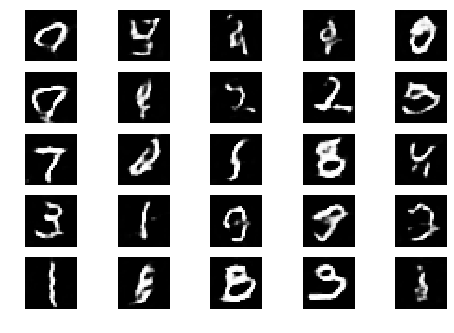

Epoch 0 Batch 708/937 [D loss: 0.100418, acc.: 100.00%] [G loss: 0.000017]
Epoch 0 Batch 709/937 [D loss: 0.059392, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 710/937 [D loss: 0.067092, acc.: 100.00%] [G loss: 0.000007]
Epoch 0 Batch 711/937 [D loss: 0.074580, acc.: 100.00%] [G loss: 0.000027]
Epoch 0 Batch 712/937 [D loss: 0.355190, acc.: 87.50%] [G loss: 0.000009]
Epoch 0 Batch 713/937 [D loss: 0.159769, acc.: 96.88%] [G loss: 0.000016]
Epoch 0 Batch 714/937 [D loss: 0.665229, acc.: 68.75%] [G loss: 0.000021]


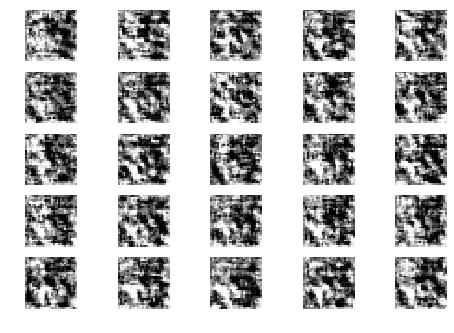

Epoch 0 Batch 715/937 [D loss: 0.227335, acc.: 87.50%] [G loss: 0.000007]
Epoch 0 Batch 716/937 [D loss: 0.056356, acc.: 100.00%] [G loss: 0.000058]
Epoch 0 Batch 717/937 [D loss: 0.268372, acc.: 93.75%] [G loss: 0.000020]
Epoch 0 Batch 718/937 [D loss: 1.146339, acc.: 40.62%] [G loss: 0.000026]
Epoch 0 Batch 719/937 [D loss: 0.488632, acc.: 84.38%] [G loss: 0.000017]
Epoch 0 Batch 720/937 [D loss: 0.108982, acc.: 100.00%] [G loss: 0.000008]
Epoch 0 Batch 721/937 [D loss: 0.217408, acc.: 96.88%] [G loss: 0.000008]
Epoch 0 Batch 722/937 [D loss: 0.628738, acc.: 59.38%] [G loss: 0.000026]
Epoch 0 Batch 723/937 [D loss: 0.136111, acc.: 96.88%] [G loss: 0.000030]
Epoch 0 Batch 724/937 [D loss: 0.129341, acc.: 100.00%] [G loss: 0.000015]
Epoch 0 Batch 725/937 [D loss: 0.052013, acc.: 100.00%] [G loss: 0.000013]
Epoch 0 Batch 726/937 [D loss: 0.485708, acc.: 68.75%] [G loss: 0.000030]
Epoch 0 Batch 727/937 [D loss: 0.419744, acc.: 71.88%] [G loss: 0.000041]
Epoch 0 Batch 728/937 [D loss: 0.2

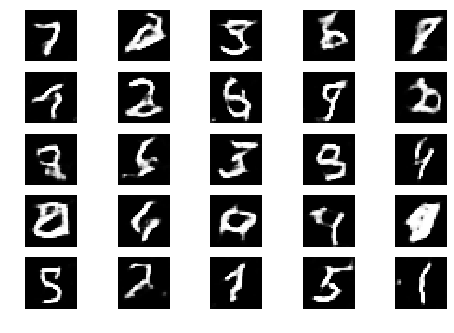

Epoch 0 Batch 801/937 [D loss: 0.323951, acc.: 90.62%] [G loss: 0.000007]
Epoch 0 Batch 802/937 [D loss: 0.259579, acc.: 96.88%] [G loss: 0.000017]
Epoch 0 Batch 803/937 [D loss: 0.269628, acc.: 81.25%] [G loss: 0.000010]
Epoch 0 Batch 804/937 [D loss: 0.093750, acc.: 100.00%] [G loss: 0.000009]
Epoch 0 Batch 805/937 [D loss: 0.029965, acc.: 100.00%] [G loss: 0.000004]
Epoch 0 Batch 806/937 [D loss: 0.261122, acc.: 96.88%] [G loss: 0.000005]
Epoch 0 Batch 807/937 [D loss: 0.248138, acc.: 90.62%] [G loss: 0.000003]
Epoch 0 Batch 808/937 [D loss: 0.010952, acc.: 100.00%] [G loss: 0.000003]


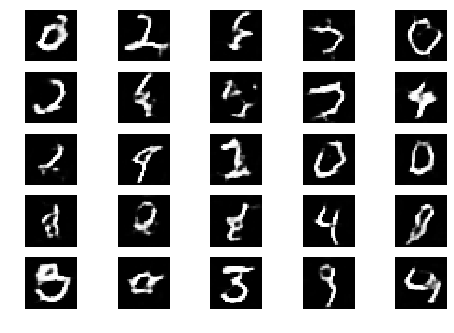

Epoch 0 Batch 809/937 [D loss: 0.524473, acc.: 71.88%] [G loss: 0.000001]
Epoch 0 Batch 810/937 [D loss: 0.218486, acc.: 93.75%] [G loss: 0.000003]
Epoch 0 Batch 811/937 [D loss: 0.790668, acc.: 59.38%] [G loss: 0.000017]
Epoch 0 Batch 812/937 [D loss: 0.437771, acc.: 78.12%] [G loss: 0.000021]
Epoch 0 Batch 813/937 [D loss: 0.189358, acc.: 93.75%] [G loss: 0.000005]
Epoch 0 Batch 814/937 [D loss: 0.564233, acc.: 62.50%] [G loss: 0.000006]
Epoch 0 Batch 815/937 [D loss: 0.018759, acc.: 100.00%] [G loss: 0.000012]
Epoch 0 Batch 816/937 [D loss: 0.150948, acc.: 93.75%] [G loss: 0.000007]


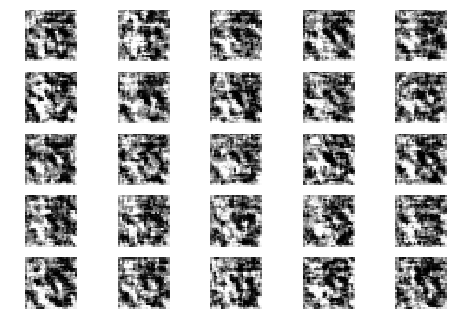

Epoch 0 Batch 817/937 [D loss: 0.997275, acc.: 28.12%] [G loss: 0.000007]
Epoch 0 Batch 818/937 [D loss: 0.318074, acc.: 81.25%] [G loss: 0.000003]
Epoch 0 Batch 819/937 [D loss: 0.186875, acc.: 93.75%] [G loss: 0.000002]
Epoch 0 Batch 820/937 [D loss: 0.058756, acc.: 100.00%] [G loss: 0.000003]
Epoch 0 Batch 821/937 [D loss: 0.692632, acc.: 62.50%] [G loss: 0.000005]
Epoch 0 Batch 822/937 [D loss: 0.427945, acc.: 78.12%] [G loss: 0.000005]
Epoch 0 Batch 823/937 [D loss: 0.072041, acc.: 100.00%] [G loss: 0.000005]
Epoch 0 Batch 824/937 [D loss: 1.227468, acc.: 53.12%] [G loss: 0.000004]
Epoch 0 Batch 825/937 [D loss: 0.235195, acc.: 93.75%] [G loss: 0.000002]
Epoch 0 Batch 826/937 [D loss: 0.440877, acc.: 78.12%] [G loss: 0.000002]
Epoch 0 Batch 827/937 [D loss: 0.112870, acc.: 96.88%] [G loss: 0.000003]
Epoch 0 Batch 828/937 [D loss: 0.065199, acc.: 100.00%] [G loss: 0.000017]
Epoch 0 Batch 829/937 [D loss: 0.114652, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 830/937 [D loss: 1.4

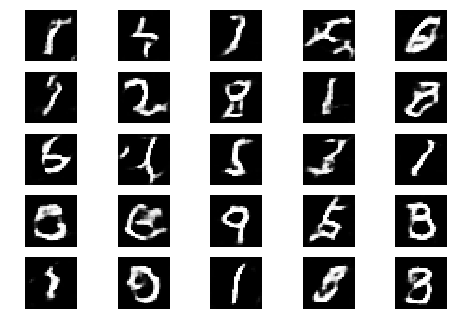

Epoch 0 Batch 901/937 [D loss: 0.059783, acc.: 100.00%] [G loss: 0.000018]
Epoch 0 Batch 902/937 [D loss: 0.022406, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 903/937 [D loss: 0.680352, acc.: 56.25%] [G loss: 0.000004]
Epoch 0 Batch 904/937 [D loss: 0.208658, acc.: 96.88%] [G loss: 0.000010]
Epoch 0 Batch 905/937 [D loss: 0.220020, acc.: 90.62%] [G loss: 0.000004]
Epoch 0 Batch 906/937 [D loss: 0.109226, acc.: 96.88%] [G loss: 0.000010]
Epoch 0 Batch 907/937 [D loss: 0.063878, acc.: 100.00%] [G loss: 0.000002]
Epoch 0 Batch 908/937 [D loss: 0.208798, acc.: 93.75%] [G loss: 0.000014]
Epoch 0 Batch 909/937 [D loss: 0.101879, acc.: 93.75%] [G loss: 0.000033]


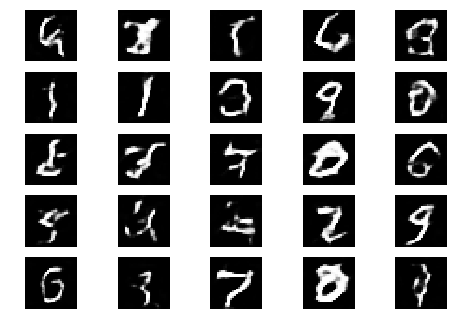

Epoch 0 Batch 910/937 [D loss: 0.149189, acc.: 93.75%] [G loss: 0.000017]
Epoch 0 Batch 911/937 [D loss: 0.698652, acc.: 62.50%] [G loss: 0.000031]
Epoch 0 Batch 912/937 [D loss: 0.570490, acc.: 59.38%] [G loss: 0.000011]
Epoch 0 Batch 913/937 [D loss: 0.404338, acc.: 81.25%] [G loss: 0.000002]
Epoch 0 Batch 914/937 [D loss: 0.086408, acc.: 100.00%] [G loss: 0.000012]
Epoch 0 Batch 915/937 [D loss: 0.451537, acc.: 84.38%] [G loss: 0.000008]
Epoch 0 Batch 916/937 [D loss: 0.091259, acc.: 96.88%] [G loss: 0.000003]
Epoch 0 Batch 917/937 [D loss: 0.058530, acc.: 100.00%] [G loss: 0.000010]
Epoch 0 Batch 918/937 [D loss: 0.536063, acc.: 71.88%] [G loss: 0.000006]


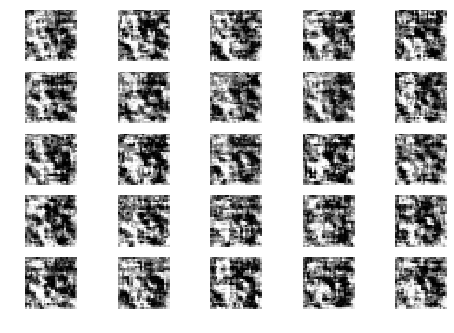

Epoch 0 Batch 919/937 [D loss: 0.027207, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 920/937 [D loss: 0.059461, acc.: 100.00%] [G loss: 0.000015]
Epoch 0 Batch 921/937 [D loss: 0.064259, acc.: 100.00%] [G loss: 0.000023]
Epoch 0 Batch 922/937 [D loss: 0.513078, acc.: 68.75%] [G loss: 0.000003]
Epoch 0 Batch 923/937 [D loss: 0.182089, acc.: 93.75%] [G loss: 0.000002]
Epoch 0 Batch 924/937 [D loss: 0.036177, acc.: 100.00%] [G loss: 0.000002]
Epoch 0 Batch 925/937 [D loss: 0.946713, acc.: 56.25%] [G loss: 0.000006]
Epoch 0 Batch 926/937 [D loss: 0.039140, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 927/937 [D loss: 0.788434, acc.: 62.50%] [G loss: 0.000010]
Epoch 0 Batch 928/937 [D loss: 0.085049, acc.: 100.00%] [G loss: 0.000006]
Epoch 0 Batch 929/937 [D loss: 0.073205, acc.: 100.00%] [G loss: 0.000011]
Epoch 0 Batch 930/937 [D loss: 0.214092, acc.: 93.75%] [G loss: 0.000009]
Epoch 0 Batch 931/937 [D loss: 0.120518, acc.: 93.75%] [G loss: 0.000007]
Epoch 0 Batch 932/937 [D loss: 

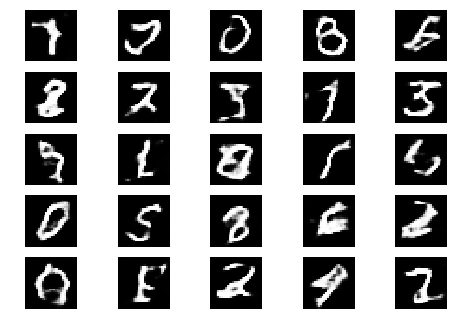

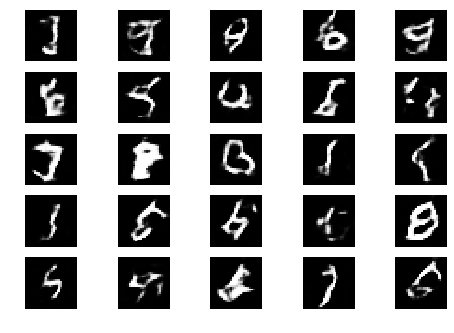

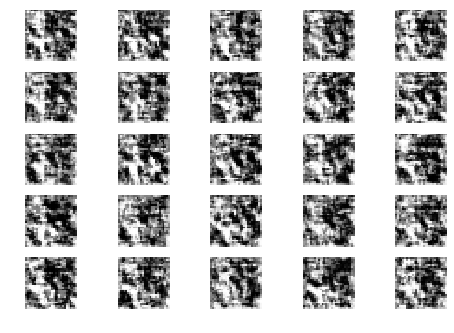

Epoch 1 Batch 1/937 [D loss: 0.050618, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 2/937 [D loss: 0.024119, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 3/937 [D loss: 0.077430, acc.: 96.88%] [G loss: 0.000003]
Epoch 1 Batch 4/937 [D loss: 0.147739, acc.: 96.88%] [G loss: 0.000008]
Epoch 1 Batch 5/937 [D loss: 0.015756, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 6/937 [D loss: 1.133565, acc.: 53.12%] [G loss: 0.000003]
Epoch 1 Batch 7/937 [D loss: 0.250951, acc.: 87.50%] [G loss: 0.000004]
Epoch 1 Batch 8/937 [D loss: 1.852700, acc.: 50.00%] [G loss: 0.000014]
Epoch 1 Batch 9/937 [D loss: 0.166316, acc.: 100.00%] [G loss: 0.000022]
Epoch 1 Batch 10/937 [D loss: 0.669372, acc.: 68.75%] [G loss: 0.000004]
Epoch 1 Batch 11/937 [D loss: 0.041103, acc.: 100.00%] [G loss: 0.000010]
Epoch 1 Batch 12/937 [D loss: 0.082469, acc.: 100.00%] [G loss: 0.000016]
Epoch 1 Batch 13/937 [D loss: 0.044487, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 14/937 [D loss: 0.011047, acc.: 100.00%

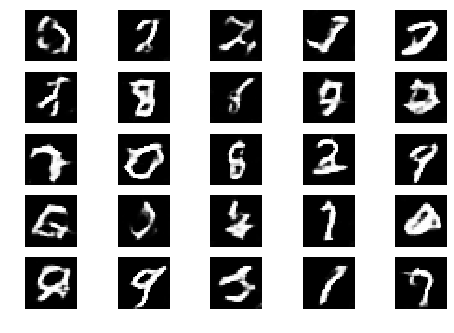

Epoch 1 Batch 101/937 [D loss: 0.206784, acc.: 96.88%] [G loss: 0.000025]


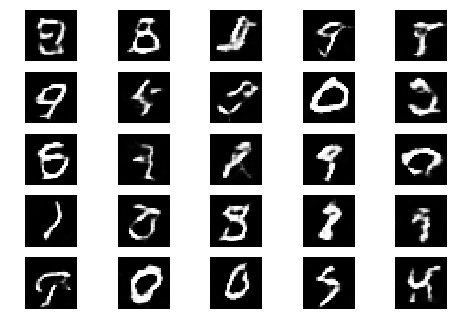

Epoch 1 Batch 102/937 [D loss: 0.096658, acc.: 100.00%] [G loss: 0.000007]


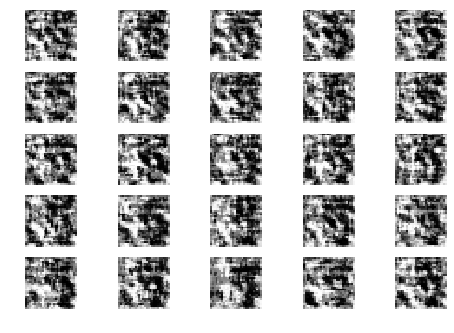

Epoch 1 Batch 103/937 [D loss: 0.621382, acc.: 62.50%] [G loss: 0.000004]
Epoch 1 Batch 104/937 [D loss: 0.172566, acc.: 93.75%] [G loss: 0.000004]
Epoch 1 Batch 105/937 [D loss: 0.086176, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 106/937 [D loss: 0.644750, acc.: 65.62%] [G loss: 0.000104]
Epoch 1 Batch 107/937 [D loss: 0.163474, acc.: 100.00%] [G loss: 0.000018]
Epoch 1 Batch 108/937 [D loss: 0.055156, acc.: 100.00%] [G loss: 0.000018]
Epoch 1 Batch 109/937 [D loss: 0.136393, acc.: 100.00%] [G loss: 0.000020]
Epoch 1 Batch 110/937 [D loss: 0.021336, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 111/937 [D loss: 0.022005, acc.: 100.00%] [G loss: 0.000020]
Epoch 1 Batch 112/937 [D loss: 0.050969, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 113/937 [D loss: 0.003673, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 114/937 [D loss: 0.483879, acc.: 75.00%] [G loss: 0.000010]
Epoch 1 Batch 115/937 [D loss: 0.231860, acc.: 90.62%] [G loss: 0.000007]
Epoch 1 Batch 116/937 [D loss:

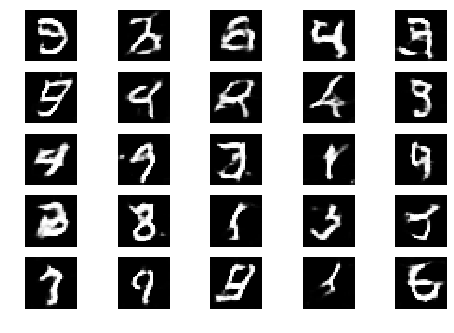

Epoch 1 Batch 201/937 [D loss: 0.349518, acc.: 84.38%] [G loss: 0.000007]
Epoch 1 Batch 202/937 [D loss: 0.039638, acc.: 100.00%] [G loss: 0.000012]


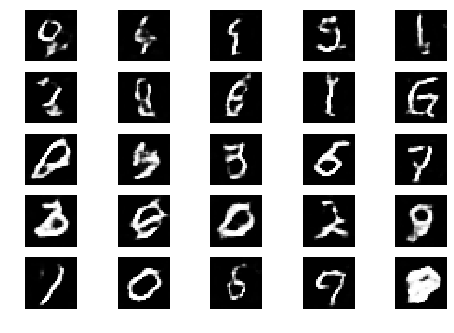

Epoch 1 Batch 203/937 [D loss: 0.036788, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 204/937 [D loss: 0.110694, acc.: 100.00%] [G loss: 0.000012]


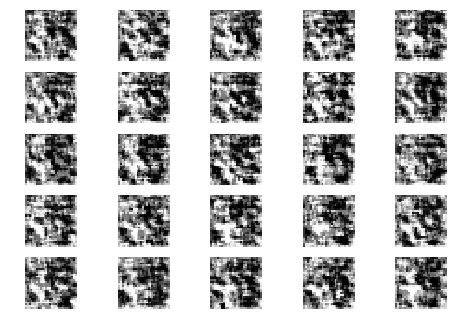

Epoch 1 Batch 205/937 [D loss: 0.355140, acc.: 84.38%] [G loss: 0.000002]
Epoch 1 Batch 206/937 [D loss: 0.075633, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 207/937 [D loss: 0.469676, acc.: 71.88%] [G loss: 0.000001]
Epoch 1 Batch 208/937 [D loss: 0.781160, acc.: 59.38%] [G loss: 0.000003]
Epoch 1 Batch 209/937 [D loss: 0.105815, acc.: 96.88%] [G loss: 0.000008]
Epoch 1 Batch 210/937 [D loss: 0.080079, acc.: 100.00%] [G loss: 0.000025]
Epoch 1 Batch 211/937 [D loss: 0.156325, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 212/937 [D loss: 0.041547, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 213/937 [D loss: 0.083398, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 214/937 [D loss: 0.082881, acc.: 96.88%] [G loss: 0.000007]
Epoch 1 Batch 215/937 [D loss: 0.126425, acc.: 96.88%] [G loss: 0.000024]
Epoch 1 Batch 216/937 [D loss: 0.703584, acc.: 65.62%] [G loss: 0.000003]
Epoch 1 Batch 217/937 [D loss: 0.115247, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 218/937 [D loss: 0.1

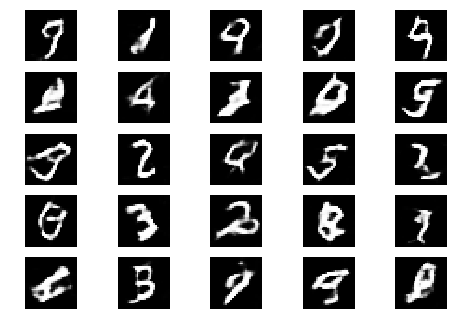

Epoch 1 Batch 301/937 [D loss: 0.156630, acc.: 93.75%] [G loss: 0.000033]
Epoch 1 Batch 302/937 [D loss: 0.216699, acc.: 93.75%] [G loss: 0.000005]
Epoch 1 Batch 303/937 [D loss: 0.022278, acc.: 100.00%] [G loss: 0.000008]


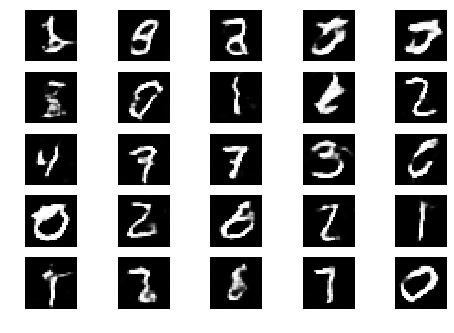

Epoch 1 Batch 304/937 [D loss: 0.458307, acc.: 81.25%] [G loss: 0.000049]
Epoch 1 Batch 305/937 [D loss: 0.041124, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 306/937 [D loss: 0.156980, acc.: 100.00%] [G loss: 0.000005]


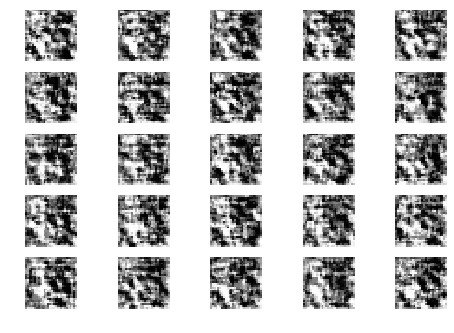

Epoch 1 Batch 307/937 [D loss: 0.076209, acc.: 100.00%] [G loss: 0.000045]
Epoch 1 Batch 308/937 [D loss: 0.049334, acc.: 100.00%] [G loss: 0.000015]
Epoch 1 Batch 309/937 [D loss: 0.450966, acc.: 78.12%] [G loss: 0.000008]
Epoch 1 Batch 310/937 [D loss: 0.007555, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 311/937 [D loss: 0.145445, acc.: 93.75%] [G loss: 0.000020]
Epoch 1 Batch 312/937 [D loss: 0.497144, acc.: 81.25%] [G loss: 0.000018]
Epoch 1 Batch 313/937 [D loss: 0.010873, acc.: 100.00%] [G loss: 0.000014]
Epoch 1 Batch 314/937 [D loss: 0.361159, acc.: 78.12%] [G loss: 0.000007]
Epoch 1 Batch 315/937 [D loss: 0.529279, acc.: 75.00%] [G loss: 0.000023]
Epoch 1 Batch 316/937 [D loss: 0.044033, acc.: 96.88%] [G loss: 0.000006]
Epoch 1 Batch 317/937 [D loss: 0.029419, acc.: 100.00%] [G loss: 0.000030]
Epoch 1 Batch 318/937 [D loss: 0.248309, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 319/937 [D loss: 0.110686, acc.: 100.00%] [G loss: 0.000013]
Epoch 1 Batch 320/937 [D loss: 0

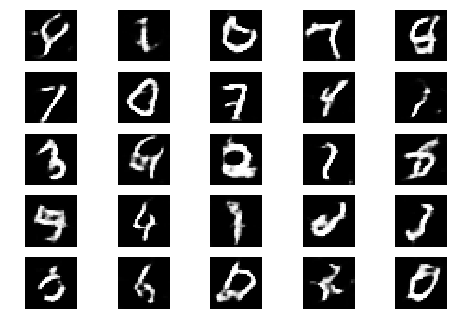

Epoch 1 Batch 401/937 [D loss: 0.101536, acc.: 96.88%] [G loss: 0.000007]
Epoch 1 Batch 402/937 [D loss: 0.146355, acc.: 93.75%] [G loss: 0.000224]
Epoch 1 Batch 403/937 [D loss: 0.036171, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 404/937 [D loss: 0.096285, acc.: 96.88%] [G loss: 0.000001]


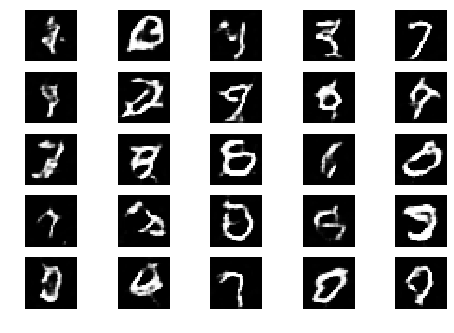

Epoch 1 Batch 405/937 [D loss: 0.111771, acc.: 100.00%] [G loss: 0.000010]
Epoch 1 Batch 406/937 [D loss: 0.508813, acc.: 75.00%] [G loss: 0.000002]
Epoch 1 Batch 407/937 [D loss: 0.336170, acc.: 78.12%] [G loss: 0.000001]
Epoch 1 Batch 408/937 [D loss: 0.020882, acc.: 100.00%] [G loss: 0.000007]


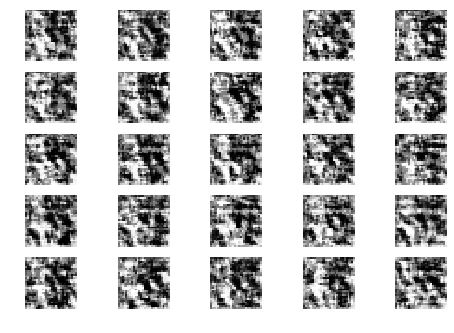

Epoch 1 Batch 409/937 [D loss: 0.027210, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 410/937 [D loss: 0.021915, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 411/937 [D loss: 0.450411, acc.: 71.88%] [G loss: 0.000010]
Epoch 1 Batch 412/937 [D loss: 0.187801, acc.: 93.75%] [G loss: 0.000006]
Epoch 1 Batch 413/937 [D loss: 0.041107, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 414/937 [D loss: 0.168844, acc.: 93.75%] [G loss: 0.000002]
Epoch 1 Batch 415/937 [D loss: 0.031466, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 416/937 [D loss: 0.002641, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 417/937 [D loss: 0.189614, acc.: 90.62%] [G loss: 0.000013]
Epoch 1 Batch 418/937 [D loss: 0.073022, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 419/937 [D loss: 0.113890, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 420/937 [D loss: 0.010040, acc.: 100.00%] [G loss: 0.000015]
Epoch 1 Batch 421/937 [D loss: 0.100383, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 422/937 [D loss: 

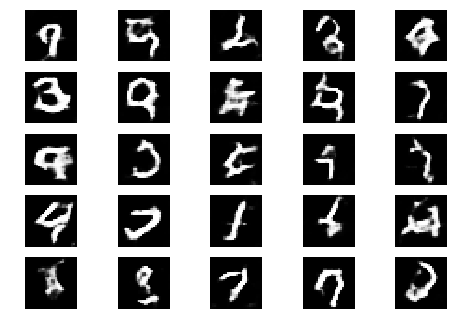

Epoch 1 Batch 501/937 [D loss: 0.415522, acc.: 81.25%] [G loss: 0.000003]
Epoch 1 Batch 502/937 [D loss: 0.014282, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 503/937 [D loss: 0.054640, acc.: 100.00%] [G loss: 0.000032]
Epoch 1 Batch 504/937 [D loss: 0.008156, acc.: 100.00%] [G loss: 0.000007]
Epoch 1 Batch 505/937 [D loss: 0.706596, acc.: 62.50%] [G loss: 0.000003]


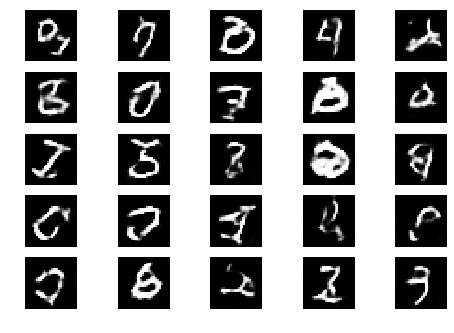

Epoch 1 Batch 506/937 [D loss: 0.051717, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 507/937 [D loss: 0.052551, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 508/937 [D loss: 0.007005, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 509/937 [D loss: 0.139087, acc.: 93.75%] [G loss: 0.000004]
Epoch 1 Batch 510/937 [D loss: 0.223265, acc.: 93.75%] [G loss: 0.000006]


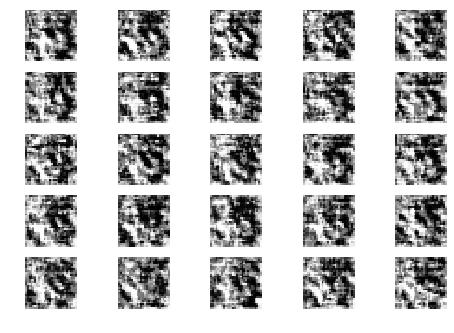

Epoch 1 Batch 511/937 [D loss: 0.008071, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 512/937 [D loss: 0.215908, acc.: 90.62%] [G loss: 0.000001]
Epoch 1 Batch 513/937 [D loss: 0.005373, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 514/937 [D loss: 0.776940, acc.: 59.38%] [G loss: 0.000004]
Epoch 1 Batch 515/937 [D loss: 0.028348, acc.: 100.00%] [G loss: 0.000003]
Epoch 1 Batch 516/937 [D loss: 0.317564, acc.: 84.38%] [G loss: 0.000003]
Epoch 1 Batch 517/937 [D loss: 0.066073, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 518/937 [D loss: 0.340756, acc.: 78.12%] [G loss: 0.000004]
Epoch 1 Batch 519/937 [D loss: 0.683541, acc.: 65.62%] [G loss: 0.000000]
Epoch 1 Batch 520/937 [D loss: 0.403134, acc.: 78.12%] [G loss: 0.000003]
Epoch 1 Batch 521/937 [D loss: 0.197822, acc.: 87.50%] [G loss: 0.000009]
Epoch 1 Batch 522/937 [D loss: 0.010311, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 523/937 [D loss: 0.095918, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 524/937 [D loss: 0

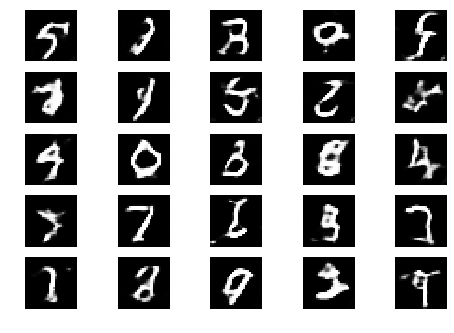

Epoch 1 Batch 601/937 [D loss: 0.020173, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 602/937 [D loss: 0.004273, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 603/937 [D loss: 0.061028, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 604/937 [D loss: 0.029295, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 605/937 [D loss: 0.106504, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 606/937 [D loss: 0.279549, acc.: 87.50%] [G loss: 0.000001]


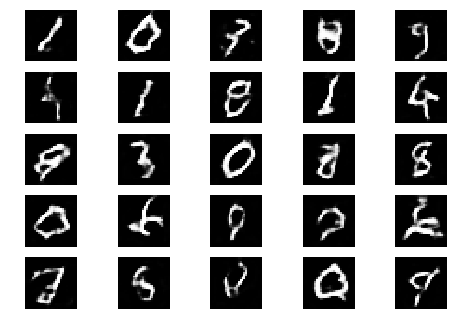

Epoch 1 Batch 607/937 [D loss: 0.000400, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 608/937 [D loss: 0.455135, acc.: 75.00%] [G loss: 0.000003]
Epoch 1 Batch 609/937 [D loss: 0.006165, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 610/937 [D loss: 0.428181, acc.: 81.25%] [G loss: 0.000001]
Epoch 1 Batch 611/937 [D loss: 0.095394, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 612/937 [D loss: 0.595403, acc.: 65.62%] [G loss: 0.000001]


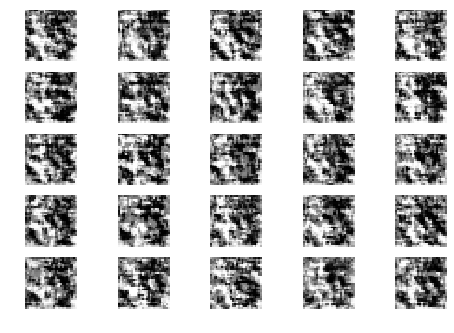

Epoch 1 Batch 613/937 [D loss: 0.005053, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 614/937 [D loss: 0.003408, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 615/937 [D loss: 0.001969, acc.: 100.00%] [G loss: 0.000011]
Epoch 1 Batch 616/937 [D loss: 0.042655, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 617/937 [D loss: 0.010808, acc.: 100.00%] [G loss: 0.000009]
Epoch 1 Batch 618/937 [D loss: 0.251325, acc.: 90.62%] [G loss: 0.000002]
Epoch 1 Batch 619/937 [D loss: 0.018558, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 620/937 [D loss: 0.204779, acc.: 93.75%] [G loss: 0.000001]
Epoch 1 Batch 621/937 [D loss: 0.004748, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 622/937 [D loss: 0.061973, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 623/937 [D loss: 0.035100, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 624/937 [D loss: 0.107176, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 625/937 [D loss: 0.076865, acc.: 96.88%] [G loss: 0.000000]
Epoch 1 Batch 626/937 [D los

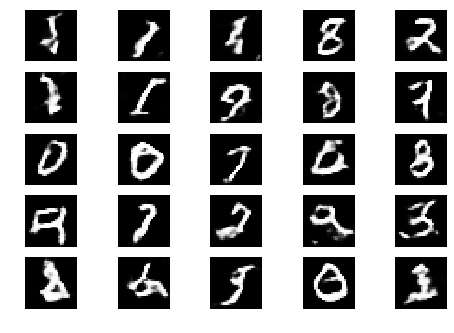

Epoch 1 Batch 701/937 [D loss: 0.318660, acc.: 90.62%] [G loss: 0.000003]
Epoch 1 Batch 702/937 [D loss: 0.084327, acc.: 100.00%] [G loss: 0.000008]
Epoch 1 Batch 703/937 [D loss: 0.081797, acc.: 100.00%] [G loss: 0.000004]
Epoch 1 Batch 704/937 [D loss: 0.093092, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 705/937 [D loss: 0.010721, acc.: 100.00%] [G loss: 0.000006]
Epoch 1 Batch 706/937 [D loss: 0.203312, acc.: 93.75%] [G loss: 0.000007]
Epoch 1 Batch 707/937 [D loss: 0.247687, acc.: 90.62%] [G loss: 0.000002]


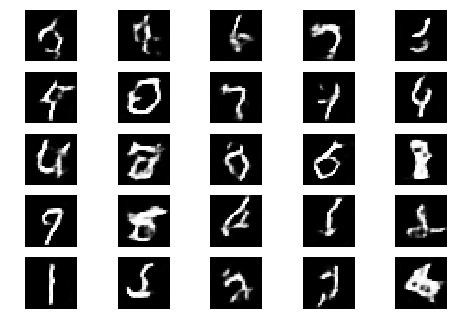

Epoch 1 Batch 708/937 [D loss: 0.118327, acc.: 96.88%] [G loss: 0.000002]
Epoch 1 Batch 709/937 [D loss: 0.259156, acc.: 90.62%] [G loss: 0.000006]
Epoch 1 Batch 710/937 [D loss: 0.165541, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 711/937 [D loss: 0.086486, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 712/937 [D loss: 0.017829, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 713/937 [D loss: 0.269938, acc.: 90.62%] [G loss: 0.000002]
Epoch 1 Batch 714/937 [D loss: 0.341555, acc.: 81.25%] [G loss: 0.000001]


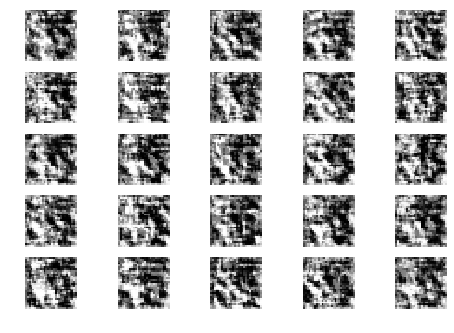

Epoch 1 Batch 715/937 [D loss: 0.172931, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 716/937 [D loss: 0.500510, acc.: 75.00%] [G loss: 0.000001]
Epoch 1 Batch 717/937 [D loss: 0.018770, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 718/937 [D loss: 0.064466, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 719/937 [D loss: 0.143424, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 720/937 [D loss: 0.097609, acc.: 96.88%] [G loss: 0.000005]
Epoch 1 Batch 721/937 [D loss: 0.068012, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 722/937 [D loss: 0.020568, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 723/937 [D loss: 0.004436, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 724/937 [D loss: 0.036491, acc.: 100.00%] [G loss: 0.000018]
Epoch 1 Batch 725/937 [D loss: 0.053065, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 726/937 [D loss: 0.268785, acc.: 90.62%] [G loss: 0.000001]
Epoch 1 Batch 727/937 [D loss: 0.015563, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 728/937 [D loss:

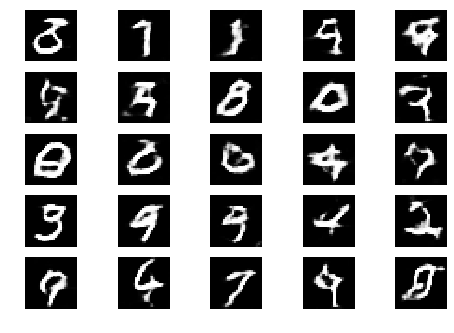

Epoch 1 Batch 801/937 [D loss: 0.243293, acc.: 84.38%] [G loss: 0.000000]
Epoch 1 Batch 802/937 [D loss: 0.028406, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 803/937 [D loss: 0.034275, acc.: 100.00%] [G loss: 0.000005]
Epoch 1 Batch 804/937 [D loss: 0.056136, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 805/937 [D loss: 0.105596, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 806/937 [D loss: 0.172128, acc.: 96.88%] [G loss: 0.000002]
Epoch 1 Batch 807/937 [D loss: 0.069226, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 808/937 [D loss: 0.751829, acc.: 59.38%] [G loss: 0.000001]


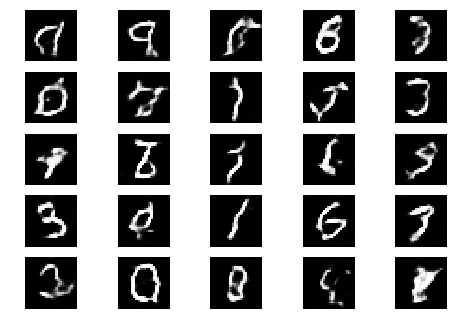

Epoch 1 Batch 809/937 [D loss: 0.005870, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 810/937 [D loss: 0.062154, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 811/937 [D loss: 0.044131, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 812/937 [D loss: 0.203627, acc.: 87.50%] [G loss: 0.000002]
Epoch 1 Batch 813/937 [D loss: 0.023380, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 814/937 [D loss: 0.017453, acc.: 100.00%] [G loss: 0.000029]
Epoch 1 Batch 815/937 [D loss: 0.798046, acc.: 62.50%] [G loss: 0.000000]
Epoch 1 Batch 816/937 [D loss: 0.019184, acc.: 100.00%] [G loss: 0.000000]


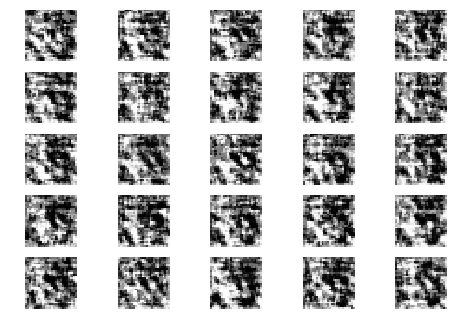

Epoch 1 Batch 817/937 [D loss: 0.234658, acc.: 90.62%] [G loss: 0.000000]
Epoch 1 Batch 818/937 [D loss: 0.029583, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 819/937 [D loss: 0.003435, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 820/937 [D loss: 0.119178, acc.: 93.75%] [G loss: 0.000007]
Epoch 1 Batch 821/937 [D loss: 0.042024, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 822/937 [D loss: 0.367518, acc.: 78.12%] [G loss: 0.000001]
Epoch 1 Batch 823/937 [D loss: 0.002069, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 824/937 [D loss: 0.396247, acc.: 75.00%] [G loss: 0.000000]
Epoch 1 Batch 825/937 [D loss: 0.004882, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 826/937 [D loss: 0.116748, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 827/937 [D loss: 0.004686, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 828/937 [D loss: 1.168171, acc.: 56.25%] [G loss: 0.000001]
Epoch 1 Batch 829/937 [D loss: 0.022509, acc.: 100.00%] [G loss: 0.000022]
Epoch 1 Batch 830/937 [D loss: 

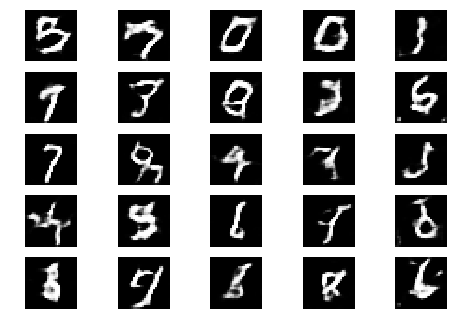

Epoch 1 Batch 901/937 [D loss: 0.728736, acc.: 56.25%] [G loss: 0.000002]
Epoch 1 Batch 902/937 [D loss: 0.119472, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 903/937 [D loss: 0.024101, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 904/937 [D loss: 0.002018, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 905/937 [D loss: 0.004229, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 906/937 [D loss: 0.008271, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 907/937 [D loss: 0.016288, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 908/937 [D loss: 0.624442, acc.: 62.50%] [G loss: 0.000001]
Epoch 1 Batch 909/937 [D loss: 0.064861, acc.: 100.00%] [G loss: 0.000003]


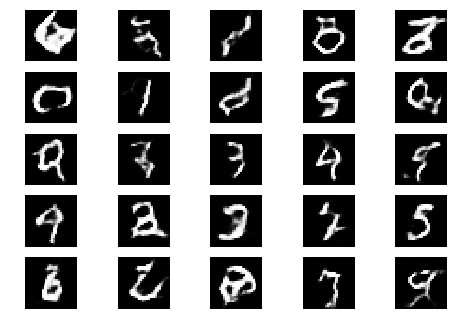

Epoch 1 Batch 910/937 [D loss: 0.088154, acc.: 96.88%] [G loss: 0.000004]
Epoch 1 Batch 911/937 [D loss: 0.016717, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 912/937 [D loss: 0.076729, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 913/937 [D loss: 0.033488, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 914/937 [D loss: 0.148738, acc.: 90.62%] [G loss: 0.000001]
Epoch 1 Batch 915/937 [D loss: 0.045013, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 916/937 [D loss: 0.022500, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 917/937 [D loss: 0.105700, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 918/937 [D loss: 0.550421, acc.: 75.00%] [G loss: 0.000003]


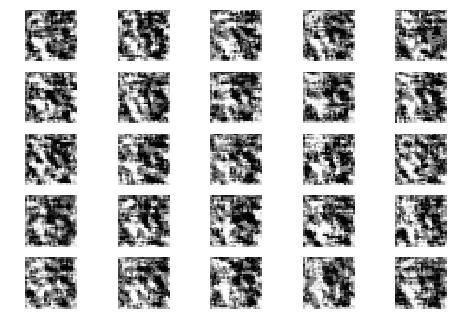

Epoch 1 Batch 919/937 [D loss: 0.120392, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 920/937 [D loss: 0.011957, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 921/937 [D loss: 0.040818, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 922/937 [D loss: 0.016035, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 923/937 [D loss: 0.604345, acc.: 62.50%] [G loss: 0.000001]
Epoch 1 Batch 924/937 [D loss: 0.072759, acc.: 96.88%] [G loss: 0.000000]
Epoch 1 Batch 925/937 [D loss: 0.962700, acc.: 46.88%] [G loss: 0.000000]
Epoch 1 Batch 926/937 [D loss: 0.009871, acc.: 100.00%] [G loss: 0.000002]
Epoch 1 Batch 927/937 [D loss: 0.054250, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 928/937 [D loss: 0.007154, acc.: 100.00%] [G loss: 0.000000]
Epoch 1 Batch 929/937 [D loss: 0.077783, acc.: 100.00%] [G loss: 0.000001]
Epoch 1 Batch 930/937 [D loss: 0.049288, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 931/937 [D loss: 0.163782, acc.: 96.88%] [G loss: 0.000001]
Epoch 1 Batch 932/937 [D loss:

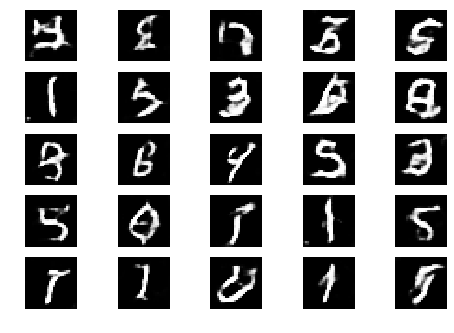

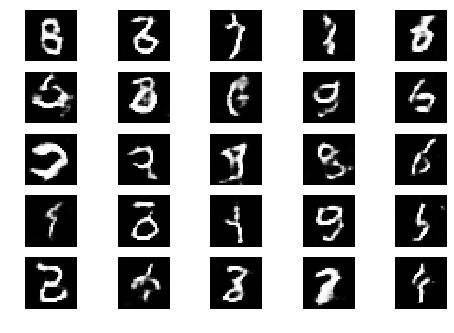

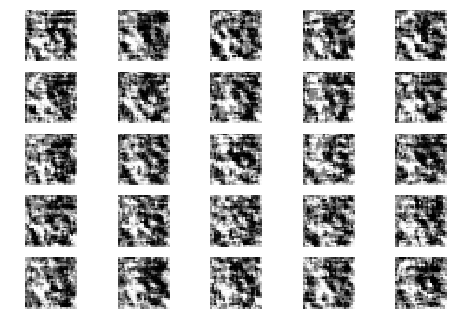

Epoch 2 Batch 1/937 [D loss: 0.723989, acc.: 56.25%] [G loss: 0.000014]
Epoch 2 Batch 2/937 [D loss: 0.289520, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 3/937 [D loss: 0.159260, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 4/937 [D loss: 0.002675, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 5/937 [D loss: 0.178043, acc.: 90.62%] [G loss: 0.000002]
Epoch 2 Batch 6/937 [D loss: 0.162672, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 7/937 [D loss: 0.368610, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 8/937 [D loss: 0.010372, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 9/937 [D loss: 0.110043, acc.: 96.88%] [G loss: 0.000001]
Epoch 2 Batch 10/937 [D loss: 0.036124, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 11/937 [D loss: 0.011083, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 12/937 [D loss: 0.011078, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 13/937 [D loss: 0.000959, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 14/937 [D loss: 0.008165, acc.: 100.00%]

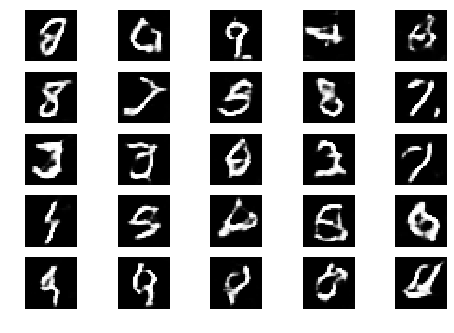

Epoch 2 Batch 101/937 [D loss: 0.433929, acc.: 75.00%] [G loss: 0.000003]


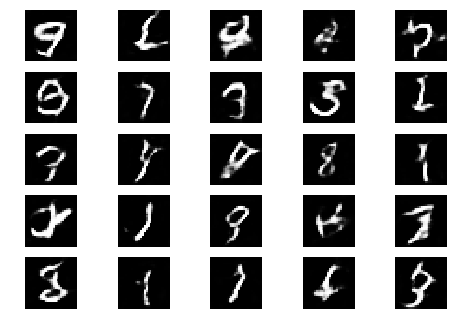

Epoch 2 Batch 102/937 [D loss: 0.058520, acc.: 96.88%] [G loss: 0.000001]


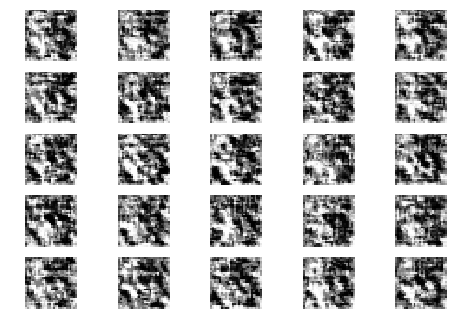

Epoch 2 Batch 103/937 [D loss: 0.053671, acc.: 96.88%] [G loss: 0.000002]
Epoch 2 Batch 104/937 [D loss: 0.036537, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 105/937 [D loss: 0.019639, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 106/937 [D loss: 0.010328, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 107/937 [D loss: 0.038284, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 108/937 [D loss: 0.147203, acc.: 93.75%] [G loss: 0.000001]
Epoch 2 Batch 109/937 [D loss: 0.010534, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 110/937 [D loss: 0.031480, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 111/937 [D loss: 1.068129, acc.: 50.00%] [G loss: 0.000001]
Epoch 2 Batch 112/937 [D loss: 0.267465, acc.: 84.38%] [G loss: 0.000009]
Epoch 2 Batch 113/937 [D loss: 1.003501, acc.: 53.12%] [G loss: 0.000001]
Epoch 2 Batch 114/937 [D loss: 0.140682, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 115/937 [D loss: 0.180131, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 116/937 [D loss: 0

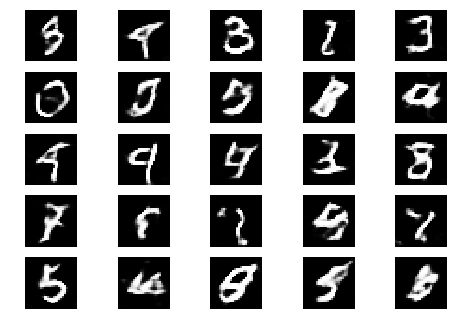

Epoch 2 Batch 201/937 [D loss: 0.012095, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 202/937 [D loss: 0.206591, acc.: 93.75%] [G loss: 0.000000]


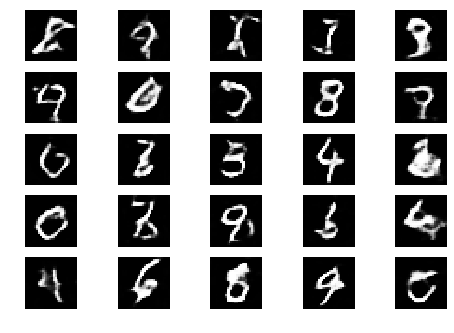

Epoch 2 Batch 203/937 [D loss: 0.005231, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 204/937 [D loss: 0.014744, acc.: 100.00%] [G loss: 0.000001]


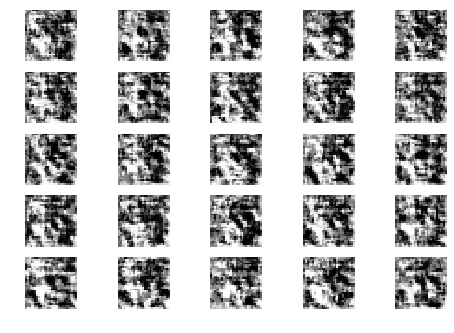

Epoch 2 Batch 205/937 [D loss: 1.370234, acc.: 53.12%] [G loss: 0.000001]
Epoch 2 Batch 206/937 [D loss: 0.052070, acc.: 100.00%] [G loss: 0.000008]
Epoch 2 Batch 207/937 [D loss: 0.799282, acc.: 65.62%] [G loss: 0.000001]
Epoch 2 Batch 208/937 [D loss: 0.039757, acc.: 100.00%] [G loss: 0.000005]
Epoch 2 Batch 209/937 [D loss: 0.475684, acc.: 75.00%] [G loss: 0.000001]
Epoch 2 Batch 210/937 [D loss: 0.013527, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 211/937 [D loss: 0.724762, acc.: 62.50%] [G loss: 0.000000]
Epoch 2 Batch 212/937 [D loss: 0.138760, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 213/937 [D loss: 0.025822, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 214/937 [D loss: 0.046528, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 215/937 [D loss: 0.028271, acc.: 100.00%] [G loss: 0.000006]
Epoch 2 Batch 216/937 [D loss: 0.160673, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 217/937 [D loss: 0.451572, acc.: 75.00%] [G loss: 0.000006]
Epoch 2 Batch 218/937 [D loss: 

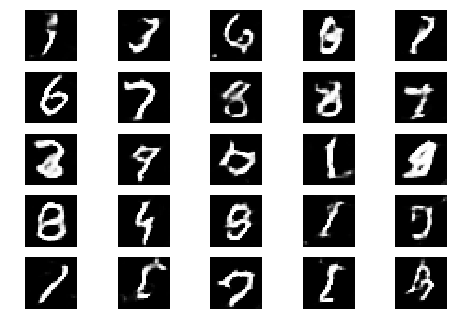

Epoch 2 Batch 301/937 [D loss: 0.089345, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 302/937 [D loss: 0.019771, acc.: 100.00%] [G loss: 0.000011]
Epoch 2 Batch 303/937 [D loss: 0.012344, acc.: 100.00%] [G loss: 0.000014]


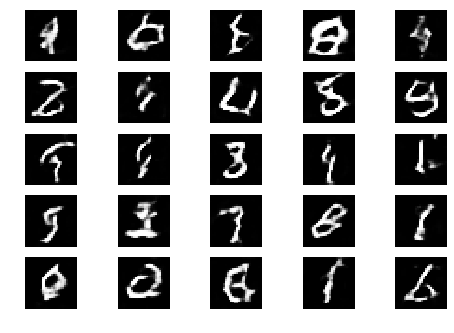

Epoch 2 Batch 304/937 [D loss: 0.046411, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 305/937 [D loss: 0.001679, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 306/937 [D loss: 0.279399, acc.: 84.38%] [G loss: 0.000001]


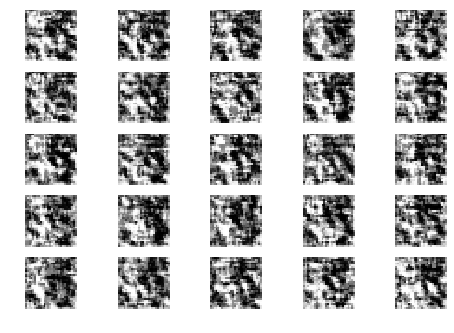

Epoch 2 Batch 307/937 [D loss: 0.009320, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 308/937 [D loss: 0.391409, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 309/937 [D loss: 0.148616, acc.: 90.62%] [G loss: 0.000001]
Epoch 2 Batch 310/937 [D loss: 0.224804, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 311/937 [D loss: 0.012192, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 312/937 [D loss: 0.006806, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 313/937 [D loss: 0.010404, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 314/937 [D loss: 0.170719, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 315/937 [D loss: 0.280144, acc.: 90.62%] [G loss: 0.000003]
Epoch 2 Batch 316/937 [D loss: 0.134194, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 317/937 [D loss: 0.166581, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 318/937 [D loss: 0.382524, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 319/937 [D loss: 0.314757, acc.: 84.38%] [G loss: 0.000001]
Epoch 2 Batch 320/937 [D loss: 0.0

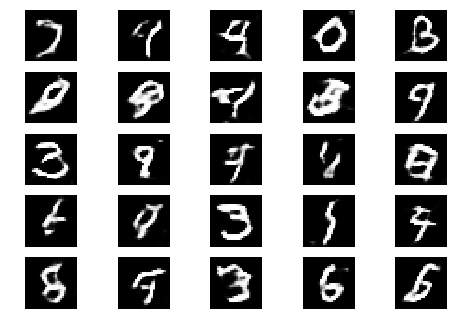

Epoch 2 Batch 401/937 [D loss: 0.039455, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 402/937 [D loss: 0.056676, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 403/937 [D loss: 0.055330, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 404/937 [D loss: 0.017612, acc.: 100.00%] [G loss: 0.000000]


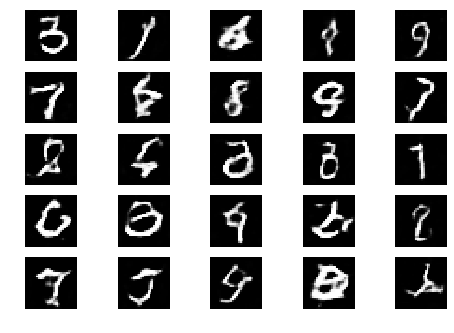

Epoch 2 Batch 405/937 [D loss: 0.022503, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 406/937 [D loss: 0.006030, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 407/937 [D loss: 0.008332, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 408/937 [D loss: 0.002874, acc.: 100.00%] [G loss: 0.000000]


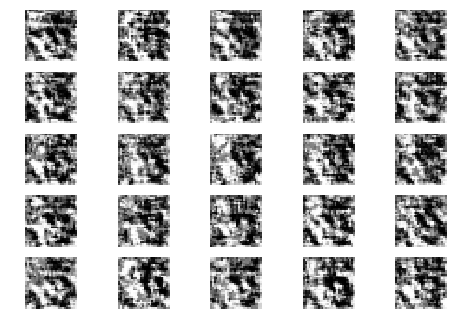

Epoch 2 Batch 409/937 [D loss: 0.000616, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 410/937 [D loss: 0.003885, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 411/937 [D loss: 0.008572, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 412/937 [D loss: 0.035603, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 413/937 [D loss: 0.050854, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 414/937 [D loss: 0.003089, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 415/937 [D loss: 0.004473, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 416/937 [D loss: 0.042256, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 417/937 [D loss: 0.060483, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 418/937 [D loss: 0.007114, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 419/937 [D loss: 0.077246, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 420/937 [D loss: 0.045917, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 421/937 [D loss: 0.004465, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 422/937 [D l

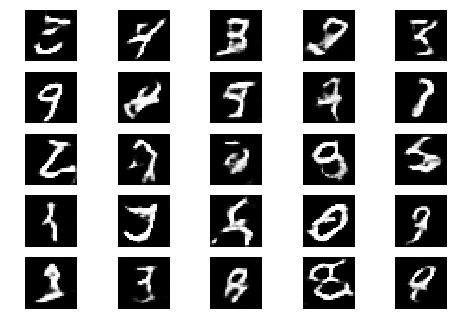

Epoch 2 Batch 501/937 [D loss: 0.211676, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 502/937 [D loss: 0.000118, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 503/937 [D loss: 0.082240, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 504/937 [D loss: 0.637018, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 505/937 [D loss: 0.010602, acc.: 100.00%] [G loss: 0.000000]


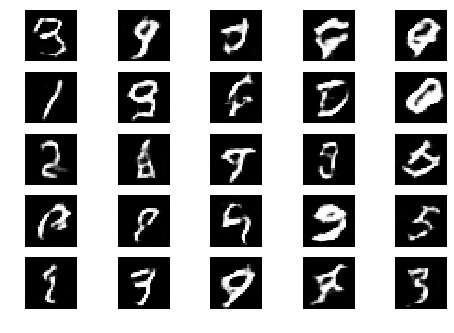

Epoch 2 Batch 506/937 [D loss: 0.001262, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 507/937 [D loss: 0.016427, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 508/937 [D loss: 0.000898, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 509/937 [D loss: 0.000512, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 510/937 [D loss: 0.003035, acc.: 100.00%] [G loss: 0.000000]


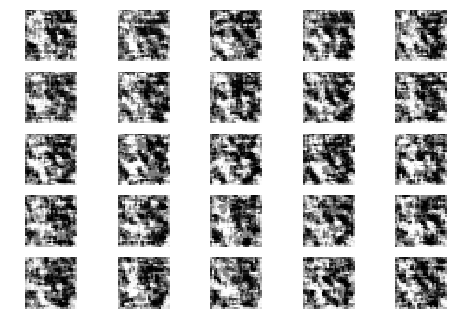

Epoch 2 Batch 511/937 [D loss: 0.256571, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 512/937 [D loss: 0.019236, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 513/937 [D loss: 0.000843, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 514/937 [D loss: 0.040435, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 515/937 [D loss: 0.128942, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 516/937 [D loss: 0.000460, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 517/937 [D loss: 0.016207, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 518/937 [D loss: 0.003594, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 519/937 [D loss: 0.250346, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 520/937 [D loss: 0.014790, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 521/937 [D loss: 0.164155, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 522/937 [D loss: 0.020159, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 523/937 [D loss: 0.031317, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 524/937 [D loss

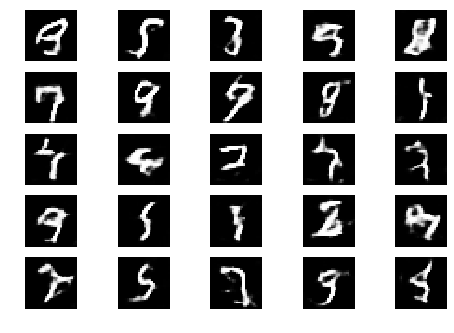

Epoch 2 Batch 601/937 [D loss: 0.003325, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 602/937 [D loss: 0.012570, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 603/937 [D loss: 0.153871, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 604/937 [D loss: 0.642723, acc.: 71.88%] [G loss: 0.000000]
Epoch 2 Batch 605/937 [D loss: 0.049394, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 606/937 [D loss: 0.020999, acc.: 100.00%] [G loss: 0.000000]


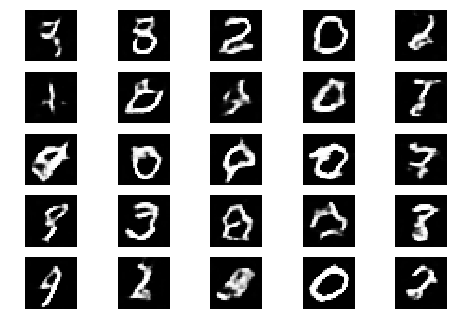

Epoch 2 Batch 607/937 [D loss: 0.360973, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 608/937 [D loss: 0.252900, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 609/937 [D loss: 0.046070, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 610/937 [D loss: 0.016369, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 611/937 [D loss: 0.007943, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 612/937 [D loss: 0.026437, acc.: 100.00%] [G loss: 0.000000]


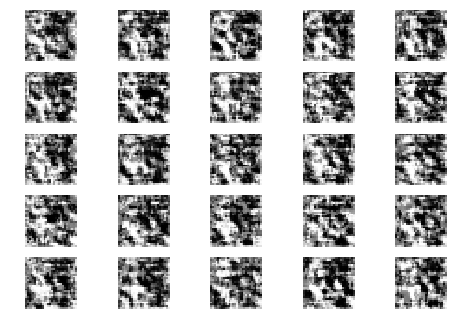

Epoch 2 Batch 613/937 [D loss: 0.002870, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 614/937 [D loss: 0.001612, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 615/937 [D loss: 0.004054, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 616/937 [D loss: 0.072576, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 617/937 [D loss: 0.047880, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 618/937 [D loss: 0.429459, acc.: 81.25%] [G loss: 0.000001]
Epoch 2 Batch 619/937 [D loss: 0.008796, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 620/937 [D loss: 0.389112, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 621/937 [D loss: 0.008305, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 622/937 [D loss: 0.001345, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 623/937 [D loss: 0.018498, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 624/937 [D loss: 0.001293, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 625/937 [D loss: 0.311463, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 626/937 [D los

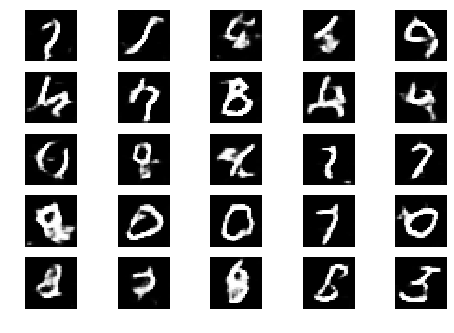

Epoch 2 Batch 701/937 [D loss: 0.002911, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 702/937 [D loss: 0.249996, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 703/937 [D loss: 0.006231, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 704/937 [D loss: 0.173363, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 705/937 [D loss: 0.006376, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 706/937 [D loss: 0.052315, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 707/937 [D loss: 0.018432, acc.: 100.00%] [G loss: 0.000000]


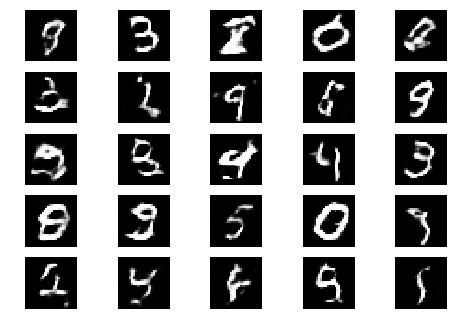

Epoch 2 Batch 708/937 [D loss: 0.002107, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 709/937 [D loss: 0.016197, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 710/937 [D loss: 0.095874, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 711/937 [D loss: 0.053360, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 712/937 [D loss: 0.119530, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 713/937 [D loss: 0.008628, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 714/937 [D loss: 0.002449, acc.: 100.00%] [G loss: 0.000000]


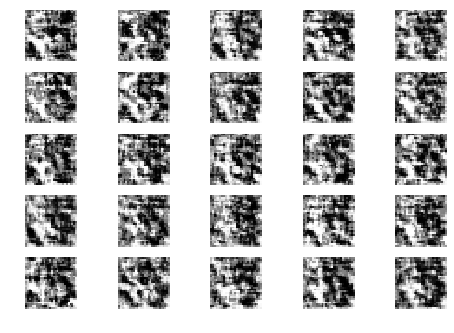

Epoch 2 Batch 715/937 [D loss: 0.204751, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 716/937 [D loss: 0.066162, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 717/937 [D loss: 0.037406, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 718/937 [D loss: 0.203615, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 719/937 [D loss: 0.144616, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 720/937 [D loss: 0.210803, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 721/937 [D loss: 0.324318, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 722/937 [D loss: 0.002954, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 723/937 [D loss: 0.015599, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 724/937 [D loss: 0.301403, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 725/937 [D loss: 0.093178, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 726/937 [D loss: 0.138387, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 727/937 [D loss: 0.017588, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 728/937 [D loss: 0.

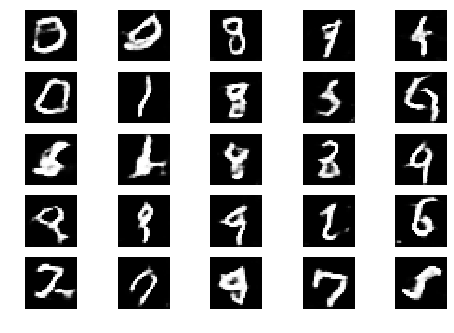

Epoch 2 Batch 801/937 [D loss: 0.733097, acc.: 62.50%] [G loss: 0.000000]
Epoch 2 Batch 802/937 [D loss: 0.021568, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 803/937 [D loss: 0.000040, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 804/937 [D loss: 0.001487, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 805/937 [D loss: 0.144301, acc.: 93.75%] [G loss: 0.000000]
Epoch 2 Batch 806/937 [D loss: 0.019270, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 807/937 [D loss: 0.002164, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 808/937 [D loss: 0.067217, acc.: 100.00%] [G loss: 0.000000]


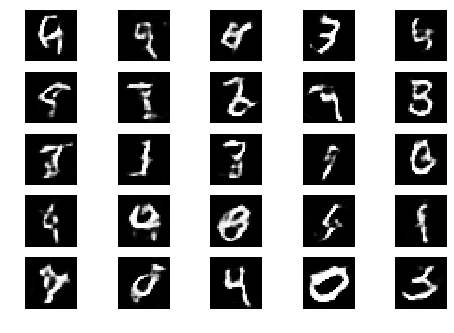

Epoch 2 Batch 809/937 [D loss: 0.000800, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 810/937 [D loss: 0.049602, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 811/937 [D loss: 0.329645, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 812/937 [D loss: 0.001483, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 813/937 [D loss: 0.049456, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 814/937 [D loss: 0.022254, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 815/937 [D loss: 0.018640, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 816/937 [D loss: 0.029567, acc.: 100.00%] [G loss: 0.000000]


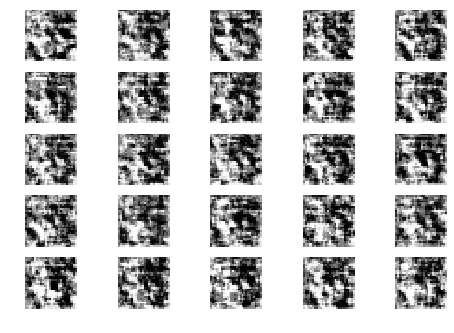

Epoch 2 Batch 817/937 [D loss: 0.036139, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 818/937 [D loss: 0.371546, acc.: 84.38%] [G loss: 0.000000]
Epoch 2 Batch 819/937 [D loss: 0.349774, acc.: 78.12%] [G loss: 0.000000]
Epoch 2 Batch 820/937 [D loss: 0.160733, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 821/937 [D loss: 0.007509, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 822/937 [D loss: 0.001592, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 823/937 [D loss: 0.001120, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 824/937 [D loss: 0.174867, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 825/937 [D loss: 0.009051, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 826/937 [D loss: 0.001048, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 827/937 [D loss: 0.149758, acc.: 96.88%] [G loss: 0.000000]
Epoch 2 Batch 828/937 [D loss: 0.062500, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 829/937 [D loss: 0.012605, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 830/937 [D loss:

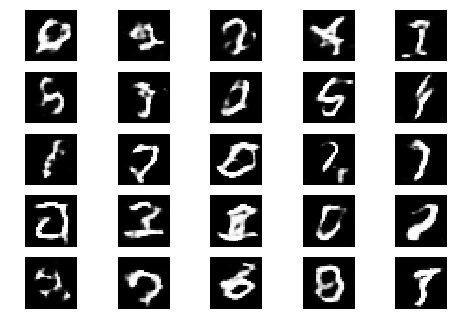

Epoch 2 Batch 901/937 [D loss: 0.015353, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 902/937 [D loss: 1.703911, acc.: 50.00%] [G loss: 0.000000]
Epoch 2 Batch 903/937 [D loss: 0.012675, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 904/937 [D loss: 0.183825, acc.: 90.62%] [G loss: 0.000000]
Epoch 2 Batch 905/937 [D loss: 0.031233, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 906/937 [D loss: 0.000203, acc.: 100.00%] [G loss: 0.000004]
Epoch 2 Batch 907/937 [D loss: 0.003847, acc.: 100.00%] [G loss: 0.000001]
Epoch 2 Batch 908/937 [D loss: 0.002740, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 909/937 [D loss: 0.001299, acc.: 100.00%] [G loss: 0.000000]


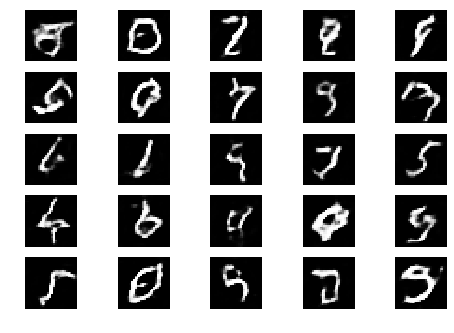

Epoch 2 Batch 910/937 [D loss: 0.002169, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 911/937 [D loss: 0.032981, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 912/937 [D loss: 0.526933, acc.: 68.75%] [G loss: 0.000001]
Epoch 2 Batch 913/937 [D loss: 0.003910, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 914/937 [D loss: 0.420792, acc.: 68.75%] [G loss: 0.000000]
Epoch 2 Batch 915/937 [D loss: 0.059918, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 916/937 [D loss: 0.351834, acc.: 81.25%] [G loss: 0.000000]
Epoch 2 Batch 917/937 [D loss: 0.002148, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 918/937 [D loss: 0.713732, acc.: 65.62%] [G loss: 0.000000]


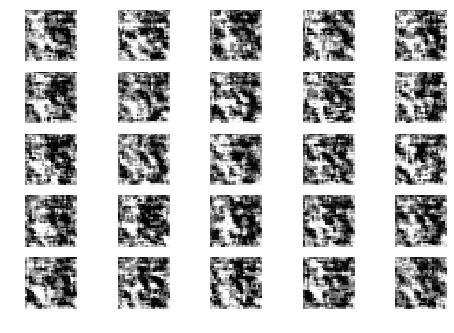

Epoch 2 Batch 919/937 [D loss: 1.271104, acc.: 53.12%] [G loss: 0.000000]
Epoch 2 Batch 920/937 [D loss: 0.009388, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 921/937 [D loss: 0.013341, acc.: 100.00%] [G loss: 0.000005]
Epoch 2 Batch 922/937 [D loss: 0.007951, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 923/937 [D loss: 0.001935, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 924/937 [D loss: 0.010269, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 925/937 [D loss: 0.006256, acc.: 100.00%] [G loss: 0.000003]
Epoch 2 Batch 926/937 [D loss: 0.006555, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 927/937 [D loss: 0.006597, acc.: 100.00%] [G loss: 0.000002]
Epoch 2 Batch 928/937 [D loss: 0.389254, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 929/937 [D loss: 0.422591, acc.: 75.00%] [G loss: 0.000000]
Epoch 2 Batch 930/937 [D loss: 0.097462, acc.: 100.00%] [G loss: 0.000000]
Epoch 2 Batch 931/937 [D loss: 0.236342, acc.: 87.50%] [G loss: 0.000000]
Epoch 2 Batch 932/937 [D loss

In [41]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=2)

In [43]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 3 ,  loadpretrainedweights=True)


-- Discriminator -- 
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_87 (Conv2D)           (None, 14, 14, 32)        320       
_________________________________________________________________
leaky_re_lu_33 (LeakyReLU)   (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 7, 7, 64)          18496     
_________________________________________________________________
zero_padding2d_9 (ZeroPaddin (None, 8, 8, 64)          0         
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 8, 8, 64)          

Number of examples:  30000.0
Number of Batches:  937
Number of epochs:  2
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 28, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/937 [D loss: 0.853567, acc.: 46.88%] [G loss: 0.362638]


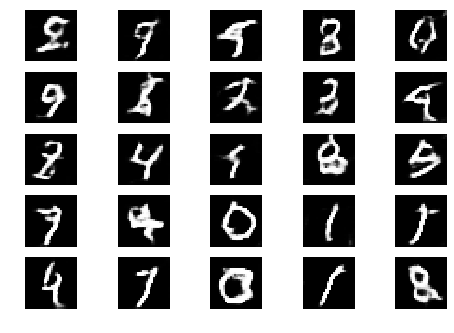

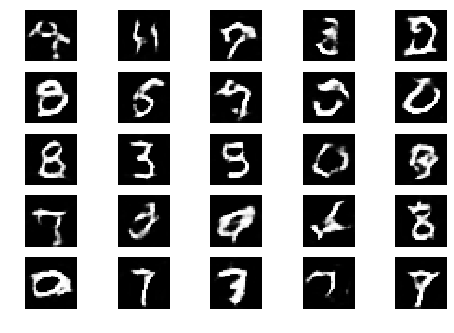

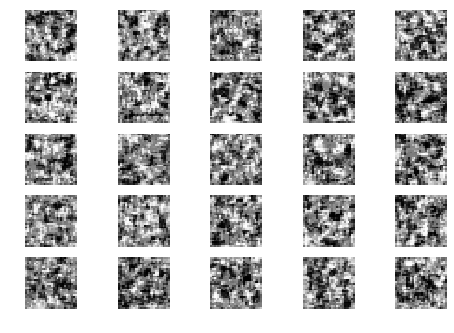

Epoch 0 Batch 1/937 [D loss: 0.772092, acc.: 56.25%] [G loss: 0.666439]
Epoch 0 Batch 2/937 [D loss: 0.566477, acc.: 62.50%] [G loss: 0.751613]
Epoch 0 Batch 3/937 [D loss: 0.569288, acc.: 71.88%] [G loss: 0.927672]
Epoch 0 Batch 4/937 [D loss: 0.376140, acc.: 81.25%] [G loss: 1.175600]
Epoch 0 Batch 5/937 [D loss: 0.491268, acc.: 78.12%] [G loss: 1.003709]
Epoch 0 Batch 6/937 [D loss: 0.284104, acc.: 93.75%] [G loss: 1.349136]
Epoch 0 Batch 7/937 [D loss: 0.341286, acc.: 90.62%] [G loss: 1.539799]
Epoch 0 Batch 8/937 [D loss: 0.366947, acc.: 84.38%] [G loss: 1.392815]
Epoch 0 Batch 9/937 [D loss: 0.291518, acc.: 93.75%] [G loss: 1.484884]
Epoch 0 Batch 10/937 [D loss: 0.399763, acc.: 81.25%] [G loss: 1.365540]
Epoch 0 Batch 11/937 [D loss: 0.284469, acc.: 100.00%] [G loss: 1.424732]
Epoch 0 Batch 12/937 [D loss: 0.440933, acc.: 75.00%] [G loss: 1.732619]
Epoch 0 Batch 13/937 [D loss: 0.286046, acc.: 96.88%] [G loss: 1.824622]
Epoch 0 Batch 14/937 [D loss: 0.197749, acc.: 96.88%] [G lo

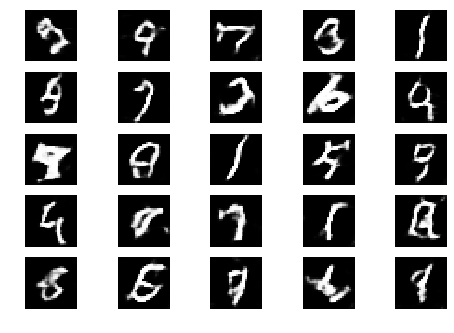

Epoch 0 Batch 101/937 [D loss: 0.393128, acc.: 78.12%] [G loss: 3.022180]


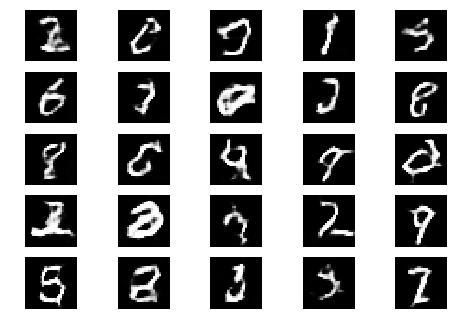

Epoch 0 Batch 102/937 [D loss: 0.333233, acc.: 87.50%] [G loss: 2.607483]


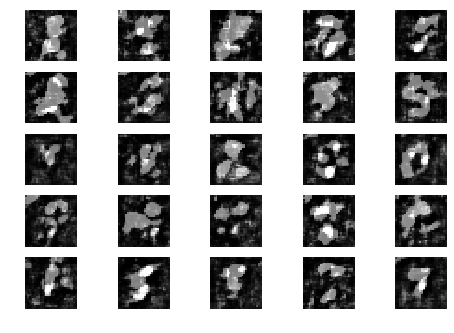

Epoch 0 Batch 103/937 [D loss: 0.473947, acc.: 75.00%] [G loss: 3.352985]
Epoch 0 Batch 104/937 [D loss: 0.276412, acc.: 90.62%] [G loss: 2.968996]
Epoch 0 Batch 105/937 [D loss: 0.694509, acc.: 56.25%] [G loss: 3.353695]
Epoch 0 Batch 106/937 [D loss: 0.323621, acc.: 87.50%] [G loss: 4.750237]
Epoch 0 Batch 107/937 [D loss: 0.641373, acc.: 78.12%] [G loss: 2.024354]
Epoch 0 Batch 108/937 [D loss: 0.328758, acc.: 87.50%] [G loss: 3.511693]
Epoch 0 Batch 109/937 [D loss: 0.257803, acc.: 90.62%] [G loss: 2.996171]
Epoch 0 Batch 110/937 [D loss: 0.923991, acc.: 50.00%] [G loss: 4.888375]
Epoch 0 Batch 111/937 [D loss: 0.443777, acc.: 84.38%] [G loss: 3.063087]
Epoch 0 Batch 112/937 [D loss: 0.352286, acc.: 87.50%] [G loss: 2.945454]
Epoch 0 Batch 113/937 [D loss: 0.390004, acc.: 71.88%] [G loss: 2.847213]
Epoch 0 Batch 114/937 [D loss: 0.168320, acc.: 100.00%] [G loss: 2.973771]
Epoch 0 Batch 115/937 [D loss: 0.378616, acc.: 81.25%] [G loss: 2.567851]
Epoch 0 Batch 116/937 [D loss: 0.3019

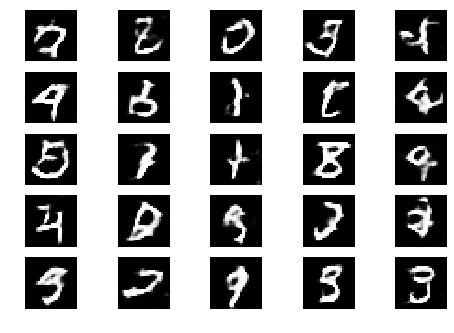

Epoch 0 Batch 201/937 [D loss: 0.755530, acc.: 62.50%] [G loss: 3.336841]
Epoch 0 Batch 202/937 [D loss: 0.948013, acc.: 56.25%] [G loss: 2.094341]


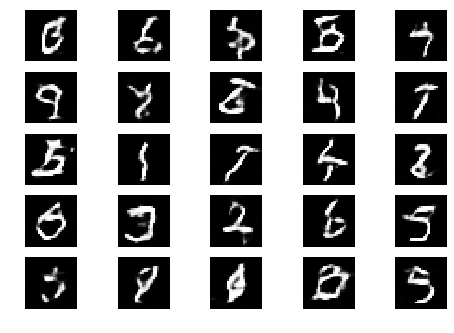

Epoch 0 Batch 203/937 [D loss: 0.772406, acc.: 59.38%] [G loss: 3.076865]
Epoch 0 Batch 204/937 [D loss: 0.645507, acc.: 59.38%] [G loss: 2.425471]


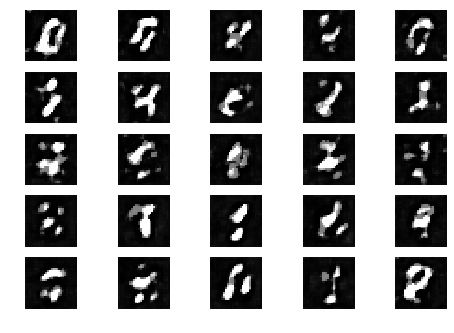

Epoch 0 Batch 205/937 [D loss: 0.472535, acc.: 84.38%] [G loss: 3.128786]
Epoch 0 Batch 206/937 [D loss: 0.858381, acc.: 53.12%] [G loss: 2.442334]
Epoch 0 Batch 207/937 [D loss: 0.530630, acc.: 71.88%] [G loss: 2.592144]
Epoch 0 Batch 208/937 [D loss: 0.331186, acc.: 87.50%] [G loss: 2.349319]
Epoch 0 Batch 209/937 [D loss: 0.483916, acc.: 75.00%] [G loss: 2.454062]
Epoch 0 Batch 210/937 [D loss: 0.754413, acc.: 53.12%] [G loss: 2.011128]
Epoch 0 Batch 211/937 [D loss: 0.561490, acc.: 75.00%] [G loss: 1.897390]
Epoch 0 Batch 212/937 [D loss: 0.610622, acc.: 68.75%] [G loss: 2.739788]
Epoch 0 Batch 213/937 [D loss: 0.472975, acc.: 78.12%] [G loss: 2.820243]
Epoch 0 Batch 214/937 [D loss: 0.963826, acc.: 40.62%] [G loss: 2.645597]
Epoch 0 Batch 215/937 [D loss: 0.449380, acc.: 78.12%] [G loss: 2.420053]
Epoch 0 Batch 216/937 [D loss: 0.370554, acc.: 81.25%] [G loss: 2.342643]
Epoch 0 Batch 217/937 [D loss: 0.279436, acc.: 90.62%] [G loss: 2.622653]
Epoch 0 Batch 218/937 [D loss: 0.63377

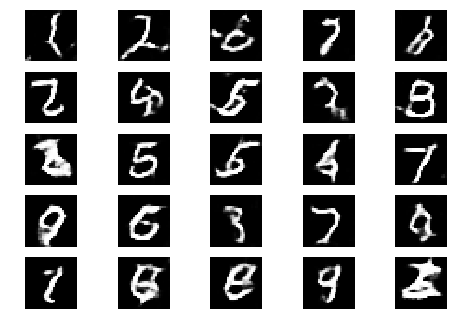

Epoch 0 Batch 301/937 [D loss: 0.844588, acc.: 53.12%] [G loss: 1.306883]
Epoch 0 Batch 302/937 [D loss: 0.951450, acc.: 43.75%] [G loss: 2.280949]
Epoch 0 Batch 303/937 [D loss: 0.744740, acc.: 62.50%] [G loss: 1.704727]


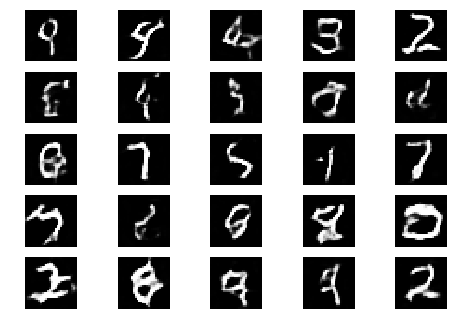

Epoch 0 Batch 304/937 [D loss: 0.711870, acc.: 62.50%] [G loss: 2.081131]
Epoch 0 Batch 305/937 [D loss: 0.528377, acc.: 71.88%] [G loss: 1.806240]
Epoch 0 Batch 306/937 [D loss: 0.659017, acc.: 65.62%] [G loss: 1.648390]


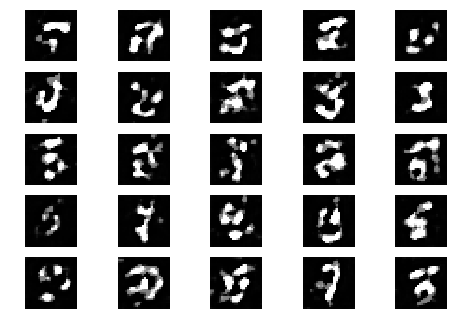

Epoch 0 Batch 307/937 [D loss: 0.436514, acc.: 81.25%] [G loss: 1.899569]
Epoch 0 Batch 308/937 [D loss: 0.665604, acc.: 62.50%] [G loss: 1.737213]
Epoch 0 Batch 309/937 [D loss: 0.412912, acc.: 84.38%] [G loss: 2.382999]
Epoch 0 Batch 310/937 [D loss: 0.567027, acc.: 71.88%] [G loss: 2.297290]
Epoch 0 Batch 311/937 [D loss: 0.812153, acc.: 62.50%] [G loss: 1.429997]
Epoch 0 Batch 312/937 [D loss: 0.409778, acc.: 78.12%] [G loss: 2.348565]
Epoch 0 Batch 313/937 [D loss: 1.135645, acc.: 43.75%] [G loss: 1.128203]
Epoch 0 Batch 314/937 [D loss: 0.587044, acc.: 59.38%] [G loss: 1.892693]
Epoch 0 Batch 315/937 [D loss: 0.701021, acc.: 65.62%] [G loss: 1.859846]
Epoch 0 Batch 316/937 [D loss: 0.702945, acc.: 59.38%] [G loss: 1.630836]
Epoch 0 Batch 317/937 [D loss: 0.979734, acc.: 37.50%] [G loss: 1.361022]
Epoch 0 Batch 318/937 [D loss: 0.381988, acc.: 84.38%] [G loss: 1.754936]
Epoch 0 Batch 319/937 [D loss: 0.856749, acc.: 53.12%] [G loss: 1.506071]
Epoch 0 Batch 320/937 [D loss: 0.49805

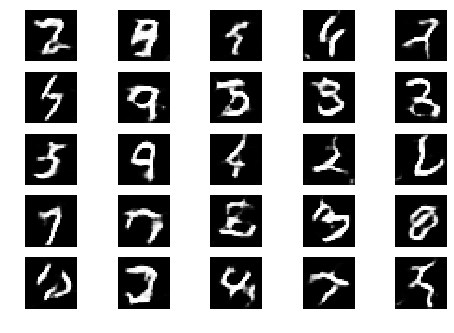

Epoch 0 Batch 401/937 [D loss: 0.417087, acc.: 81.25%] [G loss: 1.639170]
Epoch 0 Batch 402/937 [D loss: 0.727175, acc.: 62.50%] [G loss: 1.465600]
Epoch 0 Batch 403/937 [D loss: 0.290068, acc.: 87.50%] [G loss: 1.767971]
Epoch 0 Batch 404/937 [D loss: 0.938412, acc.: 40.62%] [G loss: 1.921358]


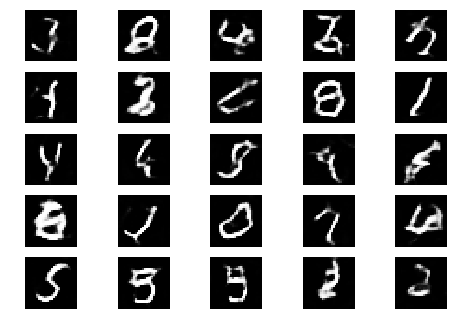

Epoch 0 Batch 405/937 [D loss: 0.519352, acc.: 81.25%] [G loss: 1.895124]
Epoch 0 Batch 406/937 [D loss: 0.623368, acc.: 59.38%] [G loss: 1.586911]
Epoch 0 Batch 407/937 [D loss: 0.657284, acc.: 71.88%] [G loss: 1.630970]
Epoch 0 Batch 408/937 [D loss: 0.587544, acc.: 68.75%] [G loss: 1.750880]


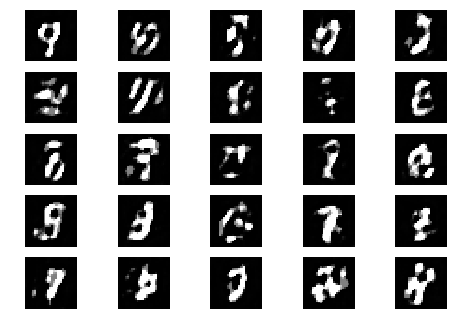

Epoch 0 Batch 409/937 [D loss: 0.534721, acc.: 71.88%] [G loss: 1.668328]
Epoch 0 Batch 410/937 [D loss: 0.612923, acc.: 75.00%] [G loss: 1.489755]
Epoch 0 Batch 411/937 [D loss: 0.589501, acc.: 75.00%] [G loss: 1.772468]
Epoch 0 Batch 412/937 [D loss: 0.916237, acc.: 56.25%] [G loss: 1.301024]
Epoch 0 Batch 413/937 [D loss: 0.874508, acc.: 46.88%] [G loss: 1.586452]
Epoch 0 Batch 414/937 [D loss: 0.321116, acc.: 87.50%] [G loss: 2.170317]
Epoch 0 Batch 415/937 [D loss: 0.762241, acc.: 53.12%] [G loss: 1.861878]
Epoch 0 Batch 416/937 [D loss: 0.429639, acc.: 78.12%] [G loss: 2.613665]
Epoch 0 Batch 417/937 [D loss: 1.236317, acc.: 31.25%] [G loss: 2.091899]
Epoch 0 Batch 418/937 [D loss: 1.297236, acc.: 34.38%] [G loss: 1.383992]
Epoch 0 Batch 419/937 [D loss: 0.423260, acc.: 78.12%] [G loss: 2.181602]
Epoch 0 Batch 420/937 [D loss: 0.471614, acc.: 75.00%] [G loss: 2.225605]
Epoch 0 Batch 421/937 [D loss: 0.702484, acc.: 56.25%] [G loss: 1.224987]
Epoch 0 Batch 422/937 [D loss: 1.04715

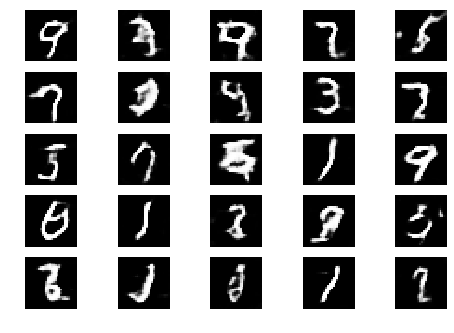

Epoch 0 Batch 501/937 [D loss: 0.491770, acc.: 71.88%] [G loss: 1.142655]
Epoch 0 Batch 502/937 [D loss: 0.767465, acc.: 59.38%] [G loss: 2.167009]
Epoch 0 Batch 503/937 [D loss: 0.432203, acc.: 81.25%] [G loss: 1.891830]
Epoch 0 Batch 504/937 [D loss: 0.601206, acc.: 65.62%] [G loss: 1.696038]
Epoch 0 Batch 505/937 [D loss: 0.994334, acc.: 46.88%] [G loss: 1.502386]


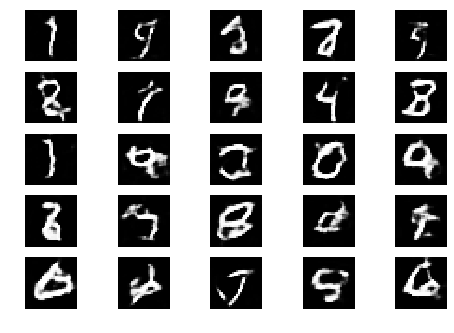

Epoch 0 Batch 506/937 [D loss: 0.473839, acc.: 75.00%] [G loss: 2.204270]
Epoch 0 Batch 507/937 [D loss: 0.885468, acc.: 50.00%] [G loss: 2.170424]
Epoch 0 Batch 508/937 [D loss: 0.535906, acc.: 68.75%] [G loss: 1.725788]
Epoch 0 Batch 509/937 [D loss: 0.845788, acc.: 46.88%] [G loss: 1.329790]
Epoch 0 Batch 510/937 [D loss: 0.435827, acc.: 81.25%] [G loss: 1.766274]


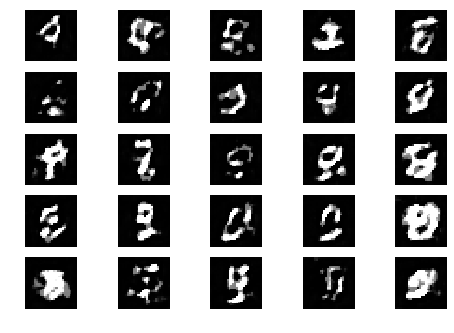

Epoch 0 Batch 511/937 [D loss: 0.471975, acc.: 75.00%] [G loss: 1.929873]
Epoch 0 Batch 512/937 [D loss: 0.594244, acc.: 65.62%] [G loss: 1.980843]
Epoch 0 Batch 513/937 [D loss: 0.648243, acc.: 65.62%] [G loss: 1.787536]
Epoch 0 Batch 514/937 [D loss: 1.128330, acc.: 34.38%] [G loss: 1.780549]
Epoch 0 Batch 515/937 [D loss: 0.598050, acc.: 65.62%] [G loss: 1.852631]
Epoch 0 Batch 516/937 [D loss: 0.544274, acc.: 75.00%] [G loss: 1.522754]
Epoch 0 Batch 517/937 [D loss: 0.785279, acc.: 59.38%] [G loss: 1.565295]
Epoch 0 Batch 518/937 [D loss: 0.478755, acc.: 71.88%] [G loss: 1.515407]
Epoch 0 Batch 519/937 [D loss: 0.793009, acc.: 56.25%] [G loss: 2.114517]
Epoch 0 Batch 520/937 [D loss: 0.522266, acc.: 75.00%] [G loss: 1.752020]
Epoch 0 Batch 521/937 [D loss: 0.478389, acc.: 78.12%] [G loss: 2.224700]
Epoch 0 Batch 522/937 [D loss: 0.525859, acc.: 68.75%] [G loss: 1.485398]
Epoch 0 Batch 523/937 [D loss: 0.688183, acc.: 65.62%] [G loss: 1.437147]
Epoch 0 Batch 524/937 [D loss: 0.88793

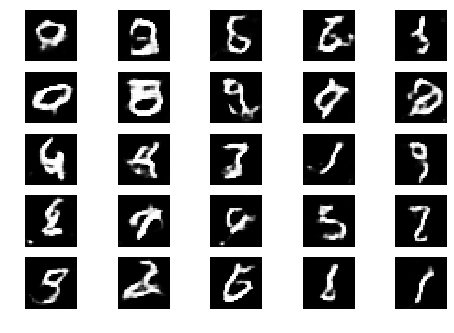

Epoch 0 Batch 601/937 [D loss: 0.702466, acc.: 59.38%] [G loss: 1.460308]
Epoch 0 Batch 602/937 [D loss: 0.682877, acc.: 50.00%] [G loss: 1.504814]
Epoch 0 Batch 603/937 [D loss: 0.597969, acc.: 62.50%] [G loss: 1.827363]
Epoch 0 Batch 604/937 [D loss: 0.530597, acc.: 71.88%] [G loss: 1.608694]
Epoch 0 Batch 605/937 [D loss: 0.745164, acc.: 50.00%] [G loss: 1.940425]
Epoch 0 Batch 606/937 [D loss: 0.683502, acc.: 62.50%] [G loss: 2.334534]


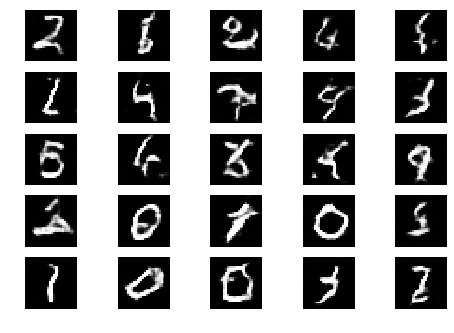

Epoch 0 Batch 607/937 [D loss: 0.593449, acc.: 68.75%] [G loss: 1.820505]
Epoch 0 Batch 608/937 [D loss: 0.355382, acc.: 84.38%] [G loss: 1.850460]
Epoch 0 Batch 609/937 [D loss: 0.478459, acc.: 81.25%] [G loss: 1.819171]
Epoch 0 Batch 610/937 [D loss: 0.491205, acc.: 71.88%] [G loss: 1.461476]
Epoch 0 Batch 611/937 [D loss: 0.602961, acc.: 68.75%] [G loss: 1.532606]
Epoch 0 Batch 612/937 [D loss: 0.691555, acc.: 68.75%] [G loss: 1.877218]


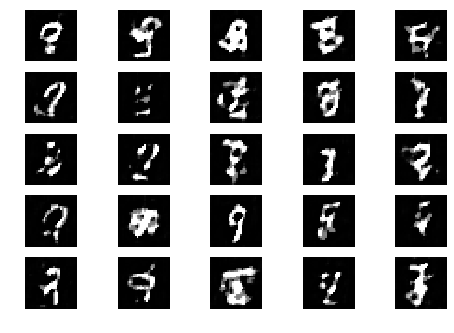

Epoch 0 Batch 613/937 [D loss: 0.532676, acc.: 71.88%] [G loss: 1.884203]
Epoch 0 Batch 614/937 [D loss: 0.536468, acc.: 78.12%] [G loss: 1.437877]
Epoch 0 Batch 615/937 [D loss: 0.756875, acc.: 59.38%] [G loss: 1.468728]
Epoch 0 Batch 616/937 [D loss: 0.596701, acc.: 78.12%] [G loss: 1.446238]
Epoch 0 Batch 617/937 [D loss: 0.476084, acc.: 75.00%] [G loss: 1.603403]
Epoch 0 Batch 618/937 [D loss: 0.588684, acc.: 65.62%] [G loss: 1.639905]
Epoch 0 Batch 619/937 [D loss: 0.558240, acc.: 65.62%] [G loss: 1.983528]
Epoch 0 Batch 620/937 [D loss: 0.660402, acc.: 68.75%] [G loss: 2.767152]
Epoch 0 Batch 621/937 [D loss: 1.008173, acc.: 40.62%] [G loss: 1.671873]
Epoch 0 Batch 622/937 [D loss: 0.757332, acc.: 59.38%] [G loss: 1.628342]
Epoch 0 Batch 623/937 [D loss: 0.518563, acc.: 71.88%] [G loss: 2.200317]
Epoch 0 Batch 624/937 [D loss: 0.739441, acc.: 53.12%] [G loss: 2.062150]
Epoch 0 Batch 625/937 [D loss: 0.443246, acc.: 75.00%] [G loss: 1.806328]
Epoch 0 Batch 626/937 [D loss: 0.69510

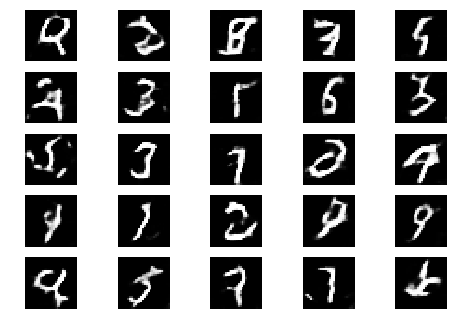

Epoch 0 Batch 701/937 [D loss: 0.703173, acc.: 68.75%] [G loss: 1.398821]
Epoch 0 Batch 702/937 [D loss: 0.785566, acc.: 56.25%] [G loss: 1.639555]
Epoch 0 Batch 703/937 [D loss: 0.334807, acc.: 87.50%] [G loss: 1.892247]
Epoch 0 Batch 704/937 [D loss: 0.778272, acc.: 50.00%] [G loss: 1.879964]
Epoch 0 Batch 705/937 [D loss: 0.521516, acc.: 65.62%] [G loss: 2.104282]
Epoch 0 Batch 706/937 [D loss: 0.858064, acc.: 53.12%] [G loss: 1.722213]
Epoch 0 Batch 707/937 [D loss: 0.960954, acc.: 43.75%] [G loss: 1.169001]


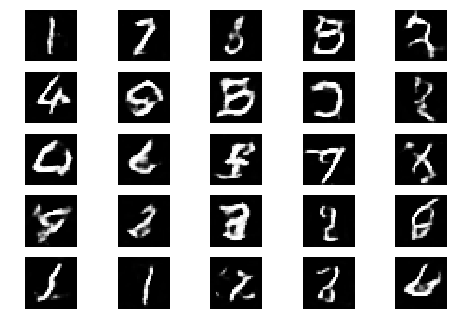

Epoch 0 Batch 708/937 [D loss: 0.245391, acc.: 93.75%] [G loss: 1.738608]
Epoch 0 Batch 709/937 [D loss: 0.393157, acc.: 87.50%] [G loss: 1.691112]
Epoch 0 Batch 710/937 [D loss: 0.482904, acc.: 78.12%] [G loss: 2.198136]
Epoch 0 Batch 711/937 [D loss: 0.679450, acc.: 62.50%] [G loss: 1.546627]
Epoch 0 Batch 712/937 [D loss: 0.467824, acc.: 81.25%] [G loss: 1.806661]
Epoch 0 Batch 713/937 [D loss: 0.760310, acc.: 62.50%] [G loss: 1.715302]
Epoch 0 Batch 714/937 [D loss: 0.444114, acc.: 84.38%] [G loss: 1.869088]


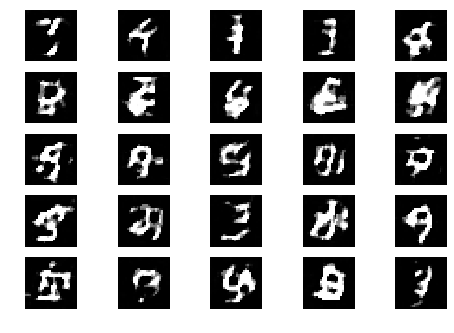

Epoch 0 Batch 715/937 [D loss: 0.649636, acc.: 65.62%] [G loss: 1.938724]
Epoch 0 Batch 716/937 [D loss: 0.646278, acc.: 65.62%] [G loss: 1.340121]
Epoch 0 Batch 717/937 [D loss: 0.589736, acc.: 71.88%] [G loss: 1.340015]
Epoch 0 Batch 718/937 [D loss: 0.703807, acc.: 65.62%] [G loss: 1.504869]
Epoch 0 Batch 719/937 [D loss: 0.665855, acc.: 53.12%] [G loss: 2.466027]
Epoch 0 Batch 720/937 [D loss: 0.790731, acc.: 56.25%] [G loss: 1.749231]
Epoch 0 Batch 721/937 [D loss: 0.500845, acc.: 75.00%] [G loss: 1.199725]
Epoch 0 Batch 722/937 [D loss: 0.571996, acc.: 71.88%] [G loss: 1.662500]
Epoch 0 Batch 723/937 [D loss: 0.782119, acc.: 43.75%] [G loss: 1.609902]
Epoch 0 Batch 724/937 [D loss: 0.723636, acc.: 62.50%] [G loss: 1.498509]
Epoch 0 Batch 725/937 [D loss: 0.721787, acc.: 59.38%] [G loss: 1.175099]
Epoch 0 Batch 726/937 [D loss: 0.412853, acc.: 78.12%] [G loss: 2.265287]
Epoch 0 Batch 727/937 [D loss: 0.428594, acc.: 84.38%] [G loss: 1.289411]
Epoch 0 Batch 728/937 [D loss: 0.49502

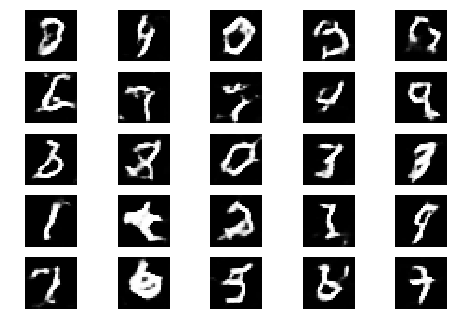

Epoch 0 Batch 801/937 [D loss: 0.743112, acc.: 53.12%] [G loss: 1.175642]
Epoch 0 Batch 802/937 [D loss: 0.420465, acc.: 75.00%] [G loss: 1.030610]
Epoch 0 Batch 803/937 [D loss: 0.667915, acc.: 56.25%] [G loss: 1.087801]
Epoch 0 Batch 804/937 [D loss: 0.851840, acc.: 53.12%] [G loss: 1.163682]
Epoch 0 Batch 805/937 [D loss: 0.606476, acc.: 62.50%] [G loss: 1.683559]
Epoch 0 Batch 806/937 [D loss: 0.660146, acc.: 65.62%] [G loss: 1.856476]
Epoch 0 Batch 807/937 [D loss: 0.429218, acc.: 81.25%] [G loss: 1.332948]
Epoch 0 Batch 808/937 [D loss: 0.486405, acc.: 78.12%] [G loss: 0.797881]


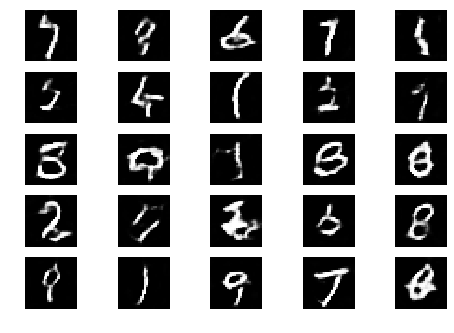

Epoch 0 Batch 809/937 [D loss: 0.726973, acc.: 59.38%] [G loss: 1.960589]
Epoch 0 Batch 810/937 [D loss: 0.431926, acc.: 78.12%] [G loss: 1.546984]
Epoch 0 Batch 811/937 [D loss: 0.869967, acc.: 40.62%] [G loss: 1.674997]
Epoch 0 Batch 812/937 [D loss: 0.668075, acc.: 59.38%] [G loss: 1.659614]
Epoch 0 Batch 813/937 [D loss: 0.465989, acc.: 75.00%] [G loss: 1.642802]
Epoch 0 Batch 814/937 [D loss: 0.669541, acc.: 65.62%] [G loss: 1.261654]
Epoch 0 Batch 815/937 [D loss: 0.757443, acc.: 59.38%] [G loss: 1.215268]
Epoch 0 Batch 816/937 [D loss: 0.417380, acc.: 81.25%] [G loss: 1.440841]


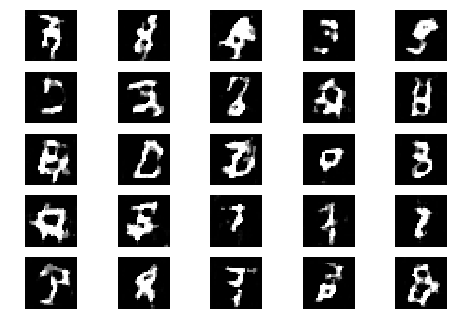

Epoch 0 Batch 817/937 [D loss: 0.731185, acc.: 56.25%] [G loss: 1.534754]
Epoch 0 Batch 818/937 [D loss: 0.529393, acc.: 75.00%] [G loss: 1.741585]
Epoch 0 Batch 819/937 [D loss: 0.598741, acc.: 62.50%] [G loss: 1.867796]
Epoch 0 Batch 820/937 [D loss: 0.880293, acc.: 59.38%] [G loss: 2.058012]
Epoch 0 Batch 821/937 [D loss: 0.866773, acc.: 53.12%] [G loss: 1.203946]
Epoch 0 Batch 822/937 [D loss: 0.648138, acc.: 68.75%] [G loss: 1.398583]
Epoch 0 Batch 823/937 [D loss: 0.880507, acc.: 43.75%] [G loss: 2.394281]
Epoch 0 Batch 824/937 [D loss: 0.674928, acc.: 53.12%] [G loss: 1.809470]
Epoch 0 Batch 825/937 [D loss: 0.518698, acc.: 71.88%] [G loss: 1.409452]
Epoch 0 Batch 826/937 [D loss: 0.672122, acc.: 53.12%] [G loss: 1.185106]
Epoch 0 Batch 827/937 [D loss: 1.044921, acc.: 40.62%] [G loss: 0.872500]
Epoch 0 Batch 828/937 [D loss: 0.574353, acc.: 65.62%] [G loss: 1.478935]
Epoch 0 Batch 829/937 [D loss: 0.658561, acc.: 62.50%] [G loss: 1.885039]
Epoch 0 Batch 830/937 [D loss: 0.49489

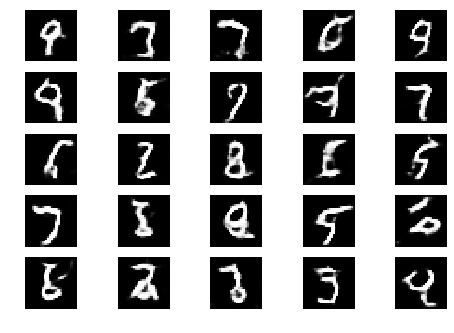

Epoch 0 Batch 901/937 [D loss: 0.660306, acc.: 65.62%] [G loss: 1.441368]
Epoch 0 Batch 902/937 [D loss: 0.458920, acc.: 71.88%] [G loss: 1.438859]
Epoch 0 Batch 903/937 [D loss: 0.812873, acc.: 46.88%] [G loss: 1.366033]
Epoch 0 Batch 904/937 [D loss: 0.754812, acc.: 50.00%] [G loss: 1.709086]
Epoch 0 Batch 905/937 [D loss: 0.401428, acc.: 78.12%] [G loss: 1.523557]
Epoch 0 Batch 906/937 [D loss: 0.725231, acc.: 65.62%] [G loss: 1.226568]
Epoch 0 Batch 907/937 [D loss: 0.401937, acc.: 81.25%] [G loss: 1.252724]
Epoch 0 Batch 908/937 [D loss: 0.502608, acc.: 71.88%] [G loss: 1.703652]
Epoch 0 Batch 909/937 [D loss: 0.522541, acc.: 75.00%] [G loss: 1.132644]


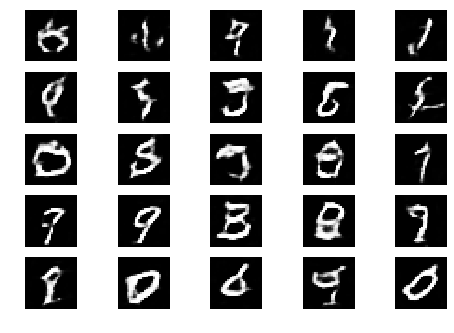

Epoch 0 Batch 910/937 [D loss: 0.677508, acc.: 71.88%] [G loss: 1.462487]
Epoch 0 Batch 911/937 [D loss: 0.770331, acc.: 53.12%] [G loss: 1.013188]
Epoch 0 Batch 912/937 [D loss: 0.812277, acc.: 46.88%] [G loss: 1.043712]
Epoch 0 Batch 913/937 [D loss: 0.501166, acc.: 78.12%] [G loss: 1.348879]
Epoch 0 Batch 914/937 [D loss: 0.421619, acc.: 75.00%] [G loss: 1.256417]
Epoch 0 Batch 915/937 [D loss: 0.459134, acc.: 75.00%] [G loss: 1.287875]
Epoch 0 Batch 916/937 [D loss: 0.356635, acc.: 84.38%] [G loss: 1.900451]
Epoch 0 Batch 917/937 [D loss: 0.601239, acc.: 68.75%] [G loss: 1.347273]
Epoch 0 Batch 918/937 [D loss: 0.535173, acc.: 75.00%] [G loss: 1.956175]


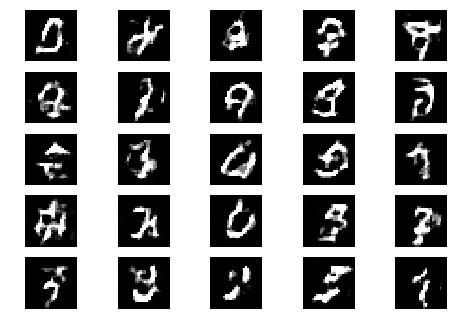

Epoch 0 Batch 919/937 [D loss: 0.769448, acc.: 43.75%] [G loss: 1.313211]
Epoch 0 Batch 920/937 [D loss: 0.501513, acc.: 75.00%] [G loss: 1.728944]
Epoch 0 Batch 921/937 [D loss: 0.432544, acc.: 87.50%] [G loss: 1.702173]
Epoch 0 Batch 922/937 [D loss: 0.563379, acc.: 71.88%] [G loss: 1.329116]
Epoch 0 Batch 923/937 [D loss: 0.737437, acc.: 53.12%] [G loss: 1.083590]
Epoch 0 Batch 924/937 [D loss: 0.591878, acc.: 75.00%] [G loss: 1.219477]
Epoch 0 Batch 925/937 [D loss: 0.802906, acc.: 53.12%] [G loss: 1.241404]
Epoch 0 Batch 926/937 [D loss: 0.627552, acc.: 62.50%] [G loss: 1.064672]
Epoch 0 Batch 927/937 [D loss: 0.665879, acc.: 65.62%] [G loss: 1.313625]
Epoch 0 Batch 928/937 [D loss: 0.688196, acc.: 59.38%] [G loss: 0.960921]
Epoch 0 Batch 929/937 [D loss: 0.761876, acc.: 50.00%] [G loss: 1.614633]
Epoch 0 Batch 930/937 [D loss: 0.554327, acc.: 75.00%] [G loss: 1.618508]
Epoch 0 Batch 931/937 [D loss: 0.626472, acc.: 65.62%] [G loss: 1.201527]
Epoch 0 Batch 932/937 [D loss: 0.72048

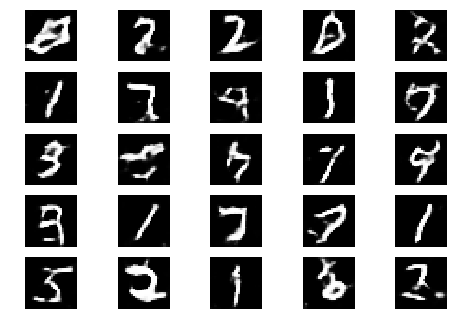

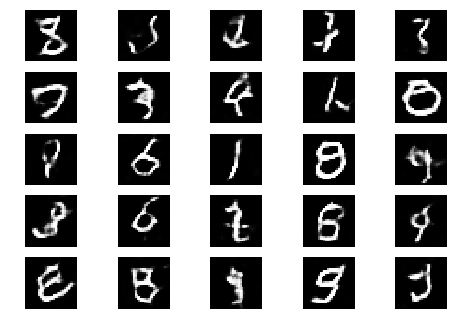

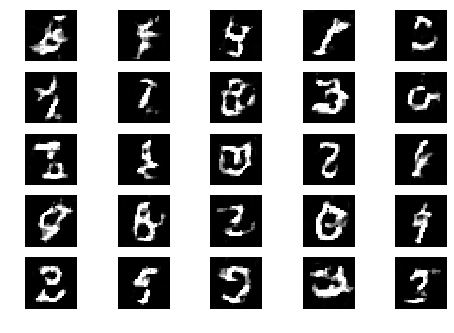

Epoch 1 Batch 1/937 [D loss: 1.099623, acc.: 28.12%] [G loss: 1.479689]
Epoch 1 Batch 2/937 [D loss: 0.739435, acc.: 59.38%] [G loss: 1.492066]
Epoch 1 Batch 3/937 [D loss: 0.700641, acc.: 56.25%] [G loss: 1.043984]
Epoch 1 Batch 4/937 [D loss: 0.611588, acc.: 59.38%] [G loss: 1.224346]
Epoch 1 Batch 5/937 [D loss: 0.932393, acc.: 43.75%] [G loss: 1.603295]
Epoch 1 Batch 6/937 [D loss: 0.687440, acc.: 59.38%] [G loss: 1.461462]
Epoch 1 Batch 7/937 [D loss: 0.627207, acc.: 68.75%] [G loss: 1.296869]
Epoch 1 Batch 8/937 [D loss: 0.478845, acc.: 78.12%] [G loss: 0.977906]
Epoch 1 Batch 9/937 [D loss: 0.619710, acc.: 68.75%] [G loss: 1.248723]
Epoch 1 Batch 10/937 [D loss: 0.846232, acc.: 43.75%] [G loss: 1.721153]
Epoch 1 Batch 11/937 [D loss: 0.476572, acc.: 78.12%] [G loss: 1.719367]
Epoch 1 Batch 12/937 [D loss: 0.875625, acc.: 53.12%] [G loss: 1.344024]
Epoch 1 Batch 13/937 [D loss: 0.518148, acc.: 81.25%] [G loss: 1.735623]
Epoch 1 Batch 14/937 [D loss: 0.484024, acc.: 78.12%] [G los

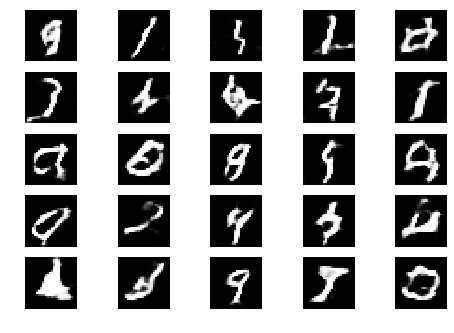

Epoch 1 Batch 101/937 [D loss: 0.777865, acc.: 59.38%] [G loss: 1.293580]


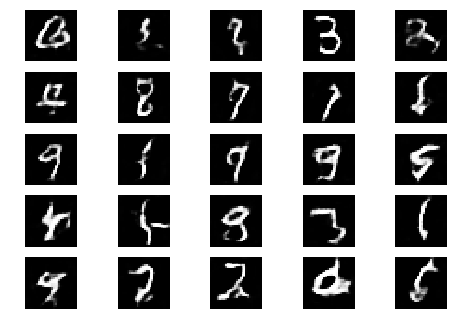

Epoch 1 Batch 102/937 [D loss: 0.562770, acc.: 68.75%] [G loss: 1.288747]


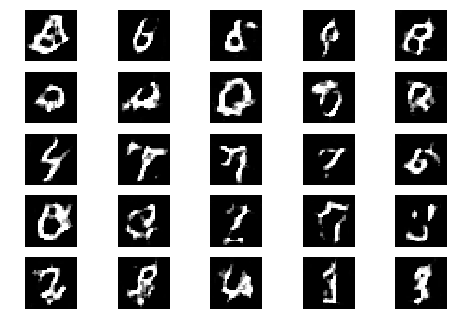

Epoch 1 Batch 103/937 [D loss: 0.886414, acc.: 37.50%] [G loss: 0.864503]
Epoch 1 Batch 104/937 [D loss: 0.915569, acc.: 40.62%] [G loss: 0.929366]
Epoch 1 Batch 105/937 [D loss: 0.598486, acc.: 75.00%] [G loss: 1.771724]
Epoch 1 Batch 106/937 [D loss: 0.608489, acc.: 65.62%] [G loss: 1.660717]
Epoch 1 Batch 107/937 [D loss: 0.654312, acc.: 65.62%] [G loss: 1.381047]
Epoch 1 Batch 108/937 [D loss: 0.689343, acc.: 50.00%] [G loss: 1.338326]
Epoch 1 Batch 109/937 [D loss: 0.723455, acc.: 56.25%] [G loss: 1.184876]
Epoch 1 Batch 110/937 [D loss: 0.651694, acc.: 62.50%] [G loss: 1.270580]
Epoch 1 Batch 111/937 [D loss: 0.479231, acc.: 81.25%] [G loss: 1.463038]
Epoch 1 Batch 112/937 [D loss: 0.698667, acc.: 62.50%] [G loss: 0.940039]
Epoch 1 Batch 113/937 [D loss: 0.818013, acc.: 50.00%] [G loss: 1.099909]
Epoch 1 Batch 114/937 [D loss: 0.722739, acc.: 65.62%] [G loss: 1.171905]
Epoch 1 Batch 115/937 [D loss: 0.453110, acc.: 84.38%] [G loss: 1.453369]
Epoch 1 Batch 116/937 [D loss: 0.61358

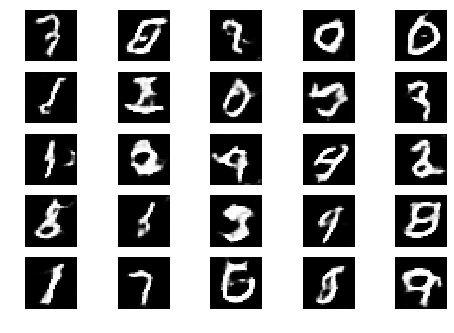

Epoch 1 Batch 201/937 [D loss: 0.822824, acc.: 62.50%] [G loss: 0.991065]
Epoch 1 Batch 202/937 [D loss: 0.701187, acc.: 62.50%] [G loss: 1.180142]


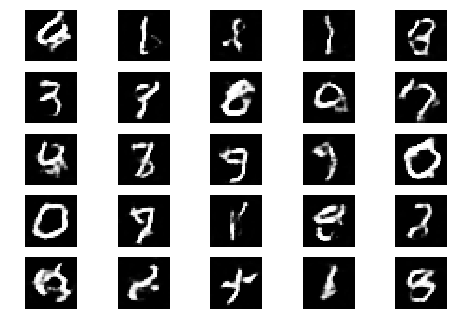

Epoch 1 Batch 203/937 [D loss: 0.467707, acc.: 84.38%] [G loss: 1.800283]
Epoch 1 Batch 204/937 [D loss: 0.760540, acc.: 53.12%] [G loss: 1.373942]


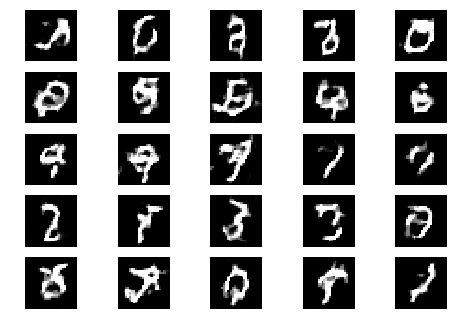

Epoch 1 Batch 205/937 [D loss: 0.723641, acc.: 56.25%] [G loss: 1.657294]
Epoch 1 Batch 206/937 [D loss: 0.434372, acc.: 84.38%] [G loss: 1.299735]
Epoch 1 Batch 207/937 [D loss: 0.632242, acc.: 59.38%] [G loss: 1.723129]
Epoch 1 Batch 208/937 [D loss: 0.784127, acc.: 43.75%] [G loss: 1.197320]
Epoch 1 Batch 209/937 [D loss: 0.586663, acc.: 68.75%] [G loss: 1.168265]
Epoch 1 Batch 210/937 [D loss: 0.934237, acc.: 46.88%] [G loss: 1.085050]
Epoch 1 Batch 211/937 [D loss: 0.487716, acc.: 78.12%] [G loss: 1.070580]
Epoch 1 Batch 212/937 [D loss: 0.680235, acc.: 68.75%] [G loss: 1.683623]
Epoch 1 Batch 213/937 [D loss: 0.649956, acc.: 71.88%] [G loss: 1.486174]
Epoch 1 Batch 214/937 [D loss: 0.493343, acc.: 71.88%] [G loss: 1.518024]
Epoch 1 Batch 215/937 [D loss: 0.628743, acc.: 65.62%] [G loss: 1.185275]
Epoch 1 Batch 216/937 [D loss: 0.641751, acc.: 65.62%] [G loss: 1.251703]
Epoch 1 Batch 217/937 [D loss: 0.682423, acc.: 53.12%] [G loss: 0.975961]
Epoch 1 Batch 218/937 [D loss: 0.38919

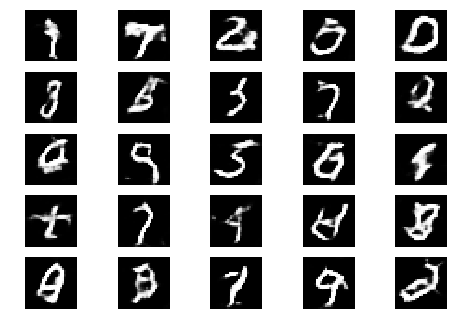

Epoch 1 Batch 301/937 [D loss: 0.432476, acc.: 81.25%] [G loss: 1.259401]
Epoch 1 Batch 302/937 [D loss: 0.448456, acc.: 81.25%] [G loss: 1.041115]
Epoch 1 Batch 303/937 [D loss: 0.489608, acc.: 75.00%] [G loss: 1.285697]


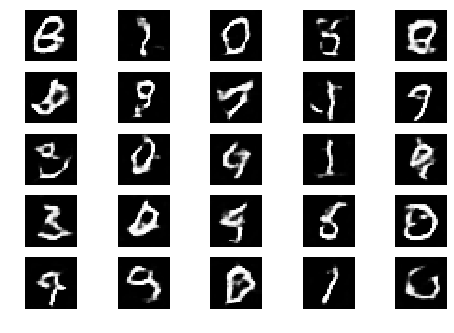

Epoch 1 Batch 304/937 [D loss: 0.741357, acc.: 59.38%] [G loss: 0.965601]
Epoch 1 Batch 305/937 [D loss: 0.720348, acc.: 62.50%] [G loss: 1.245603]
Epoch 1 Batch 306/937 [D loss: 0.555247, acc.: 71.88%] [G loss: 1.367567]


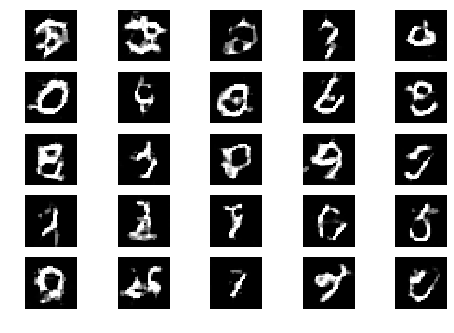

Epoch 1 Batch 307/937 [D loss: 0.515233, acc.: 78.12%] [G loss: 0.969167]
Epoch 1 Batch 308/937 [D loss: 0.566529, acc.: 71.88%] [G loss: 1.119991]
Epoch 1 Batch 309/937 [D loss: 0.701929, acc.: 59.38%] [G loss: 1.198987]
Epoch 1 Batch 310/937 [D loss: 0.768157, acc.: 56.25%] [G loss: 0.827041]
Epoch 1 Batch 311/937 [D loss: 0.629872, acc.: 65.62%] [G loss: 1.263685]
Epoch 1 Batch 312/937 [D loss: 0.626949, acc.: 68.75%] [G loss: 1.365150]
Epoch 1 Batch 313/937 [D loss: 0.782707, acc.: 53.12%] [G loss: 0.936790]
Epoch 1 Batch 314/937 [D loss: 0.843947, acc.: 50.00%] [G loss: 0.913018]
Epoch 1 Batch 315/937 [D loss: 0.648402, acc.: 62.50%] [G loss: 1.203093]
Epoch 1 Batch 316/937 [D loss: 0.607092, acc.: 68.75%] [G loss: 1.111800]
Epoch 1 Batch 317/937 [D loss: 0.822368, acc.: 43.75%] [G loss: 1.113635]
Epoch 1 Batch 318/937 [D loss: 0.616880, acc.: 65.62%] [G loss: 0.751427]
Epoch 1 Batch 319/937 [D loss: 0.596706, acc.: 68.75%] [G loss: 1.064604]
Epoch 1 Batch 320/937 [D loss: 0.58993

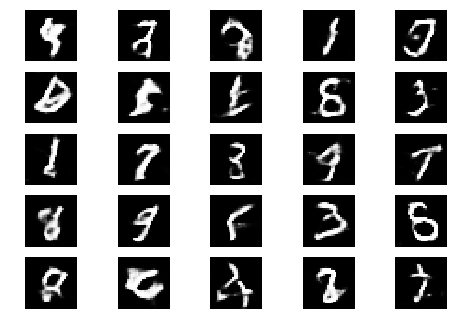

Epoch 1 Batch 401/937 [D loss: 0.732461, acc.: 56.25%] [G loss: 0.868147]
Epoch 1 Batch 402/937 [D loss: 0.586593, acc.: 75.00%] [G loss: 1.348872]
Epoch 1 Batch 403/937 [D loss: 0.717785, acc.: 53.12%] [G loss: 1.110377]
Epoch 1 Batch 404/937 [D loss: 0.643917, acc.: 56.25%] [G loss: 1.288249]


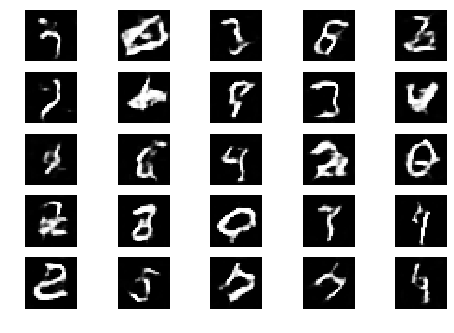

Epoch 1 Batch 405/937 [D loss: 0.827368, acc.: 59.38%] [G loss: 1.175715]
Epoch 1 Batch 406/937 [D loss: 0.636870, acc.: 53.12%] [G loss: 1.144275]
Epoch 1 Batch 407/937 [D loss: 0.509870, acc.: 81.25%] [G loss: 0.956474]
Epoch 1 Batch 408/937 [D loss: 0.740164, acc.: 56.25%] [G loss: 1.342650]


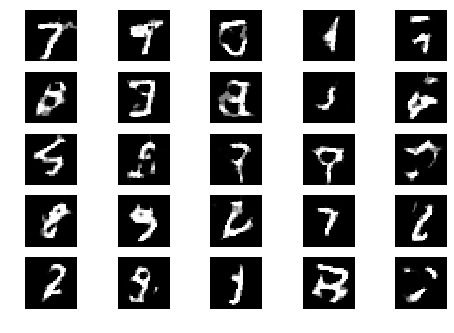

Epoch 1 Batch 409/937 [D loss: 0.546625, acc.: 65.62%] [G loss: 1.208410]
Epoch 1 Batch 410/937 [D loss: 0.771356, acc.: 53.12%] [G loss: 1.374292]
Epoch 1 Batch 411/937 [D loss: 0.656233, acc.: 50.00%] [G loss: 1.153283]
Epoch 1 Batch 412/937 [D loss: 0.736022, acc.: 43.75%] [G loss: 1.426378]
Epoch 1 Batch 413/937 [D loss: 0.808945, acc.: 46.88%] [G loss: 1.175965]
Epoch 1 Batch 414/937 [D loss: 0.591926, acc.: 65.62%] [G loss: 1.045429]
Epoch 1 Batch 415/937 [D loss: 0.554880, acc.: 68.75%] [G loss: 1.134494]
Epoch 1 Batch 416/937 [D loss: 0.555213, acc.: 65.62%] [G loss: 0.794724]
Epoch 1 Batch 417/937 [D loss: 1.008626, acc.: 40.62%] [G loss: 0.936761]
Epoch 1 Batch 418/937 [D loss: 0.620036, acc.: 65.62%] [G loss: 1.336439]
Epoch 1 Batch 419/937 [D loss: 0.702538, acc.: 62.50%] [G loss: 1.135213]
Epoch 1 Batch 420/937 [D loss: 0.739594, acc.: 62.50%] [G loss: 1.279278]
Epoch 1 Batch 421/937 [D loss: 0.825339, acc.: 50.00%] [G loss: 1.161328]
Epoch 1 Batch 422/937 [D loss: 0.50427

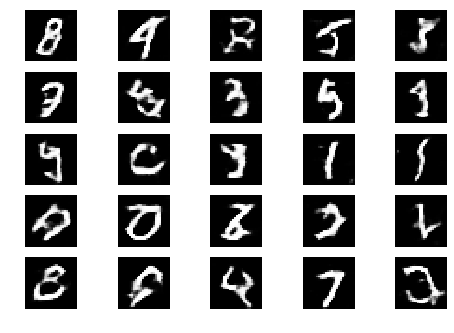

Epoch 1 Batch 501/937 [D loss: 0.702038, acc.: 50.00%] [G loss: 1.161824]
Epoch 1 Batch 502/937 [D loss: 0.461589, acc.: 81.25%] [G loss: 1.423176]
Epoch 1 Batch 503/937 [D loss: 0.794653, acc.: 50.00%] [G loss: 1.180976]
Epoch 1 Batch 504/937 [D loss: 0.642724, acc.: 56.25%] [G loss: 1.517444]
Epoch 1 Batch 505/937 [D loss: 0.810190, acc.: 50.00%] [G loss: 1.259491]


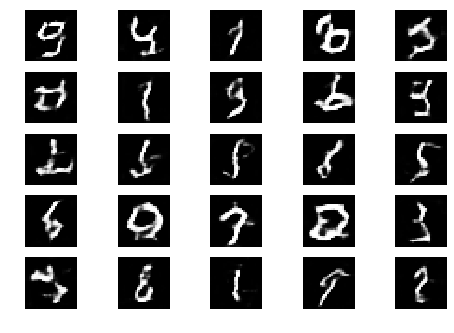

Epoch 1 Batch 506/937 [D loss: 0.592912, acc.: 65.62%] [G loss: 1.296746]
Epoch 1 Batch 507/937 [D loss: 0.816308, acc.: 53.12%] [G loss: 1.225332]
Epoch 1 Batch 508/937 [D loss: 0.764500, acc.: 59.38%] [G loss: 1.290968]
Epoch 1 Batch 509/937 [D loss: 0.863522, acc.: 40.62%] [G loss: 1.110228]
Epoch 1 Batch 510/937 [D loss: 0.803191, acc.: 50.00%] [G loss: 1.070531]


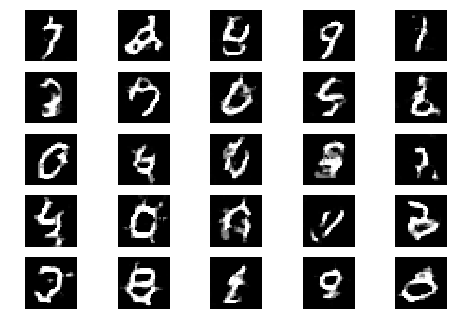

Epoch 1 Batch 511/937 [D loss: 0.620575, acc.: 65.62%] [G loss: 1.430198]
Epoch 1 Batch 512/937 [D loss: 0.873284, acc.: 43.75%] [G loss: 1.422773]
Epoch 1 Batch 513/937 [D loss: 0.743894, acc.: 59.38%] [G loss: 1.288955]
Epoch 1 Batch 514/937 [D loss: 0.536977, acc.: 75.00%] [G loss: 1.514865]
Epoch 1 Batch 515/937 [D loss: 0.675429, acc.: 59.38%] [G loss: 1.185147]
Epoch 1 Batch 516/937 [D loss: 0.729766, acc.: 53.12%] [G loss: 1.022286]
Epoch 1 Batch 517/937 [D loss: 0.689551, acc.: 62.50%] [G loss: 0.975451]
Epoch 1 Batch 518/937 [D loss: 0.650822, acc.: 59.38%] [G loss: 1.282517]
Epoch 1 Batch 519/937 [D loss: 0.718945, acc.: 62.50%] [G loss: 1.220879]
Epoch 1 Batch 520/937 [D loss: 0.723572, acc.: 59.38%] [G loss: 0.978228]
Epoch 1 Batch 521/937 [D loss: 0.579391, acc.: 78.12%] [G loss: 1.322371]
Epoch 1 Batch 522/937 [D loss: 0.766981, acc.: 50.00%] [G loss: 1.401797]
Epoch 1 Batch 523/937 [D loss: 0.701419, acc.: 53.12%] [G loss: 1.075383]
Epoch 1 Batch 524/937 [D loss: 0.72955

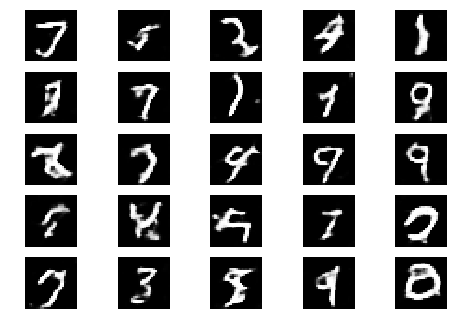

Epoch 1 Batch 601/937 [D loss: 0.867596, acc.: 40.62%] [G loss: 1.165439]
Epoch 1 Batch 602/937 [D loss: 0.561041, acc.: 62.50%] [G loss: 1.558576]
Epoch 1 Batch 603/937 [D loss: 0.672622, acc.: 59.38%] [G loss: 1.154965]
Epoch 1 Batch 604/937 [D loss: 0.835024, acc.: 53.12%] [G loss: 1.112650]
Epoch 1 Batch 605/937 [D loss: 0.568113, acc.: 78.12%] [G loss: 0.907790]
Epoch 1 Batch 606/937 [D loss: 0.712125, acc.: 53.12%] [G loss: 1.306034]


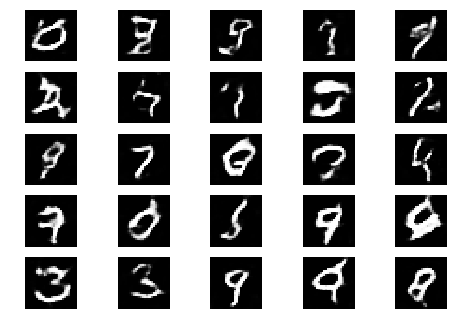

Epoch 1 Batch 607/937 [D loss: 0.651905, acc.: 68.75%] [G loss: 1.214706]
Epoch 1 Batch 608/937 [D loss: 0.811551, acc.: 59.38%] [G loss: 1.151845]
Epoch 1 Batch 609/937 [D loss: 0.478675, acc.: 84.38%] [G loss: 1.458887]
Epoch 1 Batch 610/937 [D loss: 0.677175, acc.: 65.62%] [G loss: 1.090880]
Epoch 1 Batch 611/937 [D loss: 0.597850, acc.: 81.25%] [G loss: 0.989619]
Epoch 1 Batch 612/937 [D loss: 0.389512, acc.: 93.75%] [G loss: 1.220349]


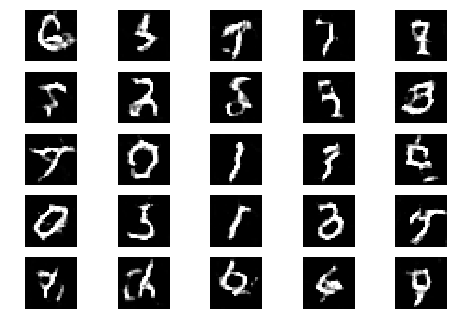

Epoch 1 Batch 613/937 [D loss: 0.625135, acc.: 65.62%] [G loss: 0.832016]
Epoch 1 Batch 614/937 [D loss: 0.828914, acc.: 43.75%] [G loss: 0.936855]
Epoch 1 Batch 615/937 [D loss: 0.565871, acc.: 81.25%] [G loss: 1.151609]
Epoch 1 Batch 616/937 [D loss: 0.754556, acc.: 59.38%] [G loss: 1.302996]
Epoch 1 Batch 617/937 [D loss: 0.557589, acc.: 71.88%] [G loss: 1.199867]
Epoch 1 Batch 618/937 [D loss: 0.668325, acc.: 68.75%] [G loss: 0.928871]
Epoch 1 Batch 619/937 [D loss: 0.437717, acc.: 78.12%] [G loss: 0.911252]
Epoch 1 Batch 620/937 [D loss: 0.631489, acc.: 62.50%] [G loss: 1.132256]
Epoch 1 Batch 621/937 [D loss: 0.951224, acc.: 40.62%] [G loss: 1.108232]
Epoch 1 Batch 622/937 [D loss: 0.633349, acc.: 59.38%] [G loss: 1.366538]
Epoch 1 Batch 623/937 [D loss: 0.743437, acc.: 46.88%] [G loss: 1.144405]
Epoch 1 Batch 624/937 [D loss: 0.680279, acc.: 62.50%] [G loss: 0.881231]
Epoch 1 Batch 625/937 [D loss: 0.656743, acc.: 62.50%] [G loss: 0.952091]
Epoch 1 Batch 626/937 [D loss: 1.04069

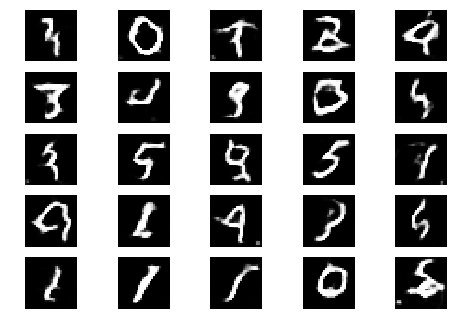

Epoch 1 Batch 701/937 [D loss: 0.777859, acc.: 50.00%] [G loss: 1.300326]
Epoch 1 Batch 702/937 [D loss: 0.620908, acc.: 68.75%] [G loss: 1.414918]
Epoch 1 Batch 703/937 [D loss: 0.886254, acc.: 43.75%] [G loss: 1.494623]
Epoch 1 Batch 704/937 [D loss: 0.599851, acc.: 65.62%] [G loss: 1.304669]
Epoch 1 Batch 705/937 [D loss: 0.575842, acc.: 65.62%] [G loss: 1.207716]
Epoch 1 Batch 706/937 [D loss: 0.863616, acc.: 40.62%] [G loss: 1.019452]
Epoch 1 Batch 707/937 [D loss: 0.763202, acc.: 56.25%] [G loss: 1.030529]


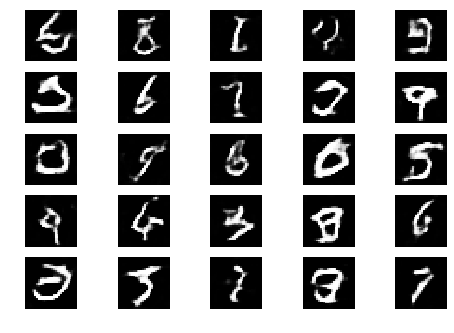

Epoch 1 Batch 708/937 [D loss: 0.687368, acc.: 59.38%] [G loss: 1.330193]
Epoch 1 Batch 709/937 [D loss: 0.552498, acc.: 71.88%] [G loss: 1.414200]
Epoch 1 Batch 710/937 [D loss: 0.743059, acc.: 56.25%] [G loss: 1.196687]
Epoch 1 Batch 711/937 [D loss: 0.715270, acc.: 56.25%] [G loss: 1.242686]
Epoch 1 Batch 712/937 [D loss: 0.595252, acc.: 71.88%] [G loss: 1.016821]
Epoch 1 Batch 713/937 [D loss: 0.596912, acc.: 68.75%] [G loss: 1.168751]
Epoch 1 Batch 714/937 [D loss: 0.915597, acc.: 46.88%] [G loss: 0.968811]


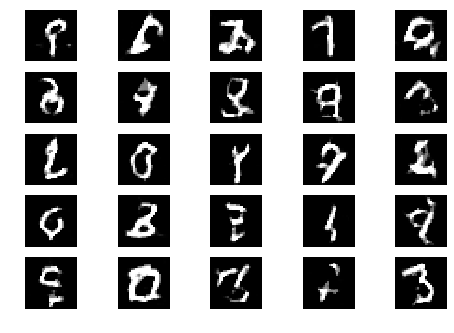

Epoch 1 Batch 715/937 [D loss: 0.677006, acc.: 53.12%] [G loss: 1.152231]
Epoch 1 Batch 716/937 [D loss: 0.639389, acc.: 56.25%] [G loss: 1.183322]
Epoch 1 Batch 717/937 [D loss: 0.835510, acc.: 53.12%] [G loss: 1.034550]
Epoch 1 Batch 718/937 [D loss: 0.431381, acc.: 87.50%] [G loss: 1.035030]
Epoch 1 Batch 719/937 [D loss: 0.553568, acc.: 75.00%] [G loss: 1.161098]
Epoch 1 Batch 720/937 [D loss: 0.746015, acc.: 53.12%] [G loss: 1.206151]
Epoch 1 Batch 721/937 [D loss: 0.539179, acc.: 81.25%] [G loss: 0.838444]
Epoch 1 Batch 722/937 [D loss: 0.594051, acc.: 68.75%] [G loss: 1.080920]
Epoch 1 Batch 723/937 [D loss: 0.610847, acc.: 65.62%] [G loss: 1.265361]
Epoch 1 Batch 724/937 [D loss: 0.640539, acc.: 53.12%] [G loss: 1.347105]
Epoch 1 Batch 725/937 [D loss: 0.801029, acc.: 53.12%] [G loss: 1.294251]
Epoch 1 Batch 726/937 [D loss: 0.430821, acc.: 84.38%] [G loss: 1.228709]
Epoch 1 Batch 727/937 [D loss: 0.475318, acc.: 71.88%] [G loss: 0.946710]
Epoch 1 Batch 728/937 [D loss: 0.80546

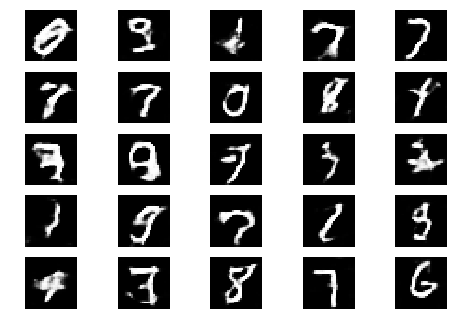

Epoch 1 Batch 801/937 [D loss: 0.854994, acc.: 40.62%] [G loss: 1.317468]
Epoch 1 Batch 802/937 [D loss: 0.483242, acc.: 84.38%] [G loss: 1.287769]
Epoch 1 Batch 803/937 [D loss: 0.616783, acc.: 62.50%] [G loss: 1.548183]
Epoch 1 Batch 804/937 [D loss: 0.576057, acc.: 68.75%] [G loss: 1.561984]
Epoch 1 Batch 805/937 [D loss: 0.635901, acc.: 65.62%] [G loss: 1.223906]
Epoch 1 Batch 806/937 [D loss: 0.512189, acc.: 78.12%] [G loss: 1.074780]
Epoch 1 Batch 807/937 [D loss: 0.732192, acc.: 59.38%] [G loss: 1.185398]
Epoch 1 Batch 808/937 [D loss: 0.578895, acc.: 71.88%] [G loss: 0.936188]


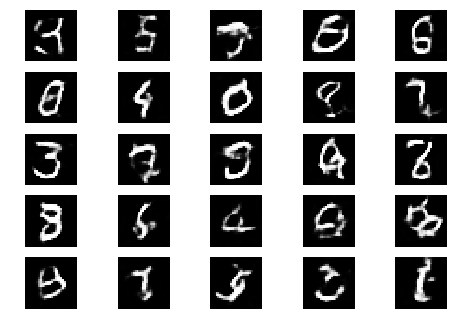

Epoch 1 Batch 809/937 [D loss: 0.824596, acc.: 40.62%] [G loss: 1.261604]
Epoch 1 Batch 810/937 [D loss: 0.574511, acc.: 71.88%] [G loss: 1.371646]
Epoch 1 Batch 811/937 [D loss: 0.911658, acc.: 40.62%] [G loss: 1.180669]
Epoch 1 Batch 812/937 [D loss: 0.777952, acc.: 43.75%] [G loss: 1.065827]
Epoch 1 Batch 813/937 [D loss: 0.726008, acc.: 56.25%] [G loss: 1.216017]
Epoch 1 Batch 814/937 [D loss: 0.970455, acc.: 28.12%] [G loss: 1.003343]
Epoch 1 Batch 815/937 [D loss: 0.682336, acc.: 65.62%] [G loss: 0.766294]
Epoch 1 Batch 816/937 [D loss: 0.663949, acc.: 59.38%] [G loss: 1.095352]


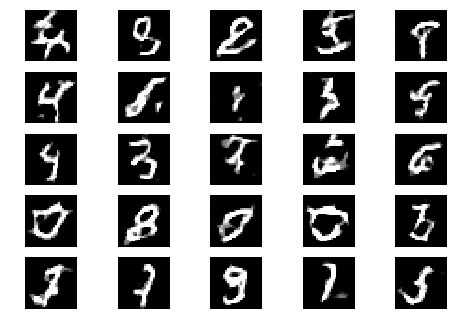

Epoch 1 Batch 817/937 [D loss: 0.604355, acc.: 59.38%] [G loss: 1.315569]
Epoch 1 Batch 818/937 [D loss: 0.713196, acc.: 40.62%] [G loss: 0.970198]
Epoch 1 Batch 819/937 [D loss: 0.737318, acc.: 62.50%] [G loss: 1.256648]
Epoch 1 Batch 820/937 [D loss: 0.501055, acc.: 75.00%] [G loss: 1.069072]
Epoch 1 Batch 821/937 [D loss: 0.662395, acc.: 65.62%] [G loss: 0.950738]
Epoch 1 Batch 822/937 [D loss: 0.759967, acc.: 53.12%] [G loss: 0.928347]
Epoch 1 Batch 823/937 [D loss: 0.659858, acc.: 62.50%] [G loss: 1.087825]
Epoch 1 Batch 824/937 [D loss: 0.668124, acc.: 65.62%] [G loss: 0.771730]
Epoch 1 Batch 825/937 [D loss: 0.623076, acc.: 75.00%] [G loss: 0.844750]
Epoch 1 Batch 826/937 [D loss: 0.574467, acc.: 71.88%] [G loss: 1.468610]
Epoch 1 Batch 827/937 [D loss: 0.585850, acc.: 65.62%] [G loss: 1.055211]
Epoch 1 Batch 828/937 [D loss: 0.624734, acc.: 59.38%] [G loss: 1.139637]
Epoch 1 Batch 829/937 [D loss: 0.619980, acc.: 65.62%] [G loss: 1.281618]
Epoch 1 Batch 830/937 [D loss: 0.60584

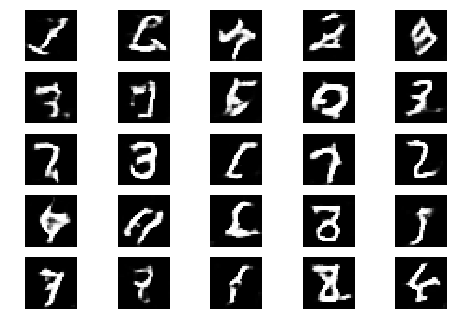

Epoch 1 Batch 901/937 [D loss: 0.706921, acc.: 53.12%] [G loss: 1.157211]
Epoch 1 Batch 902/937 [D loss: 0.579161, acc.: 65.62%] [G loss: 1.222916]
Epoch 1 Batch 903/937 [D loss: 0.575763, acc.: 68.75%] [G loss: 1.114634]
Epoch 1 Batch 904/937 [D loss: 0.742517, acc.: 59.38%] [G loss: 1.347330]
Epoch 1 Batch 905/937 [D loss: 0.590246, acc.: 68.75%] [G loss: 1.268252]
Epoch 1 Batch 906/937 [D loss: 0.549323, acc.: 62.50%] [G loss: 1.047050]
Epoch 1 Batch 907/937 [D loss: 0.542709, acc.: 71.88%] [G loss: 1.177667]
Epoch 1 Batch 908/937 [D loss: 0.737099, acc.: 62.50%] [G loss: 1.013615]
Epoch 1 Batch 909/937 [D loss: 0.567160, acc.: 71.88%] [G loss: 1.088802]


In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=3)

In [0]:
generator1 = generator1.load_weights('generatorTrainedepoch2.h5')

In [0]:
generator2 = generator2.load_weights('generatorTrainedepoch2.h5')

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1)

In [0]:
generator1.save('generatorTrained1epoch4.h5')

In [0]:
files.download('generatorTrainedepoch2.h5')

In [0]:
##files.download('discriminator1.h5')

In [0]:
##files.download('combined1.h5')

In [0]:
#generator1 = load_model('generator1.h5')
#discriminator1 = load_model('discriminator1.h5')
#combined1 = load_model('combined1.h5')

